In [1]:
from scipy.io import loadmat
import cv2
from pprint import pprint
import matplotlib.pyplot as plt

In [2]:
object_1469 = loadmat('/home/jetze/Downloads/VIS_Onshore/ObjectGT/MVI_1469_VIS_ObjectGT.mat')

In [3]:
object_1469['__globals__']

['structXML']

In [4]:
object_1469_structXML = object_1469['structXML']
object_1469_structXML.shape[1]

600

In [5]:
i = 0
pprint(object_1469_structXML[0,i]['MotionType'])
pprint(object_1469_structXML[0,i]['Motion'])

array([[array(['Stationary'], dtype='<U10')],
       [array(['Stationary'], dtype='<U10')],
       [array(['Moving    '], dtype='<U10')],
       [array(['Stationary'], dtype='<U10')],
       [array(['Stationary'], dtype='<U10')],
       [array(['Stationary'], dtype='<U10')],
       [array(['Stationary'], dtype='<U10')],
       [array(['Stationary'], dtype='<U10')],
       [array(['Stationary'], dtype='<U10')]], dtype=object)
array([[1],
       [1],
       [2],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1]], dtype=uint8)


In [6]:
pprint(object_1469_structXML[0,i]['Object'])
pprint(object_1469_structXML[0,i]['ObjectType'])

array([[3],
       [3],
       [4],
       [2],
       [3],
       [3],
       [3],
       [3],
       [3]], dtype=uint8)
array([[array(['Vessel/ship'], dtype='<U11')],
       [array(['Vessel/ship'], dtype='<U11')],
       [array(['Speed boat'], dtype='<U10')],
       [array(['Buoy'], dtype='<U4')],
       [array(['Vessel/ship'], dtype='<U11')],
       [array(['Vessel/ship'], dtype='<U11')],
       [array(['Vessel/ship'], dtype='<U11')],
       [array(['Vessel/ship'], dtype='<U11')],
       [array(['Vessel/ship'], dtype='<U11')]], dtype=object)


In [7]:
pprint(object_1469_structXML[0,i]['Distance'])
pprint(object_1469_structXML[0,i]['DistanceType'])

array([[2],
       [2],
       [2],
       [1],
       [2],
       [2],
       [2],
       [2],
       [2]], dtype=uint8)
array([[array(['Far    '], dtype='<U7')],
       [array(['Far    '], dtype='<U7')],
       [array(['Far    '], dtype='<U7')],
       [array(['Near'], dtype='<U4')],
       [array(['Far    '], dtype='<U7')],
       [array(['Far    '], dtype='<U7')],
       [array(['Far    '], dtype='<U7')],
       [array(['Far    '], dtype='<U7')],
       [array(['Far    '], dtype='<U7')]], dtype=object)


In [8]:
pprint(object_1469_structXML[0,i]['BB'])

array([[1134.10404985,  433.12356862,  391.11912229,  187.60523456],
       [ 389.89481268,  442.28674352,  336.82735463,  120.34582133],
       [ 366.0335773 ,  534.96685879,   41.84219994,   46.51187807],
       [ 224.59309121,  580.61701815,  100.28731225,  150.77286487],
       [  80.73141974,  437.44611714,  194.69609806,   89.22102983],
       [1604.93913058,  527.18696919,   88.70120761,   91.64047083],
       [ -19.55763689,  508.33905281,  149.73845354,   34.40769558],
       [1694.15841604,  583.03820352,  212.33342176,   43.74356309],
       [ 325.22753306,  497.445463  ,   68.81539116,   34.40769558]])


In [301]:
cap = cv2.VideoCapture('/home/jetze/Downloads/VIS_Onshore/Videos/MVI_1484_VIS.avi')

In [642]:
ret, frame = cap.read()

In [658]:
frame.shape

(1080, 1920, 3)

(4, 4)
(4, 4)
(4, 4)


KeyboardInterrupt: 

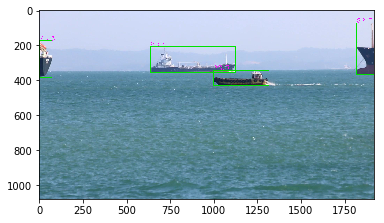

In [657]:
SRC = '/home/jetze/Downloads/VIS_Onshore/'
src_vid = os.path.join(SRC, 'Videos')
src_lbl = os.path.join(SRC, 'ObjectGT')

fns = ['1484']

pose = 23.456

for fn in fns:
    # get video fn
    # videocap
    cap = cv2.VideoCapture(f'/home/jetze/Downloads/VIS_Onshore/Videos/MVI_{fn}_VIS.avi')
    
    
    # label fn
    # get list bboxs
    lbls = loadmat(f'/home/jetze/Downloads/VIS_Onshore/ObjectGT/MVI_{fn}_VIS_ObjectGT.mat')['structXML']
    for i in range(lbls.shape[1]):
        ret, frame = cap.read()
#         img = frame.copy()
        inf = frame.copy()
        if ret:
            bboxs = lbls[0,i]['BB']
            for bb in bboxs:
                # do inference
                x_min = int(bb[0])
                x_max = int(bb[0]+bb[2])
                y_min = int(bb[1])
                y_max = int(bb[1]+bb[3])
                img = frame[y_min:y_max,x_min:x_max]
                
                
                
                inf = cv2.rectangle(inf, (x_min,y_min), (x_max, y_max), (0,225,0), 3 )
                inf = cv2.putText(inf, str(round(pose,1)), (x_min,y_min),5, color = (255, 0, 255), fontScale=2)

        else:
            print(f'error reading frame nr {i} from {fn}.')
        if i%100 == 0:
            img_name = f'MVI_{fn}_VIS_'
            cv2.imwrite()
            print(bboxs.shape)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            

In [652]:
bb[0]

1810.355285053503

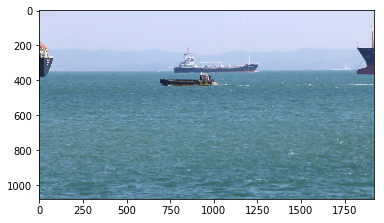

In [643]:
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

In [649]:
frame

array([[[245, 217, 209],
        [245, 217, 209],
        [245, 217, 209],
        ...,
        [243, 220, 214],
        [243, 220, 214],
        [243, 220, 214]],

       [[245, 217, 209],
        [245, 217, 209],
        [245, 217, 209],
        ...,
        [243, 220, 214],
        [243, 220, 214],
        [243, 220, 214]],

       [[245, 217, 209],
        [245, 217, 209],
        [245, 217, 209],
        ...,
        [243, 220, 214],
        [243, 220, 214],
        [243, 220, 214]],

       ...,

       [[139, 120,  73],
        [139, 120,  73],
        [138, 119,  72],
        ...,
        [161, 140,  94],
        [161, 140,  94],
        [161, 140,  94]],

       [[144, 123,  77],
        [144, 123,  77],
        [144, 123,  77],
        ...,
        [160, 139,  93],
        [160, 139,  93],
        [160, 139,  93]],

       [[147, 126,  80],
        [147, 126,  80],
        [147, 126,  80],
        ...,
        [159, 138,  92],
        [159, 138,  92],
        [159, 138,  92]]

KeyboardInterrupt: 

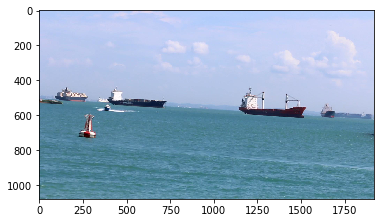

In [264]:
cap = cv2.VideoCapture('/home/jetze/Downloads/VIS_Onshore/Videos/MVI_1469_VIS.avi')
while(cap.isOpened()):
    if ret:
        ret, frame = cap.read()
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    
#     plt.plot()
#     time.sleep(1)

In [51]:
import os
import glob

In [26]:
DST = os.path.join('/media','jetze','Elements','SingaporeMaritimeDataset')
dst_img = os.path.join(SRC, 'training', 'image_2')
dst_lbl = os.path.join(SRC, 'training', 'label_2')
dst_lbl_type = os.path.join(SRC, 'training', 'label_2_type')
dst_lbl_yolo = os.path.join(SRC, 'training', 'label_yolo')
dst_lbl_yolo_type = os.path.join(SRC, 'training', 'label_yolo_type')

In [27]:
paths = [src_img, src_lbl, src_lbl_yolo]
for path in paths:
    if not os.path.exists(path):
        os.makedirs(path)

In [34]:
SRC = '/home/jetze/Downloads/VIS_Onshore/'
src_vid = os.path.join(SRC, 'Videos')
src_lbl = os.path.join(SRC, 'ObjectGT')

for lbl_fn in glob.glob(src_lbl+'/*.mat'):
    lbl_id = lbl_fn.split('/')[-1]
    vid_fn = os.path.join(src_vid, lbl_id.replace('_ObjectGT.mat', '.avi'))
    
    obj = loadmat(lbl_fn)
    obj_structXML = obj['structXML']
    
    cap = cv2.VideoCapture(vid_fn)
    
    for i in range(obj_structXML.shape[1]):
        ret, frame = cap.read()
        if ret is None:
            print(f'error parsing frame {i} of {vid_id}')
            continue
        
        # write image
        img_fn = os.path.join(dst_img, lbl_id.replace('_ObjectGT.mat', f'_{i}.jpg')) 
        cv2.imwrite(img_fn, frame)
        
        # write label
        bbs = obj_structXML[0,i]['BB']
        shiptypes = obj_strucXML[0,i]['ObjectType']
        
        lbl_fn = = os.path.join(dst_lbl, lbl_id.replace('_ObjectGT.mat', f'_{i}.txt')) 
        
        f.write(f'boat 0 0 0 {left} {top} {right} {bottom} 0 0 0 0 0 0 0 \n')
        
        # write label_yolo
        
        
        
        print(bbs)

[[  91.03525913  693.02336449   52.20050977   22.83772302]
 [ 161.17969414  670.18564146  215.3271028    42.41291419]
 [ 570.62744265  645.71665251  267.52761257   53.8317757 ]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1719.30504971  660.39804588  199.0144435    47.30671198]
 [ 601.20082208  591.12787067  312.41313918  234.34585332]]
[[  91.03525913  693.02336449   52.20050977   22.83772302]
 [ 161.17969414  670.18564146  215.3271028    42.41291419]
 [ 570.62744265  645.71665251  267.52761257   53.8317757 ]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1719.30504971  660.39804588  199.0144435    47.30671198]
 [ 601.20082208  591.12787067  312.41313918  234.34585332]]
[[  84.9822957   694.23395717   52.20050977   22.83772

[[  70.45518347  690.60217911   52.20050977   22.83772302]
 [ 157.54791608  670.18564146  218.95888086   42.41291419]
 [ 570.62744265  645.71665251  267.52761257   53.8317757 ]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1715.67327165  660.39804588  199.0144435    47.30671198]
 [ 541.88178047  586.28549993  354.78388319  246.45178018]]
[[  70.45518347  690.60217911   52.20050977   22.83772302]
 [ 157.54791608  670.18564146  218.95888086   42.41291419]
 [ 570.62744265  645.71665251  267.52761257   53.8317757 ]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1715.67327165  660.39804588  199.0144435    47.30671198]
 [ 541.88178047  586.28549993  354.78388319  246.45178018]]
[[  70.45518347  690.60217911   52.20050977   22.83772

[[  57.13866393  689.39158643   52.20050977   22.83772302]
 [ 152.70554534  670.18564146  218.95888086   42.41291419]
 [ 662.63248679  663.8755428   175.52256844   28.40932929]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1710.83090091  659.18745319  199.0144435    47.30671198]
 [ 459.56147782  582.65372187  417.73470286  246.45178018]]
[[  57.13866393  689.39158643   52.20050977   22.83772302]
 [ 152.70554534  670.18564146  218.95888086   42.41291419]
 [ 662.63248679  663.8755428   175.52256844   28.40932929]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1710.83090091  659.18745319  199.0144435    47.30671198]
 [ 459.56147782  582.65372187  417.73470286  246.45178018]]
[[  54.71747855  689.39158643   52.20050977   22.83772

[[  47.45392244  690.60217911   52.20050977   22.83772302]
 [ 146.65258191  670.18564146  225.01184429   42.41291419]
 [ 605.73463054  655.40139399  232.42042468   36.8834781 ]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1710.83090091  659.18745319  199.0144435    47.30671198]
 [ 386.92591666  580.2325365   462.52663225  256.13652167]]
[[  43.82214438  690.60217911   53.41110246   22.83772302]
 [ 146.65258191  670.18564146  225.01184429   42.41291419]
 [ 599.68166711  655.40139399  238.47338811   36.8834781 ]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1710.83090091  659.18745319  199.0144435    47.30671198]
 [ 374.8199898   580.2325365   471.00078105  256.13652167]]
[[  43.82214438  690.60217911   53.41110246   22.83772

[[  31.71621752  690.60217911   53.41110246   22.83772302]
 [ 146.65258191  670.18564146  225.01184429   42.41291419]
 [ 565.78507191  654.19080131  268.73820526   35.67288541]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1710.83090091  659.18745319  199.0144435    47.30671198]
 [ 276.76198223  579.02194381  523.05626655  265.82126316]]
[[  31.71621752  690.60217911   53.41110246   22.83772302]
 [ 146.65258191  670.18564146  225.01184429   42.41291419]
 [ 565.78507191  654.19080131  268.73820526   35.67288541]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1710.83090091  659.18745319  199.0144435    47.30671198]
 [ 276.76198223  579.02194381  523.05626655  265.82126316]]
[[  30.50562483  691.8127718    53.41110246   22.83772

[[  20.82088335  690.60217911   53.41110246   22.83772302]
 [ 146.65258191  670.18564146  164.48220999   38.78113613]
 [ 565.78507191  654.19080131  268.73820526   38.09407078]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1710.83090091  659.18745319  199.0144435    47.30671198]
 [ 183.54634541  571.7583877   573.90115936  277.92719002]]
[[  17.18910529  689.39158643   53.41110246   22.83772302]
 [ 146.65258191  670.18564146  149.95509776   38.78113613]
 [ 565.78507191  654.19080131  268.73820526   38.09407078]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1710.83090091  659.18745319  199.0144435    47.30671198]
 [ 173.86160392  570.54779501  575.11175204  277.92719002]]
[[  17.18910529  689.39158643   53.41110246   22.83772

[[   8.71495649  693.02336449   53.41110246   22.83772302]
 [ 146.65258191  670.18564146   51.89709019   38.78113613]
 [ 565.78507191  654.19080131  268.73820526   38.09407078]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1710.83090091  659.18745319  199.0144435    47.30671198]
 [  70.96122561  583.86431456  613.850718    273.08481927]]
[[   8.71495649  693.02336449   53.41110246   22.83772302]
 [ 146.65258191  670.18564146   51.89709019   38.78113613]
 [ 565.78507191  654.19080131  268.73820526   38.09407078]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1710.83090091  659.18745319  199.0144435    47.30671198]
 [  70.96122561  583.86431456  613.850718    273.08481927]]
[[   2.66199306  693.02336449   53.41110246   22.83772

[[  -2.90035635  691.8127718    52.20050977   22.83772302]
 [ 564.57447922  645.71665251  273.580576     53.8317757 ]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1705.98853016  660.39804588  199.0144435    47.30671198]
 [   2.61982288  585.67763223  607.82655371  272.79065656]]
[[  -2.90035635  691.8127718    52.20050977   22.83772302]
 [ 564.57447922  645.71665251  273.580576     53.8317757 ]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1705.98853016  660.39804588  199.0144435    47.30671198]
 [   2.61982288  585.67763223  604.19477565  272.79065656]]
[[  -2.90035635  691.8127718    52.20050977   22.83772302]
 [ 564.57447922  645.71665251  273.580576     53.8317757 ]
 [1105.6826678   650.6104503   133.76380629   53.83177

[[ 169.00380507  665.17973271  192.62926135   30.10127914]
 [ 564.57447922  645.71665251  273.580576     53.8317757 ]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1705.98853016  660.39804588  199.0144435    47.30671198]
 [  -3.43314055  585.67763223  535.19099255  272.79065656]]
[[ 164.16143432  665.17973271  197.47163209   30.10127914]
 [ 564.57447922  645.71665251  273.580576     53.8317757 ]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1705.98853016  660.39804588  199.0144435    47.30671198]
 [  -3.43314055  585.67763223  525.50625106  272.79065656]]
[[ 164.16143432  665.17973271  197.47163209   30.10127914]
 [ 564.57447922  645.71665251  273.580576     53.8317757 ]
 [1105.6826678   650.6104503   133.76380629   53.83177

[[ 158.10847089  665.17973271  203.52459552   30.10127914]
 [ 564.57447922  645.71665251  273.580576     53.8317757 ]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1705.98853016  660.39804588  199.0144435    47.30671198]
 [  -3.43314055  607.46830058  443.18594842  250.99998821]]
[[ 158.10847089  665.17973271  203.52459552   30.10127914]
 [ 564.57447922  645.71665251  273.580576     53.8317757 ]
 [1105.6826678   650.6104503   133.76380629   53.8317757 ]
 [1244.34027188  662.02931181   45.67544605   40.78164826]
 [1294.90951572  639.19158879  342.56584537   65.25063721]
 [1705.98853016  660.39804588  199.0144435    47.30671198]
 [  -3.43314055  607.46830058  443.18594842  250.99998821]]
[[ 158.10847089  665.17973271  203.52459552   30.10127914]
 [ 564.57447922  645.71665251  273.580576     53.8317757 ]
 [1105.6826678   650.6104503   133.76380629   53.83177

[[ 1.62810960e+02  6.63660578e+02  2.08802039e+02  3.42565845e+01]
 [ 5.60839847e+02  6.50610450e+02  2.74052676e+02  4.89379779e+01]
 [ 1.13830799e+03  6.39191589e+02  9.29821580e+01  6.19881054e+01]
 [ 1.23292141e+03  6.60398046e+02  4.07816483e+01  3.91503823e+01]
 [ 1.27696559e+03  6.35929057e+02  3.67034834e+02  6.19881054e+01]
 [ 1.71577613e+03  6.58766780e+02  1.84333050e+02  4.40441801e+01]
 [-3.15632965e-01  6.90242190e+02  3.38443453e+02  1.71016531e+02]]
[[ 1.62810960e+02  6.63660578e+02  2.08802039e+02  3.42565845e+01]
 [ 5.60839847e+02  6.50610450e+02  2.74052676e+02  4.89379779e+01]
 [ 1.13830799e+03  6.39191589e+02  9.29821580e+01  6.19881054e+01]
 [ 1.23292141e+03  6.60398046e+02  4.07816483e+01  3.91503823e+01]
 [ 1.27696559e+03  6.35929057e+02  3.67034834e+02  6.19881054e+01]
 [ 1.71577613e+03  6.58766780e+02  1.84333050e+02  4.40441801e+01]
 [-3.15632965e-01  6.90242190e+02  3.38443453e+02  1.71016531e+02]]
[[ 1.62810960e+02  6.63660578e+02  2.08802039e+02  3.4256584

[[ 1.56757997e+02  6.63660578e+02  2.08802039e+02  4.15201407e+01]
 [ 5.60839847e+02  6.50610450e+02  2.74052676e+02  4.89379779e+01]
 [ 1.13830799e+03  6.39191589e+02  9.29821580e+01  6.19881054e+01]
 [ 1.23292141e+03  6.60398046e+02  4.07816483e+01  3.91503823e+01]
 [ 1.27696559e+03  6.35929057e+02  3.67034834e+02  6.19881054e+01]
 [ 1.71577613e+03  6.58766780e+02  1.84333050e+02  4.40441801e+01]
 [-3.15632965e-01  6.96295153e+02  2.27068926e+02  1.64963567e+02]]
[[ 1.56757997e+02  6.63660578e+02  2.08802039e+02  4.15201407e+01]
 [ 5.60839847e+02  6.50610450e+02  2.74052676e+02  4.89379779e+01]
 [ 1.13830799e+03  6.39191589e+02  9.29821580e+01  6.19881054e+01]
 [ 1.23292141e+03  6.60398046e+02  4.07816483e+01  3.91503823e+01]
 [ 1.27696559e+03  6.35929057e+02  3.67034834e+02  6.19881054e+01]
 [ 1.71577613e+03  6.58766780e+02  1.84333050e+02  4.40441801e+01]
 [-3.15632965e-01  6.96295153e+02  2.19805370e+02  1.68595345e+02]]
[[ 1.56757997e+02  6.63660578e+02  2.08802039e+02  4.1520140

[[ 110.05863808  691.82408575   47.21311475   19.36948298]
 [ 156.06116015  665.19104666  210.64312736   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022699]
 [1137.8518285   644.610971     93.21563682   58.10844893]
 [1234.69924338  653.0851198    46.00252207   50.84489281]
 [1285.54413619  631.29445145  342.59773014   78.68852459]
 [1709.25157629  661.5592686   193.69482976   44.79192938]
 [  -2.52648172  694.24527112  116.21689786  177.95712484]]
[[ 110.05863808  691.82408575   47.21311475   19.36948298]
 [ 156.06116015  665.19104666  210.64312736   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022699]
 [1137.8518285   644.610971     93.21563682   58.10844893]
 [1234.69924338  653.0851198    46.00252207   50.84489281]
 [1285.54413619  631.29445145  342.59773014   78.68852459]
 [1709.25157629  661.5592686   193.69482976   44.79192938]
 [  -2.52648172  694.24527112  104.110971    177.95712484]]
[[ 110.05863808  691.82408575   47.21311475   19.36948

[[ 102.79508197  694.24527112   47.21311475   19.36948298]
 [ 156.06116015  665.19104666  210.64312736   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022699]
 [1137.8518285   644.610971     93.21563682   58.10844893]
 [1234.69924338  653.0851198    46.00252207   50.84489281]
 [1285.54413619  631.29445145  342.59773014   78.68852459]
 [1709.25157629  661.5592686   193.69482976   44.79192938]]
[[ 102.79508197  694.24527112   47.21311475   19.36948298]
 [ 156.06116015  665.19104666  210.64312736   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022699]
 [1137.8518285   644.610971     93.21563682   58.10844893]
 [1234.69924338  653.0851198    46.00252207   50.84489281]
 [1285.54413619  631.29445145  342.59773014   78.68852459]
 [1709.25157629  661.5592686   193.69482976   44.79192938]]
[[ 102.79508197  694.24527112   47.21311475   19.36948298]
 [ 156.06116015  665.19104666  210.64312736   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022

[[  90.68915511  696.66645649   39.94955864   18.15889029]
 [ 143.95523329  665.19104666  222.74905422   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022699]
 [1137.8518285   644.610971     93.21563682   58.10844893]
 [1234.69924338  653.0851198    46.00252207   50.84489281]
 [1285.54413619  631.29445145  342.59773014   78.68852459]
 [1709.25157629  661.5592686   193.69482976   44.79192938]]
[[  90.68915511  696.66645649   39.94955864   18.15889029]
 [ 143.95523329  665.19104666  222.74905422   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022699]
 [1137.8518285   644.610971     93.21563682   58.10844893]
 [1234.69924338  653.0851198    46.00252207   50.84489281]
 [1285.54413619  631.29445145  342.59773014   78.68852459]
 [1709.25157629  661.5592686   193.69482976   44.79192938]]
[[  90.68915511  696.66645649   39.94955864   18.15889029]
 [ 143.95523329  665.19104666  222.74905422   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022

[[  81.00441362  695.45586381   39.94955864   18.15889029]
 [ 143.95523329  665.19104666  222.74905422   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022699]
 [1137.8518285   644.610971     93.21563682   58.10844893]
 [1234.69924338  653.0851198    46.00252207   50.84489281]
 [1285.54413619  631.29445145  342.59773014   78.68852459]
 [1709.25157629  661.5592686   193.69482976   44.79192938]]
[[  81.00441362  695.45586381   39.94955864   18.15889029]
 [ 143.95523329  665.19104666  222.74905422   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022699]
 [1137.8518285   644.610971     93.21563682   58.10844893]
 [1234.69924338  653.0851198    46.00252207   50.84489281]
 [1285.54413619  631.29445145  342.59773014   78.68852459]
 [1709.25157629  661.5592686   193.69482976   44.79192938]]
[[  81.00441362  695.45586381   39.94955864   18.15889029]
 [ 143.95523329  665.19104666  222.74905422   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022

[[  70.10907945  694.24527112   39.94955864   18.15889029]
 [ 143.95523329  665.19104666  222.74905422   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022699]
 [1137.8518285   644.610971     93.21563682   58.10844893]
 [1234.69924338  653.0851198    46.00252207   50.84489281]
 [1285.54413619  631.29445145  342.59773014   78.68852459]
 [1709.25157629  661.5592686   193.69482976   44.79192938]]
[[  70.10907945  694.24527112   39.94955864   18.15889029]
 [ 143.95523329  665.19104666  222.74905422   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022699]
 [1137.8518285   644.610971     93.21563682   58.10844893]
 [1234.69924338  653.0851198    46.00252207   50.84489281]
 [1285.54413619  631.29445145  342.59773014   78.68852459]
 [1709.25157629  661.5592686   193.69482976   44.79192938]]
[[  70.10907945  694.24527112   39.94955864   18.15889029]
 [ 143.95523329  665.19104666  222.74905422   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022

[[  59.21374527  691.82408575   39.94955864   18.15889029]
 [ 143.95523329  665.19104666  222.74905422   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022699]
 [1137.8518285   644.610971     93.21563682   58.10844893]
 [1234.69924338  653.0851198    46.00252207   50.84489281]
 [1285.54413619  631.29445145  342.59773014   78.68852459]
 [1709.25157629  661.5592686   193.69482976   44.79192938]]
[[  59.21374527  691.82408575   39.94955864   18.15889029]
 [ 143.95523329  665.19104666  222.74905422   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022699]
 [1137.8518285   644.610971     93.21563682   58.10844893]
 [1234.69924338  653.0851198    46.00252207   50.84489281]
 [1285.54413619  631.29445145  342.59773014   78.68852459]
 [1709.25157629  661.5592686   193.69482976   44.79192938]]
[[  59.21374527  691.82408575   39.94955864   18.15889029]
 [ 143.95523329  665.19104666  222.74905422   46.00252207]
 [ 557.9779319   650.66393443  273.59394704   61.74022

[[1.31563297e+00 4.10814359e+02 3.67034834e+02 1.99014444e+02]
 [3.17781223e+02 5.44578165e+02 1.14188615e+02 4.07816483e+01]
 [4.45019966e+02 5.62522090e+02 1.07663551e+02 2.28377230e+01]
 [5.62471113e+02 5.49471963e+02 1.06032285e+02 3.42565845e+01]
 [6.76659728e+02 5.64153356e+02 7.83007647e+01 2.12064571e+01]
 [7.51697961e+02 5.44578165e+02 1.07663551e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.65052549e+03 5.54365760e+02 3.42565845e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 3.67034834e+02 1.99014444e+02]
 [3.17781223e+02 5.44578165e+02 1.14188615e+02 4.07816

[[1.31563297e+00 4.10814359e+02 4.04553951e+02 1.99014444e+02]
 [3.68350467e+02 5.44578165e+02 6.36193713e+01 4.07816483e+01]
 [4.45019966e+02 5.62522090e+02 1.07663551e+02 2.28377230e+01]
 [5.62471113e+02 5.49471963e+02 1.06032285e+02 3.42565845e+01]
 [6.76659728e+02 5.64153356e+02 7.83007647e+01 2.12064571e+01]
 [7.51697961e+02 5.44578165e+02 1.07663551e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.65052549e+03 5.54365760e+02 3.42565845e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 4.04553951e+02 1.99014444e+02]
 [3.68350467e+02 5.44578165e+02 6.36193713e+01 4.07816

[[1.31563297e+00 4.10814359e+02 4.45335599e+02 1.99014444e+02]
 [4.02607052e+02 5.44578165e+02 2.93627867e+01 4.07816483e+01]
 [4.45019966e+02 5.62522090e+02 1.07663551e+02 2.28377230e+01]
 [5.62471113e+02 5.49471963e+02 1.06032285e+02 3.42565845e+01]
 [6.76659728e+02 5.64153356e+02 7.83007647e+01 2.12064571e+01]
 [7.51697961e+02 5.44578165e+02 1.07663551e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.65052549e+03 5.54365760e+02 3.42565845e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 4.45335599e+02 1.99014444e+02]
 [4.02607052e+02 5.44578165e+02 2.93627867e+01 4.07816

[[1.31563297e+00 4.10814359e+02 4.74698386e+02 1.99014444e+02]
 [4.45019966e+02 5.62522090e+02 1.07663551e+02 2.28377230e+01]
 [5.62471113e+02 5.49471963e+02 1.06032285e+02 3.42565845e+01]
 [6.76659728e+02 5.64153356e+02 7.83007647e+01 2.12064571e+01]
 [7.33754036e+02 5.44578165e+02 1.25607477e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.65052549e+03 5.54365760e+02 3.42565845e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 4.74698386e+02 1.99014444e+02]
 [4.45019966e+02 5.62522090e+02 1.07663551e+02 2.28377230e+01]
 [5.62471113e+02 5.49471963e+02 1.06032285e+02 3.42565

[[1.31563297e+00 4.10814359e+02 5.17111300e+02 1.99014444e+02]
 [4.80907816e+02 5.62522090e+02 7.17757009e+01 2.28377230e+01]
 [5.62471113e+02 5.49471963e+02 1.06032285e+02 3.42565845e+01]
 [6.76659728e+02 5.64153356e+02 7.83007647e+01 2.12064571e+01]
 [7.33754036e+02 5.44578165e+02 1.25607477e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.65052549e+03 5.54365760e+02 3.42565845e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 5.17111300e+02 1.99014444e+02]
 [4.80907816e+02 5.62522090e+02 7.17757009e+01 2.28377230e+01]
 [5.62471113e+02 5.49471963e+02 1.06032285e+02 3.42565

[[1.31563297e+00 4.10814359e+02 5.59524214e+02 1.99014444e+02]
 [5.10270603e+02 5.62522090e+02 3.42565845e+01 2.28377230e+01]
 [5.62471113e+02 5.49471963e+02 1.06032285e+02 3.42565845e+01]
 [6.76659728e+02 5.64153356e+02 7.83007647e+01 2.12064571e+01]
 [7.33754036e+02 5.44578165e+02 1.25607477e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 5.59524214e+02 1.99014444e+02]
 [5.10270603e+02 5.62522090e+02 3.42565845e+01 2.28377230e+01]
 [5.62471113e+02 5.49471963e+02 1.06032285e+02 3.42565

[[1.31563297e+00 4.10814359e+02 5.98674596e+02 1.99014444e+02]
 [5.62471113e+02 5.49471963e+02 1.06032285e+02 3.42565845e+01]
 [6.76659728e+02 5.64153356e+02 7.83007647e+01 2.12064571e+01]
 [7.33754036e+02 5.44578165e+02 1.25607477e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 5.98674596e+02 1.99014444e+02]
 [5.62471113e+02 5.49471963e+02 1.06032285e+02 3.42565845e+01]
 [6.76659728e+02 5.64153356e+02 7.83007647e+01 2.12064571e+01]
 [7.33754036e+02 5.44578165e+02 1.25607477e+02 3.58878

[[1.31563297e+00 4.10814359e+02 6.26406117e+02 1.99014444e+02]
 [5.95096432e+02 5.49471963e+02 7.01444350e+01 3.42565845e+01]
 [6.76659728e+02 5.64153356e+02 7.83007647e+01 2.12064571e+01]
 [7.33754036e+02 5.44578165e+02 1.25607477e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 6.26406117e+02 1.99014444e+02]
 [5.95096432e+02 5.49471963e+02 7.01444350e+01 3.42565845e+01]
 [6.76659728e+02 5.64153356e+02 7.83007647e+01 2.12064571e+01]
 [7.33754036e+02 5.44578165e+02 1.25607477e+02 3.58878

[[1.31563297e+00 4.10814359e+02 6.86762957e+02 1.99014444e+02]
 [6.34246814e+02 5.49471963e+02 3.09940527e+01 3.42565845e+01]
 [6.76659728e+02 5.64153356e+02 7.83007647e+01 2.12064571e+01]
 [7.33754036e+02 5.44578165e+02 1.25607477e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 6.86762957e+02 1.99014444e+02]
 [6.34246814e+02 5.49471963e+02 3.09940527e+01 3.42565845e+01]
 [6.76659728e+02 5.64153356e+02 7.83007647e+01 2.12064571e+01]
 [7.33754036e+02 5.44578165e+02 1.25607477e+02 3.58878

[[1.31563297e+00 4.10814359e+02 7.29175871e+02 1.99014444e+02]
 [6.91341121e+02 5.64153356e+02 6.36193713e+01 1.95751912e+01]
 [7.33754036e+02 5.44578165e+02 1.25607477e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 7.29175871e+02 1.99014444e+02]
 [6.91341121e+02 5.64153356e+02 6.36193713e+01 1.95751912e+01]
 [7.33754036e+02 5.44578165e+02 1.25607477e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816

[[1.31563297e+00 4.10814359e+02 7.60169924e+02 1.99014444e+02]
 [7.09285047e+02 5.64153356e+02 4.56754460e+01 1.95751912e+01]
 [7.33754036e+02 5.44578165e+02 1.25607477e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 7.68326253e+02 1.99014444e+02]
 [7.09285047e+02 5.64153356e+02 4.56754460e+01 1.95751912e+01]
 [7.33754036e+02 5.44578165e+02 1.25607477e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816

[[1.31563297e+00 4.10814359e+02 8.05845370e+02 1.99014444e+02]
 [7.51697961e+02 5.44578165e+02 1.07663551e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 8.05845370e+02 1.99014444e+02]
 [7.51697961e+02 5.44578165e+02 1.07663551e+02 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878

[[1.31563297e+00 4.10814359e+02 8.46627018e+02 1.99014444e+02]
 [7.69641886e+02 5.44578165e+02 8.97196262e+01 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 8.46627018e+02 1.99014444e+02]
 [8.02267205e+02 5.44578165e+02 5.70943076e+01 3.58878505e+01]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878

[[1.31563297e+00 4.10814359e+02 8.89039932e+02 1.99014444e+02]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 8.89039932e+02 1.99014444e+02]
 [8.52836449e+02 5.49471963e+02 1.41920136e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878

[[1.31563297e+00 4.10814359e+02 9.33084112e+02 1.99014444e+02]
 [8.91986831e+02 5.49471963e+02 1.02769754e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 9.33084112e+02 1.99014444e+02]
 [8.91986831e+02 5.49471963e+02 1.02769754e+02 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878

[[1.31563297e+00 4.10814359e+02 9.72234494e+02 1.99014444e+02]
 [9.32768479e+02 5.49471963e+02 6.19881054e+01 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 9.72234494e+02 1.99014444e+02]
 [9.32768479e+02 5.49471963e+02 6.19881054e+01 3.09940527e+01]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878

[[1.31563297e+00 4.10814359e+02 1.01464741e+03 1.99014444e+02]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 1.01464741e+03 1.99014444e+02]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067

[[1.31563297e+00 4.10814359e+02 1.05216653e+03 1.99014444e+02]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 1.06195412e+03 1.99014444e+02]
 [1.00943798e+03 5.46209431e+02 5.05692438e+01 4.07816483e+01]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067

[[1.31563297e+00 4.10814359e+02 1.10926083e+03 1.99014444e+02]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 1.10926083e+03 1.99014444e+02]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 1.10926083e+03 1.99014444e+02]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.7306

[[1.31563297e+00 4.10814359e+02 1.14677995e+03 1.99014444e+02]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 1.14677995e+03 1.99014444e+02]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 1.14677995e+03 1.99014444e+02]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.7306

[[1.31563297e+00 4.10814359e+02 1.17124894e+03 1.99014444e+02]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 1.17124894e+03 1.99014444e+02]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 1.17124894e+03 1.99014444e+02]
 [1.06816355e+03 5.34790569e+02 1.25607477e+02 4.7306

[[1.31563297e+00 4.10814359e+02 1.21855565e+03 1.99014444e+02]
 [1.15788318e+03 5.34790569e+02 3.58878505e+01 4.73067120e+01]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 1.23649958e+03 1.99014444e+02]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 4.10814359e+02 1.23649958e+03 1.99014444e+02]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.9150

[[1.31563297e+00 3.58613849e+02 1.26586236e+03 2.51214953e+02]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 3.58613849e+02 1.26586236e+03 2.51214953e+02]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 3.58613849e+02 1.26586236e+03 2.51214953e+02]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.5887

[[1.31563297e+00 3.09675871e+02 1.30664401e+03 3.00152931e+02]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 3.09675871e+02 1.30664401e+03 3.00152931e+02]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 3.09675871e+02 1.30664401e+03 3.00152931e+02]
 [1.24597154e+03 5.44578165e+02 1.40288870e+02 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.5887

[[1.31563297e+00 3.09675871e+02 1.34416313e+03 3.00152931e+02]
 [1.28838445e+03 5.44578165e+02 9.78759558e+01 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 3.09675871e+02 1.36700085e+03 3.00152931e+02]
 [1.31774724e+03 5.44578165e+02 6.85131691e+01 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 3.09675871e+02 1.36700085e+03 3.00152931e+02]
 [1.31774724e+03 5.44578165e+02 6.85131691e+01 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.5887

[[1.31563297e+00 3.09675871e+02 1.38820731e+03 3.00152931e+02]
 [1.34547876e+03 5.44578165e+02 4.07816483e+01 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 3.09675871e+02 1.38820731e+03 3.00152931e+02]
 [1.34547876e+03 5.44578165e+02 4.07816483e+01 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.58878505e+01]
 [1.77939550e+03 5.49471963e+02 4.24129142e+01 3.42565845e+01]
 [1.86911512e+03 5.39684367e+02 5.05692438e+01 4.73067120e+01]]
[[1.31563297e+00 3.09675871e+02 1.38820731e+03 3.00152931e+02]
 [1.34547876e+03 5.44578165e+02 4.07816483e+01 3.58878505e+01]
 [1.56733093e+03 5.54365760e+02 6.03568394e+01 3.91503823e+01]
 [1.64400042e+03 5.54365760e+02 2.61002549e+01 3.5887

[[  58.34559892  221.98356286  840.19864494  215.41290752]
 [1171.44181071  387.8830056   129.3959702    38.23356417]
 [1116.62563658  349.76523812  210.4285557    46.61784364]
 [1448.48083426  346.95554292   23.49348032   44.51417757]
 [1632.30757391  260.11122706  288.14396714  134.41103102]]
[[  58.34559892  221.98356286  840.19864494  215.41290752]
 [1171.44181071  387.8830056   129.3959702    38.23356417]
 [1116.62563658  349.76523812  210.4285557    46.61784364]
 [1448.48083426  346.95554292   23.49348032   44.51417757]
 [1632.30757391  260.11122706  288.14396714  134.41103102]]
[[  58.34559892  221.98356286  840.19864494  215.41290752]
 [1171.44181071  387.8830056   129.3959702    38.23356417]
 [1116.62563658  349.76523812  210.4285557    46.61784364]
 [1448.48083426  346.95554292   23.49348032   44.51417757]
 [1632.30757391  260.11122706  288.14396714  134.41103102]]
[[  58.34559892  221.98356286  840.19864494  215.41290752]
 [1178.70536683  387.8830056   129.3959702    38.2335

[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1251.64754098  386.75472888  130.74401009   37.52837327]
 [1136.64123581  349.22635561  211.85372005   44.79192938]
 [1452.60592686  345.59457755   26.63303909   43.5813367 ]
 [1628.14186633  266.90605296  289.33165195  128.32282472]
 [1433.23644388  380.70176545   25.42244641    8.4741488 ]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1251.64754098  386.75472888  130.74401009   37.52837327]
 [1136.64123581  349.22635561  211.85372005   44.79192938]
 [1452.60592686  345.59457755   26.63303909   43.5813367 ]
 [1628.14186633  266.90605296  289.33165195  128.32282472]
 [1433.23644388  380.70176545   25.42244641    8.4741488 ]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1257.70050441  385.54413619  130.74401009   37.52837327]
 [1136.64123581  349.22635561  211.85372005   44.79192938]
 [1452.60592686  345.59457755   26.63303909   43.5813367 ]
 [1630.5630517   266.90605296  286.91046658  128.32282

[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1291.59709962  386.75472888  130.74401009   37.52837327]
 [1145.11538462  349.22635561  211.85372005   44.79192938]
 [1458.65889029  349.22635561   23.00126103   39.94955864]
 [1630.5630517   266.90605296  286.91046658  128.32282472]
 [1432.0258512   380.70176545   26.63303909    9.68474149]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1291.59709962  386.75472888  130.74401009   37.52837327]
 [1145.11538462  349.22635561  211.85372005   44.79192938]
 [1458.65889029  349.22635561   23.00126103   39.94955864]
 [1630.5630517   266.90605296  286.91046658  128.32282472]
 [1432.0258512   380.70176545   26.63303909    9.68474149]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1295.22887768  386.75472888  130.74401009   37.52837327]
 [1145.11538462  349.22635561  211.85372005   44.79192938]
 [1458.65889029  349.22635561   23.00126103   39.94955864]
 [1630.5630517   266.90605296  286.91046658  128.32282

[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1332.75725095  384.33354351  130.74401009   37.52837327]
 [1153.58953342  349.22635561  211.85372005   44.79192938]
 [1463.50126103  351.64754098   24.21185372   39.94955864]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1430.81525851  379.49117276   29.05422446   10.89533417]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1332.75725095  384.33354351  130.74401009   37.52837327]
 [1153.58953342  349.22635561  211.85372005   44.79192938]
 [1463.50126103  351.64754098   24.21185372   39.94955864]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1430.81525851  379.49117276   29.05422446   10.89533417]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1338.81021438  384.33354351  128.32282472   37.52837327]
 [1153.58953342  349.22635561  211.85372005   44.79192938]
 [1463.50126103  351.64754098   24.21185372   39.94955864]
 [1631.77364439  268.11664565  286.91046658  128.32282

[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1372.70680958  384.33354351  128.32282472   37.52837327]
 [1163.27427491  349.22635561  211.85372005   44.79192938]
 [1468.34363178  351.64754098   24.21185372   39.94955864]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1430.81525851  379.49117276   29.05422446   10.89533417]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1372.70680958  384.33354351  128.32282472   37.52837327]
 [1163.27427491  349.22635561  211.85372005   44.79192938]
 [1468.34363178  351.64754098   24.21185372   39.94955864]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1430.81525851  379.49117276   29.05422446   10.89533417]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1372.70680958  384.33354351  128.32282472   37.52837327]
 [1163.27427491  349.22635561  211.85372005   44.79192938]
 [1468.34363178  351.64754098   24.21185372   39.94955864]
 [1631.77364439  268.11664565  286.91046658  128.32282

[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1412.65636822  385.54413619  128.32282472   37.52837327]
 [1170.53783102  350.4369483   211.85372005   44.79192938]
 [1470.76481715  351.64754098   24.21185372   39.94955864]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1429.60466583  380.70176545   29.05422446   10.89533417]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1412.65636822  385.54413619  128.32282472   37.52837327]
 [1170.53783102  350.4369483   211.85372005   44.79192938]
 [1470.76481715  351.64754098   24.21185372   39.94955864]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1429.60466583  380.70176545   29.05422446   10.89533417]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1412.65636822  385.54413619  128.32282472   37.52837327]
 [1170.53783102  350.4369483   211.85372005   44.79192938]
 [1470.76481715  351.64754098   24.21185372   39.94955864]
 [1631.77364439  268.11664565  286.91046658  128.32282

[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1446.55296343  381.91235813  128.32282472   37.52837327]
 [1180.22257251  349.22635561  211.85372005   44.79192938]
 [1473.18600252  345.59457755   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1425.97288777  378.28058008   29.05422446   10.89533417]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1446.55296343  381.91235813  128.32282472   37.52837327]
 [1180.22257251  349.22635561  211.85372005   44.79192938]
 [1473.18600252  345.59457755   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1425.97288777  378.28058008   29.05422446   10.89533417]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1446.55296343  381.91235813  128.32282472   37.52837327]
 [1180.22257251  349.22635561  211.85372005   44.79192938]
 [1473.18600252  345.59457755   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282

[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1482.87074401  379.49117276  128.32282472   37.52837327]
 [1187.48612863  348.01576293  211.85372005   44.79192938]
 [1475.60718789  343.17339218   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1421.13051702  377.06998739   32.68600252   12.10592686]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1482.87074401  379.49117276  128.32282472   37.52837327]
 [1187.48612863  348.01576293  211.85372005   44.79192938]
 [1475.60718789  343.17339218   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1421.13051702  377.06998739   32.68600252   12.10592686]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1487.71311475  379.49117276  128.32282472   37.52837327]
 [1187.48612863  348.01576293  211.85372005   44.79192938]
 [1475.60718789  343.17339218   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282

[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1516.76733922  380.70176545  128.32282472   37.52837327]
 [1194.74968474  346.80517024  211.85372005   44.79192938]
 [1479.23896595  341.9627995    24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1416.28814628  377.06998739   32.68600252   12.10592686]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1521.60970996  380.70176545  128.32282472   37.52837327]
 [1195.96027743  350.4369483   211.85372005   44.79192938]
 [1479.23896595  341.9627995    24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1416.28814628  377.06998739   32.68600252   12.10592686]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1521.60970996  380.70176545  128.32282472   37.52837327]
 [1195.96027743  350.4369483   211.85372005   44.79192938]
 [1479.23896595  341.9627995    24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282

[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1561.5592686   379.49117276  128.32282472   37.52837327]
 [1204.43442623  349.22635561  211.85372005   44.79192938]
 [1482.87074401  344.38398487   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1416.28814628  377.06998739   32.68600252   13.31651955]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1561.5592686   379.49117276  128.32282472   37.52837327]
 [1204.43442623  349.22635561  211.85372005   44.79192938]
 [1482.87074401  344.38398487   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1416.28814628  377.06998739   32.68600252   13.31651955]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1561.5592686   379.49117276  128.32282472   37.52837327]
 [1204.43442623  349.22635561  211.85372005   44.79192938]
 [1482.87074401  344.38398487   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282

[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1595.45586381  379.49117276  128.32282472   37.52837327]
 [1209.27679697  348.01576293  211.85372005   44.79192938]
 [1482.87074401  344.38398487   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1413.86696091  378.28058008   32.68600252   13.31651955]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1597.87704918  379.49117276  128.32282472   37.52837327]
 [1214.11916772  346.80517024  211.85372005   44.79192938]
 [1485.29192938  344.38398487   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1413.86696091  378.28058008   32.68600252   13.31651955]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1597.87704918  379.49117276  128.32282472   37.52837327]
 [1214.11916772  346.80517024  211.85372005   44.79192938]
 [1485.29192938  344.38398487   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282

[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1636.61601513  377.06998739  129.5334174    37.52837327]
 [1221.38272383  346.80517024  211.85372005   44.79192938]
 [1487.71311475  344.38398487   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1413.86696091  378.28058008   29.05422446   12.10592686]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1636.61601513  377.06998739  129.5334174    37.52837327]
 [1221.38272383  346.80517024  211.85372005   44.79192938]
 [1487.71311475  344.38398487   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1413.86696091  378.28058008   29.05422446   12.10592686]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1636.61601513  377.06998739  129.5334174    37.52837327]
 [1221.38272383  346.80517024  211.85372005   44.79192938]
 [1487.71311475  344.38398487   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282

[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1670.51261034  377.06998739  129.5334174    37.52837327]
 [1227.43568726  345.59457755  211.85372005   44.79192938]
 [1490.13430013  344.38398487   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1413.86696091  378.28058008   29.05422446   12.10592686]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1670.51261034  377.06998739  129.5334174    37.52837327]
 [1227.43568726  345.59457755  211.85372005   44.79192938]
 [1490.13430013  344.38398487   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282472]
 [1413.86696091  378.28058008   29.05422446   12.10592686]]
[[  56.7925599   218.48234552  841.36191677  219.11727617]
 [1677.77616646  379.49117276  129.5334174    37.52837327]
 [1231.06746532  348.01576293  211.85372005   44.79192938]
 [1490.13430013  344.38398487   24.21185372   43.5813367 ]
 [1631.77364439  268.11664565  286.91046658  128.32282

[[  58.00315259  220.9035309   841.36191677  216.69609079]
 [1712.88335435  375.8593947   131.95460277   38.73896595]
 [1240.75220681  346.80517024  209.43253468   46.00252207]
 [1492.5554855   351.64754098   24.21185372   33.89659521]
 [1629.35245902  263.27427491  289.33165195  133.16519546]
 [1407.81399748  377.06998739   32.68600252   13.31651955]
 [   2.31588903  387.96532156   23.00126103   32.68600252]]
[[  58.00315259  220.9035309   841.36191677  216.69609079]
 [1712.88335435  375.8593947   131.95460277   38.73896595]
 [1240.75220681  346.80517024  209.43253468   46.00252207]
 [1492.5554855   351.64754098   24.21185372   33.89659521]
 [1629.35245902  263.27427491  289.33165195  133.16519546]
 [1407.81399748  377.06998739   32.68600252   13.31651955]
 [   2.31588903  387.96532156   23.00126103   32.68600252]]
[[  58.00315259  220.9035309   841.36191677  216.69609079]
 [1712.88335435  375.8593947   131.95460277   38.73896595]
 [1240.75220681  346.80517024  209.43253468   46.00252

[[  58.00315259  220.9035309   841.36191677  216.69609079]
 [1751.6223203   374.64880202  133.16519546   38.73896595]
 [1246.80517024  346.80517024  213.06431274   46.00252207]
 [1497.39785624  346.80517024   24.21185372   41.16015132]
 [1629.35245902  263.27427491  289.33165195  133.16519546]
 [1407.81399748  377.06998739   32.68600252   13.31651955]
 [   2.31588903  387.96532156   32.68600252   32.68600252]]
[[  58.00315259  220.9035309   841.36191677  216.69609079]
 [1751.6223203   374.64880202  133.16519546   38.73896595]
 [1246.80517024  346.80517024  213.06431274   46.00252207]
 [1497.39785624  346.80517024   24.21185372   41.16015132]
 [1629.35245902  263.27427491  289.33165195  133.16519546]
 [1407.81399748  377.06998739   32.68600252   13.31651955]
 [   2.31588903  387.96532156   32.68600252   32.68600252]]
[[  58.00315259  220.9035309   841.36191677  216.69609079]
 [1756.46469105  374.64880202  133.16519546   38.73896595]
 [1246.80517024  346.80517024  213.06431274   46.00252

[[  58.00315259  220.9035309   841.36191677  216.69609079]
 [1798.83543506  373.43820933  119.84867591   38.73896595]
 [1255.27931904  345.59457755  213.06431274   46.00252207]
 [1499.81904161  345.59457755   24.21185372   41.16015132]
 [1629.35245902  263.27427491  289.33165195  133.16519546]
 [1401.76103405  377.06998739   32.68600252   13.31651955]
 [   2.31588903  387.96532156   46.00252207   32.68600252]]
[[  58.00315259  220.9035309   841.36191677  216.69609079]
 [1798.83543506  373.43820933  119.84867591   38.73896595]
 [1255.27931904  345.59457755  213.06431274   46.00252207]
 [1499.81904161  345.59457755   24.21185372   41.16015132]
 [1629.35245902  263.27427491  289.33165195  133.16519546]
 [1401.76103405  377.06998739   32.68600252   13.31651955]
 [   2.31588903  387.96532156   46.00252207   32.68600252]]
[[  58.00315259  220.9035309   841.36191677  216.69609079]
 [1798.83543506  373.43820933  119.84867591   38.73896595]
 [1255.27931904  345.59457755  213.06431274   46.00252

[[  58.00315259  220.9035309   841.36191677  216.69609079]
 [1829.10025221  373.43820933   89.58385876   38.73896595]
 [1263.75346784  346.80517024  213.06431274   46.00252207]
 [1502.24022699  346.80517024   24.21185372   41.16015132]
 [1629.35245902  263.27427491  289.33165195  133.16519546]
 [1401.76103405  377.06998739   32.68600252   13.31651955]
 [   2.31588903  387.96532156   53.26607818   32.68600252]]
[[  58.00315259  220.9035309   841.36191677  216.69609079]
 [1829.10025221  373.43820933   89.58385876   38.73896595]
 [1263.75346784  346.80517024  213.06431274   46.00252207]
 [1502.24022699  346.80517024   24.21185372   41.16015132]
 [1629.35245902  263.27427491  289.33165195  133.16519546]
 [1401.76103405  377.06998739   32.68600252   13.31651955]
 [   2.31588903  387.96532156   53.26607818   32.68600252]]
[[  58.00315259  220.9035309   841.36191677  216.69609079]
 [1829.10025221  373.43820933   89.58385876   38.73896595]
 [1263.75346784  346.80517024  213.06431274   46.00252

[[ 799.01976451  563.91463415  200.23549201   59.74768713]
 [1278.61606392  549.38141295  171.16904962   50.058873  ]
 [ 758.64970563  555.84062237   58.13288478   48.44407065]
 [ 351.7195122   570.37384357   71.05130362   43.59966358]
 [ 269.36459209  536.46299411   64.5920942    80.74011775]
 [  15.84062237  557.45542473  116.26576955   45.21446594]
 [   2.92220353  568.75904121   56.51808242   45.21446594]]
[[ 805.47897393  567.14423886  193.77628259   56.51808242]
 [1278.61606392  549.38141295  171.16904962   50.058873  ]
 [ 758.64970563  555.84062237   58.13288478   48.44407065]
 [ 351.7195122   570.37384357   71.05130362   43.59966358]
 [ 269.36459209  536.46299411   64.5920942    80.74011775]
 [  15.84062237  557.45542473  116.26576955   45.21446594]
 [   2.92220353  568.75904121   56.51808242   45.21446594]]
[[ 810.32338099  567.14423886  188.93187553   56.51808242]
 [1278.61606392  549.38141295  171.16904962   50.058873  ]
 [ 758.64970563  555.84062237   58.13288478   48.44407

[[ 882.98948696  567.14423886  184.08746846   56.51808242]
 [1278.61606392  549.38141295  180.85786375   50.058873  ]
 [ 778.02733389  555.84062237   62.97729184   48.44407065]
 [ 385.63036165  570.37384357   50.058873     43.59966358]
 [ 288.74222035  536.46299411   61.36248949   80.74011775]
 [  15.84062237  557.45542473  132.4137931    45.21446594]
 [   2.92220353  568.75904121   77.51051304   45.21446594]]
[[ 882.98948696  567.14423886  184.08746846   56.51808242]
 [1278.61606392  549.38141295  182.47266611   50.058873  ]
 [ 784.48654331  555.84062237   53.28847771   48.44407065]
 [ 382.40075694  570.37384357   56.51808242   43.59966358]
 [ 288.74222035  536.46299411   59.74768713   80.74011775]
 [  15.84062237  557.45542473  132.4137931    53.28847771]
 [   2.92220353  568.75904121   72.66610597   45.21446594]]
[[ 882.98948696  567.14423886  193.77628259   56.51808242]
 [1278.61606392  549.38141295  182.47266611   50.058873  ]
 [ 774.79772918  555.84062237   64.5920942    48.44407

[[ 955.65559294  567.14423886  174.39865433   56.51808242]
 [1306.06770395  549.38141295  159.86543314   50.058873  ]
 [ 782.87174096  555.84062237   64.5920942    48.44407065]
 [ 384.01555929  570.37384357   58.13288478   43.59966358]
 [ 296.81623213  536.46299411   62.97729184   80.74011775]
 [  15.84062237  557.45542473  142.10260723   50.058873  ]
 [   2.92220353  568.75904121   80.74011775   45.21446594]]
[[ 955.65559294  567.14423886  174.39865433   56.51808242]
 [1306.06770395  549.38141295  159.86543314   50.058873  ]
 [ 782.87174096  555.84062237   64.5920942    48.44407065]
 [ 384.01555929  570.37384357   58.13288478   43.59966358]
 [ 296.81623213  536.46299411   62.97729184   80.74011775]
 [  15.84062237  557.45542473  142.10260723   50.058873  ]
 [   2.92220353  568.75904121   80.74011775   45.21446594]]
[[ 955.65559294  567.14423886  174.39865433   56.51808242]
 [1306.06770395  549.38141295  159.86543314   50.058873  ]
 [ 782.87174096  555.84062237   64.5920942    48.44407

[[1017.01808242  567.14423886  188.93187553   59.74768713]
 [1306.06770395  549.38141295  169.55424727   59.74768713]
 [ 782.87174096  555.84062237   79.12531539   48.44407065]
 [ 403.39318755  570.37384357   61.36248949   43.59966358]
 [ 316.19386039  536.46299411   59.74768713   80.74011775]
 [  15.84062237  557.45542473  163.09503785   54.90328007]
 [   2.92220353  568.75904121   90.42893188   45.21446594]]
[[1017.01808242  567.14423886  188.93187553   59.74768713]
 [1306.06770395  549.38141295  169.55424727   59.74768713]
 [ 782.87174096  555.84062237   79.12531539   48.44407065]
 [ 403.39318755  570.37384357   61.36248949   43.59966358]
 [ 316.19386039  536.46299411   59.74768713   80.74011775]
 [  15.84062237  557.45542473  163.09503785   54.90328007]
 [   2.92220353  568.75904121   90.42893188   45.21446594]]
[[1017.01808242  567.14423886  188.93187553   59.74768713]
 [1306.06770395  549.38141295  169.55424727   59.74768713]
 [ 782.87174096  555.84062237   79.12531539   48.44407

[[1079.99537426  567.14423886  184.08746846   59.74768713]
 [1325.44533221  549.38141295  159.86543314   59.74768713]
 [ 803.86417157  555.84062237   71.05130362   48.44407065]
 [ 403.39318755  570.37384357   61.36248949   43.59966358]
 [ 316.19386039  536.46299411   67.82169891   80.74011775]
 [  15.84062237  557.45542473  174.39865433   54.90328007]
 [  28.75904121  568.75904121   87.19932717   45.21446594]]
[[1079.99537426  567.14423886  184.08746846   59.74768713]
 [1325.44533221  549.38141295  159.86543314   59.74768713]
 [ 803.86417157  555.84062237   71.05130362   48.44407065]
 [ 424.38561817  570.37384357   40.37005887   43.59966358]
 [ 316.19386039  536.46299411   67.82169891   80.74011775]
 [  15.84062237  557.45542473  174.39865433   54.90328007]
 [  28.75904121  568.75904121   87.19932717   45.21446594]]
[[1079.99537426  567.14423886  184.08746846   59.74768713]
 [1325.44533221  549.38141295  159.86543314   59.74768713]
 [ 803.86417157  555.84062237   71.05130362   48.44407

[[1162.35029437  567.14423886  155.02102607   59.74768713]
 [1325.44533221  549.38141295  159.86543314   59.74768713]
 [ 816.78259041  555.84062237   64.5920942    48.44407065]
 [ 424.38561817  570.37384357   53.28847771   43.59966358]
 [ 333.95668629  536.46299411   56.51808242   80.74011775]
 [  15.84062237  557.45542473  179.2430614    54.90328007]
 [  28.75904121  568.75904121   87.19932717   45.21446594]]
[[1162.35029437  567.14423886  155.02102607   59.74768713]
 [1325.44533221  549.38141295  159.86543314   59.74768713]
 [ 816.78259041  555.84062237   64.5920942    48.44407065]
 [ 424.38561817  570.37384357   53.28847771   43.59966358]
 [ 333.95668629  536.46299411   56.51808242   80.74011775]
 [  15.84062237  557.45542473  179.2430614    54.90328007]
 [  28.75904121  568.75904121   87.19932717   45.21446594]]
[[1162.35029437  567.14423886  155.02102607   59.74768713]
 [1325.44533221  549.38141295  159.86543314   59.74768713]
 [ 816.78259041  555.84062237   64.5920942    48.44407

[[1183.34272498  567.14423886  182.47266611   59.74768713]
 [1357.74137931  549.38141295  127.56938604   59.74768713]
 [ 816.78259041  555.84062237   64.5920942    48.44407065]
 [ 424.38561817  570.37384357   53.28847771   43.59966358]
 [ 333.95668629  536.46299411   56.51808242   80.74011775]
 [  15.84062237  557.45542473  179.2430614    54.90328007]
 [  28.75904121  568.75904121   87.19932717   45.21446594]]
[[1183.34272498  567.14423886  182.47266611   59.74768713]
 [1357.74137931  549.38141295  127.56938604   59.74768713]
 [ 816.78259041  555.84062237   64.5920942    48.44407065]
 [ 424.38561817  570.37384357   53.28847771   43.59966358]
 [ 333.95668629  536.46299411   56.51808242   80.74011775]
 [  15.84062237  557.45542473  179.2430614    54.90328007]
 [  28.75904121  568.75904121   87.19932717   45.21446594]]
[[1183.34272498  567.14423886  182.47266611   59.74768713]
 [1357.74137931  549.38141295  127.56938604   59.74768713]
 [ 816.78259041  555.84062237   64.5920942    48.44407

[[1254.3940286   567.14423886  150.17661901   59.74768713]
 [1357.74137931  549.38141295  132.4137931    59.74768713]
 [ 816.78259041  555.84062237   64.5920942    48.44407065]
 [ 424.38561817  570.37384357   53.28847771   43.59966358]
 [ 333.95668629  536.46299411   56.51808242   80.74011775]
 [  15.84062237  557.45542473  179.2430614    54.90328007]
 [  28.75904121  568.75904121   87.19932717   45.21446594]]
[[1254.3940286   567.14423886  150.17661901   59.74768713]
 [1357.74137931  549.38141295  132.4137931    59.74768713]
 [ 816.78259041  555.84062237   64.5920942    48.44407065]
 [ 424.38561817  570.37384357   53.28847771   43.59966358]
 [ 333.95668629  536.46299411   56.51808242   80.74011775]
 [  15.84062237  557.45542473  179.2430614    54.90328007]
 [  28.75904121  568.75904121   87.19932717   45.21446594]]
[[1262.46804037  567.14423886  171.16904962   59.74768713]
 [1357.74137931  549.38141295  132.4137931    59.74768713]
 [ 816.78259041  555.84062237   64.5920942    48.44407

[[1317.37132044  567.14423886  151.79142136   59.74768713]
 [1357.74137931  549.38141295  132.4137931    59.74768713]
 [ 823.24179983  555.84062237   58.13288478   48.44407065]
 [ 432.45962994  570.37384357   53.28847771   43.59966358]
 [ 333.95668629  536.46299411   56.51808242   80.74011775]
 [  54.59587889  557.45542473  145.33221194   54.90328007]
 [  40.0626577   568.75904121   80.74011775   45.21446594]]
[[1317.37132044  567.14423886  151.79142136   59.74768713]
 [1357.74137931  549.38141295  132.4137931    59.74768713]
 [ 823.24179983  555.84062237   58.13288478   48.44407065]
 [ 432.45962994  570.37384357   53.28847771   43.59966358]
 [ 333.95668629  536.46299411   56.51808242   80.74011775]
 [  54.59587889  557.45542473  145.33221194   54.90328007]
 [  40.0626577   568.75904121   80.74011775   45.21446594]]
[[1317.37132044  567.14423886  151.79142136   59.74768713]
 [1357.74137931  549.38141295  132.4137931    59.74768713]
 [ 823.24179983  555.84062237   58.13288478   48.44407

[[1349.66736754  567.14423886  167.93944491   59.74768713]
 [1357.74137931  549.38141295  132.4137931    59.74768713]
 [ 823.24179983  555.84062237   58.13288478   48.44407065]
 [ 432.45962994  570.37384357   53.28847771   43.59966358]
 [ 333.95668629  536.46299411   56.51808242   80.74011775]
 [  54.59587889  557.45542473  145.33221194   54.90328007]
 [  40.0626577   568.75904121   80.74011775   45.21446594]]
[[1349.66736754  567.14423886  167.93944491   59.74768713]
 [1357.74137931  549.38141295  132.4137931    59.74768713]
 [ 823.24179983  555.84062237   58.13288478   48.44407065]
 [ 432.45962994  570.37384357   53.28847771   43.59966358]
 [ 333.95668629  536.46299411   56.51808242   80.74011775]
 [  54.59587889  557.45542473  145.33221194   54.90328007]
 [  40.0626577   568.75904121   80.74011775   45.21446594]]
[[1349.66736754  567.14423886  167.93944491   59.74768713]
 [1357.74137931  549.38141295  132.4137931    59.74768713]
 [ 823.24179983  555.84062237   58.13288478   48.44407

[[ 327.56881903  546.20943076   70.144435     70.144435  ]
 [  42.09728122  567.41588785   89.71962617   50.56924384]
 [ 102.45412065  564.15335599  110.92608326   55.46304163]
 [ 828.36745964  565.78462192   68.51316907   52.20050977]
 [1335.69116398  560.89082413   92.98215803   52.20050977]
 [1407.46686491  564.15335599  174.54545455   65.25063721]
 [ 317.78122345  254.21282923  559.5242141   859.67714528]]
[[  42.09728122  569.04715378   89.71962617   55.46304163]
 [  92.66652506  557.62829227  127.23874257   57.09430756]
 [ 329.20008496  547.84069669   75.0382328    78.30076466]
 [ 436.86363636  572.30968564   58.72557349   48.93797791]
 [1337.32242991  570.67841971  107.6635514    39.15038233]
 [1412.3606627   559.2595582   172.91418862   68.51316907]
 [ 420.55097706  260.73789295  539.94902294  841.73322005]]
[[  42.09728122  569.04715378   89.71962617   55.46304163]
 [  92.66652506  557.62829227  127.23874257   57.09430756]
 [ 329.20008496  547.84069669   75.0382328    78.30076

[[  42.09728122  577.20348343   94.61342396   44.04418012]
 [ 105.71665251  562.52209006  115.81988105   55.46304163]
 [ 823.47366185  569.04715378   78.30076466   47.30671198]
 [1332.42863212  546.20943076  148.44519966   58.72557349]
 [1466.1924384   569.04715378  159.86406117   52.20050977]
 [  19.2595582   166.12446899  750.38232795  908.61512319]
 [   4.57816483  128.60535259  492.64231096  942.87170773]]
[[  42.09728122  577.20348343   94.61342396   44.04418012]
 [ 105.71665251  562.52209006  115.81988105   55.46304163]
 [ 823.47366185  569.04715378   78.30076466   47.30671198]
 [1332.42863212  546.20943076  148.44519966   58.72557349]
 [1466.1924384   569.04715378  159.86406117   52.20050977]
 [  19.2595582   166.12446899  750.38232795  908.61512319]
 [ 330.83135089  551.10322855   60.35683942   63.61937128]]
[[  42.09728122  577.20348343   94.61342396   44.04418012]
 [ 105.71665251  562.52209006  115.81988105   55.46304163]
 [ 823.47366185  569.04715378   78.30076466   47.30671

[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 586.94010195  428.75828377  184.33305013   45.67544605]
 [ 816.94859813  405.92056075  261.00254885   60.35683942]
 [1156.25191164  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1448.24851317  442.7701825    78.72045335   18.32114324]
 [1586.90611725  440.17714528   74.16140288   17.98639592]]
[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 586.94010195  418.38613491  184.33305013   56.04759491]
 [ 816.94859813  405.92056075  261.00254885   60.35683942]
 [1156.25191164  357.10999489   89.71962617  123.84879865]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1448.24851317  444.06670111   76.12741613   17.02462463]
 [1588.20263585  442.7701825    67.67880984   16.68987731]]
[[  84.51019541  402.65802889  362.14103653   68.51316

[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 586.94010195  428.75828377  184.33305013   45.67544605]
 [ 816.94859813  405.92056075  261.00254885   60.35683942]
 [1156.25191164  363.24125446   89.71962617  117.71753909]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1425.41079014  444.59884278   77.24445311   20.04729146]
 [1579.06760675  439.70504499   59.87548226   19.67804526]]
[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 586.94010195  428.75828377  184.33305013   45.67544605]
 [ 816.94859813  405.92056075  261.00254885   60.35683942]
 [1156.25191164  357.18829103   89.71962617  123.77050252]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1419.35782671  443.3882501    73.61267505   21.25788414]
 [1570.59345794  443.33682305   69.56022375   14.83567451]]
[[  84.51019541  402.65802889  362.14103653   68.51316

[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 586.94010195  428.75828377  184.33305013   45.67544605]
 [ 816.94859813  405.92056075  261.00254885   60.35683942]
 [1156.25191164  355.97769834   82.45607005  124.9810952 ]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1399.41338935  443.3882501    80.87623117   16.4155134 ]
 [1562.85780154  443.33682305   57.45429689   16.0462672 ]]
[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 586.94010195  428.75828377  172.66438266   45.67544605]
 [ 809.16948649  405.92056075  262.29906746   60.35683942]
 [1151.06583721  362.29606932   89.71962617  118.66272422]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1403.91205641  445.02847239   74.83089752   17.02462463]
 [1560.1788384   440.1346746    61.53096413   18.99063789]]
[[  84.51019541  402.65802889  362.14103653   68.51316

[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 580.88713852  428.75828377  184.33305013   45.67544605]
 [ 809.68504201  404.70996806  261.00254885   60.35683942]
 [1146.56717015  359.6094764    89.71962617  120.13872446]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1378.20693226  442.17765741   79.66563848   17.62610608]
 [1546.91438843  442.12623037   59.30052788   14.83567451]]
[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 579.67654584  426.3370984   184.33305013   45.67544605]
 [ 807.26385664  405.92056075  261.00254885   60.35683942]
 [1147.77776284  358.39888371   89.71962617  121.34931715]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1379.41752494  442.17765741   77.24445311   21.25788414]
 [1546.91438843  440.91563768   66.56408399   17.25685989]]
[[  84.51019541  402.65802889  362.14103653   68.51316

[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 580.88713852  428.75828377  184.33305013   45.67544605]
 [ 808.47444933  405.92056075  261.00254885   60.35683942]
 [1146.56717015  362.03066177   89.71962617  118.92813177]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1355.05139008  444.59884278   84.50800923   16.4155134 ]
 [1534.28493423  443.33682305   64.14289862   16.0462672 ]]
[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 577.25536047  428.75828377  184.33305013   45.67544605]
 [ 808.47444933  405.92056075  261.00254885   60.35683942]
 [1147.77776284  365.66243983   89.71962617  112.87516834]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1361.10435351  443.3882501    78.4550458    16.4155134 ]
 [1531.86374886  443.33682305   64.14289862   16.0462672 ]]
[[  84.51019541  402.65802889  362.14103653   68.51316

[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 809.16948649  405.92056075  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1338.03439524  445.02847239   83.90652778   19.61766185]
 [1515.79991096  438.83815599   65.96260254   21.5836751 ]
 [1885.4277825   435.86790077   40.78164826   20.62190382]]
[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 809.16948649  405.92056075  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1338.03439524  445.02847239   83.90652778   19.61766185]
 [1515.79991096  438.83815599   65.96260254   21.583675

[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 809.16948649  405.92056075  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1318.58661612  443.73195378   81.31349056   19.61766185]
 [1500.24168767  440.1346746    64.66608394   21.5836751 ]
 [1865.98000339  435.86790077   60.22942737   20.62190382]]
[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 809.16948649  405.92056075  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1318.58661612  443.73195378   81.31349056   19.61766185]
 [1500.24168767  440.1346746    64.66608394   21.583675

[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 809.16948649  405.92056075  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1295.24928119  442.43543518   81.31349056   19.61766185]
 [1487.27650159  444.02423042   65.96260254   17.69411928]
 [1849.12526149  433.27486356   70.60157623   20.62190382]]
[[  84.51019541  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 809.16948649  405.92056075  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1295.24928119  442.43543518   81.31349056   19.61766185]
 [1487.27650159  444.02423042   65.96260254   17.694119

[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 809.16948649  405.92056075  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1280.98757651  442.43543518   81.31349056   19.61766185]
 [1475.60783413  442.72771182   65.96260254   16.39760067]
 [1833.5670382   433.27486356   58.93290876   20.62190382]]
[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 809.16948649  405.92056075  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1273.20846486  442.43543518   81.31349056   19.61766185]
 [1473.01479691  444.02423042   65.96260254   16.397600

[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1256.0023895   442.43543518   81.31349056   19.61766185]
 [1460.73701821  444.02423042   65.96260254   16.39760067]
 [1816.36096283  435.69604893   58.93290876   20.62190382]]
[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1256.0023895   442.43543518   81.31349056   19.61766185]
 [1460.73701821  444.02423042   65.96260254   16.397600

[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1241.47527726  442.43543518   81.31349056   19.61766185]
 [1452.26286941  444.02423042   65.96260254   16.39760067]
 [1801.8338506   436.90664161   58.93290876   20.62190382]]
[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1241.47527726  442.43543518   81.31349056   19.61766185]
 [1452.26286941  444.02423042   65.96260254   16.397600

[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1235.42231383  444.85662055   61.94400759   19.61766185]
 [1435.3145718   444.02423042   65.96260254   16.39760067]
 [1781.25377494  434.48545624   61.35409413   20.62190382]]
[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1235.42231383  444.85662055   61.94400759   19.61766185]
 [1435.3145718   444.02423042   65.96260254   16.397600

[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1235.42231383  444.85662055   38.94274655   19.61766185]
 [1420.78745957  444.02423042   62.33082449   16.39760067]
 [1763.09488465  435.69604893   61.35409413   20.62190382]]
[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1235.42231383  444.85662055   38.94274655   19.61766185]
 [1420.78745957  444.02423042   62.33082449   16.397600

[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1235.42231383  444.85662055   19.57326358   19.61766185]
 [1407.47094003  444.02423042   62.33082449   16.39760067]
 [1746.14658704  435.69604893   61.35409413   20.62190382]]
[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1235.42231383  444.85662055   19.57326358   19.61766185]
 [1407.47094003  444.02423042   62.33082449   16.397600

[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1395.36501317  444.02423042   62.33082449   16.39760067]
 [1729.19828944  438.1172343    61.35409413   20.62190382]]
[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1395.36501317  444.02423042   62.33082449   16.39760067]
 [1729.19828944  438.1172343    61.35409413   20.62190382]]
[[  76.73108377  402.65802889  362.14103653   68.51316

[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1379.62730825  444.02423042   62.33082449   16.39760067]
 [1713.46058452  435.69604893   61.35409413   20.62190382]]
[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1379.62730825  444.02423042   62.33082449   16.39760067]
 [1713.46058452  435.69604893   61.35409413   20.62190382]]
[[  76.73108377  402.65802889  362.14103653   68.51316

[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1368.73197407  445.23482311   64.75200986   17.60819336]
 [1698.93347229  438.1172343    61.35409413   20.62190382]]
[[  76.73108377  402.65802889  362.14103653   68.51316907]
 [ 579.16099031  428.75828377  184.33305013   45.67544605]
 [ 803.11652306  407.13115343  261.00254885   60.35683942]
 [1146.46431606  359.7030321    89.71962617  121.25576144]
 [1343.84749363  415.70815633  207.17077315   29.36278675]
 [1585.27485132  415.70815633  135.39507222   26.10025489]
 [1368.73197407  445.23482311   64.75200986   17.60819336]
 [1698.93347229  438.1172343    61.35409413   20.62190382]]
[[  76.73108377  402.65802889  362.14103653   68.51316

[[  68.19753611  407.55182668  376.82242991   66.88190314]
 [ 578.7837723   428.75828377  177.80798641   42.41291419]
 [ 795.74214104  396.13296517  272.42141037   60.35683942]
 [1135.04545455  366.77017842   91.3508921   112.55734919]
 [1094.41808743  440.17714528   47.72738522   24.46898895]
 [1340.58496177  404.28929482  221.85216653   39.15038233]
 [1578.7497876   415.70815633  132.13254036   26.10025489]
 [1351.26533088  443.0190039    65.77416455   17.99535228]
 [1676.78002456  437.70453287   60.82893971   20.8372109 ]]
[[  68.19753611  407.55182668  376.82242991   66.88190314]
 [ 578.7837723   428.75828377  177.80798641   42.41291419]
 [ 795.74214104  396.13296517  272.42141037   60.35683942]
 [1135.04545455  366.77017842   91.3508921   112.55734919]
 [1094.41808743  440.17714528   47.72738522   24.46898895]
 [1340.58496177  404.28929482  221.85216653   39.15038233]
 [1578.7497876   415.70815633  132.13254036   26.10025489]
 [1351.26533088  443.0190039    65.77416455   17.995352

[[6.81975361e+01 4.07551827e+02 3.76822430e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [7.95742141e+02 3.96132965e+02 2.72421410e+02 6.03568394e+01]
 [1.13504545e+03 3.66770178e+02 9.13508921e+01 1.12557349e+02]
 [1.08047519e+03 4.43808923e+02 5.98333121e+01 2.08372109e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503823e+01]
 [1.57874979e+03 4.15708156e+02 1.32132540e+02 2.61002549e+01]
 [1.34037000e+03 4.44229597e+02 6.69847572e+01 1.67847596e+01]
 [1.66699243e+03 4.40546391e+02 6.08289397e+01 1.47842475e+01]
 [1.31563297e+00 4.38966553e+02 3.43594386e+01 1.19451659e+02]]
[[6.81975361e+01 4.07551827e+02 3.76822430e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [7.95742141e+02 3.96132965e+02 2.72421410e+02 6.03568394e+01]
 [1.13504545e+03 3.66770178e+02 9.13508921e+01 1.12557349e+02]
 [1.07442222e+03 4.43808923e+02 6.58862755e+01 2.08372109e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503

[[6.81975361e+01 4.07551827e+02 3.76822430e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [7.95742141e+02 3.96132965e+02 2.72421410e+02 6.03568394e+01]
 [1.13504545e+03 3.66770178e+02 9.13508921e+01 1.12557349e+02]
 [1.06473748e+03 4.43808923e+02 7.19392389e+01 2.20478036e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503823e+01]
 [1.57874979e+03 4.15708156e+02 1.32132540e+02 2.61002549e+01]
 [1.32705348e+03 4.43019004e+02 6.57741646e+01 1.67847596e+01]
 [1.64520176e+03 4.38125206e+02 6.32501251e+01 1.72054328e+01]
 [1.31563297e+00 4.06280550e+02 6.70454412e+01 1.52137662e+02]]
[[6.81975361e+01 4.07551827e+02 3.76822430e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [7.95742141e+02 3.96132965e+02 2.72421410e+02 6.03568394e+01]
 [1.13504545e+03 3.66770178e+02 9.13508921e+01 1.12557349e+02]
 [1.06473748e+03 4.43808923e+02 7.19392389e+01 2.20478036e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503

[[9.48305752e+01 4.07551827e+02 3.50189391e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [7.95742141e+02 3.96132965e+02 2.72421410e+02 6.03568394e+01]
 [1.13504545e+03 3.66770178e+02 9.13508921e+01 1.12557349e+02]
 [1.04778918e+03 4.47440701e+02 7.31498316e+01 1.84160255e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503823e+01]
 [1.57874979e+03 4.15708156e+02 1.32132540e+02 2.61002549e+01]
 [1.31010518e+03 4.44229597e+02 6.57741646e+01 1.55741669e+01]
 [1.62583228e+03 4.40546391e+02 6.44607178e+01 1.84160255e+01]
 [1.31563297e+00 3.44540323e+02 9.48890729e+01 2.21141445e+02]]
[[9.48305752e+01 4.07551827e+02 3.50189391e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [7.95742141e+02 3.96132965e+02 2.72421410e+02 6.03568394e+01]
 [1.13504545e+03 3.66770178e+02 9.13508921e+01 1.12557349e+02]
 [1.04778918e+03 4.47440701e+02 7.31498316e+01 1.84160255e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503

[[1.09357687e+02 4.07551827e+02 3.35662279e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [7.95742141e+02 3.96132965e+02 2.72421410e+02 6.03568394e+01]
 [1.13504545e+03 3.61927808e+02 9.13508921e+01 1.17399720e+02]
 [1.02599852e+03 4.48651294e+02 7.31498316e+01 1.84160255e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503823e+01]
 [1.57874979e+03 4.15708156e+02 1.32132540e+02 2.61002549e+01]
 [1.29920985e+03 4.45440189e+02 6.57741646e+01 1.55741669e+01]
 [1.60888398e+03 4.39335799e+02 6.44607178e+01 1.84160255e+01]
 [1.31563297e+00 3.27592025e+02 1.20311519e+02 2.40510928e+02]]
[[1.09357687e+02 4.07551827e+02 3.35662279e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [7.95742141e+02 3.96132965e+02 2.72421410e+02 6.03568394e+01]
 [1.13504545e+03 3.61927808e+02 9.13508921e+01 1.17399720e+02]
 [1.02599852e+03 4.48651294e+02 7.31498316e+01 1.84160255e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503

[[1.12989465e+02 4.07551827e+02 3.32030501e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [8.01795104e+02 3.96132965e+02 2.66368447e+02 6.03568394e+01]
 [1.13504545e+03 3.61927808e+02 9.13508921e+01 1.17399720e+02]
 [1.01268200e+03 4.48651294e+02 7.31498316e+01 1.84160255e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503823e+01]
 [1.57874979e+03 4.15708156e+02 1.32132540e+02 2.61002549e+01]
 [1.28831451e+03 4.45440189e+02 6.57741646e+01 1.55741669e+01]
 [1.59556746e+03 4.39335799e+02 6.08289397e+01 1.84160255e+01]
 [1.31563297e+00 3.27592025e+02 1.36049224e+02 2.40510928e+02]]
[[1.08147095e+02 4.07551827e+02 3.36872871e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [8.01795104e+02 3.96132965e+02 2.66368447e+02 6.03568394e+01]
 [1.13504545e+03 3.61927808e+02 9.13508921e+01 1.17399720e+02]
 [1.00662903e+03 4.48651294e+02 7.31498316e+01 1.84160255e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503

[[1.35990727e+02 4.07551827e+02 3.09029239e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [8.01795104e+02 3.96132965e+02 2.66368447e+02 6.03568394e+01]
 [1.13504545e+03 3.61927808e+02 9.13508921e+01 1.17399720e+02]
 [9.89680735e+02 4.48651294e+02 6.95180536e+01 1.72054328e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503823e+01]
 [1.57874979e+03 4.15708156e+02 1.32132540e+02 2.61002549e+01]
 [1.27136621e+03 4.43019004e+02 6.57741646e+01 1.92059450e+01]
 [1.57619798e+03 4.39335799e+02 6.08289397e+01 1.84160255e+01]
 [1.31563297e+00 3.19117877e+02 1.61471671e+02 2.53827447e+02]]
[[1.35990727e+02 4.07551827e+02 3.09029239e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [8.01795104e+02 3.96132965e+02 2.66368447e+02 6.03568394e+01]
 [1.13504545e+03 3.61927808e+02 9.13508921e+01 1.17399720e+02]
 [9.89680735e+02 4.48651294e+02 6.95180536e+01 1.72054328e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503

[[1.40833097e+02 4.07551827e+02 3.04186869e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [8.01795104e+02 3.96132965e+02 2.66368447e+02 6.03568394e+01]
 [1.13504545e+03 3.61927808e+02 9.13508921e+01 1.17399720e+02]
 [9.76364215e+02 4.47440701e+02 6.95180536e+01 1.72054328e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503823e+01]
 [1.57874979e+03 4.15708156e+02 1.32132540e+02 2.61002549e+01]
 [1.26047088e+03 4.43019004e+02 6.57741646e+01 1.92059450e+01]
 [1.56167087e+03 4.40546391e+02 6.08289397e+01 1.84160255e+01]
 [1.31563297e+00 3.19117877e+02 1.73577598e+02 2.53827447e+02]]
[[1.40833097e+02 4.07551827e+02 3.04186869e+02 6.68819031e+01]
 [5.78783772e+02 4.28758284e+02 1.77807986e+02 4.24129142e+01]
 [8.01795104e+02 3.96132965e+02 2.66368447e+02 6.03568394e+01]
 [1.13504545e+03 3.61927808e+02 9.13508921e+01 1.17399720e+02]
 [9.76364215e+02 4.47440701e+02 6.95180536e+01 1.72054328e+01]
 [1.34058496e+03 4.04289295e+02 2.21852167e+02 3.91503

[[ 175.94028516  407.55182668  269.07968085   66.88190314]
 [ 578.7837723   428.75828377  177.80798641   42.41291419]
 [ 801.79510447  396.13296517  266.36844694   60.35683942]
 [1135.04545455  361.92780768   91.3508921   117.39971994]
 [ 959.41591785  447.4407014    69.51805357   17.20543284]
 [1340.58496177  404.28929482  221.85216653   39.15038233]
 [1578.7497876   415.70815633  132.13254036   26.10025489]
 [1247.15435989  443.0190039    65.77416455   19.20594497]
 [1548.35434575  438.12520611   60.82893971   18.41602552]
 [  25.52748669  316.69669131  172.36700484  257.45922532]]
[[ 175.94028516  407.55182668  269.07968085   66.88190314]
 [ 578.7837723   428.75828377  177.80798641   42.41291419]
 [ 801.79510447  396.13296517  266.36844694   60.35683942]
 [1135.04545455  361.92780768   91.3508921   117.39971994]
 [ 959.41591785  447.4407014    69.51805357   17.20543284]
 [1340.58496177  404.28929482  221.85216653   39.15038233]
 [1578.7497876   415.70815633  132.13254036   26.100254

[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.10260404e+02  3.39541614e+02  2.85699874e+02  5.56872636e+01]
 [ 8.59415511e+02  4.19440731e+02  1.56166456e+02  8.11097100e+01]
 [ 9.63526482e+02  3.83122951e+02  2.78436318e+01  1.21059269e+01]
 [ 1.53371564e+03  2.79011980e+02  3.58335435e+02  1.16216898e+02]
 [ 1.85936507e+03  2.91117907e+02  6.17402270e+01  1.18638083e+02]]
[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.10260404e+02  3.39541614e+02  2.85699874e+02  5.56872636e+01]
 [ 8.55783733e+02  4.19440731e+02  1.56166456e+02  8.11097100e+01]
 [ 9.63526482e+02  3.83122951e+02  2.78436318e+01  1.21059269e+01]
 [ 1.53371564e+03  2.79011980e+02  3.58335435e+02  1.16216898e+02]
 [ 1.85936507e+03  2.91117907e+02  6.17402270e+01  1.18638083e+02]]
[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.10260404e+02  3.39541614e+02  2.85699874e+02  5.56872636e+01]
 [ 8.55783733e+02  4.19440731e+02  1.56166456e+02  8.1109710

[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.23576923e+02  3.38331021e+02  2.85699874e+02  6.05296343e+01]
 [ 8.09781211e+02  4.24283102e+02  1.54955864e+02  8.23203026e+01]
 [ 9.63526482e+02  3.83122951e+02  2.78436318e+01  1.21059269e+01]
 [ 1.53371564e+03  2.79011980e+02  3.58335435e+02  1.16216898e+02]
 [ 1.85936507e+03  2.91117907e+02  6.17402270e+01  1.18638083e+02]]
[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.23576923e+02  3.38331021e+02  2.85699874e+02  6.05296343e+01]
 [ 8.09781211e+02  4.24283102e+02  1.54955864e+02  8.23203026e+01]
 [ 9.63526482e+02  3.83122951e+02  2.78436318e+01  1.21059269e+01]
 [ 1.53371564e+03  2.79011980e+02  3.58335435e+02  1.16216898e+02]
 [ 1.85936507e+03  2.91117907e+02  6.17402270e+01  1.18638083e+02]]
[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.27208701e+02  3.39541614e+02  2.85699874e+02  6.05296343e+01]
 [ 8.06149433e+02  4.24283102e+02  1.54955864e+02  8.2320302

[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.36284331e+02  3.38245096e+02  2.85699874e+02  6.05296343e+01]
 [ 7.70878023e+02  4.28258584e+02  1.46395789e+02  7.71342282e+01]
 [ 9.63526482e+02  3.83122951e+02  2.78436318e+01  1.21059269e+01]
 [ 1.53371564e+03  2.79011980e+02  3.58335435e+02  1.16216898e+02]
 [ 1.85936507e+03  2.93710944e+02  6.17402270e+01  1.16045046e+02]]
[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.37494924e+02  3.35823910e+02  2.85699874e+02  6.05296343e+01]
 [ 7.64825059e+02  4.30679769e+02  1.46395789e+02  7.71342282e+01]
 [ 9.63526482e+02  3.83122951e+02  2.78436318e+01  1.21059269e+01]
 [ 1.53371564e+03  2.79011980e+02  3.58335435e+02  1.16216898e+02]
 [ 1.85936507e+03  2.93710944e+02  6.17402270e+01  1.16045046e+02]]
[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.37494924e+02  3.35823910e+02  2.85699874e+02  6.05296343e+01]
 [ 7.64825059e+02  4.30679769e+02  1.46395789e+02  7.7134228

[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.48390258e+02  3.34613317e+02  2.85699874e+02  6.05296343e+01]
 [ 7.18822537e+02  4.28258584e+02  1.45185196e+02  8.07660063e+01]
 [ 9.63526482e+02  3.83122951e+02  2.78436318e+01  1.21059269e+01]
 [ 1.53371564e+03  2.79011980e+02  3.58335435e+02  1.16216898e+02]
 [ 1.85936507e+03  2.93710944e+02  6.17402270e+01  1.16045046e+02]]
[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.48390258e+02  3.34613317e+02  2.85699874e+02  6.05296343e+01]
 [ 7.18822537e+02  4.28258584e+02  1.45185196e+02  8.07660063e+01]
 [ 9.63526482e+02  3.83122951e+02  2.78436318e+01  1.21059269e+01]
 [ 1.53371564e+03  2.79011980e+02  3.58335435e+02  1.16216898e+02]
 [ 1.85936507e+03  2.93710944e+02  6.17402270e+01  1.16045046e+02]]
[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.48390258e+02  3.34613317e+02  2.85699874e+02  6.05296343e+01]
 [ 7.15190759e+02  4.28258584e+02  1.45185196e+02  8.0766006

[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.56864407e+02  3.35823910e+02  2.85699874e+02  6.05296343e+01]
 [ 6.76451793e+02  4.36732733e+02  1.43974604e+02  7.47130428e+01]
 [ 9.63526482e+02  3.83122951e+02  2.78436318e+01  1.21059269e+01]
 [ 1.53371564e+03  2.79011980e+02  3.58335435e+02  1.16216898e+02]
 [ 1.85936507e+03  2.93710944e+02  6.17402270e+01  1.16045046e+02]]
[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.59285592e+02  3.38245096e+02  2.86910467e+02  5.93190416e+01]
 [ 6.70398830e+02  4.36732733e+02  1.47606382e+02  7.47130428e+01]
 [ 9.63526482e+02  3.83122951e+02  2.78436318e+01  1.21059269e+01]
 [ 1.53371564e+03  2.79011980e+02  3.58335435e+02  1.16216898e+02]
 [ 1.85936507e+03  2.93710944e+02  6.17402270e+01  1.16045046e+02]]
[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.59285592e+02  3.38245096e+02  2.86910467e+02  5.93190416e+01]
 [ 6.70398830e+02  4.36732733e+02  1.47606382e+02  7.4713042

[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.68970334e+02  3.38245096e+02  2.88121059e+02  5.93190416e+01]
 [ 6.24396308e+02  4.37943325e+02  1.52448753e+02  8.07660063e+01]
 [ 9.53841740e+02  3.87965322e+02  3.26860025e+01  1.21059269e+01]
 [ 1.53371564e+03  2.79011980e+02  3.58335435e+02  1.16216898e+02]
 [ 1.86541803e+03  2.94921537e+02  5.56872636e+01  1.14834453e+02]]
[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.68970334e+02  3.38245096e+02  2.88121059e+02  5.93190416e+01]
 [ 6.24396308e+02  4.37943325e+02  1.52448753e+02  8.07660063e+01]
 [ 9.53841740e+02  3.87965322e+02  3.26860025e+01  1.21059269e+01]
 [ 1.53371564e+03  2.79011980e+02  3.58335435e+02  1.16216898e+02]
 [ 1.86541803e+03  2.94921537e+02  5.56872636e+01  1.14834453e+02]]
[[-1.31588903e+00  2.14850567e+02  8.17150063e+02  2.19117276e+02]
 [ 9.68970334e+02  3.38245096e+02  2.88121059e+02  5.93190416e+01]
 [ 6.24396308e+02  4.37943325e+02  1.52448753e+02  8.0766006

[[   2.31588903  225.74590164  814.72887768  209.43253468]
 [ 982.89596469  340.75220681  280.85750315   56.89785624]
 [ 576.13682219  438.81021438  156.16645649   79.89911728]
 [ 947.7887768   387.96532156   33.89659521   13.31651955]
 [1536.13682219  281.4331652   363.1778058   116.21689786]
 [1862.99684741  297.17087011   56.89785624  115.00630517]
 [1815.78373266  626.45208071  104.110971    105.32156368]]
[[   2.31588903  225.74590164  814.72887768  209.43253468]
 [ 982.89596469  340.75220681  280.85750315   56.89785624]
 [ 570.08385876  433.96784363  161.00882724   85.95208071]
 [ 947.7887768   387.96532156   33.89659521   13.31651955]
 [1536.13682219  281.4331652   363.1778058   116.21689786]
 [1862.99684741  297.17087011   56.89785624  115.00630517]
 [1800.04602774  626.45208071  119.84867591  119.84867591]]
[[   2.31588903  225.74590164  814.72887768  209.43253468]
 [ 982.89596469  340.75220681  280.85750315   56.89785624]
 [ 565.24148802  433.96784363  161.00882724   85.95208

[[   2.31588903  225.74590164  814.72887768  209.43253468]
 [ 991.37011349  339.54161412  282.06809584   54.47667087]
 [ 515.60718789  435.17843632  163.43001261   85.95208071]
 [ 947.7887768   386.75472888   33.89659521   12.10592686]
 [1536.13682219  281.4331652   363.1778058   116.21689786]
 [1862.99684741  297.17087011   56.89785624  115.00630517]
 [1349.70554855  483.60214376  570.18915511  277.22572509]]
[[   2.31588903  225.74590164  814.72887768  209.43253468]
 [ 992.58070618  337.12042875  282.06809584   54.47667087]
 [ 515.60718789  435.17843632  159.79823455   85.95208071]
 [ 947.7887768   386.75472888   33.89659521   12.10592686]
 [1536.13682219  281.4331652   363.1778058   116.21689786]
 [1862.99684741  297.17087011   56.89785624  115.00630517]
 [1331.54665826  483.60214376  588.3480454   277.22572509]]
[[   2.31588903  225.74590164  814.72887768  209.43253468]
 [ 992.58070618  337.12042875  282.06809584   54.47667087]
 [ 513.18600252  435.17843632  159.79823455   85.95208

[[1518.6556196     3.78530259  401.15273775  358.27089337]
 [1175.60086455  111.6815562   578.21325648  170.14409222]
 [1074.62103746  202.97838617  120.34582133   78.84726225]
 [ 326.26368876  104.76512968  683.34293948  218.55907781]
 [ 122.92074928  262.45965418  214.4092219    62.24783862]
 [1738.59798271   -1.74783862   26.28242075   40.11527378]
 [ 981.94092219  218.1945245    87.14697406   71.93083573]
 [  13.64121037  279.05907781  103.74639769   52.5648415 ]
 [  63.43948127  309.49135447   49.79827089   31.81556196]
 [ 371.91210375  309.49135447   80.23054755   78.84726225]
 [1060.78818444  644.24639769  135.56195965   85.76368876]]
[[1518.6556196     3.78530259  401.15273775  358.27089337]
 [1175.60086455  111.6815562   578.21325648  170.14409222]
 [1074.62103746  202.97838617  120.34582133   78.84726225]
 [ 326.26368876  104.76512968  683.34293948  218.55907781]
 [ 122.92074928  262.45965418  214.4092219    62.24783862]
 [1728.91498559   -1.74783862   26.28242075   40.115273

[[1518.6556196     3.78530259  401.15273775  358.27089337]
 [1175.60086455  111.6815562   578.21325648  170.14409222]
 [1074.62103746  202.97838617  120.34582133   78.84726225]
 [ 326.26368876  104.76512968  683.34293948  218.55907781]
 [ 122.92074928  262.45965418  214.4092219    62.24783862]
 [1695.71613833    2.40201729   26.28242075   40.11527378]
 [ 981.94092219  218.1945245    87.14697406   71.93083573]
 [  13.64121037  279.05907781  103.74639769   52.5648415 ]
 [  53.75648415  309.49135447   49.79827089   31.81556196]
 [ 352.54610951  308.10806916   80.23054755   78.84726225]
 [1060.78818444  644.24639769  135.56195965   85.76368876]]
[[1518.6556196     3.78530259  401.15273775  358.27089337]
 [1175.60086455  111.6815562   578.21325648  170.14409222]
 [1074.62103746  202.97838617  120.34582133   78.84726225]
 [ 326.26368876  104.76512968  683.34293948  218.55907781]
 [ 122.92074928  262.45965418  214.4092219    62.24783862]
 [1695.71613833    2.40201729   26.28242075   40.115273

[[1518.6556196     3.78530259  401.15273775  358.27089337]
 [1175.60086455  111.6815562   578.21325648  170.14409222]
 [1074.62103746  202.97838617  120.34582133   78.84726225]
 [ 326.26368876  104.76512968  683.34293948  218.55907781]
 [ 122.92074928  262.45965418  214.4092219    62.24783862]
 [1659.75072046   10.70172911   26.28242075   40.11527378]
 [ 981.94092219  218.1945245    87.14697406   71.93083573]
 [  13.64121037  279.05907781  103.74639769   52.5648415 ]
 [  50.98991354  313.64121037   49.79827089   31.81556196]
 [ 349.7795389   317.79106628   80.23054755   78.84726225]
 [1060.78818444  644.24639769  135.56195965   85.76368876]]
[[1518.6556196     3.78530259  401.15273775  358.27089337]
 [1175.60086455  111.6815562   578.21325648  170.14409222]
 [1074.62103746  202.97838617  120.34582133   78.84726225]
 [ 326.26368876  104.76512968  683.34293948  218.55907781]
 [ 122.92074928  262.45965418  214.4092219    62.24783862]
 [1659.75072046   10.70172911   26.28242075   40.115273

[[1518.6556196     3.78530259  401.15273775  358.27089337]
 [1175.60086455  111.6815562   578.21325648  170.14409222]
 [1074.62103746  202.97838617  120.34582133   78.84726225]
 [ 326.26368876  104.76512968  683.34293948  218.55907781]
 [ 122.92074928  262.45965418  214.4092219    62.24783862]
 [1629.3184438    10.70172911   26.28242075   40.11527378]
 [ 981.94092219  218.1945245    87.14697406   71.93083573]
 [  13.64121037  279.05907781  103.74639769   52.5648415 ]
 [  38.54034582  315.02449568   49.79827089   31.81556196]
 [ 349.7795389   317.79106628   80.23054755   78.84726225]
 [1060.78818444  644.24639769  135.56195965   85.76368876]]
[[1518.6556196     3.78530259  401.15273775  358.27089337]
 [1175.60086455  111.6815562   578.21325648  170.14409222]
 [1074.62103746  202.97838617  120.34582133   78.84726225]
 [ 326.26368876  104.76512968  683.34293948  218.55907781]
 [ 122.92074928  262.45965418  214.4092219    62.24783862]
 [1629.3184438    10.70172911   26.28242075   40.115273

[[1518.6556196     3.78530259  401.15273775  358.27089337]
 [1175.60086455  111.6815562   578.21325648  170.14409222]
 [1074.62103746  202.97838617  120.34582133   78.84726225]
 [ 326.26368876  104.76512968  683.34293948  218.55907781]
 [ 122.92074928  262.45965418  214.4092219    62.24783862]
 [1601.65273775    9.3184438    26.28242075   40.11527378]
 [ 981.94092219  218.1945245    87.14697406   71.93083573]
 [  13.64121037  279.05907781  103.74639769   52.5648415 ]
 [  31.62391931  315.02449568   49.79827089   31.81556196]
 [ 355.31268012  317.79106628   80.23054755   78.84726225]
 [1045.57204611  644.24639769  135.56195965   85.76368876]]
[[1518.6556196     3.78530259  401.15273775  358.27089337]
 [1175.60086455  111.6815562   578.21325648  170.14409222]
 [1074.62103746  202.97838617  120.34582133   78.84726225]
 [ 326.26368876  104.76512968  683.34293948  218.55907781]
 [ 122.92074928  262.45965418  214.4092219    62.24783862]
 [1601.65273775    9.3184438    26.28242075   40.115273

[[1507.58933718    6.5518732   412.21902017  355.50432277]
 [1172.83429395  110.29827089  579.59654179  171.52737752]
 [1084.30403458  202.97838617  131.41210375   81.61383285]
 [ 973.64121037  222.3443804    99.59654179   63.63112392]
 [ 320.73054755  110.29827089  686.10951009  213.0259366 ]
 [ 131.2204611   261.07636888  206.10951009   65.01440922]
 [   5.34149856  259.69308357  120.34582133   73.31412104]
 [  28.8573487   312.25792507   40.11527378   33.19884726]
 [ 352.54610951  315.02449568   73.31412104   78.84726225]
 [1582.28674352   12.08501441   26.28242075   38.73198847]
 [1063.55475504  662.22910663  120.34582133   71.93083573]]
[[1507.58933718    6.5518732   412.21902017  355.50432277]
 [1172.83429395  110.29827089  579.59654179  171.52737752]
 [1084.30403458  202.97838617  131.41210375   81.61383285]
 [ 973.64121037  222.3443804    99.59654179   63.63112392]
 [ 320.73054755  110.29827089  686.10951009  213.0259366 ]
 [ 131.2204611   261.07636888  206.10951009   65.014409

[[1507.58933718    6.5518732   412.21902017  355.50432277]
 [1172.83429395  110.29827089  579.59654179  171.52737752]
 [1084.30403458  202.97838617  131.41210375   81.61383285]
 [ 973.64121037  222.3443804    99.59654179   63.63112392]
 [ 320.73054755  110.29827089  686.10951009  213.0259366 ]
 [ 131.2204611   261.07636888  206.10951009   65.01440922]
 [   5.34149856  259.69308357  120.34582133   73.31412104]
 [  23.32420749  310.87463977   40.11527378   33.19884726]
 [ 345.629683    313.64121037   73.31412104   78.84726225]
 [1553.23775216   10.70172911   26.28242075   38.73198847]
 [1042.8054755   645.629683    130.02881844   80.23054755]]
[[1507.58933718    6.5518732   412.21902017  355.50432277]
 [1172.83429395  110.29827089  579.59654179  171.52737752]
 [1084.30403458  202.97838617  131.41210375   81.61383285]
 [ 973.64121037  222.3443804    99.59654179   63.63112392]
 [ 320.73054755  110.29827089  686.10951009  213.0259366 ]
 [ 131.2204611   261.07636888  206.10951009   65.014409

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [2.19409222e+01 3.17791066e+02 3.73487032e+01 2.76657061e+01]
 [3.37329971e+02 3.16407781e+02 7.88472622e+01 8.16138329e+01]
 [1.53802161e+03 1.34682997e+01 2.35158501e+01 3.73487032e+01]
 [1.03727233e+03 6.56695965e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [1.77910663e+01 3.16407781e+02 3.73487032e+01 2.76657061e+01]
 [3.37329971e+02 3.16407781e+02 7.88472622e+01 8.16138329e+01]
 [1.52972190e+03 1.07017291e+01 2.35158501e+01 3.73487032e+01]
 [1.03727233e+03 6.56695965e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [9.49135447e+00 3.12257925e+02 3.73487032e+01 2.76657061e+01]
 [3.37329971e+02 3.16407781e+02 7.88472622e+01 8.16138329e+01]
 [1.52280548e+03 1.20850144e+01 2.35158501e+01 3.73487032e+01]
 [1.03727233e+03 6.56695965e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [9.49135447e+00 3.12257925e+02 3.73487032e+01 2.76657061e+01]
 [3.49779539e+02 3.16407781e+02 7.88472622e+01 8.16138329e+01]
 [1.52280548e+03 1.20850144e+01 2.35158501e+01 3.73487032e+01]
 [1.03727233e+03 6.56695965e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [9.49135447e+00 3.12257925e+02 3.73487032e+01 2.76657061e+01]
 [3.58079251e+02 3.15024496e+02 7.88472622e+01 8.16138329e+01]
 [1.52695533e+03 1.20850144e+01 2.35158501e+01 3.73487032e+01]
 [1.03727233e+03 6.56695965e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [9.49135447e+00 3.12257925e+02 3.73487032e+01 2.76657061e+01]
 [3.60845821e+02 3.15024496e+02 7.88472622e+01 8.16138329e+01]
 [1.53248847e+03 1.20850144e+01 2.35158501e+01 3.73487032e+01]
 [1.04557205e+03 6.45629683e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [2.57492795e+00 3.12257925e+02 3.73487032e+01 2.76657061e+01]
 [3.66378963e+02 3.15024496e+02 7.88472622e+01 8.16138329e+01]
 [1.53940490e+03 1.07017291e+01 2.35158501e+01 3.73487032e+01]
 [1.04557205e+03 6.45629683e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [2.57492795e+00 3.12257925e+02 3.73487032e+01 2.76657061e+01]
 [3.66378963e+02 3.15024496e+02 7.88472622e+01 8.16138329e+01]
 [1.56015418e+03 9.31844380e+00 2.35158501e+01 3.73487032e+01]
 [1.04557205e+03 6.45629683e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [2.57492795e+00 3.12257925e+02 1.93659942e+01 2.76657061e+01]
 [3.73295389e+02 3.13641210e+02 7.88472622e+01 8.16138329e+01]
 [1.58781988e+03 6.55187320e+00 2.35158501e+01 3.73487032e+01]
 [1.04557205e+03 6.45629683e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.11278098e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [3.87128242e+02 3.13641210e+02 7.88472622e+01 8.16138329e+01]
 [1.61410231e+03 1.07017291e+01 2.35158501e+01 3.73487032e+01]
 [1.05387176e+03 6.42863112e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [3.96811239e+02 3.12257925e+02 7.88472622e+01 8.16138329e+01]
 [1.63761816e+03 9.31844380e+00 2.35158501e+01 3.73487032e+01]
 [1.06632133e+03 6.42863112e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 9.68299712e+01 5.53314121e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [3.96811239e+02 3.12257925e+02 7.88472622e+01 8.16138329e+01]
 [1.66943372e+03 7.93515850e+00 2.35158501e+01 3.73487032e+01]
 [1.07877089e+03 6.47012968e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 8.99135447e+01 4.84149856e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 8.99135447e+01 4.84149856e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [4.09260807e+02 3.15024496e+02 7.88472622e+01 8.16138329e+01]
 [1.69986599e+03 9.31844380e+00 2.35158501e+01 3.73487032e+01]
 [1.06632133e+03 6.38713256e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 8.99135447e+01 4.84149856e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 8.99135447e+01 4.84149856e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [4.20327089e+02 3.13641210e+02 7.88472622e+01 8.16138329e+01]
 [1.73444813e+03 1.20850144e+01 2.35158501e+01 3.73487032e+01]
 [1.07185447e+03 6.51162824e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 8.99135447e+01 4.84149856e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 8.99135447e+01 4.84149856e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [4.35543228e+02 3.16407781e+02 7.88472622e+01 8.16138329e+01]
 [1.74828098e+03 1.07017291e+01 2.35158501e+01 3.73487032e+01]
 [1.08845389e+03 6.49779539e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 8.99135447e+01 4.84149856e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 8.99135447e+01 4.84149856e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [4.41076369e+02 3.20557637e+02 7.88472622e+01 8.16138329e+01]
 [1.78424640e+03 1.07017291e+01 2.35158501e+01 3.73487032e+01]
 [1.07738761e+03 6.45629683e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 8.99135447e+01 4.84149856e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 8.99135447e+01 4.84149856e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [4.52142651e+02 3.20557637e+02 7.88472622e+01 8.16138329e+01]
 [1.82297839e+03 3.78530259e+00 2.35158501e+01 3.73487032e+01]
 [1.08707061e+03 6.44246398e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 8.99135447e+01 4.84149856e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812

[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 8.99135447e+01 4.84149856e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812680e+01]
 [5.34149856e+00 2.77675793e+02 1.20345821e+02 5.94812680e+01]
 [4.61825648e+02 3.12257925e+02 7.88472622e+01 8.16138329e+01]
 [1.85479395e+03 5.16858790e+00 2.35158501e+01 3.73487032e+01]
 [1.08430403e+03 6.53929395e+02 1.23112392e+02 8.02305476e+01]]
[[1.50205620e+03 1.01873199e+00 4.16368876e+02 3.59654179e+02]
 [1.17421758e+03 1.10298271e+02 5.60230548e+02 1.72910663e+02]
 [1.08015418e+03 2.05744957e+02 1.30028818e+02 7.46974063e+01]
 [9.77791066e+02 2.33410663e+02 8.99135447e+01 4.84149856e+01]
 [3.19347262e+02 1.11681556e+02 6.84726225e+02 2.10259366e+02]
 [1.32603746e+02 2.66609510e+02 2.03342939e+02 5.94812

[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  532.11572052   55.89519651   43.31877729]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.15283843]
 [ 954.21179039  550.28165939   46.11353712   25.15283843]
 [1008.70960699  551.6790393    22.3580786    23.75545852]
 [1254.64847162  548.88427948   58.68995633   25.15283843]
 [1297.96724891  402.15938865  475.10917031  213.79912664]]
[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  532.11572052   55.89519651   43.31877729]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.344978

[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  532.11572052   55.89519651   43.31877729]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.15283843]
 [ 954.21179039  550.28165939   46.11353712   25.15283843]
 [1008.70960699  551.6790393    22.3580786    23.75545852]
 [1257.44323144  548.88427948   58.68995633   25.15283843]
 [1271.41703057  403.55676856  475.10917031  213.79912664]]
[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  532.11572052   55.89519651   43.31877729]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.344978

[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.15283843]
 [ 954.21179039  550.28165939   46.11353712   25.15283843]
 [1008.70960699  551.6790393    22.3580786    23.75545852]
 [1246.26419214  403.55676856  475.10917031  213.79912664]]
[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.152838

[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.15283843]
 [ 954.21179039  550.28165939   46.11353712   25.15283843]
 [1008.70960699  551.6790393    22.3580786    23.75545852]
 [1226.70087336  404.95414847  475.10917031  213.79912664]]
[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.152838

[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.15283843]
 [ 954.21179039  550.28165939   46.11353712   25.15283843]
 [1008.70960699  551.6790393    22.3580786    23.75545852]
 [1200.15065502  407.7489083   475.10917031  213.79912664]]
[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.152838

[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.15283843]
 [ 954.21179039  550.28165939   46.11353712   25.15283843]
 [1008.70960699  551.6790393    22.3580786    23.75545852]
 [1168.01091703  403.55676856  475.10917031  213.79912664]]
[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.152838

[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.15283843]
 [ 954.21179039  550.28165939   46.11353712   25.15283843]
 [1008.70960699  551.6790393    22.3580786    23.75545852]
 [1145.65283843  404.95414847  475.10917031  213.79912664]]
[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.152838

[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.15283843]
 [ 954.21179039  550.28165939   46.11353712   25.15283843]
 [1008.70960699  551.6790393    22.3580786    23.75545852]
 [1126.08951965  404.95414847  475.10917031  213.79912664]]
[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.152838

[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.15283843]
 [ 954.21179039  550.28165939   46.11353712   25.15283843]
 [1008.70960699  551.6790393    22.3580786    23.75545852]
 [1100.93668122  406.35152838  475.10917031  213.79912664]]
[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 606.26419214  520.93668122   60.08733624   54.49781659]
 [ 671.94104803  541.89737991   44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.152838

[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 595.08515284  522.33406114   60.08733624   54.49781659]
 [ 674.73580786  540.5          44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.15283843]
 [ 954.21179039  550.28165939   46.11353712   25.15283843]
 [1008.70960699  551.6790393    22.3580786    23.75545852]
 [1075.78384279  404.95414847  475.10917031  213.79912664]]
[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 595.08515284  522.33406114   60.08733624   54.49781659]
 [ 674.73580786  540.5          44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.152838

[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 595.08515284  522.33406114   60.08733624   54.49781659]
 [ 674.73580786  540.5          44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.15283843]
 [ 954.21179039  550.28165939   46.11353712   25.15283843]
 [1008.70960699  551.6790393    22.3580786    23.75545852]
 [1049.23362445  407.7489083   475.10917031  213.79912664]]
[[  41.72270742  537.70524017  157.90393013   39.12663755]
 [ 469.3209607   558.66593886   39.12663755   16.76855895]
 [ 544.77947598  558.66593886   41.92139738   19.56331878]
 [ 595.08515284  522.33406114   60.08733624   54.49781659]
 [ 674.73580786  540.5          44.71615721   36.33187773]
 [ 827.05021834  550.28165939   40.52401747   29.34497817]
 [ 917.87991266  551.6790393    32.13973799   25.152838

[[  40.32532751  537.70524017  167.68558952   41.92139738]
 [ 465.12882096  554.47379913   41.92139738   23.75545852]
 [ 550.36899563  557.26855895   32.13973799   22.3580786 ]
 [ 593.68777293  526.52620087   64.27947598   48.90829694]
 [ 678.9279476   543.29475983   39.12663755   32.13973799]
 [ 831.24235808  546.08951965   37.72925764   33.5371179 ]
 [ 910.8930131   547.48689956   33.5371179    27.94759825]
 [ 955.60917031  550.28165939   51.70305677   26.55021834]
 [1014.29912664  555.87117904   23.75545852   23.75545852]
 [1025.47816594  421.72270742  473.71179039  197.03056769]
 [1514.56113537  536.30786026   39.12663755   34.93449782]]
[[  40.32532751  537.70524017  167.68558952   41.92139738]
 [ 465.12882096  554.47379913   41.92139738   23.75545852]
 [ 550.36899563  557.26855895   32.13973799   22.3580786 ]
 [ 593.68777293  526.52620087   64.27947598   48.90829694]
 [ 678.9279476   543.29475983   39.12663755   32.13973799]
 [ 831.24235808  546.08951965   37.72925764   33.537117

[[  40.32532751  537.70524017  167.68558952   41.92139738]
 [ 465.12882096  554.47379913   41.92139738   23.75545852]
 [ 550.36899563  557.26855895   32.13973799   22.3580786 ]
 [ 593.68777293  526.52620087   64.27947598   48.90829694]
 [ 678.9279476   543.29475983   39.12663755   32.13973799]
 [ 831.24235808  546.08951965   37.72925764   33.5371179 ]
 [ 910.8930131   547.48689956   33.5371179    27.94759825]
 [ 955.60917031  550.28165939   51.70305677   26.55021834]
 [ 998.9279476   424.51746725  473.71179039  197.03056769]
 [1514.56113537  536.30786026   39.12663755   34.93449782]]
[[  40.32532751  537.70524017  167.68558952   41.92139738]
 [ 465.12882096  554.47379913   41.92139738   23.75545852]
 [ 550.36899563  557.26855895   32.13973799   22.3580786 ]
 [ 593.68777293  526.52620087   64.27947598   48.90829694]
 [ 678.9279476   543.29475983   39.12663755   32.13973799]
 [ 831.24235808  546.08951965   37.72925764   33.5371179 ]
 [ 910.8930131   547.48689956   33.5371179    27.947598

[[  40.32532751  537.70524017  167.68558952   41.92139738]
 [ 465.12882096  554.47379913   41.92139738   23.75545852]
 [ 550.36899563  557.26855895   32.13973799   22.3580786 ]
 [ 593.68777293  526.52620087   64.27947598   48.90829694]
 [ 678.9279476   543.29475983   39.12663755   32.13973799]
 [ 831.24235808  546.08951965   37.72925764   33.5371179 ]
 [ 910.8930131   547.48689956   33.5371179    27.94759825]
 [ 955.60917031  550.28165939   51.70305677   26.55021834]
 [ 975.17248908  403.55676856  473.71179039  217.99126638]
 [1514.56113537  536.30786026   39.12663755   34.93449782]]
[[  40.32532751  537.70524017  167.68558952   41.92139738]
 [ 465.12882096  554.47379913   41.92139738   23.75545852]
 [ 550.36899563  557.26855895   32.13973799   22.3580786 ]
 [ 593.68777293  526.52620087   64.27947598   48.90829694]
 [ 678.9279476   543.29475983   39.12663755   32.13973799]
 [ 831.24235808  546.08951965   37.72925764   33.5371179 ]
 [ 910.8930131   547.48689956   33.5371179    27.947598

[[-1.98689956e-01  4.34299127e+02  7.54585153e+01  1.57903930e+02]
 [ 7.52598253e+01  5.40500000e+02  1.36943231e+02  3.49344978e+01]
 [ 4.67923581e+02  5.51679039e+02  3.77292576e+01  2.65502183e+01]
 [ 5.54561135e+02  5.54473799e+02  3.77292576e+01  2.65502183e+01]
 [ 5.95085153e+02  5.25128821e+02  5.58951965e+01  5.17030568e+01]
 [ 6.80325328e+02  5.39102620e+02  4.19213974e+01  4.05240175e+01]
 [ 8.20063319e+02  5.46089520e+02  5.17030568e+01  3.63318777e+01]
 [ 9.10893013e+02  5.47486900e+02  3.91266376e+01  3.07423581e+01]
 [ 9.51417031e+02  4.03556769e+02  4.75109170e+02  2.16593886e+02]
 [ 1.50198472e+03  5.46089520e+02  5.17030568e+01  2.93449782e+01]]
[[-1.98689956e-01  4.34299127e+02  7.54585153e+01  1.57903930e+02]
 [ 7.52598253e+01  5.40500000e+02  1.36943231e+02  3.49344978e+01]
 [ 4.67923581e+02  5.51679039e+02  3.77292576e+01  2.65502183e+01]
 [ 5.54561135e+02  5.54473799e+02  3.77292576e+01  2.65502183e+01]
 [ 5.95085153e+02  5.25128821e+02  5.58951965e+01  5.17030568

[[-1.98689956e-01  4.52465066e+02  8.80349345e+01  1.39737991e+02]
 [ 7.52598253e+01  5.40500000e+02  1.36943231e+02  3.49344978e+01]
 [ 4.67923581e+02  5.51679039e+02  3.77292576e+01  2.65502183e+01]
 [ 5.54561135e+02  5.54473799e+02  3.77292576e+01  2.65502183e+01]
 [ 5.95085153e+02  5.25128821e+02  5.58951965e+01  5.17030568e+01]
 [ 6.80325328e+02  5.39102620e+02  4.19213974e+01  4.05240175e+01]
 [ 8.20063319e+02  5.46089520e+02  5.17030568e+01  3.63318777e+01]
 [ 9.10893013e+02  5.47486900e+02  3.91266376e+01  3.07423581e+01]
 [ 9.29058952e+02  4.03556769e+02  4.75109170e+02  2.16593886e+02]
 [ 1.50198472e+03  5.46089520e+02  5.17030568e+01  2.93449782e+01]]
[[-1.98689956e-01  4.52465066e+02  8.80349345e+01  1.39737991e+02]
 [ 7.52598253e+01  5.40500000e+02  1.36943231e+02  3.49344978e+01]
 [ 4.67923581e+02  5.51679039e+02  3.77292576e+01  2.65502183e+01]
 [ 5.54561135e+02  5.54473799e+02  3.77292576e+01  2.65502183e+01]
 [ 5.95085153e+02  5.25128821e+02  5.58951965e+01  5.17030568

[[-1.98689956e-01  4.49670306e+02  1.00611354e+02  1.42532751e+02]
 [ 7.52598253e+01  5.40500000e+02  1.36943231e+02  3.49344978e+01]
 [ 4.67923581e+02  5.51679039e+02  3.77292576e+01  2.65502183e+01]
 [ 5.54561135e+02  5.54473799e+02  3.77292576e+01  2.65502183e+01]
 [ 5.95085153e+02  5.25128821e+02  5.58951965e+01  5.17030568e+01]
 [ 6.80325328e+02  5.39102620e+02  4.19213974e+01  4.05240175e+01]
 [ 8.20063319e+02  5.46089520e+02  5.17030568e+01  3.63318777e+01]
 [ 9.09495633e+02  4.06351528e+02  4.66724891e+02  2.13799127e+02]
 [ 1.50198472e+03  5.46089520e+02  5.17030568e+01  2.93449782e+01]]
[[-1.98689956e-01  4.49670306e+02  1.00611354e+02  1.42532751e+02]
 [ 7.52598253e+01  5.40500000e+02  1.36943231e+02  3.49344978e+01]
 [ 4.67923581e+02  5.51679039e+02  3.77292576e+01  2.65502183e+01]
 [ 5.54561135e+02  5.54473799e+02  3.77292576e+01  2.65502183e+01]
 [ 5.95085153e+02  5.25128821e+02  5.58951965e+01  5.17030568e+01]
 [ 6.80325328e+02  5.39102620e+02  4.19213974e+01  4.05240175

[[-1.98689956e-01  4.49670306e+02  1.08995633e+02  1.42532751e+02]
 [ 8.64388646e+01  5.40500000e+02  1.25764192e+02  3.49344978e+01]
 [ 4.67923581e+02  5.51679039e+02  3.77292576e+01  2.65502183e+01]
 [ 5.54561135e+02  5.54473799e+02  3.77292576e+01  2.65502183e+01]
 [ 5.95085153e+02  5.25128821e+02  5.58951965e+01  5.17030568e+01]
 [ 6.80325328e+02  5.39102620e+02  4.19213974e+01  4.05240175e+01]
 [ 8.20063319e+02  5.46089520e+02  5.17030568e+01  3.63318777e+01]
 [ 8.87137555e+02  4.07748908e+02  4.66724891e+02  2.13799127e+02]
 [ 1.50198472e+03  5.46089520e+02  5.17030568e+01  2.93449782e+01]]
[[-1.98689956e-01  4.49670306e+02  1.08995633e+02  1.42532751e+02]
 [ 8.64388646e+01  5.40500000e+02  1.25764192e+02  3.49344978e+01]
 [ 4.67923581e+02  5.51679039e+02  3.77292576e+01  2.65502183e+01]
 [ 5.54561135e+02  5.54473799e+02  3.77292576e+01  2.65502183e+01]
 [ 5.95085153e+02  5.25128821e+02  5.58951965e+01  5.17030568e+01]
 [ 6.80325328e+02  5.39102620e+02  4.19213974e+01  4.05240175

[[-1.98689956e-01  4.49670306e+02  1.22969432e+02  1.42532751e+02]
 [ 9.76179039e+01  5.40500000e+02  1.14585153e+02  3.49344978e+01]
 [ 4.67923581e+02  5.51679039e+02  3.77292576e+01  2.65502183e+01]
 [ 5.54561135e+02  5.54473799e+02  3.77292576e+01  2.65502183e+01]
 [ 5.95085153e+02  5.25128821e+02  5.58951965e+01  5.17030568e+01]
 [ 6.80325328e+02  5.39102620e+02  4.19213974e+01  4.05240175e+01]
 [ 8.20063319e+02  5.46089520e+02  5.17030568e+01  3.63318777e+01]
 [ 8.59189956e+02  4.06351528e+02  4.66724891e+02  2.13799127e+02]
 [ 1.50198472e+03  5.46089520e+02  5.17030568e+01  2.93449782e+01]]
[[-1.98689956e-01  4.49670306e+02  1.22969432e+02  1.42532751e+02]
 [ 9.76179039e+01  5.40500000e+02  1.14585153e+02  3.49344978e+01]
 [ 4.67923581e+02  5.51679039e+02  3.77292576e+01  2.65502183e+01]
 [ 5.54561135e+02  5.54473799e+02  3.77292576e+01  2.65502183e+01]
 [ 5.95085153e+02  5.25128821e+02  5.58951965e+01  5.17030568e+01]
 [ 6.80325328e+02  5.39102620e+02  4.19213974e+01  4.05240175

[[-1.98689956e-01  4.49670306e+02  1.34148472e+02  1.42532751e+02]
 [ 1.11591703e+02  5.40500000e+02  1.06200873e+02  3.49344978e+01]
 [ 4.67923581e+02  5.51679039e+02  3.77292576e+01  2.65502183e+01]
 [ 5.54561135e+02  5.54473799e+02  3.77292576e+01  2.65502183e+01]
 [ 5.95085153e+02  5.25128821e+02  5.58951965e+01  5.17030568e+01]
 [ 6.80325328e+02  5.39102620e+02  4.19213974e+01  4.05240175e+01]
 [ 8.39626638e+02  4.06351528e+02  4.66724891e+02  2.13799127e+02]
 [ 1.50198472e+03  5.46089520e+02  5.17030568e+01  2.93449782e+01]]
[[-1.98689956e-01  4.49670306e+02  1.34148472e+02  1.42532751e+02]
 [ 1.11591703e+02  5.40500000e+02  1.06200873e+02  3.49344978e+01]
 [ 4.67923581e+02  5.51679039e+02  3.77292576e+01  2.65502183e+01]
 [ 5.54561135e+02  5.54473799e+02  3.77292576e+01  2.65502183e+01]
 [ 5.95085153e+02  5.25128821e+02  5.58951965e+01  5.17030568e+01]
 [ 6.80325328e+02  5.39102620e+02  4.19213974e+01  4.05240175e+01]
 [ 8.39626638e+02  4.06351528e+02  4.66724891e+02  2.13799127

[[   2.59606987  438.49126638  138.34061135  152.31441048]
 [ 119.97598253  543.29475983  103.40611354   39.12663755]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 683.12008734  541.89737991   43.31877729   37.72925764]
 [ 817.26855895  410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  138.34061135  152.31441048]
 [ 119.97598253  543.29475983  103.40611354   39.12663755]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 683.12008734  541.89737991   43.31877729   37.72925764]
 [ 817.26855895  410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.742358

[[   2.59606987  438.49126638  153.71179039  152.31441048]
 [ 129.75764192  543.29475983   93.62445415   39.12663755]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 683.12008734  541.89737991   43.31877729   37.72925764]
 [ 787.92358079  409.14628821  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  153.71179039  152.31441048]
 [ 129.75764192  543.29475983   93.62445415   39.12663755]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 683.12008734  541.89737991   43.31877729   37.72925764]
 [ 787.92358079  409.14628821  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.742358

[[   2.59606987  438.49126638  153.71179039  152.31441048]
 [ 129.75764192  543.29475983   93.62445415   39.12663755]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 683.12008734  541.89737991   43.31877729   37.72925764]
 [ 761.37336245  410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  153.71179039  152.31441048]
 [ 140.93668122  543.29475983   82.44541485   39.12663755]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 683.12008734  541.89737991   43.31877729   37.72925764]
 [ 761.37336245  410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.742358

[[   2.59606987  438.49126638  174.67248908  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 683.12008734  541.89737991   43.31877729   37.72925764]
 [ 741.81004367  410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  174.67248908  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 683.12008734  541.89737991   43.31877729   37.72925764]
 [ 741.81004367  410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  174.67248908  152.31441

[[   2.59606987  438.49126638  183.05676856  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 683.12008734  541.89737991   43.31877729   37.72925764]
 [ 727.83624454  410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  192.83842795  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 683.12008734  541.89737991   43.31877729   37.72925764]
 [ 709.67030568  410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  192.83842795  152.31441

[[   2.59606987  438.49126638  198.4279476   152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 695.69650655  410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  198.4279476   152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 695.69650655  410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  198.4279476   152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759

[[   2.59606987  438.49126638  206.81222707  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 678.9279476   410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  206.81222707  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 678.9279476   410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  206.81222707  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759

[[   2.59606987  438.49126638  216.59388646  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 662.15938865  410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  216.59388646  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 590.8930131   519.53930131   55.89519651   57.29257642]
 [ 662.15938865  410.54366812  463.930131    211.00436681]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  216.59388646  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759

[[   2.59606987  438.49126638  229.17030568  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 582.50873362  518.1419214    55.89519651   57.29257642]
 [ 631.41703057  411.94104803  452.7510917   205.41484716]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  229.17030568  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 582.50873362  518.1419214    55.89519651   57.29257642]
 [ 631.41703057  411.94104803  452.7510917   205.41484716]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  229.17030568  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759

[[   2.59606987  438.49126638  237.55458515  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 582.50873362  518.1419214    55.89519651   57.29257642]
 [ 614.64847162  417.53056769  452.7510917   205.41484716]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  247.33624454  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 604.86681223  417.53056769  452.7510917   205.41484716]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  247.33624454  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 555.95851528  553.07641921   34.93449782   27.94759825]
 [ 604.86681223  417.53056769  452.7510917   205.41484

[[   2.59606987  438.49126638  262.70742358  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 564.34279476  421.72270742  452.7510917   205.41484716]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  262.70742358  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 564.34279476  421.72270742  452.7510917   205.41484716]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  262.70742358  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 564.34279476  421.72270742  452.7510917   205.41484716]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  262.70742358  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.1397

[[   2.59606987  438.49126638  280.87336245  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 526.61353712  413.33842795  438.77729258  205.41484716]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  280.87336245  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 526.61353712  413.33842795  438.77729258  205.41484716]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  438.49126638  280.87336245  152.31441048]
 [ 467.92358079  550.28165939   41.92139738   32.13973799]
 [ 526.61353712  413.33842795  438.77729258  205.41484716]
 [1274.21179039  546.08951965   54.49781659   30.74235808]
 [1500.58733624  539.10262009   44.71615721   33.5371179 ]]
[[   2.59606987  449.67030568  289.25764192  142.53275109]
 [ 467.92358079  551.6790393    40.52401747   32.1397

[[   2.59606987  449.67030568  311.61572052  142.53275109]
 [ 481.89737991  410.54366812  445.76419214  213.79912664]
 [ 963.99344978  550.28165939   54.49781659   26.55021834]
 [1272.81441048  553.07641921   64.27947598   23.75545852]
 [1488.01091703  543.29475983   55.89519651   32.13973799]]
[[   2.59606987  449.67030568  311.61572052  142.53275109]
 [ 481.89737991  410.54366812  445.76419214  213.79912664]
 [ 963.99344978  550.28165939   54.49781659   26.55021834]
 [1272.81441048  553.07641921   64.27947598   23.75545852]
 [1488.01091703  543.29475983   55.89519651   32.13973799]]
[[   2.59606987  449.67030568  311.61572052  142.53275109]
 [ 473.51310044  409.14628821  438.77729258  213.79912664]
 [ 963.99344978  550.28165939   54.49781659   26.55021834]
 [1272.81441048  553.07641921   64.27947598   23.75545852]
 [1488.01091703  543.29475983   55.89519651   32.13973799]]
[[   2.59606987  449.67030568  311.61572052  142.53275109]
 [ 473.51310044  409.14628821  438.77729258  213.7991

[[   3.99344978  432.90174672  328.38427948  157.90393013]
 [ 434.38646288  416.13318777  441.5720524   204.01746725]
 [ 906.70087336  546.08951965   37.72925764   30.74235808]
 [ 958.40393013  548.88427948   58.68995633   29.34497817]
 [1279.80131004  551.6790393    58.68995633   27.94759825]
 [1490.80567686  541.89737991   41.92139738   37.72925764]]
[[   3.99344978  432.90174672  328.38427948  157.90393013]
 [ 434.38646288  416.13318777  441.5720524   204.01746725]
 [ 906.70087336  546.08951965   37.72925764   30.74235808]
 [ 958.40393013  548.88427948   58.68995633   29.34497817]
 [1279.80131004  551.6790393    58.68995633   27.94759825]
 [1490.80567686  541.89737991   41.92139738   37.72925764]]
[[   3.99344978  432.90174672  328.38427948  157.90393013]
 [ 434.38646288  416.13318777  441.5720524   204.01746725]
 [ 906.70087336  546.08951965   37.72925764   30.74235808]
 [ 958.40393013  548.88427948   58.68995633   29.34497817]
 [1279.80131004  551.6790393    58.68995633   27.94759

[[-1.98689956e-01  4.35696507e+02  3.53537118e+02  1.56506550e+02]
 [ 3.89670306e+02  4.18927948e+02  4.34585153e+02  2.01222707e+02]
 [ 8.42421397e+02  5.44692140e+02  3.49344978e+01  3.77292576e+01]
 [ 9.02508734e+02  5.44692140e+02  4.19213974e+01  3.63318777e+01]
 [ 9.61198690e+02  5.48884279e+02  5.44978166e+01  3.35371179e+01]
 [ 1.27840393e+03  5.50281659e+02  6.14847162e+01  2.93449782e+01]
 [ 1.48381878e+03  5.41897380e+02  4.61135371e+01  3.63318777e+01]]
[[-1.98689956e-01  4.35696507e+02  3.53537118e+02  1.56506550e+02]
 [ 3.89670306e+02  4.18927948e+02  4.34585153e+02  2.01222707e+02]
 [ 8.42421397e+02  5.44692140e+02  3.49344978e+01  3.77292576e+01]
 [ 9.02508734e+02  5.44692140e+02  4.19213974e+01  3.63318777e+01]
 [ 9.61198690e+02  5.48884279e+02  5.44978166e+01  3.35371179e+01]
 [ 1.27840393e+03  5.50281659e+02  6.14847162e+01  2.93449782e+01]
 [ 1.48381878e+03  5.41897380e+02  4.61135371e+01  3.63318777e+01]]
[[-1.98689956e-01  4.35696507e+02  3.53537118e+02  1.5650655

[[-1.98689956e-01  4.35696507e+02  3.63318777e+02  1.56506550e+02]
 [ 3.70106987e+02  4.18927948e+02  4.34585153e+02  2.01222707e+02]
 [ 8.42421397e+02  5.44692140e+02  3.49344978e+01  3.77292576e+01]
 [ 9.02508734e+02  5.44692140e+02  4.19213974e+01  3.63318777e+01]
 [ 9.61198690e+02  5.48884279e+02  5.44978166e+01  3.35371179e+01]
 [ 1.27840393e+03  5.50281659e+02  6.14847162e+01  2.93449782e+01]
 [ 1.48381878e+03  5.41897380e+02  4.61135371e+01  3.63318777e+01]]
[[-1.98689956e-01  4.35696507e+02  3.63318777e+02  1.56506550e+02]
 [ 3.70106987e+02  4.18927948e+02  4.34585153e+02  2.01222707e+02]
 [ 8.42421397e+02  5.44692140e+02  3.49344978e+01  3.77292576e+01]
 [ 9.02508734e+02  5.44692140e+02  4.19213974e+01  3.63318777e+01]
 [ 9.61198690e+02  5.48884279e+02  5.44978166e+01  3.35371179e+01]
 [ 1.27840393e+03  5.50281659e+02  6.14847162e+01  2.93449782e+01]
 [ 1.48381878e+03  5.41897380e+02  4.61135371e+01  3.63318777e+01]]
[[-1.98689956e-01  4.35696507e+02  3.63318777e+02  1.5650655

[[-1.98689956e-01  4.35696507e+02  3.78689956e+02  1.56506550e+02]
 [ 3.47748908e+02  4.20325328e+02  4.34585153e+02  2.01222707e+02]
 [ 8.42421397e+02  5.44692140e+02  3.49344978e+01  3.77292576e+01]
 [ 9.02508734e+02  5.44692140e+02  4.19213974e+01  3.63318777e+01]
 [ 9.61198690e+02  5.48884279e+02  5.44978166e+01  3.35371179e+01]
 [ 1.27840393e+03  5.50281659e+02  6.14847162e+01  2.93449782e+01]
 [ 1.48381878e+03  5.41897380e+02  4.61135371e+01  3.63318777e+01]]
[[-1.98689956e-01  4.35696507e+02  3.78689956e+02  1.56506550e+02]
 [ 3.47748908e+02  4.20325328e+02  4.34585153e+02  2.01222707e+02]
 [ 8.42421397e+02  5.44692140e+02  3.49344978e+01  3.77292576e+01]
 [ 9.02508734e+02  5.44692140e+02  4.19213974e+01  3.63318777e+01]
 [ 9.61198690e+02  5.48884279e+02  5.44978166e+01  3.35371179e+01]
 [ 1.27840393e+03  5.50281659e+02  6.14847162e+01  2.93449782e+01]
 [ 1.48381878e+03  5.41897380e+02  4.61135371e+01  3.63318777e+01]]
[[-1.98689956e-01  4.35696507e+02  3.78689956e+02  1.5650655

[[-1.98689956e-01  4.35696507e+02  3.85676856e+02  1.56506550e+02]
 [ 3.22596070e+02  4.23120087e+02  4.34585153e+02  2.01222707e+02]
 [ 8.42421397e+02  5.44692140e+02  3.49344978e+01  3.77292576e+01]
 [ 9.02508734e+02  5.44692140e+02  4.19213974e+01  3.63318777e+01]
 [ 9.61198690e+02  5.48884279e+02  5.44978166e+01  3.35371179e+01]
 [ 1.27840393e+03  5.50281659e+02  6.14847162e+01  2.93449782e+01]
 [ 1.48381878e+03  5.41897380e+02  4.61135371e+01  3.63318777e+01]]
[[-1.98689956e-01  4.35696507e+02  3.85676856e+02  1.56506550e+02]
 [ 3.22596070e+02  4.23120087e+02  4.34585153e+02  2.01222707e+02]
 [ 8.42421397e+02  5.44692140e+02  3.49344978e+01  3.77292576e+01]
 [ 9.02508734e+02  5.44692140e+02  4.19213974e+01  3.63318777e+01]
 [ 9.61198690e+02  5.48884279e+02  5.44978166e+01  3.35371179e+01]
 [ 1.27840393e+03  5.50281659e+02  6.14847162e+01  2.93449782e+01]
 [ 1.48381878e+03  5.41897380e+02  4.61135371e+01  3.63318777e+01]]
[[-1.98689956e-01  4.35696507e+02  3.85676856e+02  1.5650655

[[-1.98689956e-01  4.35696507e+02  3.46550218e+02  1.56506550e+02]
 [ 2.18824607e+02  4.63222513e+02  4.69319372e+02  1.63979058e+02]]
[[-1.98689956e-01  4.35696507e+02  3.46550218e+02  1.56506550e+02]
 [ 2.18824607e+02  4.63222513e+02  4.69319372e+02  1.63979058e+02]]
[[-1.98689956e-01  4.35696507e+02  3.46550218e+02  1.56506550e+02]
 [ 2.18824607e+02  4.63222513e+02  4.69319372e+02  1.63979058e+02]]
[[-1.98689956e-01  4.35696507e+02  3.46550218e+02  1.56506550e+02]
 [ 2.18824607e+02  4.63222513e+02  4.69319372e+02  1.63979058e+02]]
[[-1.98689956e-01  4.35696507e+02  3.46550218e+02  1.56506550e+02]
 [ 1.99976440e+02  4.51913613e+02  4.88167539e+02  1.75287958e+02]]
[[-1.98689956e-01  4.35696507e+02  3.46550218e+02  1.56506550e+02]
 [ 1.99976440e+02  4.51913613e+02  4.88167539e+02  1.75287958e+02]]
[[-1.98689956e-01  4.35696507e+02  3.46550218e+02  1.56506550e+02]
 [ 1.99976440e+02  4.51913613e+02  4.88167539e+02  1.75287958e+02]]
[[ 293.2510917   583.81877729   39.12663755   32.139737

[[ 293.2510917   583.81877729   39.12663755   32.13973799]
 [ 370.1069869   589.40829694   25.15283843   26.55021834]
 [ 683.12008734  578.22925764   64.27947598   39.12663755]
 [1514.56113537  567.05021834   71.26637555   44.71615721]
 [ 420.41266376  551.6790393   102.00873362   69.86899563]
 [ 901.11135371  527.92358079   99.2139738    83.84279476]
 [1174.99781659  520.93668122   90.82969432   89.43231441]
 [1256.04585153  526.52620087   71.26637555   82.44541485]]
[[ 293.2510917   583.81877729   39.12663755   32.13973799]
 [ 370.1069869   589.40829694   25.15283843   26.55021834]
 [ 683.12008734  578.22925764   64.27947598   39.12663755]
 [1514.56113537  567.05021834   71.26637555   44.71615721]
 [ 420.41266376  550.28165939  111.79039301   71.26637555]
 [ 901.11135371  527.92358079   99.2139738    83.84279476]
 [1174.99781659  520.93668122   90.82969432   89.43231441]
 [1256.04585153  526.52620087   71.26637555   82.44541485]]
[[ 293.2510917   583.81877729   39.12663755   32.13973

[[ 297.44323144  589.40829694   39.12663755   32.13973799]
 [ 370.1069869   594.99781659   25.15283843   26.55021834]
 [ 687.31222707  581.02401747   60.08733624   36.33187773]
 [1521.54803493  567.05021834   71.26637555   44.71615721]
 [ 420.41266376  550.28165939  111.79039301   71.26637555]
 [ 905.30349345  529.3209607    99.2139738    83.84279476]
 [1174.99781659  520.93668122   90.82969432   89.43231441]
 [1268.62227074  526.52620087   58.68995633   82.44541485]]
[[ 297.44323144  589.40829694   39.12663755   32.13973799]
 [ 370.1069869   594.99781659   25.15283843   26.55021834]
 [ 687.31222707  581.02401747   60.08733624   36.33187773]
 [1521.54803493  567.05021834   71.26637555   44.71615721]
 [ 420.41266376  550.28165939  111.79039301   71.26637555]
 [ 905.30349345  529.3209607    99.2139738    83.84279476]
 [1174.99781659  520.93668122   90.82969432   89.43231441]
 [1268.62227074  526.52620087   58.68995633   82.44541485]]
[[ 297.44323144  589.40829694   39.12663755   32.13973

[[ 297.44323144  589.40829694   39.12663755   32.13973799]
 [ 370.1069869   594.99781659   25.15283843   26.55021834]
 [ 687.31222707  581.02401747   60.08733624   36.33187773]
 [1521.54803493  567.05021834   71.26637555   44.71615721]
 [ 420.41266376  550.28165939  111.79039301   71.26637555]
 [ 905.30349345  529.3209607    99.2139738    83.84279476]
 [1174.99781659  520.93668122   90.82969432   96.41921397]
 [1268.62227074  526.52620087   58.68995633   92.22707424]]
[[ 297.44323144  589.40829694   39.12663755   32.13973799]
 [ 370.1069869   594.99781659   25.15283843   26.55021834]
 [ 687.31222707  581.02401747   60.08733624   36.33187773]
 [1521.54803493  567.05021834   71.26637555   44.71615721]
 [ 420.41266376  550.28165939  111.79039301   71.26637555]
 [ 905.30349345  529.3209607    99.2139738    83.84279476]
 [1174.99781659  520.93668122   90.82969432   96.41921397]
 [1268.62227074  526.52620087   58.68995633   92.22707424]]
[[ 297.44323144  589.40829694   39.12663755   32.13973

[[ 297.44323144  589.40829694   39.12663755   32.13973799]
 [ 370.1069869   594.99781659   25.15283843   26.55021834]
 [ 687.31222707  581.02401747   60.08733624   36.33187773]
 [1525.74017467  567.05021834   71.26637555   44.71615721]
 [ 420.41266376  550.28165939  111.79039301   71.26637555]
 [ 905.30349345  529.3209607    99.2139738    83.84279476]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   67.07423581   92.22707424]]
[[ 297.44323144  589.40829694   39.12663755   32.13973799]
 [ 370.1069869   594.99781659   25.15283843   26.55021834]
 [ 687.31222707  581.02401747   60.08733624   36.33187773]
 [1525.74017467  567.05021834   71.26637555   44.71615721]
 [ 420.41266376  550.28165939  111.79039301   71.26637555]
 [ 905.30349345  529.3209607    99.2139738    83.84279476]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   67.07423581   92.22707424]]
[[ 297.44323144  589.40829694   39.12663755   32.13973

[[ 297.44323144  589.40829694   39.12663755   32.13973799]
 [ 370.1069869   594.99781659   25.15283843   26.55021834]
 [ 687.31222707  581.02401747   60.08733624   36.33187773]
 [1525.74017467  567.05021834   71.26637555   44.71615721]
 [ 426.00218341  553.07641921  111.79039301   71.26637555]
 [ 905.30349345  529.3209607    99.2139738    83.84279476]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   67.07423581   92.22707424]]
[[ 297.44323144  589.40829694   39.12663755   32.13973799]
 [ 370.1069869   594.99781659   25.15283843   26.55021834]
 [ 687.31222707  581.02401747   60.08733624   36.33187773]
 [1525.74017467  567.05021834   71.26637555   44.71615721]
 [ 426.00218341  553.07641921  111.79039301   71.26637555]
 [ 905.30349345  529.3209607    99.2139738    83.84279476]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   67.07423581   92.22707424]]
[[ 297.44323144  589.40829694   39.12663755   32.13973

[[ 297.44323144  589.40829694   39.12663755   32.13973799]
 [ 370.1069869   594.99781659   25.15283843   26.55021834]
 [ 687.31222707  581.02401747   60.08733624   36.33187773]
 [1525.74017467  567.05021834   79.65065502   44.71615721]
 [ 426.00218341  553.07641921  111.79039301   71.26637555]
 [ 905.30349345  529.3209607    99.2139738    83.84279476]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   71.26637555   92.22707424]]
[[ 297.44323144  589.40829694   39.12663755   32.13973799]
 [ 370.1069869   594.99781659   25.15283843   26.55021834]
 [ 687.31222707  581.02401747   60.08733624   36.33187773]
 [1525.74017467  567.05021834   79.65065502   44.71615721]
 [ 426.00218341  553.07641921  111.79039301   71.26637555]
 [ 905.30349345  529.3209607    99.2139738    83.84279476]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   71.26637555   92.22707424]]
[[ 297.44323144  589.40829694   39.12663755   32.13973

[[ 297.44323144  589.40829694   39.12663755   32.13973799]
 [ 370.1069869   594.99781659   25.15283843   26.55021834]
 [ 687.31222707  581.02401747   60.08733624   36.33187773]
 [1525.74017467  567.05021834   79.65065502   44.71615721]
 [ 426.00218341  553.07641921  111.79039301   71.26637555]
 [ 905.30349345  529.3209607   100.61135371   93.62445415]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   71.26637555   92.22707424]
 [1889.05895197  576.83187773   27.94759825   39.12663755]]
[[ 297.44323144  589.40829694   39.12663755   32.13973799]
 [ 370.1069869   594.99781659   25.15283843   26.55021834]
 [ 687.31222707  581.02401747   60.08733624   36.33187773]
 [1525.74017467  567.05021834   79.65065502   44.71615721]
 [ 426.00218341  553.07641921  111.79039301   71.26637555]
 [ 905.30349345  529.3209607   100.61135371   93.62445415]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   71.26637555   92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 367.31222707  594.99781659   25.15283843   26.55021834]
 [ 681.72270742  581.02401747   60.08733624   36.33187773]
 [1521.54803493  569.84497817   79.65065502   44.71615721]
 [ 426.00218341  553.07641921  111.79039301   71.26637555]
 [ 905.30349345  529.3209607   100.61135371   93.62445415]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   71.26637555   92.22707424]
 [1886.26419214  576.83187773   30.74235808   39.12663755]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 367.31222707  594.99781659   25.15283843   26.55021834]
 [ 681.72270742  581.02401747   60.08733624   36.33187773]
 [1521.54803493  569.84497817   79.65065502   44.71615721]
 [ 426.00218341  553.07641921  111.79039301   71.26637555]
 [ 905.30349345  529.3209607   100.61135371   93.62445415]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   71.26637555   92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 367.31222707  594.99781659   25.15283843   26.55021834]
 [ 681.72270742  581.02401747   60.08733624   36.33187773]
 [1525.74017467  569.84497817   79.65065502   44.71615721]
 [ 426.00218341  553.07641921  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   71.26637555   92.22707424]
 [1886.26419214  576.83187773   30.74235808   39.12663755]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 367.31222707  594.99781659   25.15283843   26.55021834]
 [ 681.72270742  581.02401747   60.08733624   36.33187773]
 [1525.74017467  569.84497817   79.65065502   44.71615721]
 [ 426.00218341  553.07641921  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   71.26637555   92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 367.31222707  594.99781659   25.15283843   26.55021834]
 [ 687.31222707  582.42139738   60.08733624   36.33187773]
 [1532.72707424  569.84497817   79.65065502   44.71615721]
 [ 432.98908297  551.6790393   111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   75.45851528   92.22707424]
 [1886.26419214  576.83187773   30.74235808   39.12663755]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 367.31222707  594.99781659   25.15283843   26.55021834]
 [ 687.31222707  582.42139738   60.08733624   36.33187773]
 [1532.72707424  569.84497817   79.65065502   44.71615721]
 [ 432.98908297  551.6790393   111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1177.79257642  520.93668122   88.0349345    96.41921397]
 [1268.62227074  526.52620087   75.45851528   92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 367.31222707  594.99781659   25.15283843   26.55021834]
 [ 687.31222707  582.42139738   60.08733624   36.33187773]
 [1532.72707424  569.84497817   79.65065502   44.71615721]
 [ 432.98908297  551.6790393   111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1177.79257642  520.93668122  102.00873362   96.41921397]
 [1268.62227074  526.52620087   75.45851528   92.22707424]
 [1886.26419214  576.83187773   30.74235808   39.12663755]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 367.31222707  594.99781659   25.15283843   26.55021834]
 [ 687.31222707  582.42139738   60.08733624   36.33187773]
 [1532.72707424  569.84497817   79.65065502   44.71615721]
 [ 432.98908297  551.6790393   111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1177.79257642  520.93668122  102.00873362   96.41921397]
 [1268.62227074  526.52620087   75.45851528   92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 367.31222707  594.99781659   25.15283843   26.55021834]
 [ 687.31222707  582.42139738   60.08733624   36.33187773]
 [1532.72707424  569.84497817   79.65065502   44.71615721]
 [ 432.98908297  551.6790393   111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1268.62227074  526.52620087   81.04803493   92.22707424]
 [1879.27729258  576.83187773   37.72925764   44.71615721]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 367.31222707  594.99781659   25.15283843   26.55021834]
 [ 687.31222707  582.42139738   60.08733624   36.33187773]
 [1532.72707424  569.84497817   79.65065502   44.71615721]
 [ 432.98908297  551.6790393   111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1268.62227074  526.52620087   81.04803493   92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 367.31222707  594.99781659   25.15283843   26.55021834]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1532.72707424  569.84497817   79.65065502   44.71615721]
 [ 428.79694323  553.07641921  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1268.62227074  526.52620087   81.04803493   92.22707424]
 [1870.8930131   568.44759825   46.11353712   44.71615721]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 367.31222707  594.99781659   25.15283843   26.55021834]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1532.72707424  569.84497817   79.65065502   44.71615721]
 [ 428.79694323  553.07641921  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1268.62227074  526.52620087   81.04803493   92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 364.51746725  594.99781659   25.15283843   26.55021834]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1532.72707424  569.84497817   79.65065502   44.71615721]
 [ 428.79694323  553.07641921  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1268.62227074  526.52620087   81.04803493   92.22707424]
 [1870.8930131   568.44759825   46.11353712   44.71615721]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 364.51746725  594.99781659   25.15283843   26.55021834]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1532.72707424  569.84497817   79.65065502   44.71615721]
 [ 428.79694323  553.07641921  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1268.62227074  526.52620087   81.04803493   92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 364.51746725  594.99781659   25.15283843   26.55021834]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1536.91921397  571.24235808   79.65065502   44.71615721]
 [ 428.79694323  553.07641921  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1268.62227074  526.52620087   81.04803493   92.22707424]
 [1865.30349345  568.44759825   51.70305677   44.71615721]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 364.51746725  594.99781659   25.15283843   26.55021834]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1536.91921397  571.24235808   79.65065502   44.71615721]
 [ 428.79694323  553.07641921  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1268.62227074  526.52620087   81.04803493   92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1536.91921397  571.24235808   79.65065502   44.71615721]
 [ 435.78384279  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1268.62227074  526.52620087   81.04803493   92.22707424]
 [1865.30349345  568.44759825   51.70305677   44.71615721]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1536.91921397  571.24235808   79.65065502   44.71615721]
 [ 435.78384279  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1268.62227074  526.52620087   81.04803493   92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1541.11135371  572.63973799   79.65065502   44.71615721]
 [ 435.78384279  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1272.81441048  526.52620087   76.8558952    92.22707424]
 [1865.30349345  568.44759825   51.70305677   44.71615721]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1541.11135371  572.63973799   79.65065502   44.71615721]
 [ 435.78384279  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1272.81441048  526.52620087   76.8558952    92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1541.11135371  572.63973799   79.65065502   44.71615721]
 [ 435.78384279  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1272.81441048  526.52620087   76.8558952    92.22707424]
 [1859.7139738   568.44759825   57.29257642   44.71615721]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1541.11135371  572.63973799   79.65065502   44.71615721]
 [ 435.78384279  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1282.59606987  525.12882096   76.8558952    92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1545.30349345  572.63973799   79.65065502   44.71615721]
 [ 435.78384279  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1282.59606987  525.12882096   76.8558952    92.22707424]
 [1859.7139738   568.44759825   57.29257642   44.71615721]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1545.30349345  572.63973799   79.65065502   44.71615721]
 [ 435.78384279  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   100.61135371   93.62445415]
 [1183.38209607  520.93668122   96.41921397   96.41921397]
 [1282.59606987  525.12882096   76.8558952    92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1545.30349345  572.63973799   79.65065502   44.71615721]
 [ 441.37336245  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   103.40611354   93.62445415]
 [1188.97161572  520.93668122   90.82969432   96.41921397]
 [1282.59606987  525.12882096   82.44541485   92.22707424]
 [1859.7139738   568.44759825   57.29257642   44.71615721]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1545.30349345  572.63973799   79.65065502   44.71615721]
 [ 441.37336245  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   103.40611354   93.62445415]
 [1188.97161572  520.93668122   90.82969432   96.41921397]
 [1282.59606987  525.12882096   82.44541485   92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1545.30349345  572.63973799   79.65065502   44.71615721]
 [ 441.37336245  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   103.40611354   93.62445415]
 [1188.97161572  520.93668122   90.82969432   96.41921397]
 [1282.59606987  525.12882096   82.44541485   92.22707424]
 [1852.72707424  568.44759825   64.27947598   44.71615721]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1545.30349345  572.63973799   79.65065502   44.71615721]
 [ 441.37336245  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   103.40611354   93.62445415]
 [1188.97161572  520.93668122   90.82969432   96.41921397]
 [1282.59606987  525.12882096   82.44541485   92.227074

[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1545.30349345  572.63973799   79.65065502   44.71615721]
 [ 432.98908297  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   103.40611354   93.62445415]
 [1188.97161572  520.93668122   90.82969432   96.41921397]
 [1282.59606987  525.12882096   82.44541485   92.22707424]
 [1852.72707424  568.44759825   64.27947598   44.71615721]]
[[ 289.05895197  589.40829694   39.12663755   32.13973799]
 [ 356.13318777  594.99781659   33.5371179    29.34497817]
 [ 680.32532751  586.61353712   60.08733624   36.33187773]
 [1545.30349345  572.63973799   79.65065502   44.71615721]
 [ 432.98908297  554.47379913  111.79039301   71.26637555]
 [ 910.8930131   529.3209607   103.40611354   93.62445415]
 [1188.97161572  520.93668122   90.82969432   96.41921397]
 [1282.59606987  525.12882096   82.44541485   92.227074

[[ -18.26418663  251.16834805  193.69482976  135.58638083]
 [ 143.82131037   86.90484149 1285.59656823  318.69953799]
 [ 265.03388547  355.29165405  162.00620054   55.16214475]
 [1551.00402815  371.03640754   85.61374913   30.93619388]
 [1803.35533351  292.31968865  116.44597653   73.13424781]]
[[ -18.26418663  251.16834805  193.69482976  135.58638083]
 [ 143.82131037   86.90484149 1285.59656823  318.69953799]
 [ 258.98092204  360.13402479  162.00620054   55.16214475]
 [1542.52987935  372.24700023   85.61374913   30.93619388]
 [1799.72355546  292.31968865  120.07775459   73.13424781]]
[[ -18.26418663  251.16834805  193.69482976  135.58638083]
 [ 143.82131037   86.90484149 1285.59656823  318.69953799]
 [ 258.98092204  360.13402479  162.00620054   55.16214475]
 [1542.52987935  372.24700023   85.61374913   30.93619388]
 [1799.72355546  292.31968865  120.07775459   73.13424781]]
[[ -18.26418663  251.16834805  193.69482976  135.58638083]
 [ 143.82131037   86.90484149 1285.59656823  318.6995

[[ -14.63240858  251.16834805  193.69482976  135.58638083]
 [ 143.82131037   86.90484149 1285.59656823  318.69953799]
 [ 200.87247311  356.50224673  162.00620054   55.16214475]
 [1474.73668893  371.03640754   89.24552718   30.93619388]
 [1781.56466517  294.74087402  138.23664488   71.92365513]]
[[ -14.63240858  251.16834805  193.69482976  135.58638083]
 [ 143.82131037   86.90484149 1285.59656823  318.69953799]
 [ 200.87247311  356.50224673  162.00620054   55.16214475]
 [1474.73668893  371.03640754   89.24552718   30.93619388]
 [1781.56466517  294.74087402  138.23664488   71.92365513]]
[[ -14.63240858  251.16834805  193.69482976  135.58638083]
 [ 143.82131037   86.90484149 1285.59656823  318.69953799]
 [ 200.87247311  356.50224673  162.00620054   55.16214475]
 [1474.73668893  371.03640754   89.24552718   30.93619388]
 [1781.56466517  294.74087402  138.23664488   71.92365513]]
[[ -14.63240858  251.16834805  193.69482976  135.58638083]
 [ 143.82131037   86.90484149 1285.59656823  318.6995

[[1.10529634e+00 2.51168348e+02 1.75535939e+02 1.34375788e+02]
 [1.47587011e+02 8.41065574e+01 1.28201765e+03 3.19596469e+02]
 [1.39112863e+02 3.57700504e+02 1.58587642e+02 5.44766709e+01]
 [1.40902459e+03 3.74648802e+02 9.20050441e+01 2.90542245e+01]
 [1.75767528e+03 2.99592055e+02 1.61008827e+02 6.53720050e+01]
 [1.88357692e+03 3.58911097e+02 3.51071879e+01 4.84237074e+01]]
[[1.10529634e+00 2.51168348e+02 1.75535939e+02 1.34375788e+02]
 [1.47587011e+02 8.41065574e+01 1.28201765e+03 3.19596469e+02]
 [1.31849306e+02 3.57700504e+02 1.58587642e+02 5.44766709e+01]
 [1.39812926e+03 3.74648802e+02 9.20050441e+01 2.90542245e+01]
 [1.75525410e+03 2.99592055e+02 1.63430013e+02 6.53720050e+01]
 [1.87510277e+03 3.58911097e+02 4.35813367e+01 4.84237074e+01]]
[[1.10529634e+00 2.51168348e+02 1.75535939e+02 1.34375788e+02]
 [1.47587011e+02 8.41065574e+01 1.28201765e+03 3.19596469e+02]
 [1.31849306e+02 3.57700504e+02 1.58587642e+02 5.44766709e+01]
 [1.39812926e+03 3.74648802e+02 9.20050441e+01 2.9054

[[1.10529634e+00 2.51168348e+02 1.75535939e+02 1.34375788e+02]
 [1.47587011e+02 8.41065574e+01 1.28201765e+03 3.19596469e+02]
 [7.25302648e+01 3.61332282e+02 1.45271122e+02 5.81084489e+01]
 [1.34244199e+03 3.79491173e+02 9.32156368e+01 2.78436318e+01]
 [1.73588462e+03 2.99592055e+02 1.84010088e+02 6.90037831e+01]
 [1.80246721e+03 3.58911097e+02 1.18638083e+02 4.84237074e+01]]
[[1.10529634e+00 2.51168348e+02 1.75535939e+02 1.34375788e+02]
 [1.47587011e+02 8.41065574e+01 1.28201765e+03 3.19596469e+02]
 [7.25302648e+01 3.61332282e+02 1.45271122e+02 5.81084489e+01]
 [1.34244199e+03 3.79491173e+02 9.32156368e+01 2.78436318e+01]
 [1.73588462e+03 2.99592055e+02 1.84010088e+02 6.90037831e+01]
 [1.80246721e+03 3.58911097e+02 1.18638083e+02 4.84237074e+01]]
[[1.10529634e+00 2.51168348e+02 1.75535939e+02 1.34375788e+02]
 [1.47587011e+02 8.41065574e+01 1.28201765e+03 3.19596469e+02]
 [7.25302648e+01 3.61332282e+02 1.45271122e+02 5.81084489e+01]
 [1.34244199e+03 3.79491173e+02 9.32156368e+01 2.7843

[[1.10529634e+00 2.51168348e+02 1.75535939e+02 1.34375788e+02]
 [1.47587011e+02 8.41065574e+01 1.28201765e+03 3.19596469e+02]
 [4.73707440e+00 3.58911097e+02 1.45271122e+02 5.81084489e+01]
 [1.26738525e+03 3.78280580e+02 9.44262295e+01 2.78436318e+01]
 [1.70561980e+03 2.99592055e+02 2.14274905e+02 6.29508197e+01]
 [1.71530454e+03 3.58911097e+02 2.05800757e+02 4.84237074e+01]]
[[1.10529634e+00 2.51168348e+02 1.75535939e+02 1.34375788e+02]
 [1.47587011e+02 8.41065574e+01 1.28201765e+03 3.19596469e+02]
 [4.73707440e+00 3.58911097e+02 1.45271122e+02 5.81084489e+01]
 [1.26738525e+03 3.78280580e+02 9.44262295e+01 2.78436318e+01]
 [1.70561980e+03 2.99592055e+02 2.14274905e+02 6.29508197e+01]
 [1.71530454e+03 3.58911097e+02 2.05800757e+02 4.84237074e+01]]
[[ 1.10529634e+00  2.51168348e+02  1.75535939e+02  1.34375788e+02]
 [ 1.47587011e+02  8.41065574e+01  1.28201765e+03  3.19596469e+02]
 [-1.05296343e-01  3.60121690e+02  1.45271122e+02  5.81084489e+01]
 [ 1.25891110e+03  3.77069987e+02  9.4426

[[ 1.10529634e+00  2.51168348e+02  1.75535939e+02  1.34375788e+02]
 [ 1.47587011e+02  8.41065574e+01  1.28201765e+03  3.19596469e+02]
 [-1.05296343e-01  3.60121690e+02  1.28322825e+02  5.81084489e+01]
 [ 1.22622509e+03  3.77069987e+02  9.80580076e+01  2.78436318e+01]
 [ 1.69109269e+03  2.99592055e+02  2.28802018e+02  6.29508197e+01]
 [ 1.67293380e+03  3.58911097e+02  2.05800757e+02  4.84237074e+01]]
[[ 1.10529634e+00  2.54800126e+02  1.75535939e+02  1.33165195e+02]
 [ 1.47587011e+02  8.41065574e+01  1.28201765e+03  3.19596469e+02]
 [-1.05296343e-01  3.60121690e+02  1.28322825e+02  5.81084489e+01]
 [ 1.21775095e+03  3.77069987e+02  9.80580076e+01  2.78436318e+01]
 [ 1.69109269e+03  2.99592055e+02  2.28802018e+02  6.29508197e+01]
 [ 1.66567024e+03  3.58911097e+02  2.05800757e+02  4.84237074e+01]]
[[ 1.10529634e+00  2.54800126e+02  1.75535939e+02  1.33165195e+02]
 [ 1.47587011e+02  8.41065574e+01  1.28201765e+03  3.19596469e+02]
 [-1.05296343e-01  3.60121690e+02  1.28322825e+02  5.8108448

[[ 1.10529634e+00  2.54800126e+02  1.75535939e+02  1.33165195e+02]
 [ 1.47587011e+02  8.41065574e+01  1.28201765e+03  3.19596469e+02]
 [-1.05296343e-01  3.78280580e+02  9.56368222e+01  3.99495586e+01]
 [ 1.18385435e+03  3.77069987e+02  9.80580076e+01  2.78436318e+01]
 [ 1.68261854e+03  2.99592055e+02  2.37276166e+02  6.29508197e+01]
 [ 1.62935246e+03  3.60121690e+02  2.05800757e+02  4.84237074e+01]]
[[ 1.10529634e+00  2.54800126e+02  1.75535939e+02  1.33165195e+02]
 [ 1.47587011e+02  8.41065574e+01  1.28201765e+03  3.19596469e+02]
 [-1.05296343e-01  3.78280580e+02  9.56368222e+01  3.99495586e+01]
 [ 1.18385435e+03  3.77069987e+02  9.80580076e+01  2.78436318e+01]
 [ 1.68261854e+03  2.99592055e+02  2.37276166e+02  6.29508197e+01]
 [ 1.62935246e+03  3.60121690e+02  2.05800757e+02  4.84237074e+01]]
[[ 1.10529634e+00  2.54800126e+02  1.75535939e+02  1.33165195e+02]
 [ 1.47587011e+02  8.41065574e+01  1.28201765e+03  3.19596469e+02]
 [-1.05296343e-01  3.78280580e+02  9.56368222e+01  3.9949558

[[ 1.10529634e+00  2.54800126e+02  1.75535939e+02  1.33165195e+02]
 [ 1.47587011e+02  8.41065574e+01  1.28201765e+03  3.19596469e+02]
 [-1.05296343e-01  3.92807692e+02  5.93190416e+01  2.54224464e+01]
 [ 1.14511538e+03  3.78280580e+02  9.80580076e+01  2.78436318e+01]
 [ 1.67414439e+03  2.99592055e+02  2.45750315e+02  6.29508197e+01]
 [ 1.59303468e+03  3.58911097e+02  2.05800757e+02  5.20554855e+01]]
[[ 1.10529634e+00  2.54800126e+02  1.75535939e+02  1.33165195e+02]
 [ 1.47587011e+02  8.41065574e+01  1.28201765e+03  3.19596469e+02]
 [-1.05296343e-01  3.92807692e+02  5.93190416e+01  2.54224464e+01]
 [ 1.14511538e+03  3.78280580e+02  9.80580076e+01  2.78436318e+01]
 [ 1.67414439e+03  2.99592055e+02  2.45750315e+02  6.29508197e+01]
 [ 1.59303468e+03  3.58911097e+02  2.05800757e+02  5.20554855e+01]]
[[ 1.10529634e+00  2.54800126e+02  1.75535939e+02  1.33165195e+02]
 [ 1.47587011e+02  8.41065574e+01  1.28201765e+03  3.19596469e+02]
 [-1.05296343e-01  3.92807692e+02  5.93190416e+01  2.5422446

[[ 1.10529634e+00  2.54800126e+02  1.75535939e+02  1.33165195e+02]
 [ 1.47587011e+02  8.41065574e+01  1.28201765e+03  3.19596469e+02]
 [-1.05296343e-01  3.94018285e+02  3.99495586e+01  2.42118537e+01]
 [ 1.10758701e+03  3.79491173e+02  9.80580076e+01  2.78436318e+01]
 [ 1.66203846e+03  3.03223834e+02  2.57856242e+02  6.65825977e+01]
 [ 1.55308512e+03  3.57700504e+02  2.05800757e+02  5.20554855e+01]]
[[ 1.10529634e+00  2.54800126e+02  1.75535939e+02  1.33165195e+02]
 [ 1.47587011e+02  8.41065574e+01  1.28201765e+03  3.19596469e+02]
 [-1.05296343e-01  3.94018285e+02  3.99495586e+01  2.42118537e+01]
 [ 1.10758701e+03  3.79491173e+02  9.80580076e+01  2.78436318e+01]
 [ 1.66203846e+03  3.03223834e+02  2.57856242e+02  6.65825977e+01]
 [ 1.55308512e+03  3.57700504e+02  2.05800757e+02  5.20554855e+01]]
[[ 1.10529634e+00  2.54800126e+02  1.75535939e+02  1.33165195e+02]
 [ 1.47587011e+02  8.41065574e+01  1.28201765e+03  3.19596469e+02]
 [-1.05296343e-01  3.94018285e+02  3.99495586e+01  2.4211853

[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.33165195e+02]
 [1.36691677e+02 8.65277427e+01 1.28201765e+03 3.19596469e+02]
 [1.02526671e+03 3.81912358e+02 1.00479193e+02 2.78436318e+01]
 [1.63177364e+03 2.80222573e+02 2.88121059e+02 8.95838588e+01]
 [1.46592245e+03 3.51647541e+02 2.05800757e+02 6.05296343e+01]]
[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.33165195e+02]
 [1.36691677e+02 8.65277427e+01 1.28201765e+03 3.19596469e+02]
 [1.02526671e+03 3.81912358e+02 1.00479193e+02 2.78436318e+01]
 [1.63177364e+03 2.80222573e+02 2.88121059e+02 8.95838588e+01]
 [1.46592245e+03 3.51647541e+02 2.05800757e+02 6.05296343e+01]]
[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.33165195e+02]
 [1.36691677e+02 8.65277427e+01 1.28201765e+03 3.19596469e+02]
 [1.02526671e+03 3.81912358e+02 1.00479193e+02 2.78436318e+01]
 [1.63177364e+03 2.80222573e+02 2.88121059e+02 8.95838588e+01]
 [1.46592245e+03 3.51647541e+02 2.05800757e+02 6.05296343e+01]]
[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.331

[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.33165195e+02]
 [1.36691677e+02 8.65277427e+01 1.28201765e+03 3.19596469e+02]
 [9.50209962e+02 3.80701765e+02 1.00479193e+02 2.78436318e+01]
 [1.61240416e+03 2.81433165e+02 3.06279950e+02 8.95838588e+01]
 [1.39328689e+03 3.50436948e+02 2.02168979e+02 6.05296343e+01]]
[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.33165195e+02]
 [1.36691677e+02 8.65277427e+01 1.28201765e+03 3.19596469e+02]
 [9.50209962e+02 3.80701765e+02 1.00479193e+02 2.78436318e+01]
 [1.61240416e+03 2.81433165e+02 3.06279950e+02 8.95838588e+01]
 [1.39328689e+03 3.50436948e+02 2.02168979e+02 6.05296343e+01]]
[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.33165195e+02]
 [1.36691677e+02 8.65277427e+01 1.28201765e+03 3.19596469e+02]
 [9.50209962e+02 3.80701765e+02 1.00479193e+02 2.78436318e+01]
 [1.61240416e+03 2.81433165e+02 3.06279950e+02 8.95838588e+01]
 [1.39328689e+03 3.50436948e+02 2.02168979e+02 6.05296343e+01]]
[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.331

[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.33165195e+02]
 [1.36691677e+02 8.65277427e+01 1.28201765e+03 3.19596469e+02]
 [8.82416772e+02 3.80701765e+02 1.00479193e+02 2.78436318e+01]
 [1.59424527e+03 2.81433165e+02 3.24438840e+02 8.95838588e+01]
 [1.32428310e+03 3.51647541e+02 1.98537201e+02 6.17402270e+01]]
[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.33165195e+02]
 [1.36691677e+02 8.65277427e+01 1.28201765e+03 3.19596469e+02]
 [8.75153216e+02 3.80701765e+02 1.00479193e+02 2.78436318e+01]
 [1.59061349e+03 2.81433165e+02 3.28070618e+02 8.95838588e+01]
 [1.31580895e+03 3.50436948e+02 1.98537201e+02 6.17402270e+01]]
[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.33165195e+02]
 [1.36691677e+02 8.65277427e+01 1.28201765e+03 3.19596469e+02]
 [8.75153216e+02 3.80701765e+02 1.00479193e+02 2.78436318e+01]
 [1.59061349e+03 2.81433165e+02 3.28070618e+02 8.95838588e+01]
 [1.31580895e+03 3.50436948e+02 1.98537201e+02 6.17402270e+01]]
[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.331

[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.33165195e+02]
 [1.36691677e+02 8.65277427e+01 1.28201765e+03 3.19596469e+02]
 [7.94043506e+02 3.85544136e+02 1.00479193e+02 2.78436318e+01]
 [1.57245460e+03 2.75380202e+02 3.28070618e+02 9.56368222e+01]
 [1.24317339e+03 3.50436948e+02 1.98537201e+02 6.17402270e+01]]
[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.33165195e+02]
 [1.36691677e+02 8.65277427e+01 1.28201765e+03 3.19596469e+02]
 [7.94043506e+02 3.85544136e+02 1.00479193e+02 2.78436318e+01]
 [1.57245460e+03 2.75380202e+02 3.28070618e+02 9.56368222e+01]
 [1.24317339e+03 3.50436948e+02 1.98537201e+02 6.17402270e+01]]
[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.33165195e+02]
 [1.36691677e+02 8.65277427e+01 1.28201765e+03 3.19596469e+02]
 [7.94043506e+02 3.85544136e+02 1.00479193e+02 2.78436318e+01]
 [1.57245460e+03 2.75380202e+02 3.28070618e+02 9.56368222e+01]
 [1.24317339e+03 3.50436948e+02 1.98537201e+02 6.17402270e+01]]
[[1.10529634e+00 2.54800126e+02 1.75535939e+02 1.331

[[ 2.04747793e+01  5.48974149e+02  7.61462799e+02  1.76746532e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 3.13701135e+01  5.48974149e+02  7.61462799e+02  1.76746532e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 1.00373897e+02  5.51395334e+02  7.61462799e+02  1.76746532e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 1.07637453e+02  5.50184741e+02  7.61462799e+02  1.76746532e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 1.86325977e+02  5.56237705e+02  7.61462799e+02  1.76746532e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 1.86325977e+02  5.56237705e+02  7.61462799e+02  1.76746532e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 2.60172131e+02  5.55027112e+02  7.56620429e+02  1.76746532e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 2.69856873e+02  5.55027112e+02  7.56620429e+02  1.76746532e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 3.38860656e+02  5.59869483e+02  7.52988651e+02  1.76746532e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 3.47334805e+02  5.61080076e+02  7.52988651e+02  1.76746532e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 4.18759773e+02  5.67133039e+02  7.52988651e+02  1.73114754e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 4.18759773e+02  5.67133039e+02  7.52988651e+02  1.73114754e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 4.92605927e+02  5.65922446e+02  7.52988651e+02  1.73114754e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 5.01080076e+02  5.65922446e+02  7.52988651e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 5.64030895e+02  5.69554224e+02  7.49356873e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 5.78558008e+02  5.73186003e+02  7.49356873e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 6.51193569e+02  5.74396595e+02  7.40882724e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 6.60878310e+02  5.74396595e+02  7.40882724e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 7.33513871e+02  5.73186003e+02  7.40882724e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 7.38356242e+02  5.71975410e+02  7.40882724e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 8.07360025e+02  5.84081337e+02  7.40882724e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 8.18255359e+02  5.82870744e+02  7.36040353e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 8.96943884e+02  5.84081337e+02  7.36040353e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 8.96943884e+02  5.84081337e+02  7.36040353e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 9.69579445e+02  5.80449559e+02  7.29987390e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 9.80474779e+02  5.80449559e+02  7.29987390e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 1.05674212e+03  5.85291929e+02  7.29987390e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 1.05674212e+03  5.85291929e+02  7.29987390e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 1.14027301e+03  5.86502522e+02  7.23934426e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.60651324e+02  5.59869483e+02  6.90037831e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 1.14027301e+03  5.86502522e+02  7.23934426e+02  1.70693569e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 1.22138272e+03  5.94976671e+02  6.99722573e+02  1.63430013e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.73967844e+02  5.59869483e+02  5.56872636e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 1.22138272e+03  5.94976671e+02  6.99722573e+02  1.63430013e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 1.29765006e+03  5.94976671e+02  6.23455233e+02  1.58587642e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.73967844e+02  5.59869483e+02  5.56872636e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 1.29765006e+03  5.94976671e+02  6.23455233e+02  1.58587642e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 1.38118096e+03  5.94976671e+02  5.39924338e+02  1.58587642e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.73967844e+02  5.59869483e+02  5.56872636e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 1.38118096e+03  5.94976671e+02  5.39924338e+02  1.58587642e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 1.44413178e+03  6.15556747e+02  4.76973518e+02  1.50113493e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.73967844e+02  5.59869483e+02  5.56872636e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 1.46350126e+03  6.32505044e+02  4.57604035e+02  1.33165195e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 1.53492623e+03  6.32505044e+02  3.86179067e+02  1.29533417e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.73967844e+02  5.59869483e+02  5.56872636e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 1.53492623e+03  6.32505044e+02  3.86179067e+02  1.29533417e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[ 1.61119357e+03  6.47032156e+02  3.09911728e+02  1.10163934e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440e+01]
 [ 3.73967844e+02  5.59869483e+02  5.56872636e+01  1.81588903e+01]
 [ 4.29655107e+02  5.11445776e+02  1.40428752e+02  7.26355612e+01]
 [ 6.13665195e+02  5.33236444e+02  1.61008827e+02  5.44766709e+01]
 [ 7.69831652e+02  5.38078815e+02  2.27591425e+02  5.68978562e+01]
 [ 1.09911286e+03  5.11445776e+02  5.29029004e+02  9.80580076e+01]
 [ 1.27464880e+03  5.40500000e+02  1.45271122e+02  8.71626734e+01]
 [ 1.48529193e+03  5.68343632e+02  2.16696091e+02  4.84237074e+01]
 [ 1.70440921e+03  5.71975410e+02  1.25901639e+02  4.47919294e+01]
 [ 1.82788966e+03  5.48974149e+02  9.20050441e+01  7.98991173e+01]]
[[ 1.61119357e+03  6.47032156e+02  3.09911728e+02  1.10163934e+02]
 [-1.31588903e+00  4.99339849e+02  1.40428752e+02  7.02143758e+01]
 [ 1.30638714e+02  5.27183480e+02  8.71626734e+01  4.23707440

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.30185641e+02  4.53227273e+02  2.77315208e+01  3.26253186e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.68020391e+02  3.75191164e+01]
 [ 3.68350467e+02  3.94501699e+02  4.01291419e+02  8.31945624e+01]
 [ 7.25597706e+02  4.51596007e+02  5.38317757e+01  3.09940527e+01]
 [ 1.04858836e+03  4.25495752e+02  1.71282923e+02  5.05692438e+01]
 [ 1.21008369e+03  4.59752336e+02  3.42565845e+01  1.79439252e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.77613297e+03  4.41808411e+02  4.56754460e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.30185641e+02  4.53227273e+02  2.77315208e+01  3.26253186

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.30185641e+02  4.53227273e+02  2.77315208e+01  3.26253186e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 3.74875531e+02  3.94501699e+02  4.04553951e+02  8.31945624e+01]
 [ 1.04858836e+03  4.25495752e+02  1.71282923e+02  5.05692438e+01]
 [ 1.21008369e+03  4.59752336e+02  3.42565845e+01  1.79439252e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.77613297e+03  4.41808411e+02  4.56754460e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.30185641e+02  4.53227273e+02  2.77315208e+01  3.26253186e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 3.97713254e+02  3.94501699e+02  3.98028887e+02  8.31945624e+01]
 [ 1.04858836e+03  4.25495752e+02  1.71282923e+02  5.05692438e+01]
 [ 1.21987128e+03  4.59752336e+02  2.44689890e+01  1.79439252e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.77613297e+03  4.41808411e+02  4.56754460e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 3.97713254e+02  3.94501699e+02  3.98028887e+02  8.31945624

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.05869584e+02  3.96132965e+02  4.04553951e+02  8.31945624e+01]
 [ 1.04858836e+03  4.25495752e+02  1.71282923e+02  5.05692438e+01]
 [ 1.21987128e+03  4.59752336e+02  2.44689890e+01  1.79439252e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.77613297e+03  4.41808411e+02  4.56754460e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.05869584e+02  3.96132965e+02  4.04553951e+02  8.31945624

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.17288445e+02  3.96132965e+02  4.12710280e+02  8.31945624e+01]
 [ 1.04858836e+03  4.25495752e+02  1.71282923e+02  5.05692438e+01]
 [ 1.21987128e+03  4.59752336e+02  2.44689890e+01  1.79439252e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.77613297e+03  4.41808411e+02  4.56754460e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.17288445e+02  3.96132965e+02  4.12710280e+02  8.31945624

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.36863636e+02  3.96132965e+02  4.06185217e+02  8.31945624e+01]
 [ 1.06326975e+03  4.25495752e+02  1.56601529e+02  5.05692438e+01]
 [ 1.21987128e+03  4.59752336e+02  2.44689890e+01  1.79439252e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.77613297e+03  4.41808411e+02  4.56754460e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.36863636e+02  3.96132965e+02  4.06185217e+02  8.31945624

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.53176296e+02  3.96132965e+02  4.01291419e+02  8.31945624e+01]
 [ 1.06326975e+03  4.25495752e+02  1.63126593e+02  5.05692438e+01]
 [ 1.21987128e+03  4.59752336e+02  2.44689890e+01  1.79439252e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.77613297e+03  4.41808411e+02  4.56754460e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.53176296e+02  3.96132965e+02  4.01291419e+02  8.31945624

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.62963891e+02  3.96132965e+02  4.07816483e+02  8.31945624e+01]
 [ 1.06326975e+03  4.25495752e+02  1.63126593e+02  5.05692438e+01]
 [ 1.21987128e+03  4.59752336e+02  2.44689890e+01  1.79439252e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.77613297e+03  4.41808411e+02  4.56754460e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.62963891e+02  3.96132965e+02  4.07816483e+02  8.31945624

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.79276551e+02  3.96132965e+02  4.14341546e+02  8.31945624e+01]
 [ 1.06326975e+03  4.25495752e+02  1.63126593e+02  5.05692438e+01]
 [ 1.21987128e+03  4.59752336e+02  2.44689890e+01  1.79439252e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.77939550e+03  4.41808411e+02  5.22005098e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.79276551e+02  3.96132965e+02  4.14341546e+02  8.31945624

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.92326678e+02  3.96132965e+02  4.19235344e+02  8.31945624e+01]
 [ 1.06326975e+03  4.25495752e+02  1.63126593e+02  5.05692438e+01]
 [ 1.21987128e+03  4.59752336e+02  2.44689890e+01  1.79439252e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.77939550e+03  4.41808411e+02  5.22005098e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 4.92326678e+02  3.96132965e+02  4.19235344e+02  8.31945624

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.10270603e+02  3.96132965e+02  4.12710280e+02  8.31945624e+01]
 [ 1.06326975e+03  4.25495752e+02  1.63126593e+02  5.05692438e+01]
 [ 1.21987128e+03  4.59752336e+02  2.44689890e+01  1.79439252e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.77939550e+03  4.41808411e+02  5.22005098e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.10270603e+02  3.96132965e+02  4.12710280e+02  8.31945624

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.10270603e+02  3.96132965e+02  4.12710280e+02  8.31945624e+01]
 [ 1.06326975e+03  4.25495752e+02  1.63126593e+02  5.05692438e+01]
 [ 1.21987128e+03  4.59752336e+02  2.44689890e+01  1.79439252e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.77939550e+03  4.41808411e+02  5.22005098e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.23320731e+02  3.96132965e+02  4.15972812e+02  8.31945624

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.36370858e+02  3.96132965e+02  4.14341546e+02  8.31945624e+01]
 [ 1.07795115e+03  4.25495752e+02  1.56601529e+02  5.05692438e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.77939550e+03  4.41808411e+02  5.22005098e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.36370858e+02  3.96132965e+02  4.14341546e+02  8.31945624e+01]
 [ 1.07795115e+03  4.25495752e+02  1.56601529e+02  5.05692438

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.52683517e+02  3.96132965e+02  4.17604078e+02  8.31945624e+01]
 [ 1.07795115e+03  4.25495752e+02  1.64757859e+02  5.05692438e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.79570816e+03  4.41808411e+02  3.58878505e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.52683517e+02  3.96132965e+02  4.17604078e+02  8.31945624e+01]
 [ 1.07795115e+03  4.25495752e+02  1.64757859e+02  5.05692438

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.65733645e+02  3.96132965e+02  4.12710280e+02  8.31945624e+01]
 [ 1.07795115e+03  4.25495752e+02  1.64757859e+02  5.05692438e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.79570816e+03  4.41808411e+02  3.58878505e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.65733645e+02  3.96132965e+02  4.12710280e+02  8.31945624e+01]
 [ 1.07795115e+03  4.25495752e+02  1.64757859e+02  5.05692438

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.65733645e+02  3.96132965e+02  4.35548003e+02  8.31945624e+01]
 [ 1.07795115e+03  4.25495752e+02  1.64757859e+02  5.05692438e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.79570816e+03  4.41808411e+02  3.58878505e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.65733645e+02  3.96132965e+02  4.35548003e+02  8.31945624e+01]
 [ 1.07795115e+03  4.25495752e+02  1.64757859e+02  5.05692438

[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.93465166e+02  3.96132965e+02  4.07816483e+02  8.31945624e+01]
 [ 1.07795115e+03  4.25495752e+02  1.64757859e+02  5.05692438e+01]
 [ 1.37484155e+03  4.54858539e+02  5.87255735e+01  2.44689890e+01]
 [ 1.44987978e+03  4.43439677e+02  4.89379779e+01  3.58878505e+01]
 [ 1.79570816e+03  4.41808411e+02  3.58878505e+01  3.42565845e+01]]
[[-3.15632965e-01  4.35283347e+02  4.40441801e+01  4.56754460e+01]
 [ 2.57846219e+01  4.23864486e+02  1.06032285e+02  6.19881054e+01]
 [ 1.61179694e+02  4.45070943e+02  3.58878505e+01  3.91503823e+01]
 [ 2.15011470e+02  4.33652082e+02  1.79439252e+02  3.75191164e+01]
 [ 5.93465166e+02  3.96132965e+02  4.07816483e+02  8.31945624e+01]
 [ 1.07795115e+03  4.25495752e+02  1.64757859e+02  5.05692438

[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801e+01]
 [ 5.20058199e+02  4.54858539e+02  3.91503823e+01  3.09940527e+01]
 [ 5.77152506e+02  4.48333475e+02  2.61002549e+01  3.42565845e+01]
 [ 6.09777825e+02  3.83082838e+02  4.11079014e+02  9.29821580e+01]
 [ 1.07795115e+03  4.30389550e+02  1.84333050e+02  4.73067120e+01]
 [ 1.38299788e+03  4.51596007e+02  5.87255735e+01  2.28377230e+01]
 [ 1.46456117e+03  4.41808411e+02  4.73067120e+01  3.91503823e+01]
 [ 1.79244562e+03  4.38545879e+02  4.56754460e+01  3.91503823e+01]]
[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801

[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801e+01]
 [ 5.20058199e+02  4.54858539e+02  3.91503823e+01  3.09940527e+01]
 [ 5.77152506e+02  4.48333475e+02  2.61002549e+01  3.42565845e+01]
 [ 6.27721750e+02  3.83082838e+02  4.20866610e+02  9.29821580e+01]
 [ 1.07795115e+03  4.30389550e+02  1.84333050e+02  4.73067120e+01]
 [ 1.38299788e+03  4.51596007e+02  5.87255735e+01  2.28377230e+01]
 [ 1.46456117e+03  4.41808411e+02  4.73067120e+01  3.91503823e+01]
 [ 1.79244562e+03  4.38545879e+02  4.56754460e+01  3.91503823e+01]]
[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801

[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801e+01]
 [ 5.20058199e+02  4.54858539e+02  3.91503823e+01  3.09940527e+01]
 [ 5.77152506e+02  4.48333475e+02  2.61002549e+01  3.42565845e+01]
 [ 6.35878080e+02  3.83082838e+02  4.24129142e+02  9.29821580e+01]
 [ 1.07795115e+03  4.30389550e+02  1.84333050e+02  4.73067120e+01]
 [ 1.38299788e+03  4.51596007e+02  5.87255735e+01  2.28377230e+01]
 [ 1.46456117e+03  4.41808411e+02  4.73067120e+01  3.91503823e+01]
 [ 1.79244562e+03  4.38545879e+02  4.56754460e+01  3.91503823e+01]]
[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801

[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801e+01]
 [ 5.20058199e+02  4.54858539e+02  3.91503823e+01  3.09940527e+01]
 [ 5.77152506e+02  4.48333475e+02  2.61002549e+01  3.42565845e+01]
 [ 6.53822005e+02  3.83082838e+02  4.19235344e+02  9.29821580e+01]
 [ 1.07795115e+03  4.30389550e+02  1.84333050e+02  4.73067120e+01]
 [ 1.38299788e+03  4.51596007e+02  5.87255735e+01  2.28377230e+01]
 [ 1.46456117e+03  4.41808411e+02  4.73067120e+01  3.91503823e+01]
 [ 1.79244562e+03  4.38545879e+02  4.56754460e+01  3.91503823e+01]]
[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801

[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801e+01]
 [ 5.20058199e+02  4.54858539e+02  3.91503823e+01  3.09940527e+01]
 [ 5.77152506e+02  4.48333475e+02  2.61002549e+01  3.42565845e+01]
 [ 6.55453271e+02  3.83082838e+02  4.25760408e+02  9.95072218e+01]
 [ 1.07795115e+03  4.30389550e+02  1.84333050e+02  4.73067120e+01]
 [ 1.38299788e+03  4.51596007e+02  5.87255735e+01  2.28377230e+01]
 [ 1.46456117e+03  4.41808411e+02  4.73067120e+01  3.91503823e+01]
 [ 1.79244562e+03  4.38545879e+02  4.56754460e+01  3.91503823e+01]]
[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801

[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801e+01]
 [ 5.20058199e+02  4.54858539e+02  3.91503823e+01  3.09940527e+01]
 [ 5.77152506e+02  4.48333475e+02  2.61002549e+01  3.42565845e+01]
 [ 6.65240867e+02  3.83082838e+02  4.27391674e+02  9.95072218e+01]
 [ 1.07795115e+03  4.30389550e+02  1.84333050e+02  4.73067120e+01]
 [ 1.38299788e+03  4.51596007e+02  5.87255735e+01  2.28377230e+01]
 [ 1.46456117e+03  4.41808411e+02  4.73067120e+01  3.91503823e+01]
 [ 1.79244562e+03  4.38545879e+02  4.56754460e+01  3.91503823e+01]]
[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801

[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801e+01]
 [ 5.20058199e+02  4.54858539e+02  3.91503823e+01  3.09940527e+01]
 [ 5.77152506e+02  4.48333475e+02  2.61002549e+01  3.42565845e+01]
 [ 6.97866185e+02  3.83082838e+02  4.24129142e+02  9.95072218e+01]
 [ 1.10078887e+03  4.30389550e+02  1.61495327e+02  4.73067120e+01]
 [ 1.38299788e+03  4.51596007e+02  5.87255735e+01  2.28377230e+01]
 [ 1.46456117e+03  4.41808411e+02  4.73067120e+01  3.91503823e+01]
 [ 1.79244562e+03  4.38545879e+02  4.56754460e+01  3.91503823e+01]
 [ 6.66872133e+02  4.53227273e+02  2.93627867e+01  2.61002549e+01]]
[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505

[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801e+01]
 [ 5.20058199e+02  4.54858539e+02  3.91503823e+01  3.09940527e+01]
 [ 5.77152506e+02  4.48333475e+02  2.61002549e+01  3.42565845e+01]
 [ 6.99497451e+02  3.83082838e+02  4.30654206e+02  9.95072218e+01]
 [ 1.11220773e+03  4.30389550e+02  1.50076466e+02  4.73067120e+01]
 [ 1.38299788e+03  4.51596007e+02  5.87255735e+01  2.28377230e+01]
 [ 1.46456117e+03  4.41808411e+02  4.73067120e+01  3.91503823e+01]
 [ 1.79244562e+03  4.38545879e+02  4.56754460e+01  3.91503823e+01]
 [ 6.66872133e+02  4.53227273e+02  5.05692438e+01  2.61002549e+01]]
[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505

[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801e+01]
 [ 5.20058199e+02  4.54858539e+02  3.91503823e+01  3.09940527e+01]
 [ 5.77152506e+02  4.48333475e+02  2.61002549e+01  3.42565845e+01]
 [ 7.23966440e+02  3.83082838e+02  4.25760408e+02  9.95072218e+01]
 [ 1.11873280e+03  4.30389550e+02  1.43551402e+02  4.73067120e+01]
 [ 1.38299788e+03  4.51596007e+02  5.87255735e+01  2.28377230e+01]
 [ 1.46456117e+03  4.41808411e+02  4.73067120e+01  3.91503823e+01]
 [ 1.80060195e+03  4.38545879e+02  4.56754460e+01  3.91503823e+01]
 [ 6.66872133e+02  4.53227273e+02  5.05692438e+01  2.61002549e+01]]
[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505

[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801e+01]
 [ 5.20058199e+02  4.54858539e+02  3.91503823e+01  3.09940527e+01]
 [ 5.77152506e+02  4.48333475e+02  2.61002549e+01  3.42565845e+01]
 [ 7.37016568e+02  3.83082838e+02  4.35548003e+02  9.95072218e+01]
 [ 1.14157052e+03  4.30389550e+02  1.20713679e+02  4.73067120e+01]
 [ 1.38299788e+03  4.51596007e+02  5.87255735e+01  2.28377230e+01]
 [ 1.46456117e+03  4.41808411e+02  4.73067120e+01  3.91503823e+01]
 [ 1.80060195e+03  4.38545879e+02  4.56754460e+01  3.91503823e+01]
 [ 6.66872133e+02  4.53227273e+02  5.05692438e+01  2.61002549e+01]]
[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505

[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505e+01]
 [ 2.23167799e+02  4.28758284e+02  1.84333050e+02  4.40441801e+01]
 [ 5.20058199e+02  4.54858539e+02  3.91503823e+01  3.09940527e+01]
 [ 5.77152506e+02  4.48333475e+02  2.61002549e+01  3.42565845e+01]
 [ 7.50066695e+02  3.83082838e+02  4.37179269e+02  9.95072218e+01]
 [ 1.15951444e+03  4.30389550e+02  1.02769754e+02  4.73067120e+01]
 [ 1.38299788e+03  4.51596007e+02  5.87255735e+01  2.28377230e+01]
 [ 1.46456117e+03  4.41808411e+02  4.73067120e+01  3.91503823e+01]
 [ 1.80060195e+03  4.38545879e+02  4.56754460e+01  3.91503823e+01]
 [ 6.66872133e+02  4.53227273e+02  5.05692438e+01  2.61002549e+01]]
[[-3.15632965e-01  4.38545879e+02  3.42565845e+01  4.56754460e+01]
 [ 2.57846219e+01  4.36914613e+02  1.09294817e+02  4.24129142e+01]
 [ 1.56285896e+02  4.43439677e+02  5.38317757e+01  3.58878505

[[ 293.0648415   464.41930836   87.14697406  106.5129683 ]
 [ 465.97550432  507.30115274  103.74639769   58.09798271]
 [ 680.38472622  414.62103746  152.16138329  153.54466859]
 [ 907.24351585  478.25216138   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1580.90345821  521.13400576   65.01440922   45.64841499]]
[[ 293.0648415   464.41930836   87.14697406  106.5129683 ]
 [ 465.97550432  507.30115274  103.74639769   58.09798271]
 [ 680.38472622  414.62103746  152.16138329  153.54466859]
 [ 907.24351585  478.25216138   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1580.90345821  521.13400576   65.01440922   45.64841499]]
[[ 293.0648415   464.41930836   87.14697406  106.5129683 ]
 [ 465.97550432  507.30115274  103.74639769   58.09798271]
 [ 680.38472622  414.62103746  152.16138329  153.54466859]
 [ 907.24351585  478.25216138   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.33141

[[ 290.29827089  463.03602305   87.14697406  106.5129683 ]
 [ 464.59221902  507.30115274  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1578.13688761  521.13400576   65.01440922   45.64841499]]
[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 464.59221902  507.30115274  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1578.13688761  521.13400576   65.01440922   45.64841499]]
[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 464.59221902  507.30115274  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.33141

[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 464.59221902  507.30115274  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1575.370317    521.13400576   65.01440922   45.64841499]]
[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 464.59221902  507.30115274  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1575.370317    521.13400576   65.01440922   45.64841499]]
[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 464.59221902  507.30115274  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.33141

[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1575.370317    521.13400576   65.01440922   45.64841499]]
[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1575.370317    521.13400576   65.01440922   45.64841499]]
[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.33141

[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1575.370317    521.13400576   65.01440922   45.64841499]]
[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1575.370317    521.13400576   65.01440922   45.64841499]]
[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.33141

[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1575.370317    521.13400576   65.01440922   45.64841499]]
[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1575.370317    521.13400576   65.01440922   45.64841499]]
[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 900.32708934  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.33141

[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 903.09365994  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1575.370317    521.13400576   65.01440922   45.64841499]]
[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 903.09365994  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1575.370317    521.13400576   65.01440922   45.64841499]]
[[ 287.53170029  463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 674.85158501  414.62103746  152.16138329  153.54466859]
 [ 903.09365994  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.33141

[[ 294.4481268   463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 683.15129683  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1589.20317003  519.75072046   65.01440922   45.64841499]]
[[ 294.4481268   463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 683.15129683  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.3314121 ]
 [1589.20317003  519.75072046   65.01440922   45.64841499]]
[[ 294.4481268   463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 683.15129683  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  507.30115274  171.52737752   55.33141

[[ 294.4481268   463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 683.15129683  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  512.83429395  171.52737752   55.3314121 ]
 [1589.20317003  519.75072046   65.01440922   45.64841499]]
[[ 294.4481268   463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 683.15129683  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  512.83429395  171.52737752   55.3314121 ]
 [1589.20317003  519.75072046   65.01440922   45.64841499]]
[[ 294.4481268   463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 683.15129683  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  512.83429395  171.52737752   55.33141

[[ 294.4481268   463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 683.15129683  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  512.83429395  171.52737752   55.3314121 ]
 [1589.20317003  519.75072046   65.01440922   45.64841499]]
[[ 294.4481268   463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 683.15129683  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  512.83429395  171.52737752   55.3314121 ]
 [1589.20317003  519.75072046   65.01440922   45.64841499]]
[[ 294.4481268   463.03602305   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 683.15129683  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  512.83429395  171.52737752   55.33141

[[ 291.6815562   464.41930836   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 679.00144092  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  512.83429395  171.52737752   55.3314121 ]
 [1589.20317003  519.75072046   65.01440922   45.64841499]]
[[ 291.6815562   464.41930836   87.14697406  106.5129683 ]
 [ 460.44236311  508.68443804  103.74639769   58.09798271]
 [ 679.00144092  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  512.83429395  171.52737752   55.3314121 ]
 [1589.20317003  519.75072046   65.01440922   45.64841499]]
[[ 291.6815562   464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 679.00144092  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  512.83429395  171.52737752   55.33141

[[ 291.6815562   464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 679.00144092  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  512.83429395  171.52737752   55.3314121 ]
 [1589.20317003  519.75072046   65.01440922   45.64841499]]
[[ 291.6815562   464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 679.00144092  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  512.83429395  171.52737752   55.3314121 ]
 [1589.20317003  519.75072046   65.01440922   45.64841499]]
[[ 291.6815562   464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 679.00144092  414.62103746  152.16138329  153.54466859]
 [ 912.77665706  479.63544669   95.44668588   91.29682997]
 [1370.64409222  512.83429395  171.52737752   55.33141

[[ 294.4481268   464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 681.76801153  413.23775216  152.16138329  153.54466859]
 [ 916.92651297  479.63544669   95.44668588   91.29682997]
 [1374.79394813  512.83429395  171.52737752   55.3314121 ]
 [1594.73631124  519.75072046   65.01440922   45.64841499]]
[[ 294.4481268   464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 681.76801153  413.23775216  152.16138329  153.54466859]
 [ 916.92651297  479.63544669   95.44668588   91.29682997]
 [1374.79394813  512.83429395  171.52737752   55.3314121 ]
 [1594.73631124  519.75072046   65.01440922   45.64841499]]
[[ 294.4481268   464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 681.76801153  413.23775216  152.16138329  153.54466859]
 [ 916.92651297  479.63544669   95.44668588   91.29682997]
 [1374.79394813  512.83429395  171.52737752   55.33141

[[ 294.4481268   464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 681.76801153  413.23775216  152.16138329  153.54466859]
 [ 916.92651297  479.63544669   95.44668588   91.29682997]
 [1374.79394813  512.83429395  171.52737752   55.3314121 ]
 [1594.73631124  519.75072046   65.01440922   45.64841499]]
[[ 294.4481268   464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 681.76801153  413.23775216  152.16138329  153.54466859]
 [ 916.92651297  479.63544669   95.44668588   91.29682997]
 [1374.79394813  512.83429395  171.52737752   55.3314121 ]
 [1594.73631124  519.75072046   65.01440922   45.64841499]]
[[ 294.4481268   464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 681.76801153  413.23775216  152.16138329  153.54466859]
 [ 916.92651297  479.63544669   95.44668588   91.29682997]
 [1374.79394813  512.83429395  171.52737752   55.33141

[[ 294.4481268   464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 681.76801153  420.15417867  152.16138329  153.54466859]
 [ 916.92651297  482.40201729   95.44668588   91.29682997]
 [1374.79394813  512.83429395  171.52737752   55.3314121 ]
 [1594.73631124  522.51729107   65.01440922   45.64841499]]
[[ 294.4481268   464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 681.76801153  420.15417867  152.16138329  153.54466859]
 [ 916.92651297  482.40201729   95.44668588   91.29682997]
 [1374.79394813  512.83429395  171.52737752   55.3314121 ]
 [1594.73631124  522.51729107   65.01440922   45.64841499]]
[[ 294.4481268   464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 681.76801153  420.15417867  152.16138329  153.54466859]
 [ 916.92651297  482.40201729   95.44668588   91.29682997]
 [1374.79394813  512.83429395  171.52737752   55.33141

[[ 297.21469741  464.41930836   87.14697406  106.5129683 ]
 [ 453.5259366   510.06772334  103.74639769   58.09798271]
 [ 687.30115274  418.77089337  152.16138329  153.54466859]
 [ 919.69308357  482.40201729   95.44668588   91.29682997]
 [1376.17723343  512.83429395  171.52737752   55.3314121 ]
 [1598.88616715  521.13400576   65.01440922   45.64841499]]
[[ 297.21469741  464.41930836   87.14697406  106.5129683 ]
 [ 450.75936599  508.68443804  103.74639769   58.09798271]
 [ 687.30115274  418.77089337  152.16138329  153.54466859]
 [ 919.69308357  482.40201729   95.44668588   91.29682997]
 [1376.17723343  512.83429395  171.52737752   55.3314121 ]
 [1598.88616715  521.13400576   65.01440922   45.64841499]]
[[ 297.21469741  464.41930836   87.14697406  106.5129683 ]
 [ 450.75936599  508.68443804  103.74639769   58.09798271]
 [ 687.30115274  418.77089337  152.16138329  153.54466859]
 [ 919.69308357  482.40201729   95.44668588   91.29682997]
 [1376.17723343  512.83429395  171.52737752   55.33141

[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1008.81159648  169.38700085  269.1588785   642.71877655]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1008.81159648  169.38700085  269.1588785   642.71877655]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1008.81159648  169.38700085  269.1588785   642.71877655]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.0441

[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1065.85841521  182.35218692  262.67628547  624.56751605]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1065.85841521  182.35218692  262.67628547  624.56751605]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1065.85841521  182.35218692  262.67628547  624.56751605]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.0441

[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1111.33012217  183.99240922  259.04450741  609.35299644]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1114.96190023  187.62418728  259.04450741  604.5106257 ]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1114.96190023  187.62418728  259.04450741  604.5106257 ]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.0441

[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1137.96316127  196.09833608  256.62332204  592.40469884]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1137.96316127  196.09833608  256.62332204  592.40469884]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1137.96316127  196.09833608  256.62332204  592.40469884]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.0441

[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1162.17501499  202.15129951  255.41272935  592.40469884]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1162.17501499  202.15129951  255.41272935  592.40469884]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1162.17501499  202.15129951  255.41272935  592.40469884]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.0441

[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1190.01864676  211.836041    250.57035861  576.66699392]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1196.07161019  211.836041    246.93858055  576.66699392]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1196.07161019  211.836041    246.93858055  576.66699392]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.0441

[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1215.44109317  210.62544831  246.93858055  569.4034378 ]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1215.44109317  210.62544831  246.93858055  569.4034378 ]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1215.44109317  210.62544831  246.93858055  569.4034378 ]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.0441

[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1240.86353958  220.3101898   246.93858055  556.08691826]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1240.86353958  220.3101898   246.93858055  556.08691826]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1240.86353958  220.3101898   246.93858055  556.08691826]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.0441

[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1265.0753933   217.88900443  246.93858055  563.35047437]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1265.0753933   217.88900443  246.93858055  563.35047437]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1269.91776404  219.09959711  246.93858055  563.35047437]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.0441

[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1294.12961776  223.94196786  243.30680249  552.4551402 ]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1294.12961776  223.94196786  243.30680249  552.4551402 ]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.04418012]
 [1221.50254885  596.7786746   267.52761257   47.30671198]
 [1836.48980459  577.20348343   79.93203059   57.09430756]
 [1294.12961776  223.94196786  243.30680249  552.4551402 ]]
[[   2.9468989   540.99781381  508.95497026  142.23795509]
 [ 826.73619371  614.72259983  226.74596432   44.0441

[[ 191.56693656  476.86887608   22.13082047   21.26735739]
 [ 625.05505849  440.38538036   99.94018265   59.13413841]
 [1092.77643901  386.78438317   88.18312976  140.91891951]
 [1467.30311515  432.950876    186.39464188   75.0410472 ]
 [1672.54741779  509.72233811   31.12304712   25.93529115]]
[[ 196.4093073   476.86887608   22.13082047   21.26735739]
 [ 625.05505849  440.38538036   99.94018265   59.13413841]
 [1092.77643901  386.78438317   88.18312976  140.91891951]
 [1467.30311515  432.950876    186.39464188   75.0410472 ]
 [1672.54741779  509.72233811   31.12304712   25.93529115]]
[[ 196.4093073   476.86887608   22.13082047   21.26735739]
 [ 625.05505849  440.38538036   99.94018265   59.13413841]
 [1092.77643901  386.78438317   88.18312976  140.91891951]
 [1467.30311515  432.950876    186.39464188   75.0410472 ]
 [1672.54741779  509.72233811   31.12304712   25.93529115]]
[[ 196.4093073   476.86887608   22.13082047   21.26735739]
 [ 625.05505849  440.38538036   99.94018265   59.1341

[[ 196.4093073   476.86887608   22.13082047   21.26735739]
 [ 631.10802192  439.17478768   99.94018265   59.13413841]
 [1080.67051215  384.36319779   88.18312976  140.91891951]
 [1464.88192978  432.950876    186.39464188   75.0410472 ]
 [1681.02156659  509.72233811   31.12304712   25.93529115]]
[[ 196.4093073   476.86887608   22.13082047   21.26735739]
 [ 631.10802192  439.17478768   99.94018265   59.13413841]
 [1080.67051215  384.36319779   88.18312976  140.91891951]
 [1464.88192978  432.950876    186.39464188   75.0410472 ]
 [1681.02156659  509.72233811   31.12304712   25.93529115]]
[[ 196.4093073   476.86887608   22.13082047   21.26735739]
 [ 631.10802192  439.17478768   99.94018265   59.13413841]
 [1080.67051215  384.36319779   88.18312976  140.91891951]
 [1464.88192978  432.950876    186.39464188   75.0410472 ]
 [1681.02156659  509.72233811   31.12304712   25.93529115]]
[[ 196.4093073   476.86887608   22.13082047   21.26735739]
 [ 631.10802192  439.17478768   99.94018265   59.1341

[[ 197.22131148  477.54918033   20.58007566   20.58007566]
 [ 633.03467844  438.81021438  100.47919294   58.10844893]
 [1073.69041614  384.33354351   87.16267339  140.42875158]
 [1461.08007566  433.96784363  188.85245902   73.84615385]
 [1688.67150063  506.60340479   30.26481715   29.05422446]
 [1635.40542245  499.33984868   24.21185372   10.89533417]]
[[ 197.22131148  477.54918033   20.58007566   20.58007566]
 [ 633.03467844  438.81021438  100.47919294   58.10844893]
 [1073.69041614  384.33354351   87.16267339  140.42875158]
 [1461.08007566  433.96784363  188.85245902   73.84615385]
 [1688.67150063  506.60340479   30.26481715   29.05422446]
 [1635.40542245  499.33984868   24.21185372   10.89533417]]
[[ 197.22131148  477.54918033   20.58007566   20.58007566]
 [ 633.03467844  438.81021438  100.47919294   58.10844893]
 [1073.69041614  384.33354351   87.16267339  140.42875158]
 [1461.08007566  433.96784363  188.85245902   73.84615385]
 [1688.67150063  506.60340479   30.26481715   29.05422

[[ 198.43190416  477.54918033   20.58007566   20.58007566]
 [ 635.45586381  438.81021438  100.47919294   58.10844893]
 [1067.63745271  383.12295082   87.16267339  140.42875158]
 [1461.08007566  433.96784363  188.85245902   73.84615385]
 [1692.30327869  507.81399748   30.26481715   29.05422446]
 [1630.5630517   496.9186633    37.52837327   13.31651955]]
[[ 198.43190416  477.54918033   20.58007566   20.58007566]
 [ 635.45586381  438.81021438  100.47919294   58.10844893]
 [1067.63745271  383.12295082   87.16267339  140.42875158]
 [1461.08007566  433.96784363  188.85245902   73.84615385]
 [1692.30327869  507.81399748   30.26481715   29.05422446]
 [1630.5630517   496.9186633    37.52837327   13.31651955]]
[[ 198.43190416  477.54918033   20.58007566   20.58007566]
 [ 635.45586381  438.81021438  100.47919294   58.10844893]
 [1067.63745271  383.12295082   87.16267339  140.42875158]
 [1461.08007566  433.96784363  188.85245902   73.84615385]
 [1692.30327869  507.81399748   30.26481715   29.05422

[[ 198.43190416  477.54918033   20.58007566   20.58007566]
 [ 637.87704918  437.59962169  100.47919294   60.5296343 ]
 [1064.00567465  381.91235813   87.16267339  142.84993695]
 [1459.86948298  433.96784363  188.85245902   73.84615385]
 [1697.14564943  507.81399748   32.68600252   29.05422446]
 [1630.5630517   495.70807062   46.00252207   14.52711223]]
[[ 198.43190416  477.54918033   20.58007566   20.58007566]
 [ 637.87704918  437.59962169  100.47919294   60.5296343 ]
 [1064.00567465  381.91235813   87.16267339  142.84993695]
 [1459.86948298  433.96784363  188.85245902   73.84615385]
 [1697.14564943  507.81399748   32.68600252   29.05422446]
 [1630.5630517   495.70807062   46.00252207   14.52711223]]
[[ 198.43190416  477.54918033   20.58007566   20.58007566]
 [ 637.87704918  437.59962169  100.47919294   60.5296343 ]
 [1064.00567465  381.91235813   87.16267339  142.84993695]
 [1459.86948298  433.96784363  188.85245902   73.84615385]
 [1697.14564943  507.81399748   32.68600252   29.05422

[[ 200.85308953  476.33858764   20.58007566   20.58007566]
 [ 645.1406053   438.81021438  100.47919294   60.5296343 ]
 [1060.3738966   381.91235813   87.16267339  142.84993695]
 [1459.86948298  433.96784363  188.85245902   73.84615385]
 [1701.98802018  507.81399748   32.68600252   29.05422446]
 [1643.87957125  494.49747793   41.16015132   15.73770492]]
[[ 200.85308953  476.33858764   20.58007566   20.58007566]
 [ 645.1406053   438.81021438  100.47919294   60.5296343 ]
 [1060.3738966   381.91235813   87.16267339  142.84993695]
 [1459.86948298  433.96784363  188.85245902   73.84615385]
 [1701.98802018  507.81399748   32.68600252   29.05422446]
 [1643.87957125  494.49747793   41.16015132   15.73770492]]
[[ 200.85308953  476.33858764   20.58007566   20.58007566]
 [ 645.1406053   438.81021438  100.47919294   60.5296343 ]
 [1060.3738966   381.91235813   87.16267339  142.84993695]
 [1459.86948298  433.96784363  188.85245902   73.84615385]
 [1701.98802018  507.81399748   32.68600252   29.05422

[[ 203.27427491  477.54918033   20.58007566   20.58007566]
 [ 646.35119798  437.59962169  100.47919294   60.5296343 ]
 [1053.11034048  383.12295082   87.16267339  142.84993695]
 [1457.4482976   433.96784363  188.85245902   73.84615385]
 [1705.61979823  507.81399748   32.68600252   29.05422446]
 [1648.72194199  494.49747793   38.73896595   15.73770492]]
[[ 203.27427491  477.54918033   20.58007566   20.58007566]
 [ 646.35119798  437.59962169  100.47919294   60.5296343 ]
 [1053.11034048  383.12295082   87.16267339  142.84993695]
 [1457.4482976   433.96784363  188.85245902   73.84615385]
 [1705.61979823  507.81399748   32.68600252   29.05422446]
 [1648.72194199  494.49747793   38.73896595   15.73770492]]
[[ 203.27427491  477.54918033   20.58007566   20.58007566]
 [ 646.35119798  437.59962169  100.47919294   60.5296343 ]
 [1053.11034048  383.12295082   87.16267339  142.84993695]
 [1457.4482976   433.96784363  188.85245902   73.84615385]
 [1705.61979823  507.81399748   32.68600252   29.05422

[[ 203.27427491  477.54918033   20.58007566   20.58007566]
 [ 646.35119798  437.59962169  102.90037831   61.74022699]
 [1045.84678436  384.33354351   87.16267339  142.84993695]
 [1457.4482976   433.96784363  188.85245902   73.84615385]
 [1711.67276166  512.65636822   31.47540984   23.00126103]
 [1657.19609079  495.70807062   31.47540984   15.73770492]]
[[ 203.27427491  477.54918033   20.58007566   20.58007566]
 [ 646.35119798  437.59962169  102.90037831   61.74022699]
 [1045.84678436  384.33354351   87.16267339  142.84993695]
 [1457.4482976   433.96784363  188.85245902   73.84615385]
 [1711.67276166  512.65636822   31.47540984   23.00126103]
 [1657.19609079  495.70807062   31.47540984   15.73770492]]
[[ 203.27427491  477.54918033   20.58007566   20.58007566]
 [ 646.35119798  437.59962169  102.90037831   61.74022699]
 [1045.84678436  384.33354351   87.16267339  142.84993695]
 [1457.4482976   433.96784363  188.85245902   73.84615385]
 [1711.67276166  512.65636822   31.47540984   23.00126

[[ 203.27427491  477.54918033   21.79066835   21.79066835]
 [ 651.19356873  437.59962169  102.90037831   61.74022699]
 [1041.00441362  385.54413619   87.16267339  140.42875158]
 [1453.81651955  435.17843632  188.85245902   73.84615385]
 [1716.51513241  510.23518285   31.47540984   29.05422446]
 [1659.61727617  495.70807062   31.47540984   13.31651955]]
[[ 203.27427491  477.54918033   21.79066835   21.79066835]
 [ 651.19356873  437.59962169  102.90037831   61.74022699]
 [1041.00441362  385.54413619   87.16267339  140.42875158]
 [1453.81651955  435.17843632  188.85245902   73.84615385]
 [1716.51513241  510.23518285   31.47540984   29.05422446]
 [1659.61727617  495.70807062   31.47540984   13.31651955]]
[[ 203.27427491  477.54918033   21.79066835   21.79066835]
 [ 651.19356873  437.59962169  102.90037831   61.74022699]
 [1041.00441362  385.54413619   87.16267339  140.42875158]
 [1453.81651955  435.17843632  188.85245902   73.84615385]
 [1716.51513241  510.23518285   31.47540984   29.05422

[[ 203.27427491  481.18095839   25.42244641   19.36948298]
 [ 653.6147541   437.59962169  102.90037831   61.74022699]
 [1036.16204288  385.54413619   87.16267339  140.42875158]
 [1453.81651955  435.17843632  188.85245902   73.84615385]
 [1721.35750315  510.23518285   31.47540984   29.05422446]
 [1666.88083228  495.70807062   23.00126103   13.31651955]]
[[ 203.27427491  481.18095839   25.42244641   19.36948298]
 [ 653.6147541   437.59962169  102.90037831   61.74022699]
 [1036.16204288  385.54413619   87.16267339  140.42875158]
 [1453.81651955  435.17843632  188.85245902   73.84615385]
 [1723.77868852  509.02459016   31.47540984   29.05422446]
 [1666.88083228  495.70807062   23.00126103   13.31651955]]
[[ 203.27427491  481.18095839   25.42244641   19.36948298]
 [ 653.6147541   437.59962169  102.90037831   61.74022699]
 [1036.16204288  385.54413619   87.16267339  140.42875158]
 [1453.81651955  435.17843632  188.85245902   73.84615385]
 [1723.77868852  509.02459016   31.47540984   29.05422

[[ 203.27427491  481.18095839   25.42244641   15.73770492]
 [ 657.24653216  437.59962169  102.90037831   61.74022699]
 [1031.31967213  383.12295082   87.16267339  140.42875158]
 [1453.81651955  435.17843632  188.85245902   73.84615385]
 [1729.83165195  507.81399748   30.26481715   29.05422446]
 [1666.88083228  495.70807062   30.26481715   13.31651955]]
[[ 203.27427491  481.18095839   25.42244641   15.73770492]
 [ 657.24653216  437.59962169  102.90037831   61.74022699]
 [1031.31967213  383.12295082   87.16267339  140.42875158]
 [1453.81651955  435.17843632  188.85245902   73.84615385]
 [1729.83165195  507.81399748   30.26481715   29.05422446]
 [1666.88083228  495.70807062   30.26481715   13.31651955]]
[[ 203.27427491  481.18095839   25.42244641   15.73770492]
 [ 657.24653216  437.59962169  102.90037831   61.74022699]
 [1031.31967213  383.12295082   87.16267339  140.42875158]
 [1453.81651955  435.17843632  188.85245902   73.84615385]
 [1729.83165195  507.81399748   30.26481715   29.05422

[[ 203.27427491  481.18095839   25.42244641   15.73770492]
 [ 658.45712484  437.59962169  102.90037831   61.74022699]
 [1024.05611602  384.33354351   87.16267339  140.42875158]
 [1450.18474149  435.17843632  188.85245902   73.84615385]
 [1732.25283733  507.81399748   30.26481715   29.05422446]
 [1663.24905422  494.49747793   33.89659521   14.52711223]]
[[ 203.27427491  481.18095839   25.42244641   15.73770492]
 [ 658.45712484  437.59962169  102.90037831   61.74022699]
 [1024.05611602  384.33354351   87.16267339  140.42875158]
 [1450.18474149  435.17843632  188.85245902   73.84615385]
 [1732.25283733  507.81399748   30.26481715   29.05422446]
 [1663.24905422  494.49747793   33.89659521   14.52711223]]
[[ 203.27427491  481.18095839   25.42244641   15.73770492]
 [ 658.45712484  437.59962169  102.90037831   61.74022699]
 [1024.05611602  384.33354351   87.16267339  140.42875158]
 [1450.18474149  435.17843632  188.85245902   73.84615385]
 [1732.25283733  507.81399748   30.26481715   29.05422

[[ 203.27427491  481.18095839   25.42244641   15.73770492]
 [ 660.87831021  437.59962169  105.32156368   61.74022699]
 [1020.42433796  383.12295082   87.16267339  140.42875158]
 [1450.18474149  435.17843632  188.85245902   73.84615385]
 [1735.88461538  509.02459016   32.68600252   30.26481715]
 [1659.61727617  495.70807062   30.26481715   14.52711223]]
[[ 203.27427491  481.18095839   25.42244641   15.73770492]
 [ 660.87831021  437.59962169  105.32156368   61.74022699]
 [1020.42433796  383.12295082   87.16267339  140.42875158]
 [1450.18474149  435.17843632  188.85245902   73.84615385]
 [1735.88461538  509.02459016   32.68600252   30.26481715]
 [1659.61727617  495.70807062   30.26481715   14.52711223]]
[[ 203.27427491  481.18095839   25.42244641   15.73770492]
 [ 663.29949559  436.389029    105.32156368   61.74022699]
 [1019.21374527  384.33354351   87.16267339  140.42875158]
 [1450.18474149  435.17843632  188.85245902   73.84615385]
 [1738.30580076  509.02459016   32.68600252   30.26481

[[ 203.27427491  481.18095839   25.42244641   15.73770492]
 [ 666.93127364  436.389029    105.32156368   61.74022699]
 [1015.58196721  385.54413619   87.16267339  140.42875158]
 [1450.18474149  435.17843632  188.85245902   73.84615385]
 [1743.1481715   510.23518285   32.68600252   30.26481715]
 [1657.19609079  495.70807062   30.26481715   14.52711223]]
[[ 203.27427491  481.18095839   25.42244641   15.73770492]
 [ 666.93127364  436.389029    105.32156368   61.74022699]
 [1015.58196721  385.54413619   87.16267339  140.42875158]
 [1450.18474149  435.17843632  188.85245902   73.84615385]
 [1743.1481715   510.23518285   32.68600252   30.26481715]
 [1657.19609079  495.70807062   30.26481715   14.52711223]]
[[ 203.27427491  481.18095839   25.42244641   15.73770492]
 [ 666.93127364  436.389029    105.32156368   61.74022699]
 [1015.58196721  385.54413619   87.16267339  140.42875158]
 [1450.18474149  435.17843632  188.85245902   73.84615385]
 [1743.1481715   510.23518285   32.68600252   30.26481

[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 669.35245902  437.59962169  105.32156368   61.74022699]
 [1010.73959647  385.54413619   87.16267339  140.42875158]
 [1450.18474149  435.17843632  188.85245902   73.84615385]
 [1747.99054224  509.02459016   31.47540984   30.26481715]
 [1649.93253468  495.70807062   35.10718789   14.52711223]]
[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 669.35245902  437.59962169  105.32156368   61.74022699]
 [1010.73959647  385.54413619   87.16267339  140.42875158]
 [1450.18474149  435.17843632  188.85245902   73.84615385]
 [1747.99054224  509.02459016   31.47540984   30.26481715]
 [1649.93253468  495.70807062   35.10718789   14.52711223]]
[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 669.35245902  437.59962169  105.32156368   61.74022699]
 [1010.73959647  385.54413619   87.16267339  140.42875158]
 [1450.18474149  435.17843632  188.85245902   73.84615385]
 [1747.99054224  509.02459016   31.47540984   30.26481

[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 672.98423707  435.17843632  105.32156368   61.74022699]
 [1004.68663304  385.54413619   87.16267339  140.42875158]
 [1448.9741488   435.17843632  188.85245902   73.84615385]
 [1752.83291299  510.23518285   31.47540984   30.26481715]
 [1645.09016393  495.70807062   35.10718789   14.52711223]]
[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 672.98423707  435.17843632  105.32156368   61.74022699]
 [1004.68663304  385.54413619   87.16267339  140.42875158]
 [1448.9741488   435.17843632  188.85245902   73.84615385]
 [1752.83291299  510.23518285   31.47540984   30.26481715]
 [1645.09016393  495.70807062   35.10718789   14.52711223]]
[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 672.98423707  435.17843632  105.32156368   61.74022699]
 [1004.68663304  385.54413619   87.16267339  140.42875158]
 [1448.9741488   435.17843632  188.85245902   73.84615385]
 [1752.83291299  510.23518285   31.47540984   30.26481

[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 676.61601513  435.17843632  105.32156368   61.74022699]
 [ 998.63366961  384.33354351   87.16267339  140.42875158]
 [1444.13177806  435.17843632  188.85245902   73.84615385]
 [1757.67528373  510.23518285   31.47540984   30.26481715]
 [1640.24779319  495.70807062   35.10718789   14.52711223]]
[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 676.61601513  435.17843632  105.32156368   61.74022699]
 [ 998.63366961  384.33354351   87.16267339  140.42875158]
 [1444.13177806  435.17843632  188.85245902   73.84615385]
 [1757.67528373  510.23518285   31.47540984   30.26481715]
 [1640.24779319  495.70807062   35.10718789   14.52711223]]
[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 676.61601513  435.17843632  105.32156368   61.74022699]
 [ 998.63366961  384.33354351   87.16267339  140.42875158]
 [1444.13177806  435.17843632  188.85245902   73.84615385]
 [1757.67528373  510.23518285   31.47540984   30.26481

[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 676.61601513  435.17843632  108.95334174   61.74022699]
 [ 992.58070618  384.33354351   87.16267339  140.42875158]
 [1444.13177806  435.17843632  188.85245902   72.63556116]
 [1762.51765448  510.23518285   31.47540984   30.26481715]
 [1634.19482976  495.70807062   35.10718789   14.52711223]]
[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 676.61601513  435.17843632  108.95334174   61.74022699]
 [ 990.15952081  384.33354351   87.16267339  140.42875158]
 [1444.13177806  435.17843632  188.85245902   72.63556116]
 [1763.72824716  511.44577554   31.47540984   30.26481715]
 [1634.19482976  495.70807062   35.10718789   14.52711223]]
[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 676.61601513  435.17843632  108.95334174   61.74022699]
 [ 990.15952081  384.33354351   87.16267339  140.42875158]
 [1444.13177806  435.17843632  188.85245902   72.63556116]
 [1763.72824716  511.44577554   31.47540984   30.26481

[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 677.82660782  435.17843632  108.95334174   61.74022699]
 [ 987.73833544  385.54413619   87.16267339  138.0075662 ]
 [1440.5         430.33606557  191.27364439   78.68852459]
 [1768.57061791  509.02459016   30.26481715   30.26481715]
 [1629.35245902  495.70807062   35.10718789   14.52711223]]
[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 677.82660782  435.17843632  108.95334174   61.74022699]
 [ 985.31715006  386.75472888   87.16267339  138.0075662 ]
 [1440.5         430.33606557  191.27364439   78.68852459]
 [1768.57061791  509.02459016   30.26481715   30.26481715]
 [1629.35245902  495.70807062   35.10718789   14.52711223]]
[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 677.82660782  435.17843632  108.95334174   61.74022699]
 [ 985.31715006  386.75472888   87.16267339  138.0075662 ]
 [1440.5         430.33606557  191.27364439   78.68852459]
 [1768.57061791  509.02459016   30.26481715   30.26481

[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 680.24779319  435.17843632  108.95334174   61.74022699]
 [ 981.68537201  386.75472888   87.16267339  138.0075662 ]
 [1440.5         430.33606557  191.27364439   78.68852459]
 [1769.78121059  509.02459016   30.26481715   30.26481715]
 [1623.29949559  496.9186633    35.10718789   14.52711223]]
[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 680.24779319  440.02080706  108.95334174   61.74022699]
 [ 976.84300126  389.17591425   87.16267339  138.0075662 ]
 [1436.86822194  432.75725095  191.27364439   78.68852459]
 [1769.78121059  512.65636822   30.26481715   30.26481715]
 [1619.66771753  500.55044136   35.10718789   14.52711223]]
[[ 209.32723834  481.18095839   25.42244641   15.73770492]
 [ 680.24779319  440.02080706  108.95334174   61.74022699]
 [ 976.84300126  389.17591425   87.16267339  138.0075662 ]
 [1436.86822194  432.75725095  191.27364439   78.68852459]
 [1769.78121059  512.65636822   30.26481715   30.26481

[[ 228.05043228  508.68443804   94.06340058   47.03170029]
 [ 781.36455331  504.53458213  153.54466859   56.71469741]
 [ 911.39337176  528.05043228   47.03170029   33.19884726]
 [1341.59510086  388.33861671  499.36599424  208.87608069]]
[[ 228.05043228  508.68443804   94.06340058   47.03170029]
 [ 781.36455331  504.53458213  153.54466859   56.71469741]
 [ 911.39337176  528.05043228   47.03170029   33.19884726]
 [1341.59510086  388.33861671  499.36599424  208.87608069]]
[[ 228.05043228  508.68443804   94.06340058   47.03170029]
 [ 781.36455331  504.53458213  153.54466859   56.71469741]
 [ 911.39337176  528.05043228   47.03170029   33.19884726]
 [1341.59510086  388.33861671  499.36599424  208.87608069]]
[[ 228.05043228  508.68443804   94.06340058   47.03170029]
 [ 781.36455331  504.53458213  153.54466859   56.71469741]
 [ 911.39337176  528.05043228   47.03170029   33.19884726]
 [1341.59510086  388.33861671  499.36599424  208.87608069]]
[[ 228.05043228  508.68443804   94.06340058   47.031

[[ 240.5         508.68443804   94.06340058   47.03170029]
 [ 785.51440922  504.53458213  153.54466859   56.71469741]
 [ 929.37608069  528.05043228   47.03170029   33.19884726]
 [1294.56340058  389.72190202  499.36599424  208.87608069]]
[[ 240.5         508.68443804   94.06340058   47.03170029]
 [ 785.51440922  504.53458213  153.54466859   56.71469741]
 [ 929.37608069  528.05043228   47.03170029   33.19884726]
 [1294.56340058  389.72190202  499.36599424  208.87608069]]
[[ 240.5         508.68443804   94.06340058   47.03170029]
 [ 785.51440922  504.53458213  153.54466859   56.71469741]
 [ 929.37608069  528.05043228   47.03170029   33.19884726]
 [1282.11383285  389.72190202  499.36599424  208.87608069]]
[[ 240.5         508.68443804   94.06340058   47.03170029]
 [ 785.51440922  504.53458213  153.54466859   56.71469741]
 [ 929.37608069  528.05043228   47.03170029   33.19884726]
 [1282.11383285  389.72190202  499.36599424  208.87608069]]
[[ 240.5         508.68443804   94.06340058   47.031

[[ 248.79971182  508.68443804   94.06340058   47.03170029]
 [ 785.51440922  504.53458213  153.54466859   56.71469741]
 [ 939.05907781  528.05043228   47.03170029   33.19884726]
 [1236.46541787  392.48847262  499.36599424  208.87608069]]
[[ 248.79971182  508.68443804   94.06340058   47.03170029]
 [ 785.51440922  504.53458213  153.54466859   56.71469741]
 [ 939.05907781  528.05043228   47.03170029   33.19884726]
 [1236.46541787  392.48847262  499.36599424  208.87608069]]
[[ 248.79971182  508.68443804   94.06340058   47.03170029]
 [ 785.51440922  504.53458213  153.54466859   56.71469741]
 [ 939.05907781  528.05043228   47.03170029   33.19884726]
 [1236.46541787  392.48847262  499.36599424  208.87608069]]
[[ 248.79971182  508.68443804   94.06340058   47.03170029]
 [ 785.51440922  504.53458213  153.54466859   56.71469741]
 [ 939.05907781  528.05043228   47.03170029   33.19884726]
 [1236.46541787  392.48847262  499.36599424  208.87608069]]
[[ 248.79971182  508.68443804   94.06340058   47.031

[[ 254.33285303  508.68443804   94.06340058   47.03170029]
 [ 779.98126801  504.53458213  153.54466859   56.71469741]
 [ 954.27521614  528.05043228   42.88184438   33.19884726]
 [1181.13400576  391.10518732  499.36599424  208.87608069]]
[[ 254.33285303  508.68443804   94.06340058   47.03170029]
 [ 779.98126801  504.53458213  153.54466859   56.71469741]
 [ 954.27521614  528.05043228   42.88184438   33.19884726]
 [1181.13400576  391.10518732  499.36599424  208.87608069]]
[[ 254.33285303  508.68443804   94.06340058   47.03170029]
 [ 779.98126801  504.53458213  153.54466859   56.71469741]
 [ 954.27521614  528.05043228   42.88184438   33.19884726]
 [1181.13400576  391.10518732  499.36599424  208.87608069]]
[[ 254.33285303  508.68443804   94.06340058   47.03170029]
 [ 779.98126801  504.53458213  153.54466859   56.71469741]
 [ 954.27521614  528.05043228   42.88184438   33.19884726]
 [1181.13400576  391.10518732  499.36599424  208.87608069]]
[[ 254.33285303  508.68443804   94.06340058   47.031

[[ 257.09942363  508.68443804   94.06340058   47.03170029]
 [ 777.21469741  505.91786744  153.54466859   56.71469741]
 [ 959.80835735  528.05043228   42.88184438   33.19884726]
 [1124.41930836  392.48847262  499.36599424  208.87608069]]
[[ 257.09942363  508.68443804   94.06340058   47.03170029]
 [ 777.21469741  505.91786744  153.54466859   56.71469741]
 [ 959.80835735  528.05043228   42.88184438   33.19884726]
 [1124.41930836  392.48847262  499.36599424  208.87608069]]
[[ 257.09942363  508.68443804   94.06340058   47.03170029]
 [ 777.21469741  505.91786744  153.54466859   56.71469741]
 [ 959.80835735  528.05043228   42.88184438   33.19884726]
 [1120.26945245  392.48847262  499.36599424  208.87608069]]
[[ 257.09942363  508.68443804   94.06340058   47.03170029]
 [ 777.21469741  505.91786744  153.54466859   56.71469741]
 [ 959.80835735  528.05043228   42.88184438   33.19884726]
 [1120.26945245  392.48847262  499.36599424  208.87608069]]
[[ 257.09942363  508.68443804   94.06340058   47.031

[[ 261.24927954  508.68443804   94.06340058   47.03170029]
 [ 768.91498559  505.91786744  153.54466859   56.71469741]
 [ 966.72478386  528.05043228   42.88184438   33.19884726]
 [1060.78818444  392.48847262  499.36599424  208.87608069]]
[[ 261.24927954  508.68443804   94.06340058   47.03170029]
 [ 768.91498559  505.91786744  153.54466859   56.71469741]
 [ 966.72478386  528.05043228   42.88184438   33.19884726]
 [1060.78818444  392.48847262  499.36599424  208.87608069]]
[[ 261.24927954  508.68443804   94.06340058   47.03170029]
 [ 768.91498559  505.91786744  153.54466859   56.71469741]
 [ 966.72478386  528.05043228   42.88184438   33.19884726]
 [1060.78818444  392.48847262  499.36599424  208.87608069]]
[[ 261.24927954  508.68443804   94.06340058   47.03170029]
 [ 768.91498559  505.91786744  153.54466859   56.71469741]
 [ 966.72478386  528.05043228   42.88184438   33.19884726]
 [1060.78818444  392.48847262  499.36599424  208.87608069]]
[[ 261.24927954  508.68443804   94.06340058   47.031

[[ 266.78242075  508.68443804   94.06340058   47.03170029]
 [ 766.14841499  505.91786744  153.54466859   56.71469741]
 [ 976.40778098  528.05043228   42.88184438   33.19884726]
 [1012.37319885  393.87175793  499.36599424  208.87608069]]
[[ 266.78242075  508.68443804   94.06340058   47.03170029]
 [ 766.14841499  505.91786744  153.54466859   56.71469741]
 [ 976.40778098  528.05043228   42.88184438   33.19884726]
 [1012.37319885  393.87175793  499.36599424  208.87608069]]
[[ 266.78242075  508.68443804   94.06340058   47.03170029]
 [ 763.38184438  505.91786744  153.54466859   56.71469741]
 [ 976.40778098  528.05043228   42.88184438   33.19884726]
 [1008.22334294  395.25504323  499.36599424  208.87608069]]
[[ 266.78242075  508.68443804   94.06340058   47.03170029]
 [ 763.38184438  505.91786744  153.54466859   56.71469741]
 [ 976.40778098  528.05043228   42.88184438   33.19884726]
 [1008.22334294  395.25504323  499.36599424  208.87608069]]
[[ 266.78242075  508.68443804   94.06340058   47.031

[[270.93227666 508.68443804  94.06340058  47.03170029]
 [755.08213256 507.30115274 153.54466859  49.79827089]
 [984.7074928  528.05043228  42.88184438  29.04899135]
 [954.27521614 391.10518732 499.36599424 208.87608069]]
[[270.93227666 508.68443804  94.06340058  47.03170029]
 [755.08213256 507.30115274 153.54466859  49.79827089]
 [984.7074928  528.05043228  42.88184438  29.04899135]
 [954.27521614 391.10518732 499.36599424 208.87608069]]
[[270.93227666 508.68443804  94.06340058  47.03170029]
 [755.08213256 507.30115274 153.54466859  49.79827089]
 [984.7074928  528.05043228  42.88184438  29.04899135]
 [954.27521614 391.10518732 499.36599424 208.87608069]]
[[270.93227666 508.68443804  94.06340058  47.03170029]
 [755.08213256 507.30115274 153.54466859  49.79827089]
 [984.7074928  528.05043228  42.88184438  29.04899135]
 [954.27521614 391.10518732 499.36599424 208.87608069]]
[[270.93227666 508.68443804  94.06340058  47.03170029]
 [755.08213256 507.30115274 153.54466859  49.79827089]
 [984.

[[279.23198847 508.68443804  94.06340058  47.03170029]
 [755.08213256 507.30115274 153.54466859  49.79827089]
 [991.62391931 526.66714697  42.88184438  29.04899135]
 [903.09365994 391.10518732 499.36599424 208.87608069]]
[[279.23198847 508.68443804  94.06340058  47.03170029]
 [755.08213256 507.30115274 153.54466859  49.79827089]
 [991.62391931 526.66714697  42.88184438  29.04899135]
 [903.09365994 391.10518732 499.36599424 208.87608069]]
[[279.23198847 508.68443804  94.06340058  47.03170029]
 [755.08213256 507.30115274 153.54466859  49.79827089]
 [991.62391931 526.66714697  42.88184438  29.04899135]
 [894.79394813 391.10518732 499.36599424 208.87608069]]
[[279.23198847 508.68443804  94.06340058  47.03170029]
 [755.08213256 507.30115274 153.54466859  49.79827089]
 [991.62391931 526.66714697  42.88184438  29.04899135]
 [894.79394813 391.10518732 499.36599424 208.87608069]]
[[279.23198847 508.68443804  94.06340058  47.03170029]
 [755.08213256 507.30115274 153.54466859  49.79827089]
 [991.

[[284.76512968 508.68443804  94.06340058  47.03170029]
 [744.01585014 505.91786744 153.54466859  49.79827089]
 [998.54034582 526.66714697  40.11527378  29.04899135]
 [836.69596542 393.87175793 499.36599424 208.87608069]]
[[284.76512968 508.68443804  94.06340058  47.03170029]
 [744.01585014 505.91786744 153.54466859  49.79827089]
 [998.54034582 526.66714697  40.11527378  29.04899135]
 [836.69596542 393.87175793 499.36599424 208.87608069]]
[[284.76512968 508.68443804  94.06340058  47.03170029]
 [744.01585014 505.91786744 153.54466859  49.79827089]
 [998.54034582 526.66714697  40.11527378  29.04899135]
 [833.92939481 393.87175793 499.36599424 208.87608069]]
[[284.76512968 508.68443804  94.06340058  47.03170029]
 [744.01585014 505.91786744 153.54466859  49.79827089]
 [998.54034582 526.66714697  40.11527378  29.04899135]
 [833.92939481 393.87175793 499.36599424 208.87608069]]
[[284.76512968 508.68443804  94.06340058  47.03170029]
 [744.01585014 505.91786744 153.54466859  49.79827089]
 [998.

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 324.26787216  917.55634987   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 947.58158116  757.69091674  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1733.99032801  877.186291    119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 122.4175778   925.63036165  109.80656013   66.20689655]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1603.19133726  990.22245585   46.82926829   22.60723297]
 [1301.22329689  744.7724979    38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 308.11984861  917.55634987   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 947.58158116  757.69091674  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1733.99032801  877.186291    119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 164.40243902  925.63036165  109.80656013   66.20689655]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1603.19133726  990.22245585   46.82926829   22.60723297]
 [1251.16442389  743.15769554   38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 308.11984861  917.55634987   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 947.58158116  757.69091674  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1733.99032801  877.186291    119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 203.15769554  925.63036165  116.26576955   66.20689655]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1596.73212784  993.45206056   46.82926829   22.60723297]
 [1222.0979815   743.15769554   38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 295.20142977  917.55634987   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 947.58158116  757.69091674  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1724.30151388  877.186291    119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 251.60176619  925.63036165  116.26576955   66.20689655]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1596.73212784  993.45206056   46.82926829   22.60723297]
 [1181.72792262  746.38730025   38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 280.66820858  917.55634987   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 947.58158116  757.69091674  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1724.30151388  877.186291    119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 301.66063919  927.245164    116.26576955   66.20689655]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1596.73212784  993.45206056   46.82926829   22.60723297]
 [1144.58746846  749.61690496   38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 262.90538267  917.55634987   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 947.58158116  757.69091674  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1719.45710681  877.186291    119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 346.87510513  927.245164    116.26576955   66.20689655]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1595.11732548  986.99285114   46.82926829   22.60723297]
 [1100.98780488  756.07611438   38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 256.44617325  919.17115223   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 947.58158116  757.69091674  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1719.45710681  877.186291    119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 393.70437342  928.85996636  116.26576955   66.20689655]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1595.11732548  986.99285114   46.82926829   22.60723297]
 [1065.46215307  762.5353238    38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 232.22413793  919.17115223   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 947.58158116  757.69091674  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1708.15349033  877.186291    119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 430.84482759  930.47476871  116.26576955   66.20689655]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1595.11732548  986.99285114   46.82926829   22.60723297]
 [1029.93650126  762.5353238    38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 216.07611438  919.17115223   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 947.58158116  757.69091674  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1708.15349033  877.186291    119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 479.28889823  928.85996636  121.11017662   75.89571068]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1595.11732548  986.99285114   46.82926829   22.60723297]
 [1004.09966358  764.15012616   38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 199.92809083  919.17115223   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 947.58158116  757.69091674  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1708.15349033  877.186291    119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 529.34777124  933.70437342  121.11017662   75.89571068]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1595.11732548  986.99285114   46.82926829   22.60723297]
 [ 960.5         768.99453322   38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 178.93566022  919.17115223   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 947.58158116  757.69091674  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1700.07947855  877.186291    119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 563.25862069  933.70437342  132.4137931    75.89571068]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1595.11732548  986.99285114   46.82926829   22.60723297]
 [ 933.04835997  768.99453322   38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 162.78763667  919.17115223   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 947.58158116  757.69091674  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1693.62026913  875.57148865  119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 619.77670311  933.70437342  132.4137931    75.89571068]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1595.11732548  986.99285114   46.82926829   22.60723297]
 [ 891.06349874  775.45374264   38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 130.49158957  919.17115223   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 947.58158116  757.69091674  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1693.62026913  875.57148865  119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 669.83557611  933.70437342  132.4137931    75.89571068]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1595.11732548  986.99285114   46.82926829   22.60723297]
 [ 858.76745164  777.068545     38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [ 117.57317073  919.17115223   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 926.58915055  756.07611438  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1677.47224558  875.57148865  119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 723.12405383  933.70437342  132.4137931    75.89571068]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1595.11732548  986.99285114   46.82926829   22.60723297]
 [ 820.01219512  780.29814971   38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.03616484]
 [  94.96593776  919.17115223   77.51051304   46.82926829]
 [ 488.97771236  880.41589571  174.39865433   58.13288478]
 [ 676.29478553  873.95668629  240.60555088   71.05130362]
 [ 926.58915055  756.07611438  566.79562658  209.92430614]
 [1541.82884777  878.80109336   88.81412952   67.82169891]
 [1585.42851135  856.19386039  148.56181665   96.8881413 ]
 [1677.47224558  875.57148865  119.49537426   79.12531539]
 [1876.09293524  875.57148865   61.36248949   67.82169891]
 [ 773.18292683  935.31917578  132.4137931    75.89571068]
 [ 450.22245585  985.37804878   54.90328007   33.91084945]
 [1742.06433978  967.61522288   48.44407065   27.45164003]
 [1595.11732548  986.99285114   46.82926829   22.60723297]
 [ 790.94575273  780.29814971   38.75525652   27.45164003]]
[[  44.90706476  828.74222035  179.2430614   109.80656013]
 [ 228.99453322  831.97182506  153.40622372  113.036164

[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709e+01]
 [ 5.08857349e+02  4.50586455e+02  4.28818444e+01  2.48991354e+01]
 [ 5.94621037e+02  4.56119597e+02  3.31988473e+01  1.79827089e+01]
 [ 6.62402017e+02  4.47819885e+02  4.84149856e+01  2.62824207e+01]
 [ 7.02517291e+02  4.54736311e+02  4.14985591e+01  1.93659942e+01]
 [ 7.52315562e+02  4.31220461e+02  5.53314121e+01  4.42651297e+01]
 [ 9.45975504e+02  3.59289625e+02  4.55100865e+02  1.20345821e+02]
 [ 1.39415994e+03  4.50586455e+02  5.80979827e+01  1.93659942e+01]
 [ 1.47577378e+03  4.36753602e+02  4.84149856e+01  3.87319885e+01]
 [ 1.81882853e+03  4.35370317e+02  5.25648415e+01  4.14985591e+01]
 [ 1.66805043e+03  4.68569164e+02  1.03746398e+02  5.11815562e+01]]
[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767

[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709e+01]
 [ 5.08857349e+02  4.50586455e+02  4.28818444e+01  2.48991354e+01]
 [ 5.94621037e+02  4.56119597e+02  3.31988473e+01  1.79827089e+01]
 [ 6.62402017e+02  4.47819885e+02  4.84149856e+01  2.62824207e+01]
 [ 7.02517291e+02  4.54736311e+02  4.14985591e+01  1.93659942e+01]
 [ 7.52315562e+02  4.31220461e+02  5.53314121e+01  4.42651297e+01]
 [ 9.70874640e+02  3.60672911e+02  4.55100865e+02  1.20345821e+02]
 [ 1.39415994e+03  4.50586455e+02  5.80979827e+01  1.93659942e+01]
 [ 1.47577378e+03  4.36753602e+02  4.84149856e+01  3.87319885e+01]
 [ 1.81882853e+03  4.35370317e+02  5.25648415e+01  4.14985591e+01]
 [ 1.60718588e+03  4.65802594e+02  1.03746398e+02  5.11815562e+01]]
[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767

[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709e+01]
 [ 5.08857349e+02  4.50586455e+02  4.28818444e+01  2.48991354e+01]
 [ 5.94621037e+02  4.56119597e+02  3.31988473e+01  1.79827089e+01]
 [ 6.62402017e+02  4.47819885e+02  4.84149856e+01  2.62824207e+01]
 [ 7.02517291e+02  4.54736311e+02  4.14985591e+01  1.93659942e+01]
 [ 7.52315562e+02  4.31220461e+02  5.53314121e+01  4.42651297e+01]
 [ 9.86090778e+02  3.60672911e+02  4.55100865e+02  1.20345821e+02]
 [ 1.41352594e+03  4.56119597e+02  3.73487032e+01  1.93659942e+01]
 [ 1.47577378e+03  4.36753602e+02  4.84149856e+01  3.87319885e+01]
 [ 1.81882853e+03  4.35370317e+02  5.25648415e+01  4.14985591e+01]
 [ 1.54908790e+03  4.67185879e+02  1.03746398e+02  5.11815562e+01]]
[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767

[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709e+01]
 [ 5.08857349e+02  4.50586455e+02  4.28818444e+01  2.48991354e+01]
 [ 5.94621037e+02  4.56119597e+02  3.31988473e+01  1.79827089e+01]
 [ 6.62402017e+02  4.47819885e+02  4.84149856e+01  2.62824207e+01]
 [ 7.02517291e+02  4.54736311e+02  4.14985591e+01  1.93659942e+01]
 [ 7.52315562e+02  4.31220461e+02  5.53314121e+01  4.42651297e+01]
 [ 1.00407349e+03  3.60672911e+02  4.55100865e+02  1.20345821e+02]
 [ 1.43565850e+03  4.56119597e+02  1.52161383e+01  1.93659942e+01]
 [ 1.47577378e+03  4.36753602e+02  4.84149856e+01  3.87319885e+01]
 [ 1.81882853e+03  4.35370317e+02  5.25648415e+01  4.14985591e+01]
 [ 1.49375648e+03  4.68569164e+02  1.03746398e+02  5.11815562e+01]]
[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767

[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709e+01]
 [ 5.08857349e+02  4.50586455e+02  4.28818444e+01  2.48991354e+01]
 [ 5.94621037e+02  4.56119597e+02  3.31988473e+01  1.79827089e+01]
 [ 6.62402017e+02  4.47819885e+02  4.84149856e+01  2.62824207e+01]
 [ 7.02517291e+02  4.54736311e+02  4.14985591e+01  1.93659942e+01]
 [ 7.52315562e+02  4.31220461e+02  5.53314121e+01  4.42651297e+01]
 [ 1.02205620e+03  3.63439481e+02  4.55100865e+02  1.20345821e+02]
 [ 1.47577378e+03  4.36753602e+02  4.84149856e+01  3.87319885e+01]
 [ 1.81882853e+03  4.35370317e+02  5.25648415e+01  4.14985591e+01]
 [ 1.43427522e+03  4.71335735e+02  1.03746398e+02  5.11815562e+01]]
[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709

[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709e+01]
 [ 5.08857349e+02  4.50586455e+02  4.28818444e+01  2.48991354e+01]
 [ 5.94621037e+02  4.56119597e+02  3.31988473e+01  1.79827089e+01]
 [ 6.62402017e+02  4.47819885e+02  4.84149856e+01  2.62824207e+01]
 [ 7.02517291e+02  4.54736311e+02  4.14985591e+01  1.93659942e+01]
 [ 7.52315562e+02  4.31220461e+02  5.53314121e+01  4.42651297e+01]
 [ 1.03450576e+03  3.63439481e+02  4.55100865e+02  1.20345821e+02]
 [ 1.47577378e+03  4.36753602e+02  4.84149856e+01  3.87319885e+01]
 [ 1.81882853e+03  4.35370317e+02  5.25648415e+01  4.14985591e+01]
 [ 1.37894380e+03  4.75485591e+02  9.82132565e+01  5.11815562e+01]]
[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709

[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709e+01]
 [ 5.08857349e+02  4.50586455e+02  4.28818444e+01  2.48991354e+01]
 [ 5.94621037e+02  4.56119597e+02  3.31988473e+01  1.79827089e+01]
 [ 6.62402017e+02  4.47819885e+02  4.84149856e+01  2.62824207e+01]
 [ 7.02517291e+02  4.54736311e+02  4.14985591e+01  1.93659942e+01]
 [ 7.52315562e+02  4.31220461e+02  5.53314121e+01  4.42651297e+01]
 [ 1.05110519e+03  3.64822767e+02  4.55100865e+02  1.20345821e+02]
 [ 1.49375648e+03  4.36753602e+02  3.04322767e+01  3.87319885e+01]
 [ 1.82574496e+03  4.36753602e+02  5.25648415e+01  4.14985591e+01]
 [ 1.32914553e+03  4.75485591e+02  9.82132565e+01  5.11815562e+01]]
[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709

[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709e+01]
 [ 5.08857349e+02  4.50586455e+02  4.28818444e+01  2.48991354e+01]
 [ 5.94621037e+02  4.56119597e+02  3.31988473e+01  1.79827089e+01]
 [ 6.62402017e+02  4.47819885e+02  4.84149856e+01  2.62824207e+01]
 [ 7.02517291e+02  4.54736311e+02  4.14985591e+01  1.93659942e+01]
 [ 7.57848703e+02  4.31220461e+02  5.53314121e+01  4.42651297e+01]
 [ 1.07738761e+03  3.64822767e+02  4.55100865e+02  1.20345821e+02]
 [ 1.82574496e+03  4.36753602e+02  5.25648415e+01  4.14985591e+01]
 [ 1.27519741e+03  4.75485591e+02  9.82132565e+01  5.11815562e+01]]
[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709e+01]
 [ 5.08857349e+02  4.50586455e+02  4.28818444e+01  2.48991354

[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709e+01]
 [ 5.08857349e+02  4.50586455e+02  4.28818444e+01  2.48991354e+01]
 [ 5.94621037e+02  4.56119597e+02  3.31988473e+01  1.79827089e+01]
 [ 6.62402017e+02  4.47819885e+02  4.84149856e+01  2.62824207e+01]
 [ 7.02517291e+02  4.54736311e+02  4.14985591e+01  1.93659942e+01]
 [ 7.57848703e+02  4.31220461e+02  5.53314121e+01  4.42651297e+01]
 [ 1.09260375e+03  3.66206052e+02  4.55100865e+02  1.20345821e+02]
 [ 1.82574496e+03  4.36753602e+02  5.25648415e+01  4.14985591e+01]
 [ 1.21433285e+03  4.72719020e+02  9.82132565e+01  5.11815562e+01]]
[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709e+01]
 [ 5.08857349e+02  4.50586455e+02  4.28818444e+01  2.48991354

[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709e+01]
 [ 5.08857349e+02  4.50586455e+02  4.28818444e+01  2.48991354e+01]
 [ 6.01537464e+02  4.56119597e+02  3.31988473e+01  1.79827089e+01]
 [ 6.62402017e+02  4.47819885e+02  4.84149856e+01  2.62824207e+01]
 [ 7.02517291e+02  4.54736311e+02  4.14985591e+01  1.93659942e+01]
 [ 7.57848703e+02  4.31220461e+02  5.53314121e+01  4.42651297e+01]
 [ 1.11335303e+03  3.66206052e+02  4.55100865e+02  1.20345821e+02]
 [ 1.82574496e+03  4.36753602e+02  5.25648415e+01  4.14985591e+01]
 [ 1.15346830e+03  4.68569164e+02  9.82132565e+01  5.11815562e+01]]
[[-1.91642651e-01  4.25687320e+02  1.36945245e+02  4.97982709e+01]
 [ 1.82402017e+02  4.43670029e+02  4.01152738e+01  3.04322767e+01]
 [ 2.19750720e+02  4.25687320e+02  1.88126801e+02  4.97982709e+01]
 [ 5.08857349e+02  4.50586455e+02  4.28818444e+01  2.48991354

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 604.30403458  453.35302594   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1829.89481268  436.75360231   51.1815562    42.88184438]
 [1125.80259366  368.97262248  468.93371758  110.66282421]
 [1092.6037464   474.10230548  100.97982709   48.41498559]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 604.30403458  453.35302594   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.282420

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 604.30403458  453.35302594   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1829.89481268  436.75360231   51.1815562    42.88184438]
 [1139.63544669  368.97262248  468.93371758  110.66282421]
 [1037.27233429  471.33573487  100.97982709   48.41498559]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 604.30403458  453.35302594   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.282420

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 604.30403458  453.35302594   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1829.89481268  436.75360231   51.1815562    42.88184438]
 [1161.76801153  370.35590778  468.93371758  110.66282421]
 [ 975.02449568  472.71902017  100.97982709   48.41498559]
 [1152.08501441  438.13688761   22.13256484   37.34870317]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 604.30403458  453.35302594   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.048991

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 604.30403458  453.35302594   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1829.89481268  436.75360231   51.1815562    42.88184438]
 [1178.36743516  370.35590778  468.93371758  110.66282421]
 [ 932.1426513   471.33573487  100.97982709   48.41498559]
 [1152.08501441  438.13688761   41.49855908   37.34870317]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 604.30403458  453.35302594   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.048991

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 604.30403458  453.35302594   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1838.1945245   436.75360231   51.1815562    42.88184438]
 [1200.5         370.35590778  468.93371758  110.66282421]
 [ 878.1945245   471.33573487  100.97982709   48.41498559]
 [1152.08501441  438.13688761   58.09798271   37.34870317]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 604.30403458  453.35302594   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.048991

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1838.1945245   436.75360231   51.1815562    42.88184438]
 [1212.94956772  371.73919308  468.93371758  110.66282421]
 [ 828.3962536   469.95244957  100.97982709   48.41498559]
 [1152.08501441  438.13688761   73.31412104   37.34870317]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.048991

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1838.1945245   436.75360231   51.1815562    42.88184438]
 [1235.08213256  371.73919308  468.93371758  110.66282421]
 [ 777.21469741  472.71902017  100.97982709   48.41498559]
 [1152.08501441  438.13688761   92.68011527   37.34870317]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.048991

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1838.1945245   436.75360231   51.1815562    42.88184438]
 [1253.0648415   371.73919308  468.93371758  110.66282421]
 [ 739.86599424  472.71902017   94.06340058   45.64841499]
 [1152.08501441  438.13688761  114.81268012   37.34870317]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.048991

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1838.1945245   436.75360231   51.1815562    42.88184438]
 [1269.66426513  371.73919308  468.93371758  110.66282421]
 [ 690.06772334  472.71902017   94.06340058   45.64841499]
 [1152.08501441  431.2204611   130.02881844   44.26512968]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.048991

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1838.1945245   436.75360231   51.1815562    42.88184438]
 [1291.79682997  374.50576369  468.93371758  110.66282421]
 [ 651.33573487  471.33573487   94.06340058   45.64841499]
 [1152.08501441  431.2204611   146.62824207   44.26512968]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.048991

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1838.1945245   436.75360231   51.1815562    42.88184438]
 [1309.7795389   374.50576369  471.70028818  110.66282421]
 [ 616.75360231  472.71902017   94.06340058   45.64841499]
 [1163.15129683  431.2204611   157.6945245    44.26512968]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.048991

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1838.1945245   436.75360231   51.1815562    42.88184438]
 [1326.37896254  374.50576369  471.70028818  110.66282421]
 [ 576.63832853  472.71902017   94.06340058   45.64841499]
 [1163.15129683  431.2204611   172.91066282   44.26512968]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.048991

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1838.1945245   436.75360231   51.1815562    42.88184438]
 [1347.12824207  368.97262248  471.70028818  110.66282421]
 [ 525.45677233  472.71902017   94.06340058   45.64841499]
 [1163.15129683  431.2204611   190.89337176   44.26512968]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.048991

[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.04899135]
 [ 703.90057637  451.96974063   33.19884726   26.28242075]
 [ 756.46541787  435.370317     60.86455331   44.26512968]
 [1100.90345821  446.43659942   30.43227666   31.81556196]
 [1846.49423631  436.75360231   51.1815562    42.88184438]
 [1356.81123919  368.97262248  475.85014409  110.66282421]
 [ 478.42507205  472.71902017   94.06340058   45.64841499]
 [1163.15129683  431.2204611   190.89337176   44.26512968]]
[[ -19.55763689  429.83717579  159.0778098    47.03170029]
 [ 183.78530259  421.53746398  224.09221902   53.9481268 ]
 [ 506.0907781   451.96974063   41.49855908   26.28242075]
 [ 608.45389049  454.73631124   30.43227666   24.89913545]
 [ 658.25216138  449.20317003   53.9481268    29.048991

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [ 941.63537118  522.33406114   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1543.90611354  460.84934498  107.59825328  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [ 941.63537118  522.33406114   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1543.90611354  460.84934498  107.59825328  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [ 941.63537118  522.33406114   92.22707424   74.06113

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [ 961.19868996  522.33406114   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [ 961.19868996  522.33406114   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [ 961.19868996  522.33406114   92.22707424   74.06113

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [ 977.96724891  522.33406114   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [ 977.96724891  522.33406114   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [ 977.96724891  522.33406114   92.22707424   74.06113

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [ 996.13318777  522.33406114   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [ 996.13318777  522.33406114   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [ 996.13318777  522.33406114   92.22707424   74.06113

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [1017.09388646  523.73144105   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [1017.09388646  523.73144105   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [1017.09388646  523.73144105   92.22707424   74.06113

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [1017.09388646  523.73144105   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [1017.09388646  523.73144105   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [1019.88864629  520.93668122   92.22707424   74.06113

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [1029.67030568  520.93668122   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [1029.67030568  520.93668122   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [1029.67030568  520.93668122   92.22707424   74.06113

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [1038.05458515  520.93668122   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [1038.05458515  520.93668122   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 618.84061135  518.1419214    72.66375546   64.27947598]
 [1038.05458515  520.93668122   92.22707424   74.06113

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1059.01528384  520.93668122   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1059.01528384  520.93668122   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1553.68777293  460.84934498   97.81659389  111.79039301]
 [1652.90174672  508.36026201   64.27947598   65.6768559 ]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1059.01528384  520.93668122   92.22707424   74.06113

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1059.01528384  520.93668122   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1559.27729258  460.84934498   92.22707424  111.79039301]
 [1652.90174672  508.36026201   75.45851528   69.86899563]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1059.01528384  520.93668122   92.22707424   74.06113537]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1559.27729258  460.84934498   92.22707424  111.79039301]
 [1652.90174672  508.36026201   75.45851528   69.86899563]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1059.01528384  520.93668122   92.22707424   74.06113

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1077.18122271  537.70524017   78.25327511   50.30567686]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1559.27729258  460.84934498   92.22707424  111.79039301]
 [1652.90174672  508.36026201   75.45851528   69.86899563]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1077.18122271  537.70524017   78.25327511   50.30567686]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1472.63973799  525.12882096   51.70305677   47.51091703]
 [1559.27729258  460.84934498   92.22707424  111.79039301]
 [1652.90174672  508.36026201   75.45851528   69.86899563]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1077.18122271  537.70524017   78.25327511   50.30567

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1084.16812227  539.10262009   78.25327511   50.30567686]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1559.27729258  460.84934498   92.22707424  111.79039301]
 [1652.90174672  508.36026201   75.45851528   69.86899563]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1084.16812227  539.10262009   78.25327511   50.30567686]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1559.27729258  460.84934498   92.22707424  111.79039301]
 [1652.90174672  508.36026201   75.45851528   69.86899563]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1084.16812227  539.10262009   78.25327511   50.30567

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1095.34716157  539.10262009   78.25327511   50.30567686]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1559.27729258  460.84934498   92.22707424  111.79039301]
 [1652.90174672  508.36026201   75.45851528   69.86899563]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1095.34716157  539.10262009   78.25327511   50.30567686]
 [1028.27292576  484.60480349  103.40611354   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1559.27729258  460.84934498   92.22707424  111.79039301]
 [1652.90174672  508.36026201   75.45851528   69.86899563]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1095.34716157  539.10262009   78.25327511   50.30567

[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1103.73144105  540.5          78.25327511   50.30567686]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1665.47816594  509.75764192   75.45851528   69.86899563]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1103.73144105  540.5          78.25327511   50.30567686]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1665.47816594  509.75764192   75.45851528   69.86899563]]
[[ 500.06331878  479.01528384   97.81659389  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1103.73144105  540.5          78.25327511   50.30567

[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1109.3209607   540.5          78.25327511   50.30567686]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1665.47816594  509.75764192   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1109.3209607   540.5          78.25327511   50.30567686]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1665.47816594  509.75764192   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1109.3209607   540.5          78.25327511   50.30567

[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1113.51310044  537.70524017   78.25327511   50.30567686]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1665.47816594  509.75764192   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1113.51310044  537.70524017   78.25327511   50.30567686]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1665.47816594  509.75764192   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1113.51310044  537.70524017   78.25327511   50.30567

[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1121.89737991  540.5          78.25327511   50.30567686]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1665.47816594  509.75764192   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1121.89737991  540.5          78.25327511   50.30567686]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1665.47816594  509.75764192   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1121.89737991  540.5          78.25327511   50.30567

[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1140.06331878  539.10262009   78.25327511   50.30567686]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1665.47816594  509.75764192   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1140.06331878  539.10262009   78.25327511   50.30567686]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1665.47816594  509.75764192   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1140.06331878  539.10262009   78.25327511   50.30567

[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1128.88427948  536.30786026  102.00873362   53.10043668]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1665.47816594  509.75764192   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1128.88427948  536.30786026  102.00873362   53.10043668]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1665.47816594  509.75764192   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1128.88427948  536.30786026  102.00873362   53.10043

[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1141.46069869  536.30786026  102.00873362   53.10043668]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1675.25982533  508.36026201   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1141.46069869  536.30786026  102.00873362   53.10043668]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1563.46943231  460.84934498  103.40611354  111.79039301]
 [1675.25982533  508.36026201   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1141.46069869  536.30786026  102.00873362   53.10043

[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1161.02401747  539.10262009  102.00873362   53.10043668]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1570.45633188  460.84934498  103.40611354  111.79039301]
 [1675.25982533  508.36026201   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1161.02401747  539.10262009  102.00873362   53.10043668]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1465.65283843  525.12882096   51.70305677   47.51091703]
 [1570.45633188  460.84934498  103.40611354  111.79039301]
 [1675.25982533  508.36026201   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 610.45633188  519.53930131   72.66375546   64.27947598]
 [1161.02401747  539.10262009  102.00873362   53.10043

[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 607.66157205  515.34716157   72.66375546   64.27947598]
 [1162.42139738  527.92358079  111.79039301   57.29257642]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1461.46069869  523.73144105   51.70305677   47.51091703]
 [1570.45633188  460.84934498  103.40611354  111.79039301]
 [1675.25982533  508.36026201   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 607.66157205  515.34716157   72.66375546   64.27947598]
 [1162.42139738  527.92358079  111.79039301   57.29257642]
 [1035.25982533  484.60480349  115.98253275   95.02183406]
 [1461.46069869  523.73144105   51.70305677   47.51091703]
 [1570.45633188  460.84934498  103.40611354  111.79039301]
 [1675.25982533  508.36026201   75.45851528   69.86899563]]
[[ 507.05021834  479.01528384   90.82969432  100.61135371]
 [ 607.66157205  515.34716157   72.66375546   64.27947598]
 [1162.42139738  527.92358079  111.79039301   57.29257

[[ 509.84497817  479.01528384   90.82969432  100.61135371]
 [ 607.66157205  515.34716157   72.66375546   64.27947598]
 [1190.36899563  530.71834061  111.79039301   57.29257642]
 [1042.24672489  480.41266376  115.98253275   95.02183406]
 [1461.46069869  523.73144105   51.70305677   47.51091703]
 [1570.45633188  460.84934498  103.40611354  111.79039301]
 [1675.25982533  508.36026201   75.45851528   69.86899563]]
[[  85.04148472  636.91921397   22.3580786    40.52401747]
 [ 697.09388646  636.91921397   30.74235808   33.5371179 ]
 [ 771.15502183  614.56113537   98.19016834   55.89519651]
 [ 984.95414847  526.52620087  148.12227074  139.73799127]
 [1135.87117904  636.91921397   57.29257642   29.34497817]
 [ 106.00218341  561.46069869  166.28820961  117.37991266]
 [1349.67030568  520.93668122  266.89956332  143.930131  ]]
[[  85.04148472  636.91921397   22.3580786    38.1028321 ]
 [ 697.09388646  636.91921397   30.74235808   33.5371179 ]
 [ 775.99739258  616.98232074   93.3477976    53.47401

[[  85.04148472  636.91921397   22.3580786    34.47105404]
 [ 697.09388646  636.91921397   30.74235808   28.69474716]
 [ 775.99739258  614.56113537   93.3477976    52.26341845]
 [ 984.95414847  526.52620087  148.12227074  139.73799127]
 [1135.87117904  636.91921397   57.29257642   25.71320011]
 [ 106.00218341  554.19714257  166.28820961  117.37991266]
 [1355.72326911  518.51549585  264.47837795  141.50894563]]
[[  85.04148472  636.91921397   22.3580786    34.47105404]
 [ 697.09388646  636.91921397   30.74235808   28.69474716]
 [ 772.36561452  616.98232074   93.3477976    52.26341845]
 [ 984.95414847  526.52620087  148.12227074  139.73799127]
 [1135.87117904  636.91921397   57.29257642   25.71320011]
 [ 106.00218341  554.19714257  166.28820961  117.37991266]
 [1352.09149105  518.51549585  264.47837795  141.50894563]]
[[  85.04148472  636.91921397   22.3580786    34.47105404]
 [ 697.09388646  636.91921397   30.74235808   28.69474716]
 [ 772.36561452  616.98232074   93.3477976    52.26341

[[  85.04148472  636.91921397   22.3580786    34.47105404]
 [ 695.88329378  644.18277009   30.74235808   28.69474716]
 [ 769.94442915  616.98232074   93.3477976    52.26341845]
 [ 984.95414847  526.52620087  148.12227074  139.73799127]
 [1135.87117904  642.9721774    57.29257642   24.50260742]
 [ 107.21277609  555.40773526  166.28820961  117.37991266]
 [1355.72326911  523.35786659  262.05719257  141.50894563]]
[[  85.04148472  636.91921397   22.3580786    34.47105404]
 [ 695.88329378  644.18277009   30.74235808   28.69474716]
 [ 769.94442915  616.98232074   93.3477976    52.26341845]
 [ 984.95414847  526.52620087  148.12227074  139.73799127]
 [1135.87117904  642.9721774    57.29257642   24.50260742]
 [ 107.21277609  555.40773526  166.28820961  117.37991266]
 [1355.72326911  523.35786659  262.05719257  141.50894563]]
[[  85.04148472  636.91921397   22.3580786    34.47105404]
 [ 695.88329378  644.18277009   30.74235808   28.69474716]
 [ 769.94442915  616.98232074   93.3477976    52.26341

[[  85.04148472  639.34039935   22.3580786    34.47105404]
 [ 695.88329378  647.81454815   30.74235808   28.69474716]
 [ 765.1020584   616.98232074   93.3477976    52.26341845]
 [ 986.16474116  528.94738625  148.12227074  139.73799127]
 [1132.23940098  644.18277009   57.29257642   24.50260742]
 [ 106.00218341  559.03951332  166.28820961  117.37991266]
 [1360.56563985  524.56845928  258.42541452  141.50894563]]
[[  85.04148472  639.34039935   22.3580786    34.47105404]
 [ 695.88329378  647.81454815   30.74235808   28.69474716]
 [ 765.1020584   616.98232074   93.3477976    52.26341845]
 [ 986.16474116  528.94738625  148.12227074  139.73799127]
 [1132.23940098  644.18277009   57.29257642   24.50260742]
 [ 106.00218341  559.03951332  166.28820961  117.37991266]
 [1360.56563985  524.56845928  258.42541452  141.50894563]]
[[  85.04148472  639.34039935   22.3580786    34.47105404]
 [ 695.88329378  647.81454815   30.74235808   28.69474716]
 [ 765.1020584   616.98232074   93.3477976    52.26341

[[  85.04148472  639.34039935   22.3580786    34.47105404]
 [ 695.88329378  647.81454815   30.74235808   28.69474716]
 [ 765.1020584   616.98232074   93.3477976    52.26341845]
 [ 986.16474116  528.94738625  148.12227074  139.73799127]
 [1132.23940098  644.18277009   57.29257642   24.50260742]
 [ 106.00218341  559.03951332  169.91998766  117.37991266]
 [1364.19741791  524.56845928  256.00422914  141.50894563]]
[[  85.04148472  639.34039935   22.3580786    34.47105404]
 [ 695.88329378  647.81454815   30.74235808   28.69474716]
 [ 765.1020584   616.98232074   93.3477976    52.26341845]
 [ 986.16474116  528.94738625  148.12227074  139.73799127]
 [1132.23940098  644.18277009   57.29257642   24.50260742]
 [ 106.00218341  559.03951332  169.91998766  117.37991266]
 [1364.19741791  524.56845928  256.00422914  141.50894563]]
[[  81.40970666  641.76158472   25.98985666   34.47105404]
 [ 695.88329378  647.81454815   30.74235808   28.69474716]
 [ 765.1020584   616.98232074   93.3477976    52.26341

[[  81.40970666  641.76158472   25.98985666   34.47105404]
 [ 693.4621084   647.81454815   30.74235808   28.69474716]
 [ 763.89146572  619.40350612   93.3477976    57.10578919]
 [ 986.16474116  528.94738625  148.12227074  145.7909547 ]
 [1132.23940098  650.23573352   57.29257642   22.08142205]
 [ 106.00218341  559.03951332  168.70939498  117.37991266]
 [1365.40801059  524.56845928  252.37245109  146.35131638]]
[[  81.40970666  641.76158472   25.98985666   34.47105404]
 [ 693.4621084   647.81454815   30.74235808   28.69474716]
 [ 763.89146572  619.40350612   93.3477976    57.10578919]
 [ 986.16474116  528.94738625  148.12227074  145.7909547 ]
 [1132.23940098  650.23573352   57.29257642   22.08142205]
 [ 106.00218341  559.03951332  168.70939498  117.37991266]
 [1365.40801059  524.56845928  252.37245109  146.35131638]]
[[  81.40970666  641.76158472   25.98985666   34.47105404]
 [ 693.4621084   647.81454815   30.74235808   28.69474716]
 [ 763.89146572  619.40350612   93.3477976    57.10578

[[  81.40970666  641.76158472   25.98985666   34.47105404]
 [ 693.4621084   646.60395546   30.74235808   28.69474716]
 [ 761.47028035  612.13995      93.3477976    57.10578919]
 [ 987.37533384  524.1050155   148.12227074  145.7909547 ]
 [1131.0288083   645.39336278   57.29257642   22.08142205]
 [ 106.00218341  556.61832795  168.70939498  117.37991266]
 [1369.03978865  520.93668122  251.1618584   146.35131638]]
[[  81.40970666  641.76158472   25.98985666   34.47105404]
 [ 693.4621084   646.60395546   30.74235808   28.69474716]
 [ 761.47028035  612.13995      93.3477976    57.10578919]
 [ 987.37533384  524.1050155   148.12227074  145.7909547 ]
 [1131.0288083   645.39336278   57.29257642   22.08142205]
 [ 106.00218341  556.61832795  168.70939498  117.37991266]
 [1369.03978865  520.93668122  251.1618584   146.35131638]]
[[  81.40970666  641.76158472   25.98985666   34.47105404]
 [ 693.4621084   646.60395546   30.74235808   28.69474716]
 [ 761.47028035  612.13995      93.3477976    57.10578

[[  77.7779286   641.76158472   29.62163472   34.47105404]
 [ 689.83033035  647.81454815   30.74235808   26.27356179]
 [ 761.47028035  613.35054269   93.3477976    57.10578919]
 [ 987.37533384  524.1050155   148.12227074  145.7909547 ]
 [1131.0288083   645.39336278   57.29257642   22.08142205]
 [ 106.00218341  560.250106    168.70939498  113.74813461]
 [1369.03978865  520.93668122  251.1618584   146.35131638]]
[[  77.7779286   641.76158472   29.62163472   34.47105404]
 [ 689.83033035  647.81454815   30.74235808   26.27356179]
 [ 761.47028035  613.35054269   93.3477976    57.10578919]
 [ 987.37533384  524.1050155   148.12227074  145.7909547 ]
 [1131.0288083   645.39336278   57.29257642   22.08142205]
 [ 106.00218341  560.250106    168.70939498  113.74813461]
 [1369.03978865  520.93668122  251.1618584   146.35131638]]
[[  77.7779286   641.76158472   29.62163472   34.47105404]
 [ 689.83033035  647.81454815   30.74235808   26.27356179]
 [ 761.47028035  613.35054269   93.3477976    57.10578

[[  69.3037798   644.18277009   38.09578352   32.04986867]
 [ 687.40914497  649.02514083   30.74235808   26.27356179]
 [ 757.83850229  615.77172806   93.3477976    57.10578919]
 [ 988.58592653  527.73679356  150.54345611  145.7909547 ]
 [1131.0288083   644.18277009   52.45020568   26.92379279]
 [ 106.00218341  562.67129138  167.49880229  113.74813461]
 [1376.30334477  522.14727391  242.6877096   146.35131638]]
[[  69.3037798   644.18277009   38.09578352   32.04986867]
 [ 687.40914497  649.02514083   30.74235808   26.27356179]
 [ 757.83850229  615.77172806   93.3477976    57.10578919]
 [ 988.58592653  527.73679356  150.54345611  145.7909547 ]
 [1131.0288083   644.18277009   52.45020568   26.92379279]
 [ 106.00218341  562.67129138  167.49880229  113.74813461]
 [1376.30334477  522.14727391  242.6877096   146.35131638]]
[[  69.3037798   644.18277009   38.09578352   32.04986867]
 [ 687.40914497  649.02514083   30.74235808   26.27356179]
 [ 757.83850229  615.77172806   93.3477976    57.10578

[[  66.88259443  646.60395546   38.09578352   32.04986867]
 [ 684.9879596   649.02514083   30.74235808   26.27356179]
 [ 755.41731692  616.98232074   93.3477976    57.10578919]
 [ 987.37533384  528.94738625  150.54345611  142.15917664]
 [1133.44999367  644.18277009   52.45020568   26.92379279]
 [ 106.00218341  562.67129138  167.49880229  113.74813461]
 [1377.51393745  522.14727391  242.6877096   146.35131638]]
[[  66.88259443  646.60395546   38.09578352   32.04986867]
 [ 684.9879596   649.02514083   30.74235808   26.27356179]
 [ 755.41731692  616.98232074   93.3477976    57.10578919]
 [ 987.37533384  528.94738625  150.54345611  142.15917664]
 [1133.44999367  644.18277009   52.45020568   26.92379279]
 [ 106.00218341  562.67129138  167.49880229  113.74813461]
 [1377.51393745  522.14727391  242.6877096   146.35131638]]
[[  66.88259443  646.60395546   38.09578352   32.04986867]
 [ 684.9879596   649.02514083   30.74235808   26.27356179]
 [ 755.41731692  616.98232074   93.3477976    57.10578

[[  33.35433421  416.52414499   99.24941218   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 385.05418631  394.21888753  194.17627584   58.61431619]
 [ 605.68731988  429.31909794   35.96541787   28.35647652]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.84617202]
 [1006.32197979  419.46340821   41.15142947   33.19710289]
 [1357.67644665  417.04222284   43.22548524   35.10021041]
 [ 416.00454081  431.39315371  126.04991078   50.14365613]]
[[  33.35433421  416.52414499   99.24941218   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 385.05418631  394.21888753  194.17627584   58.61431619]
 [ 605.68731988  429.31909794   35.96541787   28.35647652]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.846172

[[  33.35433421  416.52414499   99.24941218   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 385.05418631  394.21888753  194.17627584   58.61431619]
 [ 605.68731988  429.31909794   35.96541787   28.35647652]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.84617202]
 [1003.90079442  419.46340821   41.15142947   33.19710289]
 [1357.67644665  417.04222284   43.22548524   35.10021041]
 [ 328.84186742  433.81433908  126.04991078   50.14365613]]
[[  33.35433421  416.52414499   99.24941218   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 385.05418631  394.21888753  194.17627584   58.61431619]
 [ 605.68731988  429.31909794   35.96541787   28.35647652]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.846172

[[  33.35433421  416.52414499   99.24941218   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 385.05418631  394.21888753  194.17627584   58.61431619]
 [ 605.68731988  429.31909794   35.96541787   28.35647652]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.84617202]
 [1003.90079442  419.46340821   41.15142947   33.19710289]
 [1357.67644665  417.04222284   43.22548524   35.10021041]
 [ 246.52156477  436.23552446  126.04991078   50.14365613]]
[[  33.35433421  416.52414499   99.24941218   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 385.05418631  394.21888753  194.17627584   58.61431619]
 [ 605.68731988  429.31909794   35.96541787   28.35647652]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.846172

[[  33.35433421  416.52414499   99.24941218   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 385.05418631  394.21888753  194.17627584   58.61431619]
 [ 605.68731988  429.31909794   35.96541787   28.35647652]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.84617202]
 [1003.90079442  419.46340821   41.15142947   33.19710289]
 [1357.67644665  417.04222284   43.22548524   35.10021041]
 [ 173.88600361  433.81433908  126.04991078   50.14365613]]
[[  33.35433421  416.52414499   99.24941218   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 385.05418631  394.21888753  194.17627584   58.61431619]
 [ 605.68731988  429.31909794   35.96541787   28.35647652]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.846172

[[  33.35433421  416.52414499   99.24941218   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 385.05418631  394.21888753  194.17627584   58.61431619]
 [ 605.68731988  429.31909794   35.96541787   28.35647652]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.84617202]
 [1003.90079442  419.46340821   41.15142947   33.19710289]
 [1357.67644665  417.04222284   43.22548524   35.10021041]
 [  90.35510828  436.23552446  126.04991078   50.14365613]]
[[  33.35433421  416.52414499   99.24941218   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 385.05418631  394.21888753  194.17627584   58.61431619]
 [ 605.68731988  429.31909794   35.96541787   28.35647652]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.846172

[[  33.35433421  416.52414499   99.24941218   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 395.94952048  397.85066559  194.17627584   58.61431619]
 [ 605.68731988  429.31909794   35.96541787   28.35647652]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.84617202]
 [1006.32197979  419.46340821   41.15142947   33.19710289]
 [1361.3082247   419.46340821   43.22548524   35.10021041]
 [  17.71954712  437.44611714  126.04991078   50.14365613]]
[[  33.35433421  416.52414499   99.24941218   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 395.94952048  397.85066559  194.17627584   58.61431619]
 [ 605.68731988  429.31909794   35.96541787   28.35647652]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.846172

[[  38.19670496  416.52414499   94.40704144   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 395.94952048  397.85066559  194.17627584   58.61431619]
 [ 605.68731988  430.52969063   31.12304712   27.14588383]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.84617202]
 [1006.32197979  419.46340821   41.15142947   33.19710289]
 [1364.94000276  419.46340821   43.22548524   35.10021041]
 [  -2.86052854  438.65670983   65.52027648   50.14365613]]
[[  38.19670496  416.52414499   94.40704144   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 395.94952048  397.85066559  194.17627584   58.61431619]
 [ 605.68731988  430.52969063   31.12304712   27.14588383]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.846172

[[  38.19670496  416.52414499   94.40704144   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 402.00248391  397.85066559  194.17627584   58.61431619]
 [ 605.68731988  430.52969063   31.12304712   27.14588383]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.84617202]
 [1006.32197979  419.46340821   41.15142947   33.19710289]
 [1367.36118813  419.46340821   43.22548524   35.10021041]]
[[  38.19670496  416.52414499   94.40704144   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 402.00248391  397.85066559  194.17627584   58.61431619]
 [ 605.68731988  430.52969063   31.12304712   27.14588383]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.84617202]
 [1006.32197979  419.46340821   41.15142947   33.197102

[[  38.19670496  416.52414499   94.40704144   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 402.00248391  397.85066559  194.17627584   58.61431619]
 [ 605.68731988  430.52969063   31.12304712   27.14588383]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.84617202]
 [1006.32197979  419.46340821   41.15142947   33.19710289]
 [1367.36118813  419.46340821   43.22548524   35.10021041]]
[[  38.19670496  416.52414499   94.40704144   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 402.00248391  397.85066559  194.17627584   58.61431619]
 [ 605.68731988  430.52969063   31.12304712   27.14588383]
 [ 675.54409985  435.02493177   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.84617202]
 [1006.32197979  419.46340821   41.15142947   33.197102

[[  34.5649269   417.73473767   94.40704144   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 406.84485465  402.69303633  194.17627584   57.4037235 ]
 [ 605.68731988  430.52969063   31.12304712   27.14588383]
 [ 676.75469254  436.23552446   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.84617202]
 [1006.32197979  419.46340821   41.15142947   33.19710289]
 [1367.36118813  419.46340821   43.22548524   35.10021041]]
[[  36.98611227  417.73473767   91.98585607   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 406.84485465  402.69303633  194.17627584   57.4037235 ]
 [ 605.68731988  430.52969063   31.12304712   27.14588383]
 [ 676.75469254  436.23552446   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 915.02514982  433.46895385   61.7280164    18.84617202]
 [1006.32197979  419.46340821   41.15142947   33.197102

[[  36.98611227  417.73473767   91.98585607   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 406.84485465  402.69303633  194.17627584   54.98253813]
 [ 605.68731988  430.52969063   31.12304712   27.14588383]
 [ 676.75469254  436.23552446   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 918.65692787  435.89013922   61.7280164    18.84617202]
 [1006.32197979  419.46340821   41.15142947   33.19710289]
 [1367.36118813  419.46340821   43.22548524   35.10021041]]
[[  36.98611227  417.73473767   91.98585607   40.28622202]
 [ 129.83717579  437.61880976   49.45288566   21.44005001]
 [ 406.84485465  402.69303633  194.17627584   54.98253813]
 [ 605.68731988  430.52969063   31.12304712   27.14588383]
 [ 676.75469254  436.23552446   57.40546787   17.2901941 ]
 [ 728.79971182  433.9870317    22.47795007   18.50078678]
 [ 918.65692787  435.89013922   61.7280164    18.84617202]
 [1006.32197979  419.46340821   41.15142947   33.197102

[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1314.4509614   534.96511442  479.13653692  192.45109405]
 [1261.70993855  508.16636019   92.85280789   57.75085311]
 [ 404.59287316  515.60086455   93.19644875   71.93083573]
 [  73.12247839  604.13112392  109.2795389   149.22037569]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1320.50392483  537.38629979  479.13653692  192.45109405]
 [1261.70993855  508.16636019   92.85280789   57.75085311]
 [ 404.59287316  515.60086455   93.19644875   71.93083573]
 [  73.12247839  604.13112392  109.2795389   149.22037569]]
[[ 265.40087982  417.21665982  328.35495019   93.54183

[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1549.30594249  539.80748516  373.81497323  181.55575987]
 [1235.07689946  509.37695288   97.69517863   57.75085311]
 [ 373.11746332  513.17967918   93.19644875   71.93083573]
 [  71.9118857   588.393419    109.2795389   156.48393181]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1557.78009129  539.80748516  365.34082443  181.55575987]
 [1235.07689946  509.37695288   97.69517863   57.75085311]
 [ 373.11746332  513.17967918   93.19644875   71.93083573]
 [  71.9118857   588.393419    109.2795389   156.48393181]]
[[ 265.40087982  417.21665982  328.35495019   93.54183

[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1786.58210894  619.70660244  134.11762141  100.44604991]
 [1208.44386036  509.37695288   97.69517863   57.75085311]
 [ 340.4314608   514.39027187   93.19644875   67.08846499]
 [  79.17544182  595.65697512  108.06894622  152.85215375]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1793.84566506  619.70660244  126.85406529  100.44604991]
 [1204.81208231  510.58754556   97.69517863   57.75085311]
 [ 340.4314608   516.81145724   89.5646707    67.08846499]
 [  79.17544182  595.65697512  108.06894622  152.85215375]]
[[ 265.40087982  417.21665982  328.35495019   93.54183

[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1176.76835256  510.61756026  101.35697139   61.38263116]
 [ 324.583702    516.81145724   82.24108519   67.08846499]
 [  73.0724539   602.98056062  108.06894622  152.85215375]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1176.76835256  510.61756026  101.35697139   61.38263116]
 [ 324.583702    516.81145724   82.24108519   67.08846499]
 [  73.0724539   602.98056062  108.06894622  152.85215375]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133

[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1137.70922987  510.61756026  113.56294723   61.38263116]
 [ 308.71593341  515.59085966   78.57929244   67.08846499]
 [  80.3960394   581.00980411  108.06894622  157.73454409]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1137.70922987  510.61756026  113.56294723   61.38263116]
 [ 308.71593341  515.59085966   78.57929244   67.08846499]
 [  80.3960394   581.00980411  108.06894622  157.73454409]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133

[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1101.24137581  510.62756516  118.44533757   61.38263116]
 [ 296.55998206  514.37026207   78.57929244   67.08846499]
 [  75.55366866  602.80047245  108.06894622  146.83920991]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1101.24137581  510.62756516  118.44533757   61.38263116]
 [ 296.55998206  514.37026207   78.57929244   67.08846499]
 [  75.55366866  602.80047245  108.06894622  146.83920991]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133

[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1058.8706318   514.25934321  122.07711562   62.59322385]
 [ 280.82227714  511.9490767    78.57929244   67.08846499]
 [  74.34307597  595.53691634  108.06894622  155.31335872]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1058.8706318   514.25934321  122.07711562   62.59322385]
 [ 280.82227714  511.9490767    78.57929244   67.08846499]
 [  74.34307597  595.53691634  108.06894622  155.31335872]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133

[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1023.76344391  514.25934321  122.07711562   62.59322385]
 [ 263.87397953  509.52789133   82.2110705    67.08846499]
 [  79.18544671  574.95684068  112.91131696  172.26165632]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [1015.28929511  517.89112127  122.07711562   62.59322385]
 [ 257.8210161   513.15966938   82.2110705    64.66727962]
 [  79.18544671  574.95684068  112.91131696  172.26165632]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133

[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [ 976.55032916  517.89112127  124.498301     62.59322385]
 [ 233.60916238  514.37026207   82.2110705    64.66727962]
 [  84.02781746  610.06402857  103.22657547  144.41802454]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [ 976.55032916  517.89112127  124.498301     62.59322385]
 [ 233.60916238  514.37026207   82.2110705    64.66727962]
 [  84.02781746  610.06402857  103.22657547  144.41802454]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133

[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [ 928.12662172  514.25934321  124.498301     69.85677997]
 [ 193.65960375  509.52789133   85.84284855   64.66727962]
 [  79.18544671  578.58861873  103.22657547  161.36632215]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [ 928.12662172  514.25934321  124.498301     69.85677997]
 [ 193.65960375  509.52789133   85.84284855   64.66727962]
 [  79.18544671  578.58861873  103.22657547  161.36632215]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133

[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [ 897.86180457  515.4699359    97.8652619    69.85677997]
 [ 160.97360122  514.37026207   91.89581198   58.61431619]
 [  81.60663209  594.32632365  106.85835353  166.20869289]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133539]
 [1780.09654179  376.23966733  139.19373771  235.32596095]
 [ 897.86180457  515.4699359    97.8652619    69.85677997]
 [ 160.97360122  514.37026207   91.89581198   58.61431619]
 [  81.60663209  594.32632365  106.85835353  166.20869289]]
[[ 265.40087982  417.21665982  328.35495019   93.54183399]
 [ 677.79259261  390.24172424  488.8160453   123.28334018]
 [1570.01161278  430.1843054   215.61807022   66.74133

[[2.63722338e+02 4.21624231e+02 3.34643367e+02 9.33692670e+01]
 [6.75974570e+02 3.90671354e+02 4.87176727e+02 1.20779655e+02]
 [1.56943655e+03 4.30439561e+02 2.17205683e+02 7.05525323e+01]
 [1.77810589e+03 3.77272334e+02 1.40319182e+02 2.22106549e+02]
 [8.60125049e+02 5.14217579e+02 1.10407506e+02 7.19308357e+01]
 [1.10389397e+02 5.17846835e+02 9.52731525e+01 5.59387790e+01]
 [7.88291530e+01 6.02574305e+02 1.04093464e+02 1.46633224e+02]
 [1.19164265e+00 5.03411597e+02 2.46388354e+01 3.31988473e+01]]
[[2.63722338e+02 4.21624231e+02 3.34643367e+02 9.33692670e+01]
 [6.75974570e+02 3.90671354e+02 4.87176727e+02 1.20779655e+02]
 [1.56943655e+03 4.30439561e+02 2.17205683e+02 7.05525323e+01]
 [1.77810589e+03 3.77272334e+02 1.40319182e+02 2.22106549e+02]
 [8.60125049e+02 5.14217579e+02 1.10407506e+02 7.19308357e+01]
 [1.10389397e+02 5.17846835e+02 9.52731525e+01 5.59387790e+01]
 [7.88291530e+01 6.02574305e+02 1.04093464e+02 1.46633224e+02]
 [1.19164265e+00 5.03411597e+02 2.46388354e+01 3.31988

[[ 263.72233793  421.62423067  334.64336743   93.36926702]
 [ 675.97457023  390.67135384  487.1767266   120.7796548 ]
 [1569.43655445  430.43956084  217.20568343   70.55253225]
 [1778.10588962  377.27233429  140.31918243  222.10654867]
 [ 822.52600925  518.10713507  114.29706176   69.33779852]
 [  58.52865238  516.55031638  103.05226413   55.93877897]
 [  77.53263438  584.42304472  104.09346448  157.00537275]
 [   2.48816126  503.41159692   40.19705865   33.19884726]]
[[ 263.72233793  421.62423067  334.64336743   93.36926702]
 [ 675.97457023  390.67135384  487.1767266   120.7796548 ]
 [1569.43655445  430.43956084  217.20568343   70.55253225]
 [1778.10588962  377.27233429  140.31918243  222.10654867]
 [ 816.04341621  519.40365368  114.29706176   69.33779852]
 [  50.74954074  516.55031638  103.05226413   55.93877897]
 [  77.53263438  584.42304472  104.09346448  157.00537275]
 [   2.48816126  503.41159692   40.19705865   33.19884726]]
[[ 263.72233793  421.62423067  334.64336743   93.36926

[[ 263.80390921  421.86191677  334.12358134   90.79445145]
 [ 675.40542245  390.38650694  486.65825977  127.11223203]
 [1567.61223203  431.54665826  221.53846154   67.79319042]
 [1774.62358134  384.33354351  145.27112232  221.53846154]
 [ 786.77994956  517.49873897  108.95334174   73.84615385]
 [   4.7370744   527.18348045   99.26860025   44.79192938]
 [  78.58322825  614.34615385  107.74274905  147.69230769]
 [   3.52648172  507.81399748   66.58259773   26.63303909]
 [1815.78373266  607.08259773  104.110971     65.37200504]]
[[ 263.80390921  421.86191677  334.12358134   90.79445145]
 [ 675.40542245  390.38650694  486.65825977  127.11223203]
 [1567.61223203  431.54665826  221.53846154   67.79319042]
 [1774.62358134  384.33354351  145.27112232  221.53846154]
 [ 786.77994956  517.49873897  108.95334174   73.84615385]
 [   4.7370744   527.18348045   99.26860025   44.79192938]
 [  78.58322825  614.34615385  107.74274905  147.69230769]
 [   3.52648172  507.81399748   66.58259773   26.633039

[[ 263.80390921  421.86191677  334.12358134   90.79445145]
 [ 675.40542245  390.38650694  486.65825977  127.11223203]
 [1567.61223203  431.54665826  221.53846154   67.79319042]
 [1774.62358134  384.33354351  145.27112232  221.53846154]
 [ 752.88335435  519.91992434  106.53215637   73.84615385]
 [   2.31588903  528.39407314   44.79192938   44.79192938]
 [  67.68789407  582.87074401  107.74274905  158.58764187]
 [   8.36885246  506.60340479   77.4779319    26.63303909]
 [1657.19609079  539.28940731  262.69861286  133.16519546]]
[[ 263.80390921  421.86191677  334.12358134   90.79445145]
 [ 675.40542245  390.38650694  486.65825977  127.11223203]
 [1567.61223203  431.54665826  221.53846154   67.79319042]
 [1774.62358134  384.33354351  145.27112232  221.53846154]
 [ 752.88335435  519.91992434  106.53215637   73.84615385]
 [   2.31588903  528.39407314   44.79192938   44.79192938]
 [  67.68789407  582.87074401  107.74274905  158.58764187]
 [   8.36885246  506.60340479   77.4779319    26.633039

[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164e+01]
 [ 1.74161465e+02  4.86046218e+02  4.56374550e+02  9.59423770e+01]
 [ 6.14977791e+02  5.46982593e+02  1.03721489e+02  3.63025210e+01]
 [ 9.36514406e+02  5.56058223e+02  1.36134454e+02  4.01920768e+01]
 [ 1.10246879e+03  5.45686074e+02  2.46338535e+02  5.31572629e+01]
 [ 1.27101621e+03  5.63837335e+02  2.32076831e+02  4.92677071e+01]
 [ 1.41492977e+03  6.00139856e+02  8.94597839e+01  3.24129652e+01]
 [ 1.52124430e+03  5.85878151e+02  7.13085234e+01  3.24129652e+01]
 [ 1.59514586e+03  5.98843337e+02  1.81512605e+01  1.81512605e+01]
 [ 1.59514586e+03  5.66430372e+02  2.03553421e+02  4.92677071e+01]
 [ 1.76369328e+03  5.27534814e+02  1.21872749e+02  1.12797119e+02]
 [ 1.86482173e+03  5.76802521e+02  5.96398559e+01  4.66746699e+01]]
[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164

[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164e+01]
 [ 1.74161465e+02  4.86046218e+02  4.56374550e+02  9.59423770e+01]
 [ 6.14977791e+02  5.46982593e+02  1.03721489e+02  3.63025210e+01]
 [ 9.36514406e+02  5.56058223e+02  1.36134454e+02  4.01920768e+01]
 [ 1.10246879e+03  5.45686074e+02  2.46338535e+02  5.31572629e+01]
 [ 1.27101621e+03  5.59947779e+02  2.32076831e+02  4.53781513e+01]
 [ 1.46549400e+03  5.98843337e+02  8.94597839e+01  3.24129652e+01]
 [ 1.53939556e+03  5.85878151e+02  7.13085234e+01  3.24129652e+01]
 [ 1.59255282e+03  5.97546819e+02  1.81512605e+01  1.81512605e+01]
 [ 1.59514586e+03  5.66430372e+02  2.03553421e+02  4.92677071e+01]
 [ 1.76369328e+03  5.27534814e+02  1.21872749e+02  1.12797119e+02]
 [ 1.86482173e+03  5.76802521e+02  5.96398559e+01  4.66746699e+01]]
[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164

[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164e+01]
 [ 1.74161465e+02  4.86046218e+02  4.56374550e+02  9.59423770e+01]
 [ 6.14977791e+02  5.46982593e+02  1.03721489e+02  3.63025210e+01]
 [ 9.36514406e+02  5.56058223e+02  1.36134454e+02  4.01920768e+01]
 [ 1.10246879e+03  5.45686074e+02  2.46338535e+02  5.31572629e+01]
 [ 1.27101621e+03  5.59947779e+02  2.32076831e+02  4.53781513e+01]
 [ 1.51087215e+03  6.10512005e+02  8.68667467e+01  2.59303721e+01]
 [ 1.54458163e+03  5.89767707e+02  7.13085234e+01  2.72268908e+01]
 [ 1.57958764e+03  5.97546819e+02  1.94477791e+01  1.81512605e+01]
 [ 1.59514586e+03  5.66430372e+02  2.03553421e+02  4.92677071e+01]
 [ 1.76369328e+03  5.27534814e+02  1.21872749e+02  1.12797119e+02]
 [ 1.86482173e+03  5.76802521e+02  5.96398559e+01  4.66746699e+01]]
[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164

[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164e+01]
 [ 1.74161465e+02  4.86046218e+02  4.56374550e+02  9.59423770e+01]
 [ 6.14977791e+02  5.46982593e+02  1.03721489e+02  3.63025210e+01]
 [ 9.36514406e+02  5.56058223e+02  1.36134454e+02  4.01920768e+01]
 [ 1.10246879e+03  5.45686074e+02  2.46338535e+02  5.31572629e+01]
 [ 1.27101621e+03  5.59947779e+02  2.32076831e+02  4.53781513e+01]
 [ 1.55884334e+03  6.09215486e+02  8.68667467e+01  2.59303721e+01]
 [ 1.54458163e+03  5.89767707e+02  7.13085234e+01  2.72268908e+01]
 [ 1.55754682e+03  5.93657263e+02  2.07442977e+01  1.94477791e+01]
 [ 1.59514586e+03  5.66430372e+02  2.03553421e+02  4.92677071e+01]
 [ 1.76369328e+03  5.27534814e+02  1.21872749e+02  1.12797119e+02]
 [ 1.86482173e+03  5.76802521e+02  5.96398559e+01  4.66746699e+01]]
[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164

[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164e+01]
 [ 1.74161465e+02  4.86046218e+02  4.56374550e+02  9.59423770e+01]
 [ 6.14977791e+02  5.46982593e+02  1.03721489e+02  3.63025210e+01]
 [ 9.36514406e+02  5.56058223e+02  1.36134454e+02  4.01920768e+01]
 [ 1.10246879e+03  5.45686074e+02  2.46338535e+02  5.31572629e+01]
 [ 1.27101621e+03  5.59947779e+02  2.32076831e+02  4.53781513e+01]
 [ 1.60681453e+03  6.10512005e+02  8.68667467e+01  2.59303721e+01]
 [ 1.56791897e+03  6.02732893e+02  7.13085234e+01  1.94477791e+01]
 [ 1.53031993e+03  5.98843337e+02  2.98199280e+01  1.42617047e+01]
 [ 1.59514586e+03  5.66430372e+02  2.03553421e+02  4.92677071e+01]
 [ 1.76369328e+03  5.27534814e+02  1.21872749e+02  1.12797119e+02]
 [ 1.86482173e+03  5.76802521e+02  5.96398559e+01  4.66746699e+01]]
[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164

[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164e+01]
 [ 1.74161465e+02  4.86046218e+02  4.56374550e+02  9.59423770e+01]
 [ 6.14977791e+02  5.46982593e+02  1.03721489e+02  3.63025210e+01]
 [ 9.36514406e+02  5.56058223e+02  1.36134454e+02  4.01920768e+01]
 [ 1.10246879e+03  5.45686074e+02  2.46338535e+02  5.31572629e+01]
 [ 1.27101621e+03  5.59947779e+02  2.32076831e+02  4.53781513e+01]
 [ 1.65608223e+03  6.13105042e+02  8.68667467e+01  2.59303721e+01]
 [ 1.57958764e+03  6.02732893e+02  7.13085234e+01  1.94477791e+01]
 [ 1.51605822e+03  5.96250300e+02  3.24129652e+01  1.81512605e+01]
 [ 1.59514586e+03  5.66430372e+02  2.03553421e+02  4.92677071e+01]
 [ 1.76369328e+03  5.27534814e+02  1.21872749e+02  1.12797119e+02]
 [ 1.86482173e+03  5.76802521e+02  5.96398559e+01  4.66746699e+01]]
[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164

[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164e+01]
 [ 1.74161465e+02  4.86046218e+02  4.56374550e+02  9.59423770e+01]
 [ 6.14977791e+02  5.46982593e+02  1.03721489e+02  3.63025210e+01]
 [ 9.36514406e+02  5.56058223e+02  1.36134454e+02  4.01920768e+01]
 [ 1.10246879e+03  5.45686074e+02  2.46338535e+02  5.31572629e+01]
 [ 1.27101621e+03  5.59947779e+02  2.32076831e+02  4.53781513e+01]
 [ 1.70405342e+03  6.09215486e+02  8.81632653e+01  2.98199280e+01]
 [ 1.59125630e+03  6.02732893e+02  7.13085234e+01  1.94477791e+01]
 [ 1.50309304e+03  5.94953782e+02  3.24129652e+01  1.81512605e+01]
 [ 1.59514586e+03  5.66430372e+02  2.03553421e+02  4.92677071e+01]
 [ 1.76369328e+03  5.27534814e+02  1.21872749e+02  1.12797119e+02]
 [ 1.86482173e+03  5.76802521e+02  5.96398559e+01  4.66746699e+01]]
[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164

[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164e+01]
 [ 1.74161465e+02  4.86046218e+02  4.56374550e+02  9.59423770e+01]
 [ 6.14977791e+02  5.46982593e+02  1.03721489e+02  3.63025210e+01]
 [ 9.36514406e+02  5.56058223e+02  1.36134454e+02  4.01920768e+01]
 [ 1.10246879e+03  5.45686074e+02  2.46338535e+02  5.31572629e+01]
 [ 1.27101621e+03  5.59947779e+02  2.32076831e+02  4.92677071e+01]
 [ 1.75332113e+03  6.13105042e+02  8.42737095e+01  2.98199280e+01]
 [ 1.60551801e+03  6.02732893e+02  7.13085234e+01  1.94477791e+01]
 [ 1.59514586e+03  5.66430372e+02  2.03553421e+02  4.92677071e+01]
 [ 1.76369328e+03  5.27534814e+02  1.21872749e+02  1.12797119e+02]
 [ 1.86482173e+03  5.76802521e+02  5.96398559e+01  4.66746699e+01]]
[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164e+01]
 [ 1.74161465e+02  4.86046218e+02  4.56374550e+02  9.59423770

[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164e+01]
 [ 1.74161465e+02  4.86046218e+02  4.56374550e+02  9.59423770e+01]
 [ 6.14977791e+02  5.46982593e+02  1.03721489e+02  3.63025210e+01]
 [ 9.36514406e+02  5.56058223e+02  1.36134454e+02  4.01920768e+01]
 [ 1.10246879e+03  5.45686074e+02  2.46338535e+02  5.31572629e+01]
 [ 1.27101621e+03  5.59947779e+02  2.32076831e+02  4.92677071e+01]
 [ 1.80258884e+03  6.19587635e+02  8.55702281e+01  2.59303721e+01]
 [ 1.61070408e+03  6.02732893e+02  7.13085234e+01  1.94477791e+01]
 [ 1.59514586e+03  5.66430372e+02  2.03553421e+02  4.92677071e+01]
 [ 1.76369328e+03  5.27534814e+02  1.21872749e+02  1.12797119e+02]
 [ 1.86482173e+03  5.76802521e+02  5.96398559e+01  4.66746699e+01]]
[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164e+01]
 [ 1.74161465e+02  4.86046218e+02  4.56374550e+02  9.59423770

[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164e+01]
 [ 1.74161465e+02  4.86046218e+02  4.56374550e+02  9.59423770e+01]
 [ 6.14977791e+02  5.46982593e+02  1.03721489e+02  3.63025210e+01]
 [ 9.36514406e+02  5.56058223e+02  1.36134454e+02  4.01920768e+01]
 [ 1.10246879e+03  5.45686074e+02  2.46338535e+02  5.31572629e+01]
 [ 1.27101621e+03  5.59947779e+02  2.32076831e+02  4.92677071e+01]
 [ 1.85963565e+03  6.15698079e+02  5.96398559e+01  2.85234094e+01]
 [ 1.62366927e+03  6.05325930e+02  7.13085234e+01  1.94477791e+01]
 [ 1.59514586e+03  5.66430372e+02  2.03553421e+02  4.92677071e+01]
 [ 1.76369328e+03  5.27534814e+02  1.21872749e+02  1.12797119e+02]
 [ 1.86482173e+03  5.76802521e+02  5.96398559e+01  4.66746699e+01]]
[[-8.68547419e-01  5.31424370e+02  5.44537815e+01  3.24129652e+01]
 [ 5.22887155e+01  4.99011405e+02  2.50228091e+02  7.77911164e+01]
 [ 1.74161465e+02  4.86046218e+02  4.56374550e+02  9.59423770

[[   2.59606987  544.69213974  125.76419214  124.36681223]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 562.94541485  603.38209607   99.2139738    60.08733624]
 [ 836.83187773  513.94978166  155.10917031  150.91703057]
 [1268.62227074  512.55240175  202.62008734  146.72489083]
 [1806.61353712  586.61353712  110.3930131    67.07423581]]
[[   2.59606987  544.69213974  125.76419214  124.36681223]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 562.94541485  603.38209607   99.2139738    60.08733624]
 [ 836.83187773  513.94978166  155.10917031  150.91703057]
 [1268.62227074  512.55240175  202.62008734  146.72489083]
 [1806.61353712  586.61353712  110.3930131    67.07423581]]
[[   2.59606987  544.69213974  125.76419214  124.36681223]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 562.94541485  603.38209607   99.2139738    60.08733624]
 [ 836.83187773  513.94978166  155.10917031  150.91703057]
 [1268.62227074  512.55240175  202.62008734  146.72489

[[   2.59606987  544.69213974  125.76419214  124.36681223]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 562.94541485  603.38209607   85.24017467   60.08733624]
 [ 836.83187773  513.94978166  155.10917031  150.91703057]
 [1268.62227074  512.55240175  202.62008734  146.72489083]
 [1806.61353712  586.61353712  110.3930131    67.07423581]]
[[   2.59606987  544.69213974  125.76419214  124.36681223]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 562.94541485  603.38209607   85.24017467   60.08733624]
 [ 836.83187773  513.94978166  155.10917031  150.91703057]
 [1268.62227074  512.55240175  202.62008734  146.72489083]
 [1806.61353712  586.61353712  110.3930131    67.07423581]]
[[   2.59606987  544.69213974  125.76419214  124.36681223]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 562.94541485  603.38209607   85.24017467   60.08733624]
 [ 836.83187773  513.94978166  155.10917031  150.91703057]
 [1268.62227074  512.55240175  202.62008734  146.72489

[[   2.59606987  544.69213974  125.76419214  124.36681223]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 562.94541485  603.38209607   85.24017467   60.08733624]
 [ 831.24235808  513.94978166  153.71179039  148.12227074]
 [1268.62227074  512.55240175  195.63318777  146.72489083]
 [1806.61353712  586.61353712  110.3930131    67.07423581]]
[[   2.59606987  544.69213974  125.76419214  124.36681223]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 562.94541485  603.38209607   85.24017467   60.08733624]
 [ 831.24235808  513.94978166  153.71179039  148.12227074]
 [1268.62227074  512.55240175  195.63318777  146.72489083]
 [1806.61353712  586.61353712  110.3930131    67.07423581]]
[[   2.59606987  544.69213974  125.76419214  124.36681223]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 562.94541485  603.38209607   85.24017467   60.08733624]
 [ 831.24235808  513.94978166  153.71179039  148.12227074]
 [1268.62227074  512.55240175  195.63318777  146.72489

[[   2.59606987  544.69213974  125.76419214  124.36681223]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 553.16375546  589.40829694   95.02183406   74.06113537]
 [ 822.8580786   499.97598253  162.09606987  162.09606987]
 [1265.82751092  497.18122271  198.4279476   162.09606987]
 [1806.61353712  586.61353712  110.3930131    67.07423581]]
[[   2.59606987  544.69213974  125.76419214  124.36681223]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 553.16375546  589.40829694   95.02183406   74.06113537]
 [ 822.8580786   499.97598253  162.09606987  162.09606987]
 [1265.82751092  497.18122271  198.4279476   162.09606987]
 [1806.61353712  586.61353712  110.3930131    67.07423581]]
[[   2.59606987  544.69213974  125.76419214  124.36681223]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 553.16375546  589.40829694   95.02183406   74.06113537]
 [ 822.8580786   499.97598253  162.09606987  162.09606987]
 [1265.82751092  497.18122271  198.4279476   162.09606

[[   2.59606987  544.69213974  115.98253275  117.37991266]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 553.16375546  589.40829694   85.24017467   74.06113537]
 [ 822.8580786   499.97598253  152.31441048  159.30131004]
 [1261.63537118  497.18122271  197.03056769  160.69868996]
 [1796.83187773  586.61353712  120.17467249   67.07423581]]
[[   2.59606987  544.69213974  115.98253275  117.37991266]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 553.16375546  589.40829694   85.24017467   74.06113537]
 [ 822.8580786   499.97598253  152.31441048  159.30131004]
 [1261.63537118  497.18122271  197.03056769  160.69868996]
 [1796.83187773  586.61353712  120.17467249   67.07423581]]
[[   2.59606987  544.69213974  115.98253275  117.37991266]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 553.16375546  589.40829694   85.24017467   74.06113537]
 [ 822.8580786   499.97598253  152.31441048  159.30131004]
 [1261.63537118  497.18122271  197.03056769  160.69868

[[   2.59606987  544.69213974  118.77729258  117.37991266]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 540.58733624  601.98471616   97.81659389   61.48471616]
 [ 822.8580786   499.97598253  152.31441048  159.30131004]
 [1267.22489083  497.18122271  191.44104803  160.69868996]
 [1802.42139738  586.61353712  114.58515284   67.07423581]]
[[   2.59606987  544.69213974  118.77729258  117.37991266]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 540.58733624  601.98471616   97.81659389   61.48471616]
 [ 822.8580786   499.97598253  152.31441048  159.30131004]
 [1267.22489083  497.18122271  191.44104803  160.69868996]
 [1802.42139738  586.61353712  114.58515284   67.07423581]]
[[   2.59606987  544.69213974  118.77729258  117.37991266]
 [ 500.06331878  634.12445415   61.48471616   29.34497817]
 [ 540.58733624  601.98471616   97.81659389   61.48471616]
 [ 822.8580786   499.97598253  152.31441048  159.30131004]
 [1267.22489083  497.18122271  191.44104803  160.69868

[[   2.59606987  544.69213974  118.77729258  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 540.58733624  601.98471616   97.81659389   61.48471616]
 [ 822.8580786   499.97598253  152.31441048  159.30131004]
 [1267.22489083  497.18122271  191.44104803  160.69868996]
 [1802.42139738  586.61353712  114.58515284   67.07423581]]
[[   2.59606987  544.69213974  118.77729258  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 540.58733624  601.98471616   97.81659389   61.48471616]
 [ 822.8580786   499.97598253  152.31441048  159.30131004]
 [1267.22489083  497.18122271  191.44104803  160.69868996]
 [1802.42139738  586.61353712  114.58515284   67.07423581]]
[[   2.59606987  544.69213974  118.77729258  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 540.58733624  601.98471616   97.81659389   61.48471616]
 [ 822.8580786   499.97598253  152.31441048  159.30131004]
 [1272.81441048  497.18122271  185.85152838  160.69868

[[   2.59606987  544.69213974  118.77729258  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 822.8580786   499.97598253  162.09606987  159.30131004]
 [1272.81441048  497.18122271  185.85152838  160.69868996]
 [1812.20305677  586.61353712  104.80349345   67.07423581]]
[[   2.59606987  544.69213974  118.77729258  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 822.8580786   499.97598253  162.09606987  159.30131004]
 [1272.81441048  497.18122271  185.85152838  160.69868996]
 [1812.20305677  586.61353712  104.80349345   67.07423581]]
[[   2.59606987  544.69213974  118.77729258  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 822.8580786   499.97598253  162.09606987  159.30131004]
 [1272.81441048  497.18122271  185.85152838  160.69868

[[   2.59606987  544.69213974  131.35371179  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 539.18995633  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  162.09606987  159.30131004]
 [1283.99344978  498.57860262  185.85152838  160.69868996]
 [1816.39519651  586.61353712  100.61135371   67.07423581]]
[[   2.59606987  544.69213974  131.35371179  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 539.18995633  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  162.09606987  159.30131004]
 [1283.99344978  498.57860262  185.85152838  160.69868996]
 [1816.39519651  586.61353712  100.61135371   67.07423581]]
[[   2.59606987  544.69213974  131.35371179  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 539.18995633  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  162.09606987  159.30131004]
 [1283.99344978  498.57860262  185.85152838  160.69868

[[   2.59606987  544.69213974  131.35371179  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 539.18995633  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  157.90393013  155.10917031]
 [1283.99344978  498.57860262  191.44104803  160.69868996]
 [1816.39519651  586.61353712  100.61135371   67.07423581]]
[[   2.59606987  544.69213974  131.35371179  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 539.18995633  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  157.90393013  155.10917031]
 [1283.99344978  498.57860262  191.44104803  160.69868996]
 [1816.39519651  586.61353712  100.61135371   67.07423581]]
[[   2.59606987  544.69213974  131.35371179  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 539.18995633  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  157.90393013  155.10917031]
 [1283.99344978  498.57860262  191.44104803  160.69868

[[   2.59606987  544.69213974  127.16157205  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  157.90393013  155.10917031]
 [1283.99344978  498.57860262  191.44104803  160.69868996]
 [1823.38209607  586.61353712   93.62445415   67.07423581]]
[[   2.59606987  544.69213974  127.16157205  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  157.90393013  155.10917031]
 [1283.99344978  498.57860262  191.44104803  160.69868996]
 [1823.38209607  586.61353712   93.62445415   67.07423581]]
[[   2.59606987  544.69213974  127.16157205  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  157.90393013  155.10917031]
 [1283.99344978  498.57860262  191.44104803  160.69868

[[   2.59606987  544.69213974  136.94323144  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  157.90393013  155.10917031]
 [1283.99344978  498.57860262  191.44104803  160.69868996]
 [1823.38209607  586.61353712   93.62445415   67.07423581]]
[[   2.59606987  544.69213974  136.94323144  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  157.90393013  155.10917031]
 [1283.99344978  498.57860262  191.44104803  160.69868996]
 [1823.38209607  586.61353712   93.62445415   67.07423581]]
[[   2.59606987  544.69213974  136.94323144  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  157.90393013  155.10917031]
 [1283.99344978  498.57860262  191.44104803  160.69868

[[   2.59606987  544.69213974  132.7510917   117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  157.90393013  155.10917031]
 [1289.58296943  499.97598253  191.44104803  160.69868996]
 [1823.38209607  586.61353712   93.62445415   67.07423581]]
[[   2.59606987  544.69213974  132.7510917   117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 831.24235808  501.37336245  157.90393013  155.10917031]
 [1289.58296943  499.97598253  191.44104803  160.69868996]
 [1823.38209607  586.61353712   93.62445415   67.07423581]]
[[   2.59606987  544.69213974  132.7510917   117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 834.0371179   502.77074236  157.90393013  155.10917031]
 [1289.58296943  499.97598253  191.44104803  160.69868

[[   2.59606987  544.69213974  132.7510917   117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 834.0371179   502.77074236  157.90393013  155.10917031]
 [1295.17248908  499.97598253  188.64628821  160.69868996]
 [1834.56113537  586.61353712   82.44541485   67.07423581]]
[[   2.59606987  544.69213974  132.7510917   117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 834.0371179   502.77074236  157.90393013  155.10917031]
 [1295.17248908  499.97598253  188.64628821  160.69868996]
 [1834.56113537  586.61353712   82.44541485   67.07423581]]
[[   2.59606987  544.69213974  132.7510917   117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 834.0371179   502.77074236  157.90393013  155.10917031]
 [1295.17248908  499.97598253  188.64628821  160.69868

[[   2.59606987  544.69213974  134.14847162  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 834.0371179   502.77074236  157.90393013  155.10917031]
 [1295.17248908  499.97598253  192.83842795  160.69868996]
 [1834.56113537  586.61353712   82.44541485   67.07423581]]
[[   2.59606987  544.69213974  134.14847162  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 834.0371179   502.77074236  157.90393013  155.10917031]
 [1295.17248908  499.97598253  192.83842795  160.69868996]
 [1834.56113537  586.61353712   82.44541485   67.07423581]]
[[   2.59606987  544.69213974  134.14847162  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 532.20305677  599.18995633   97.81659389   61.48471616]
 [ 834.0371179   502.77074236  157.90393013  155.10917031]
 [1295.17248908  499.97598253  192.83842795  160.69868

[[   2.59606987  544.69213974  134.14847162  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 526.61353712  599.18995633   97.81659389   61.48471616]
 [ 834.0371179   502.77074236  157.90393013  155.10917031]
 [1295.17248908  499.97598253  192.83842795  160.69868996]
 [1834.56113537  586.61353712   82.44541485   67.07423581]]
[[   2.59606987  544.69213974  134.14847162  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 526.61353712  599.18995633   97.81659389   61.48471616]
 [ 834.0371179   502.77074236  157.90393013  155.10917031]
 [1295.17248908  499.97598253  192.83842795  160.69868996]
 [1834.56113537  586.61353712   82.44541485   67.07423581]]
[[   2.59606987  544.69213974  134.14847162  117.37991266]
 [ 474.91048035  634.12445415   61.48471616   29.34497817]
 [ 526.61353712  599.18995633   97.81659389   61.48471616]
 [ 834.0371179   502.77074236  157.90393013  155.10917031]
 [1295.17248908  499.97598253  192.83842795  160.69868

[[   2.59606987  544.69213974  134.14847162  128.55895197]
 [ 467.92358079  642.50873362   61.48471616   29.34497817]
 [ 516.83187773  599.18995633   97.81659389   72.66375546]
 [ 835.43449782  502.77074236  157.90393013  170.48034934]
 [1297.96724891  499.97598253  192.83842795  167.68558952]
 [1834.56113537  586.61353712   82.44541485   67.07423581]]
[[   2.59606987  544.69213974  134.14847162  128.55895197]
 [ 467.92358079  642.50873362   61.48471616   29.34497817]
 [ 516.83187773  599.18995633   97.81659389   72.66375546]
 [ 835.43449782  502.77074236  157.90393013  170.48034934]
 [1297.96724891  499.97598253  192.83842795  167.68558952]
 [1834.56113537  586.61353712   82.44541485   67.07423581]]
[[   2.59606987  544.69213974  134.14847162  128.55895197]
 [ 467.92358079  642.50873362   61.48471616   29.34497817]
 [ 516.83187773  599.18995633   97.81659389   72.66375546]
 [ 835.43449782  502.77074236  157.90393013  170.48034934]
 [1297.96724891  499.97598253  192.83842795  167.68558

[[   2.59606987  544.69213974  138.34061135  121.5720524 ]
 [ 467.92358079  642.50873362   61.48471616   29.34497817]
 [ 516.83187773  599.18995633   97.81659389   72.66375546]
 [ 838.22925764  499.97598253  157.90393013  162.09606987]
 [1303.55676856  492.98908297  192.83842795  167.68558952]
 [1845.74017467  586.61353712   71.26637555   67.07423581]]
[[   2.59606987  544.69213974  138.34061135  121.5720524 ]
 [ 467.92358079  642.50873362   61.48471616   29.34497817]
 [ 516.83187773  599.18995633   97.81659389   72.66375546]
 [ 838.22925764  499.97598253  157.90393013  162.09606987]
 [1303.55676856  492.98908297  192.83842795  167.68558952]
 [1845.74017467  586.61353712   71.26637555   67.07423581]]
[[   2.59606987  544.69213974  138.34061135  121.5720524 ]
 [ 467.92358079  642.50873362   61.48471616   29.34497817]
 [ 516.83187773  599.18995633   97.81659389   72.66375546]
 [ 838.22925764  499.97598253  157.90393013  162.09606987]
 [1303.55676856  492.98908297  192.83842795  167.68558

[[-1.59606987e+00  5.40500000e+02  1.46724891e+02  1.21572052e+02]
 [ 4.67923581e+02  6.42508734e+02  6.14847162e+01  2.93449782e+01]
 [ 5.25216157e+02  5.97792576e+02  9.78165939e+01  7.26637555e+01]
 [ 8.38229258e+02  4.99975983e+02  1.57903930e+02  1.62096070e+02]
 [ 1.30774891e+03  5.01373362e+02  1.92838428e+02  1.53711790e+02]
 [ 1.84574017e+03  5.86613537e+02  7.12663755e+01  6.70742358e+01]]
[[-1.59606987e+00  5.40500000e+02  1.46724891e+02  1.21572052e+02]
 [ 4.67923581e+02  6.42508734e+02  6.14847162e+01  2.93449782e+01]
 [ 5.25216157e+02  5.97792576e+02  9.78165939e+01  7.26637555e+01]
 [ 8.38229258e+02  4.99975983e+02  1.57903930e+02  1.56506550e+02]
 [ 1.30774891e+03  5.01373362e+02  1.92838428e+02  1.53711790e+02]
 [ 1.84574017e+03  5.86613537e+02  7.12663755e+01  6.70742358e+01]]
[[-1.59606987e+00  5.40500000e+02  1.46724891e+02  1.21572052e+02]
 [ 4.66526201e+02  6.32727074e+02  5.31004367e+01  2.65502183e+01]
 [ 5.25216157e+02  5.97792576e+02  9.78165939e+01  6.1484716

[[-1.59606987e+00  5.30718341e+02  1.46724891e+02  1.28558952e+02]
 [ 4.74910480e+02  6.32727074e+02  5.31004367e+01  2.65502183e+01]
 [ 5.18229258e+02  5.97792576e+02  9.78165939e+01  6.14847162e+01]
 [ 8.38229258e+02  4.99975983e+02  1.57903930e+02  1.56506550e+02]
 [ 1.30774891e+03  4.91591703e+02  1.92838428e+02  1.63493450e+02]
 [ 1.84574017e+03  5.78229258e+02  7.12663755e+01  6.70742358e+01]]
[[-1.59606987e+00  5.30718341e+02  1.46724891e+02  1.28558952e+02]
 [ 4.74910480e+02  6.32727074e+02  5.31004367e+01  2.65502183e+01]
 [ 5.18229258e+02  5.97792576e+02  9.78165939e+01  6.14847162e+01]
 [ 8.38229258e+02  4.99975983e+02  1.57903930e+02  1.56506550e+02]
 [ 1.30774891e+03  4.91591703e+02  1.92838428e+02  1.63493450e+02]
 [ 1.84574017e+03  5.78229258e+02  7.12663755e+01  6.70742358e+01]]
[[-1.59606987e+00  5.30718341e+02  1.46724891e+02  1.28558952e+02]
 [ 4.74910480e+02  6.32727074e+02  5.31004367e+01  2.65502183e+01]
 [ 5.18229258e+02  5.97792576e+02  9.78165939e+01  6.1484716

[[-1.59606987e+00  5.30718341e+02  1.46724891e+02  1.28558952e+02]
 [ 4.74910480e+02  6.32727074e+02  5.31004367e+01  2.65502183e+01]
 [ 5.14037118e+02  5.97792576e+02  9.78165939e+01  6.14847162e+01]
 [ 8.35434498e+02  5.02770742e+02  1.57903930e+02  1.56506550e+02]
 [ 1.31054367e+03  4.91591703e+02  1.92838428e+02  1.63493450e+02]
 [ 1.84574017e+03  5.81024017e+02  7.12663755e+01  6.70742358e+01]]
[[  64.82276657  489.3184438   196.42651297   49.79827089]
 [ 432.77665706  490.70172911   65.01440922   47.03170029]
 [1273.81412104  472.71902017   45.64841499   66.39769452]
 [ 731.56628242  385.57204611  412.21902017  210.25936599]]
[[  64.82276657  489.3184438   196.42651297   49.79827089]
 [ 432.77665706  490.70172911   65.01440922   47.03170029]
 [1273.81412104  472.71902017   45.64841499   66.39769452]
 [ 731.56628242  385.57204611  412.21902017  210.25936599]]
[[  64.82276657  489.3184438   196.42651297   49.79827089]
 [ 432.77665706  490.70172911   65.01440922   47.03170029]
 [127

[[ 62.05619597 494.85158501 196.42651297  49.79827089]
 [428.62680115 496.23487032  65.01440922  47.03170029]
 [950.12536023 391.10518732 412.21902017 210.25936599]]
[[ 62.05619597 494.85158501 196.42651297  49.79827089]
 [428.62680115 496.23487032  65.01440922  47.03170029]
 [959.80835735 389.72190202 412.21902017 210.25936599]]
[[ 62.05619597 494.85158501 196.42651297  49.79827089]
 [428.62680115 496.23487032  65.01440922  47.03170029]
 [959.80835735 389.72190202 412.21902017 210.25936599]]
[[ 62.05619597 494.85158501 196.42651297  49.79827089]
 [428.62680115 496.23487032  65.01440922  47.03170029]
 [968.10806916 389.72190202 412.21902017 210.25936599]]
[[ 62.05619597 494.85158501 196.42651297  49.79827089]
 [428.62680115 496.23487032  65.01440922  47.03170029]
 [968.10806916 389.72190202 412.21902017 210.25936599]]
[[ 62.05619597 494.85158501 196.42651297  49.79827089]
 [428.62680115 496.23487032  65.01440922  47.03170029]
 [983.32420749 389.72190202 412.21902017 210.25936599]]
[[ 6

[[  62.05619597  494.85158501  196.42651297   49.79827089]
 [ 428.62680115  496.23487032   65.01440922   47.03170029]
 [1214.33285303  391.10518732  412.21902017  210.25936599]]
[[  62.05619597  494.85158501  196.42651297   49.79827089]
 [ 428.62680115  496.23487032   65.01440922   47.03170029]
 [1214.33285303  391.10518732  412.21902017  210.25936599]]
[[  62.05619597  494.85158501  196.42651297   49.79827089]
 [ 428.62680115  496.23487032   65.01440922   47.03170029]
 [1214.33285303  391.10518732  412.21902017  210.25936599]]
[[  62.05619597  494.85158501  196.42651297   49.79827089]
 [ 428.62680115  499.00144092   65.01440922   47.03170029]
 [1225.39913545  391.10518732  412.21902017  210.25936599]]
[[  62.05619597  494.85158501  196.42651297   49.79827089]
 [ 428.62680115  499.00144092   65.01440922   47.03170029]
 [1225.39913545  391.10518732  412.21902017  210.25936599]]
[[  62.05619597  494.85158501  196.42651297   49.79827089]
 [ 428.62680115  499.00144092   65.01440922   47.03

[[  64.82276657  497.61815562  196.42651297   49.79827089]
 [ 431.39337176  496.23487032   66.39769452   48.41498559]
 [1259.98126801  468.56916427   45.64841499   76.08069164]
 [1461.94092219  396.63832853  399.76945245  200.57636888]]
[[  64.82276657  497.61815562  196.42651297   49.79827089]
 [ 431.39337176  496.23487032   66.39769452   48.41498559]
 [1259.98126801  468.56916427   45.64841499   76.08069164]
 [1479.92363112  398.02161383  399.76945245  200.57636888]]
[[  64.82276657  497.61815562  196.42651297   49.79827089]
 [ 431.39337176  496.23487032   66.39769452   48.41498559]
 [1259.98126801  468.56916427   45.64841499   76.08069164]
 [1479.92363112  398.02161383  399.76945245  200.57636888]]
[[  64.82276657  497.61815562  196.42651297   49.79827089]
 [ 431.39337176  496.23487032   66.39769452   48.41498559]
 [1259.98126801  468.56916427   45.64841499   76.08069164]
 [1479.92363112  398.02161383  399.76945245  200.57636888]]
[[  68.97262248  497.61815562  196.42651297   49.798

[[  68.97262248  497.61815562  196.42651297   49.79827089]
 [ 438.30979827  497.61815562   66.39769452   48.41498559]
 [1259.98126801  468.56916427   45.64841499   76.08069164]
 [1731.6815562   395.25504323  188.12680115  200.57636888]]
[[  68.97262248  497.61815562  196.42651297   49.79827089]
 [ 438.30979827  497.61815562   66.39769452   48.41498559]
 [1259.98126801  468.56916427   45.64841499   76.08069164]
 [1731.6815562   395.25504323  188.12680115  200.57636888]]
[[  68.97262248  497.61815562  196.42651297   49.79827089]
 [ 438.30979827  497.61815562   66.39769452   48.41498559]
 [1259.98126801  468.56916427   45.64841499   76.08069164]
 [1731.6815562   395.25504323  188.12680115  200.57636888]]
[[  68.97262248  497.61815562  196.42651297   49.79827089]
 [ 438.30979827  497.61815562   66.39769452   48.41498559]
 [1259.98126801  468.56916427   45.64841499   76.08069164]
 [1742.74783862  395.25504323  177.06051873  200.57636888]]
[[  68.97262248  497.61815562  196.42651297   49.798

[[  74.50576369  497.61815562  196.42651297   49.79827089]
 [ 443.84293948  497.61815562   66.39769452   48.41498559]
 [1259.98126801  468.56916427   45.64841499   76.08069164]]
[[  74.50576369  497.61815562  196.42651297   49.79827089]
 [ 443.84293948  497.61815562   66.39769452   48.41498559]
 [1259.98126801  468.56916427   45.64841499   76.08069164]]
[[  74.50576369  497.61815562  196.42651297   49.79827089]
 [ 443.84293948  497.61815562   66.39769452   48.41498559]
 [1259.98126801  468.56916427   45.64841499   76.08069164]]
[[  74.50576369  497.61815562  196.42651297   49.79827089]
 [ 443.84293948  497.61815562   66.39769452   48.41498559]
 [1259.98126801  468.56916427   45.64841499   76.08069164]]
[[  74.50576369  497.61815562  196.42651297   49.79827089]
 [ 443.84293948  497.61815562   66.39769452   48.41498559]
 [1259.98126801  468.56916427   45.64841499   76.08069164]]
[[  74.50576369  497.61815562  196.42651297   49.79827089]
 [ 443.84293948  497.61815562   66.39769452   48.41

[[   2.57492795  540.5         125.87896254   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 813.18011527  546.03314121   31.81556196   27.66570605]
 [ 857.44524496  559.86599424   29.04899135   13.83285303]
 [ 915.54322767  534.96685879   85.76368876   35.96541787]
 [1154.85158501  550.18299712   70.54755043   20.74927954]
 [1279.34726225  554.33285303   23.51585014   17.98270893]
 [1428.74207493  550.18299712   65.01440922   20.74927954]
 [1556.00432277  555.71613833   22.13256484   15.21613833]
 [1804.99567723  529.43371758   70.54755043   41.49855908]
 [ 377.44524496  432.6037464   416.36887608  164.61095101]]
[[   2.57492795  540.5         125.87896254   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 813.18011527  546.03314121   31.81556196   27.66570605]
 [ 857.44524496  559.86599424   29.04899135   13.83285303]
 [ 915.54322767  534.96685879   85.76368876   35.96541787]
 [1154.85158501  550.18299712   70.54755043   20.749279

[[   2.57492795  540.5         125.87896254   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 813.18011527  546.03314121   31.81556196   27.66570605]
 [ 857.44524496  559.86599424   29.04899135   13.83285303]
 [ 915.54322767  534.96685879   85.76368876   35.96541787]
 [1154.85158501  550.18299712   70.54755043   20.74927954]
 [1279.34726225  554.33285303   23.51585014   17.98270893]
 [1428.74207493  550.18299712   65.01440922   20.74927954]
 [1556.00432277  555.71613833   22.13256484   15.21613833]
 [1804.99567723  529.43371758   70.54755043   41.49855908]
 [ 398.1945245   433.9870317   417.75216138  164.61095101]]
[[   2.57492795  540.5         125.87896254   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 813.18011527  546.03314121   31.81556196   27.66570605]
 [ 857.44524496  559.86599424   29.04899135   13.83285303]
 [ 915.54322767  534.96685879   85.76368876   35.96541787]
 [1154.85158501  550.18299712   70.54755043   20.749279

[[   2.57492795  540.5         125.87896254   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 813.18011527  546.03314121   31.81556196   27.66570605]
 [ 857.44524496  559.86599424   29.04899135   13.83285303]
 [ 915.54322767  534.96685879   85.76368876   35.96541787]
 [1154.85158501  550.18299712   70.54755043   20.74927954]
 [1279.34726225  554.33285303   23.51585014   17.98270893]
 [1428.74207493  550.18299712   65.01440922   20.74927954]
 [1556.00432277  555.71613833   22.13256484   15.21613833]
 [1804.99567723  529.43371758   70.54755043   41.49855908]
 [ 413.41066282  433.9870317   420.51873199  164.61095101]
 [ 396.81123919  548.79971182   24.89913545   23.51585014]]
[[   2.57492795  540.5         125.87896254   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 813.18011527  546.03314121   31.81556196   27.66570605]
 [ 857.44524496  559.86599424   29.04899135   13.83285303]
 [ 915.54322767  534.96685879   85.76368876   35.965417

[[   2.57492795  540.5         125.87896254   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 813.18011527  546.03314121   31.81556196   27.66570605]
 [ 857.44524496  559.86599424   29.04899135   13.83285303]
 [ 915.54322767  534.96685879   85.76368876   35.96541787]
 [1154.85158501  550.18299712   70.54755043   20.74927954]
 [1279.34726225  554.33285303   23.51585014   17.98270893]
 [1428.74207493  550.18299712   65.01440922   20.74927954]
 [1556.00432277  555.71613833   22.13256484   15.21613833]
 [1804.99567723  529.43371758   70.54755043   41.49855908]
 [ 430.01008646  433.9870317   420.51873199  164.61095101]
 [ 396.81123919  546.03314121   38.73198847   26.28242075]]
[[   2.57492795  540.5         125.87896254   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 813.18011527  546.03314121   31.81556196   27.66570605]
 [ 857.44524496  559.86599424   29.04899135   13.83285303]
 [ 915.54322767  534.96685879   85.76368876   35.965417

[[  15.02449568  540.5         113.42939481   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 857.44524496  559.86599424   29.04899135   13.83285303]
 [ 921.07636888  536.35014409   85.76368876   35.96541787]
 [1154.85158501  550.18299712   70.54755043   20.74927954]
 [1279.34726225  554.33285303   23.51585014   17.98270893]
 [1428.74207493  550.18299712   65.01440922   20.74927954]
 [1556.00432277  555.71613833   22.13256484   15.21613833]
 [1804.99567723  529.43371758   70.54755043   41.49855908]
 [ 443.84293948  433.9870317   424.6685879   164.61095101]
 [ 396.81123919  546.03314121   53.9481268    26.28242075]]
[[  24.7074928   540.5         103.74639769   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 857.44524496  559.86599424   29.04899135   13.83285303]
 [ 921.07636888  536.35014409   85.76368876   35.96541787]
 [1154.85158501  550.18299712   70.54755043   20.74927954]
 [1279.34726225  554.33285303   23.51585014   17.982708

[[  24.7074928   540.5         103.74639769   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 862.97838617  559.86599424   23.51585014   13.83285303]
 [ 921.07636888  536.35014409   85.76368876   35.96541787]
 [1154.85158501  550.18299712   70.54755043   20.74927954]
 [1279.34726225  554.33285303   23.51585014   17.98270893]
 [1428.74207493  550.18299712   65.01440922   20.74927954]
 [1556.00432277  555.71613833   22.13256484   15.21613833]
 [1804.99567723  529.43371758   70.54755043   41.49855908]
 [ 463.20893372  433.9870317   426.0518732   164.61095101]
 [ 396.81123919  546.03314121   67.78097983   26.28242075]]
[[  24.7074928   540.5         103.74639769   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 862.97838617  559.86599424   23.51585014   13.83285303]
 [ 921.07636888  536.35014409   85.76368876   35.96541787]
 [1154.85158501  550.18299712   70.54755043   20.74927954]
 [1279.34726225  554.33285303   23.51585014   17.982708

[[  45.45677233  540.5          82.99711816   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 925.22622478  537.73342939   85.76368876   35.96541787]
 [1157.61815562  550.18299712   70.54755043   20.74927954]
 [1279.34726225  554.33285303   23.51585014   17.98270893]
 [1428.74207493  550.18299712   65.01440922   20.74927954]
 [1556.00432277  555.71613833   22.13256484   15.21613833]
 [1804.99567723  529.43371758   70.54755043   41.49855908]
 [ 482.57492795  432.6037464   435.73487032  164.61095101]
 [ 396.81123919  541.8832853    85.76368876   30.43227666]]
[[  45.45677233  540.5          82.99711816   34.58213256]
 [ 129.83717579  514.21757925   53.9481268    65.01440922]
 [ 925.22622478  537.73342939   85.76368876   35.96541787]
 [1157.61815562  550.18299712   70.54755043   20.74927954]
 [1279.34726225  554.33285303   23.51585014   17.98270893]
 [1428.74207493  550.18299712   65.01440922   20.74927954]
 [1556.00432277  555.71613833   22.13256484   15.216138

[[5.65230548e+01 5.52949568e+02 7.19308357e+01 2.21325648e+01]
 [1.27070605e+02 5.07301153e+02 5.11815562e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [9.19693084e+02 5.30817003e+02 8.99135447e+01 4.70317003e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994236e+01]
 [1.28211383e+03 5.54332853e+02 2.62824207e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 5.80979827e+01 1.21729107e+02]
 [5.00557637e+02 4.31220461e+02 4.35734870e+02 1.65994236e+02]]
[[5.65230548e+01 5.52949568e+02 7.19308357e+01 2.21325648e+01]
 [1.27070605e+02 5.07301153e+02 5.11815562e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [9.19693084e+02 5.30817003e+02 8.99135447e+01 4.70317003e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994

[[7.45057637e+01 5.52949568e+02 5.39481268e+01 2.21325648e+01]
 [1.27070605e+02 5.07301153e+02 5.11815562e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [9.19693084e+02 5.30817003e+02 8.99135447e+01 4.70317003e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994236e+01]
 [1.28211383e+03 5.54332853e+02 2.62824207e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 7.46974063e+01 1.21729107e+02]
 [5.13007205e+02 4.31220461e+02 4.48184438e+02 1.65994236e+02]]
[[7.45057637e+01 5.52949568e+02 5.39481268e+01 2.21325648e+01]
 [1.27070605e+02 5.07301153e+02 5.11815562e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [9.19693084e+02 5.30817003e+02 8.99135447e+01 4.70317003e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994

[[8.69553314e+01 5.52949568e+02 4.14985591e+01 2.21325648e+01]
 [1.27070605e+02 5.07301153e+02 5.11815562e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [9.44592219e+02 5.36350144e+02 6.50144092e+01 4.14985591e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994236e+01]
 [1.28211383e+03 5.54332853e+02 2.62824207e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 8.43804035e+01 1.21729107e+02]
 [5.32373199e+02 4.29837176e+02 4.48184438e+02 1.65994236e+02]]
[[8.69553314e+01 5.52949568e+02 4.14985591e+01 2.21325648e+01]
 [1.27070605e+02 5.07301153e+02 5.11815562e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [9.44592219e+02 5.36350144e+02 6.50144092e+01 4.14985591e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994

[[9.94048991e+01 5.52949568e+02 2.90489914e+01 2.21325648e+01]
 [1.20154179e+02 5.07301153e+02 5.80979827e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [9.75024496e+02 5.52949568e+02 3.45821326e+01 2.07492795e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994236e+01]
 [1.28211383e+03 5.54332853e+02 2.62824207e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 9.54466859e+01 1.21729107e+02]
 [5.50355908e+02 4.29837176e+02 4.55100865e+02 1.65994236e+02]]
[[9.94048991e+01 5.52949568e+02 2.90489914e+01 2.21325648e+01]
 [1.20154179e+02 5.07301153e+02 5.80979827e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [9.75024496e+02 5.52949568e+02 3.45821326e+01 2.07492795e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994

[[1.20154179e+02 5.07301153e+02 5.80979827e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994236e+01]
 [1.28211383e+03 5.54332853e+02 2.62824207e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 1.10662824e+02 1.21729107e+02]
 [5.68338617e+02 4.29837176e+02 4.63400576e+02 1.65994236e+02]]
[[1.20154179e+02 5.07301153e+02 5.80979827e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994236e+01]
 [1.28211383e+03 5.54332853e+02 2.62824207e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152

[[1.20154179e+02 5.07301153e+02 5.80979827e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994236e+01]
 [1.28211383e+03 5.54332853e+02 2.62824207e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 1.21729107e+02 1.21729107e+02]
 [5.82171470e+02 4.29837176e+02 4.67550432e+02 1.65994236e+02]]
[[1.20154179e+02 5.07301153e+02 5.80979827e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994236e+01]
 [1.28211383e+03 5.54332853e+02 2.62824207e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152

[[1.20154179e+02 5.07301153e+02 5.80979827e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994236e+01]
 [1.28211383e+03 5.54332853e+02 2.62824207e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 1.34178674e+02 1.21729107e+02]
 [6.04304035e+02 4.28453890e+02 4.71700288e+02 1.65994236e+02]]
[[1.20154179e+02 5.07301153e+02 5.80979827e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994236e+01]
 [1.28211383e+03 5.54332853e+02 2.62824207e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152

[[1.20154179e+02 5.07301153e+02 5.80979827e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994236e+01]
 [1.28211383e+03 5.54332853e+02 2.62824207e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 1.43861671e+02 1.21729107e+02]
 [6.23670029e+02 4.29837176e+02 4.75850144e+02 1.65994236e+02]]
[[1.20154179e+02 5.07301153e+02 5.80979827e+01 6.91642651e+01]
 [4.00961095e+02 5.44649856e+02 8.02305476e+01 3.18155620e+01]
 [1.15623487e+03 5.54332853e+02 7.60806916e+01 1.65994236e+01]
 [1.28211383e+03 5.54332853e+02 2.62824207e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152

[[1.20154179e+02 5.07301153e+02 5.80979827e+01 6.91642651e+01]
 [4.02344380e+02 5.44649856e+02 8.71469741e+01 3.18155620e+01]
 [1.16730115e+03 5.54332853e+02 7.33141210e+01 1.65994236e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 1.61844380e+02 1.21729107e+02]
 [6.41652738e+02 4.29837176e+02 4.84149856e+02 1.65994236e+02]]
[[1.20154179e+02 5.07301153e+02 5.80979827e+01 6.91642651e+01]
 [4.02344380e+02 5.44649856e+02 8.71469741e+01 3.18155620e+01]
 [1.16730115e+03 5.54332853e+02 7.33141210e+01 1.65994236e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.80499568e+03 5.33583573e+02 6.22478386e+01 4.01152

[[1.20154179e+02 5.07301153e+02 5.80979827e+01 4.42651297e+01]
 [4.02344380e+02 5.44649856e+02 8.71469741e+01 3.18155620e+01]
 [1.16730115e+03 5.54332853e+02 7.33141210e+01 1.65994236e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 1.72910663e+02 1.21729107e+02]
 [6.56868876e+02 4.29837176e+02 4.89682997e+02 1.65994236e+02]]
[[1.20154179e+02 5.07301153e+02 5.80979827e+01 4.42651297e+01]
 [4.02344380e+02 5.44649856e+02 8.71469741e+01 3.18155620e+01]
 [1.16730115e+03 5.54332853e+02 7.33141210e+01 1.65994236e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152

[[1.20154179e+02 5.07301153e+02 5.80979827e+01 4.42651297e+01]
 [4.02344380e+02 5.44649856e+02 8.71469741e+01 3.18155620e+01]
 [1.16730115e+03 5.54332853e+02 7.33141210e+01 1.65994236e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 1.83976945e+02 1.21729107e+02]
 [6.74851585e+02 4.29837176e+02 4.92449568e+02 1.65994236e+02]]
[[1.20154179e+02 5.07301153e+02 5.80979827e+01 4.42651297e+01]
 [4.02344380e+02 5.44649856e+02 8.71469741e+01 3.18155620e+01]
 [1.16730115e+03 5.54332853e+02 7.33141210e+01 1.65994236e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152

[[1.20154179e+02 5.07301153e+02 5.80979827e+01 4.42651297e+01]
 [4.02344380e+02 5.44649856e+02 8.71469741e+01 3.18155620e+01]
 [1.16730115e+03 5.54332853e+02 7.33141210e+01 1.65994236e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 1.96426513e+02 1.21729107e+02]
 [6.95600865e+02 4.29837176e+02 4.97982709e+02 1.65994236e+02]]
[[1.20154179e+02 5.07301153e+02 5.80979827e+01 4.42651297e+01]
 [4.02344380e+02 5.44649856e+02 8.71469741e+01 3.18155620e+01]
 [1.16730115e+03 5.54332853e+02 7.33141210e+01 1.65994236e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152

[[4.02344380e+02 5.44649856e+02 8.71469741e+01 3.18155620e+01]
 [1.18943372e+03 5.54332853e+02 5.11815562e+01 1.65994236e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 2.07492795e+02 1.21729107e+02]
 [7.20500000e+02 4.29837176e+02 5.02132565e+02 1.65994236e+02]]
[[4.02344380e+02 5.44649856e+02 8.71469741e+01 3.18155620e+01]
 [1.18943372e+03 5.54332853e+02 5.11815562e+01 1.65994236e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 2.07492795e+02 1.21729107e+02]
 [7.20500000e+02 4.29837176e+02 5.02132565e+02 1.65994

[[4.02344380e+02 5.44649856e+02 8.71469741e+01 3.18155620e+01]
 [1.20464986e+03 5.55716138e+02 3.59654179e+01 1.52161383e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 2.18559078e+02 1.21729107e+02]
 [7.38482709e+02 4.31220461e+02 5.06282421e+02 1.65994236e+02]]
[[4.02344380e+02 5.44649856e+02 8.71469741e+01 3.18155620e+01]
 [1.20464986e+03 5.55716138e+02 3.59654179e+01 1.52161383e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 2.18559078e+02 1.21729107e+02]
 [7.38482709e+02 4.31220461e+02 5.06282421e+02 1.65994

[[4.09260807e+02 5.43266571e+02 8.71469741e+01 3.18155620e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 2.36541787e+02 1.21729107e+02]
 [7.61998559e+02 4.31220461e+02 5.13198847e+02 1.65994236e+02]]
[[4.09260807e+02 5.43266571e+02 8.71469741e+01 3.18155620e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 2.36541787e+02 1.21729107e+02]
 [7.61998559e+02 4.31220461e+02 5.13198847e+02 1.65994236e+02]]
[[4.09260807e+02 5.43266571e+02 8.71469741e+01 3.18155620e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.6599

[[4.09260807e+02 5.43266571e+02 8.71469741e+01 3.18155620e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 2.48991354e+02 1.21729107e+02]
 [7.85514409e+02 4.31220461e+02 5.13198847e+02 1.65994236e+02]]
[[4.09260807e+02 5.43266571e+02 8.71469741e+01 3.18155620e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 2.48991354e+02 1.21729107e+02]
 [7.85514409e+02 4.31220461e+02 5.13198847e+02 1.65994236e+02]]
[[4.09260807e+02 5.43266571e+02 8.71469741e+01 3.18155620e+01]
 [1.29041354e+03 5.54332853e+02 2.90489914e+01 1.6599

[[4.09260807e+02 5.43266571e+02 8.71469741e+01 3.18155620e+01]
 [1.29456340e+03 5.54332853e+02 2.48991354e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 2.60057637e+02 1.21729107e+02]
 [8.03497118e+02 4.31220461e+02 5.24265130e+02 1.65994236e+02]]
[[4.09260807e+02 5.43266571e+02 8.71469741e+01 3.18155620e+01]
 [1.29456340e+03 5.54332853e+02 2.48991354e+01 1.65994236e+01]
 [1.43289193e+03 5.54332853e+02 6.50144092e+01 1.65994236e+01]
 [1.55600432e+03 5.55716138e+02 2.62824207e+01 1.52161383e+01]
 [1.79392939e+03 5.34966859e+02 6.22478386e+01 4.01152738e+01]
 [1.19164265e+00 4.74102305e+02 2.60057637e+02 1.21729107e+02]
 [8.03497118e+02 4.31220461e+02 5.24265130e+02 1.65994236e+02]]
[[4.09260807e+02 5.43266571e+02 8.71469741e+01 3.18155620e+01]
 [1.29456340e+03 5.54332853e+02 2.48991354e+01 1.6599

[[1149.84175476  431.91297593  391.11912229  187.60523456]
 [ 395.94777611  439.86555814  344.09091074  120.34582133]
 [ 373.29713342  534.96685879   41.84219994   46.51187807]
 [ 228.22486926  581.82761083  100.28731225  150.77286487]
 [  92.8373466   435.02493177  194.69609806   89.22102983]
 [1618.25565012  527.18696919   88.70120761   91.64047083]
 [ -19.55763689  508.33905281  158.21260235   34.40769558]
 [1700.21137947  583.03820352  211.12282908   43.74356309]
 [ 333.70168186  497.445463     60.34124235   34.40769558]]
[[1149.84175476  431.91297593  391.11912229  187.60523456]
 [ 395.94777611  439.86555814  344.09091074  120.34582133]
 [ 373.29713342  534.96685879   41.84219994   46.51187807]
 [ 228.22486926  581.82761083  100.28731225  150.77286487]
 [  92.8373466   435.02493177  194.69609806   89.22102983]
 [1618.25565012  527.18696919   88.70120761   91.64047083]
 [ -19.55763689  508.33905281  158.21260235   34.40769558]
 [1700.21137947  583.03820352  211.12282908   43.743563

[[1152.26294014  433.12356862  391.11912229  187.60523456]
 [ 402.00073954  442.28674352  340.45913268  120.34582133]
 [ 373.29713342  534.96685879   41.84219994   46.51187807]
 [ 234.27783269  578.19583277  100.28731225  150.77286487]
 [  98.89031003  436.23552446  194.69609806   89.22102983]
 [1619.46624281  525.97637651   88.70120761   91.64047083]
 [ -19.55763689  508.33905281  165.47615846   34.40769558]
 [1700.21137947  583.03820352  211.12282908   43.74356309]
 [ 345.80760872  498.65605569   60.34124235   34.40769558]]
[[1152.26294014  433.12356862  391.11912229  187.60523456]
 [ 402.00073954  442.28674352  340.45913268  120.34582133]
 [ 373.29713342  534.96685879   41.84219994   46.51187807]
 [ 234.27783269  578.19583277  100.28731225  150.77286487]
 [  98.89031003  436.23552446  194.69609806   89.22102983]
 [1619.46624281  525.97637651   88.70120761   91.64047083]
 [ -19.55763689  508.33905281  165.47615846   34.40769558]
 [1700.21137947  583.03820352  211.12282908   43.743563

[[1149.84175476  433.12356862  393.54030766  187.60523456]
 [ 402.00073954  442.28674352  340.45913268  120.34582133]
 [ 362.40179924  534.96685879   45.473978     46.51187807]
 [ 240.33079612  583.03820352  100.28731225  150.77286487]
 [  98.89031003  439.86730251  194.69609806   85.58925177]
 [1624.30861355  525.97637651   83.85883687   91.64047083]
 [ -19.55763689  508.33905281  165.47615846   34.40769558]
 [1706.2643429   583.03820352  194.17453147   43.74356309]
 [ 345.80760872  498.65605569   61.55183504   34.40769558]]
[[1149.84175476  433.12356862  393.54030766  187.60523456]
 [ 402.00073954  442.28674352  340.45913268  120.34582133]
 [ 362.40179924  534.96685879   45.473978     46.51187807]
 [ 240.33079612  583.03820352  100.28731225  150.77286487]
 [  98.89031003  439.86730251  194.69609806   85.58925177]
 [1624.30861355  525.97637651   83.85883687   91.64047083]
 [ -19.55763689  508.33905281  165.47615846   34.40769558]
 [1706.2643429   583.03820352  194.17453147   43.743563

[[1135.23014685  435.52939114  392.32971498  187.60523456]
 [ 383.72662787  442.28674352  341.71581392  120.34582133]
 [ 334.41222038  534.95149594   50.34707445   46.51187807]
 [ 220.86145461  586.677663    100.28731225  150.77286487]
 [  80.65460548  439.84425824  194.69609806   85.58925177]
 [1604.86999775  530.81874725   91.12239298   91.64047083]
 [ -19.55763689  507.1207787   153.29341734   38.06251791]
 [1692.86332767  583.03820352  189.30143503   43.74356309]
 [ 326.31522294  495.00123335   73.73457616   34.40769558]]
[[1135.23014685  435.52939114  392.32971498  187.60523456]
 [ 383.72662787  442.28674352  341.71581392  120.34582133]
 [ 328.32084982  532.51494771   50.34707445   46.51187807]
 [ 215.98835817  586.677663    100.28731225  150.77286487]
 [  80.65460548  439.84425824  194.69609806   85.58925177]
 [1604.86999775  530.81874725   91.12239298   91.64047083]
 [ -19.55763689  507.1207787   153.29341734   38.06251791]
 [1692.86332767  583.03820352  189.30143503   43.743563

[[1143.75806563  433.09284291  392.32971498  187.60523456]
 [ 392.25454665  442.28674352  341.71581392  120.34582133]
 [ 328.32084982  532.51494771   50.34707445   46.51187807]
 [ 225.73455106  576.93147011  100.28731225  150.77286487]
 [  92.8373466   436.1894359   194.69609806   88.0258    ]
 [1612.17964242  532.03702136   87.46757065   86.76737439]
 [ -20.775911    504.68423047  156.94823968   36.8442438 ]
 [1700.17297234  583.03820352  177.11869391   43.74356309]
 [ 336.06141583  495.00123335   65.20665738   34.40769558]]
[[1143.75806563  433.09284291  392.32971498  187.60523456]
 [ 392.25454665  442.28674352  341.71581392  120.34582133]
 [ 328.32084982  532.51494771   50.34707445   46.51187807]
 [ 225.73455106  576.93147011  100.28731225  150.77286487]
 [  92.8373466   436.1894359   194.69609806   88.0258    ]
 [1612.17964242  532.03702136   87.46757065   86.76737439]
 [ -20.775911    504.68423047  156.94823968   36.8442438 ]
 [1700.17297234  583.03820352  177.11869391   43.743563

[[1149.94162437  433.29187817  393.50253807  185.17766497]
 [ 400.70304569  440.60152284  339.89847716  121.82741117]
 [ 328.8248731   536.84517766   51.16751269   47.51269036]
 [ 237.45431472  580.70304569  101.11675127  153.50253807]
 [  97.35279188  436.94670051  192.48730964   90.15228426]
 [1622.6319797   530.75380711   86.49746193   91.37055838]
 [ -17.16497462  506.38832487  163.24873096   36.54822335]
 [1701.81979695  585.57614213  177.8680203    43.85786802]
 [ 342.22588832  499.0786802    64.56852792   30.45685279]
 [1381.41370558  818.26649746   41.4213198    43.85786802]]
[[1149.94162437  433.29187817  393.50253807  185.17766497]
 [ 400.70304569  440.60152284  339.89847716  121.82741117]
 [ 328.8248731   536.84517766   51.16751269   47.51269036]
 [ 237.45431472  580.70304569  101.11675127  153.50253807]
 [  97.35279188  436.94670051  192.48730964   90.15228426]
 [1622.6319797   530.75380711   86.49746193   91.37055838]
 [ -17.16497462  506.38832487  163.24873096   36.548223

[[1151.15989848  433.29187817  393.50253807  185.17766497]
 [ 404.35786802  443.03807107  339.89847716  121.82741117]
 [ 321.51522843  533.19035533   51.16751269   47.51269036]
 [ 241.10913706  588.01269036  101.11675127  152.28426396]
 [  99.7893401   436.94670051  192.48730964   90.15228426]
 [1622.6319797   530.75380711   86.49746193   91.37055838]
 [ -17.16497462  506.38832487  163.24873096   36.54822335]
 [1701.81979695  585.57614213  176.64974619   43.85786802]
 [ 348.31725888  499.0786802    64.56852792   34.11167513]]
[[1151.15989848  433.29187817  393.50253807  185.17766497]
 [ 404.35786802  443.03807107  339.89847716  121.82741117]
 [ 321.51522843  533.19035533   51.16751269   47.51269036]
 [ 241.10913706  588.01269036  101.11675127  152.28426396]
 [  99.7893401   436.94670051  192.48730964   90.15228426]
 [1622.6319797   530.75380711   86.49746193   91.37055838]
 [ -17.16497462  506.38832487  163.24873096   36.54822335]
 [1701.81979695  585.57614213  176.64974619   43.857868

[[1156.03299492  433.29187817  392.28426396  191.26903553]
 [ 404.35786802  443.03807107  339.89847716  121.82741117]
 [ 314.20558376  533.19035533   51.16751269   47.51269036]
 [ 237.45431472  580.70304569  101.11675127  151.06598985]
 [  99.7893401   436.94670051  192.48730964   90.15228426]
 [1625.06852792  530.75380711   84.06091371   91.37055838]
 [ -17.16497462  506.38832487  163.24873096   36.54822335]
 [1707.91116751  585.57614213  164.46700508   43.85786802]
 [ 348.31725888  499.0786802    64.56852792   34.11167513]]
[[1156.03299492  433.29187817  392.28426396  191.26903553]
 [ 404.35786802  443.03807107  339.89847716  121.82741117]
 [ 314.20558376  533.19035533   51.16751269   47.51269036]
 [ 237.45431472  580.70304569  101.11675127  151.06598985]
 [  99.7893401   436.94670051  192.48730964   90.15228426]
 [1625.06852792  530.75380711   84.06091371   91.37055838]
 [ -17.16497462  506.38832487  163.24873096   36.54822335]
 [1707.91116751  585.57614213  164.46700508   43.857868

[[1156.03299492  433.29187817  388.62944162  191.26903553]
 [ 404.35786802  443.03807107  339.89847716  121.82741117]
 [ 304.45939086  533.19035533   51.16751269   47.51269036]
 [ 237.45431472  591.66751269  101.11675127  144.97461929]
 [  99.7893401   436.94670051  192.48730964   90.15228426]
 [1625.06852792  530.75380711   84.06091371   91.37055838]
 [ -17.16497462  506.38832487  163.24873096   36.54822335]
 [1707.91116751  585.57614213  157.15736041   43.85786802]
 [ 348.31725888  499.0786802    64.56852792   34.11167513]]
[[1156.03299492  433.29187817  388.62944162  191.26903553]
 [ 404.35786802  443.03807107  339.89847716  121.82741117]
 [ 304.45939086  533.19035533   51.16751269   47.51269036]
 [ 237.45431472  591.66751269  101.11675127  144.97461929]
 [  99.7893401   436.94670051  192.48730964   90.15228426]
 [1625.06852792  530.75380711   84.06091371   91.37055838]
 [ -17.16497462  506.38832487  163.24873096   36.54822335]
 [1707.91116751  585.57614213  157.15736041   43.857868

[[1153.03301321  434.18547419  394.14165666  190.58823529]
 [ 403.6452581   443.26110444  335.79831933  127.05882353]
 [ 292.14465786  535.31392557   55.75030012   50.56422569]
 [ 244.17346939  589.76770708  102.42496999  146.50660264]
 [ 104.14945978  439.37154862  193.18127251   93.34933974]
 [1622.3727491   531.42436975   86.8667467    92.05282113]
 [  -8.64765906  505.4939976   155.58223289   40.19207683]
 [1705.34993998  581.98859544  150.39615846   42.78511405]
 [ 351.78451381  502.90096038   62.23289316   32.41296519]
 [1154.32953181  579.39555822   51.8607443    23.33733493]]
[[1153.03301321  434.18547419  394.14165666  190.58823529]
 [ 403.6452581   443.26110444  335.79831933  127.05882353]
 [ 292.14465786  535.31392557   55.75030012   50.56422569]
 [ 244.17346939  589.76770708  102.42496999  146.50660264]
 [ 104.14945978  439.37154862  193.18127251   93.34933974]
 [1622.3727491   531.42436975   86.8667467    92.05282113]
 [  -8.64765906  505.4939976   155.58223289   40.192076

[[1153.03301321  434.18547419  394.14165666  190.58823529]
 [ 403.6452581   443.26110444  335.79831933  127.05882353]
 [ 285.66206483  532.72088836   55.75030012   54.45378151]
 [ 240.28391357  592.3607443    98.53541417  142.61704682]
 [ 102.85294118  439.37154862  193.18127251   93.34933974]
 [1617.18667467  531.42436975   92.05282113   92.05282113]
 [  -8.64765906  505.4939976   155.58223289   40.19207683]
 [1705.34993998  581.98859544  138.727491     42.78511405]
 [ 351.78451381  502.90096038   62.23289316   32.41296519]
 [1128.39915966  578.09903962   68.71548619   23.33733493]]
[[1153.03301321  434.18547419  394.14165666  190.58823529]
 [ 403.6452581   443.26110444  335.79831933  127.05882353]
 [ 285.66206483  532.72088836   55.75030012   54.45378151]
 [ 240.28391357  592.3607443    98.53541417  142.61704682]
 [ 102.85294118  439.37154862  193.18127251   93.34933974]
 [1617.18667467  531.42436975   92.05282113   92.05282113]
 [  -8.64765906  505.4939976   155.58223289   40.192076

[[1153.03301321  434.18547419  394.14165666  190.58823529]
 [ 401.22407273  442.05051176  341.85128276  124.63763816]
 [ 277.18791602  532.72088836   55.75030012   54.45378151]
 [ 240.28391357  591.15015161  104.5883776   142.61704682]
 [ 101.64234849  435.73977056  193.18127251   93.34933974]
 [1626.87141616  531.42436975   85.9998577    92.05282113]
 [  -8.64765906  505.4939976   155.58223289   40.19207683]
 [1606.08133972  584.40978081  231.94312782   39.15333599]
 [ 351.78451381  502.90096038   62.23289316   32.41296519]
 [1111.45086206  574.46726156   83.24259843   23.33733493]]
[[1153.03301321  434.18547419  394.14165666  190.58823529]
 [ 401.22407273  442.05051176  341.85128276  124.63763816]
 [ 277.18791602  532.72088836   55.75030012   54.45378151]
 [ 240.28391357  591.15015161  104.5883776   142.61704682]
 [ 101.64234849  435.73977056  193.18127251   93.34933974]
 [1626.87141616  531.42436975   85.9998577    92.05282113]
 [  -8.64765906  505.4939976   155.58223289   40.192076

[[1153.03301321  434.18547419  394.14165666  190.58823529]
 [ 401.22407273  442.05051176  341.85128276  124.63763816]
 [ 266.29258185  533.93148104   59.38207818   54.45378151]
 [ 242.70509894  591.15015161  104.5883776   142.61704682]
 [ 100.4317558   435.73977056  194.3918652    93.34933974]
 [1626.87141616  531.42436975   85.9998577    92.05282113]
 [  -8.64765906  505.4939976   155.58223289   40.19207683]
 [1598.81778361  580.77800275  231.94312782   42.78511405]
 [ 351.78451381  502.90096038   62.23289316   32.41296519]
 [1089.66019371  565.99311276   92.92733991   33.02207642]]
[[1153.03301321  434.18547419  394.14165666  190.58823529]
 [ 401.22407273  442.05051176  341.85128276  124.63763816]
 [ 266.29258185  533.93148104   59.38207818   54.45378151]
 [ 242.70509894  591.15015161  104.5883776   142.61704682]
 [ 100.4317558   435.73977056  194.3918652    93.34933974]
 [1626.87141616  531.42436975   85.9998577    92.05282113]
 [  -8.64765906  505.4939976   155.58223289   40.192076

[[1153.03301321  434.18547419  394.14165666  190.58823529]
 [ 401.22407273  442.05051176  341.85128276  124.63763816]
 [ 260.23961842  532.72088836   58.17148549   54.45378151]
 [ 241.49450625  588.72896624  104.5883776   145.03823219]
 [ 100.4317558   435.73977056  194.3918652    93.34933974]
 [1626.87141616  531.42436975   85.9998577    92.05282113]
 [  -8.64765906  505.4939976   155.58223289   40.19207683]
 [1590.34363481  579.56741007  230.73253513   45.20629942]
 [ 355.41629186  502.90096038   58.6011151    32.41296519]
 [1073.92248879  564.78252007   88.08496917   31.81148374]]
[[1153.03301321  434.18547419  394.14165666  190.58823529]
 [ 401.22407273  442.05051176  341.85128276  124.63763816]
 [ 260.23961842  532.72088836   58.17148549   54.45378151]
 [ 241.49450625  588.72896624  104.5883776   145.03823219]
 [ 100.4317558   435.73977056  194.3918652    93.34933974]
 [1626.87141616  531.42436975   85.9998577    92.05282113]
 [  -8.64765906  505.4939976   155.58223289   40.192076

[[1155.45419858  434.18547419  391.72047129  190.58823529]
 [ 401.22407273  442.05051176  341.85128276  124.63763816]
 [ 252.9760623   531.51029567   59.38207818   54.45378151]
 [ 241.49450625  588.72896624  104.5883776   145.03823219]
 [ 100.4317558   435.73977056  194.3918652    93.34933974]
 [1626.87141616  531.42436975   85.9998577    92.05282113]
 [  -8.64765906  505.4939976   155.58223289   40.19207683]
 [1583.08007869  580.77800275  230.73253513   45.20629942]
 [ 356.62688455  502.90096038   57.39052241   32.41296519]
 [1055.7635985   564.78252007   88.08496917   31.81148374]]
[[1155.45419858  434.18547419  391.72047129  190.58823529]
 [ 401.22407273  442.05051176  341.85128276  124.63763816]
 [ 252.9760623   531.51029567   59.38207818   54.45378151]
 [ 241.49450625  588.72896624  104.5883776   145.03823219]
 [ 100.4317558   435.73977056  194.3918652    93.34933974]
 [1626.87141616  531.42436975   85.9998577    92.05282113]
 [  -8.64765906  505.4939976   155.58223289   40.192076

[[ 1.15358953e+03  4.32757251e+02  3.92232030e+02  1.94905422e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.28322825e+02]
 [ 2.40802648e+02  5.33236444e+02  6.17402270e+01  5.81084489e+01]
 [ 2.42013241e+02  5.88923707e+02  1.02900378e+02  1.47692308e+02]
 [ 1.01584489e+02  4.37599622e+02  1.93694830e+02  9.32156368e+01]
 [ 1.63056305e+03  5.38078815e+02  8.23203026e+01  8.47414880e+01]
 [-1.05296343e-01  5.06603405e+02  1.52534678e+02  3.87389660e+01]
 [ 1.57729697e+03  5.79238966e+02  2.30012610e+02  4.47919294e+01]
 [ 3.57019546e+02  5.04182219e+02  5.68978562e+01  2.90542245e+01]
 [ 1.03131967e+03  5.63501261e+02  9.20050441e+01  3.02648172e+01]
 [ 1.89568285e+03  5.38417402e+01  2.30012610e+01  1.45271122e+01]]
[[ 1.15358953e+03  4.32757251e+02  3.92232030e+02  1.94905422e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.28322825e+02]
 [ 2.40802648e+02  5.33236444e+02  6.17402270e+01  5.81084489e+01]
 [ 2.42013241e+02  5.88923707e+02  1.02900378e+02  1.47692308

[[ 1.15480013e+03  4.32757251e+02  3.91021438e+02  1.90063052e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.25901639e+02]
 [ 2.27486129e+02  5.32025851e+02  6.17402270e+01  5.81084489e+01]
 [ 2.44434426e+02  5.91344893e+02  1.02900378e+02  1.44060530e+02]
 [ 1.01584489e+02  4.37599622e+02  1.93694830e+02  9.32156368e+01]
 [ 1.63056305e+03  5.38078815e+02  8.23203026e+01  8.47414880e+01]
 [-1.05296343e-01  5.09024590e+02  1.47692308e+02  3.63177806e+01]
 [ 1.57366520e+03  5.78028373e+02  2.27591425e+02  4.47919294e+01]
 [ 3.57019546e+02  5.04182219e+02  5.68978562e+01  2.90542245e+01]
 [ 1.01437137e+03  5.63501261e+02  9.32156368e+01  3.14754098e+01]
 [ 1.84860054e+03  4.65318016e+01  3.82844129e+01  1.69714889e+01]]
[[ 1.15480013e+03  4.32757251e+02  3.91021438e+02  1.90063052e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.25901639e+02]
 [ 2.22643758e+02  5.33236444e+02  6.17402270e+01  5.81084489e+01]
 [ 2.44434426e+02  5.91344893e+02  1.02900378e+02  1.44060530

[[ 1.15480013e+03  4.32757251e+02  3.91021438e+02  1.90063052e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.25901639e+02]
 [ 2.09327238e+02  5.30815259e+02  6.41614124e+01  5.81084489e+01]
 [ 2.43223834e+02  5.90134300e+02  1.02900378e+02  1.44060530e+02]
 [ 1.01584489e+02  4.37599622e+02  1.93694830e+02  9.32156368e+01]
 [ 1.63056305e+03  5.38078815e+02  8.23203026e+01  8.47414880e+01]
 [-1.05296343e-01  5.09024590e+02  1.47692308e+02  3.63177806e+01]
 [ 1.56155927e+03  5.79238966e+02  2.27591425e+02  4.11601513e+01]
 [ 3.60651324e+02  5.04182219e+02  5.32660782e+01  2.90542245e+01]
 [ 9.88948928e+02  5.62290668e+02  9.32156368e+01  2.90542245e+01]
 [ 1.79654505e+03  4.29000235e+01  3.82844129e+01  1.81820816e+01]]
[[ 1.15480013e+03  4.32757251e+02  3.91021438e+02  1.90063052e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.25901639e+02]
 [ 2.09327238e+02  5.30815259e+02  6.41614124e+01  5.81084489e+01]
 [ 2.43223834e+02  5.90134300e+02  1.02900378e+02  1.44060530

[[ 1.15480013e+03  4.32757251e+02  3.91021438e+02  1.90063052e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.25901639e+02]
 [ 2.00853090e+02  5.34447037e+02  6.17402270e+01  5.81084489e+01]
 [ 2.37170870e+02  5.84081337e+02  1.01689786e+02  1.47692308e+02]
 [ 1.01584489e+02  4.37599622e+02  1.93694830e+02  9.32156368e+01]
 [ 1.63056305e+03  5.38078815e+02  8.23203026e+01  8.47414880e+01]
 [-1.05296343e-01  5.09024590e+02  1.47692308e+02  3.63177806e+01]
 [ 1.55550631e+03  5.79238966e+02  2.27591425e+02  4.23707440e+01]
 [ 3.60651324e+02  5.04182219e+02  5.32660782e+01  2.90542245e+01]
 [ 9.70790038e+02  5.59869483e+02  9.32156368e+01  2.90542245e+01]
 [ 1.75054253e+03  3.92682455e+01  3.82844129e+01  1.81820816e+01]]
[[ 1.15480013e+03  4.32757251e+02  3.91021438e+02  1.90063052e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.25901639e+02]
 [ 2.00853090e+02  5.34447037e+02  6.17402270e+01  5.81084489e+01]
 [ 2.37170870e+02  5.84081337e+02  1.01689786e+02  1.47692308

[[ 1.15480013e+03  4.32757251e+02  3.91021438e+02  1.90063052e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.25901639e+02]
 [ 1.89957755e+02  5.25972888e+02  6.29508197e+01  6.53720050e+01]
 [ 2.40802648e+02  5.92555485e+02  1.04110971e+02  1.39218159e+02]
 [ 1.01584489e+02  4.37599622e+02  1.93694830e+02  9.32156368e+01]
 [ 1.63056305e+03  5.38078815e+02  8.23203026e+01  8.47414880e+01]
 [-1.05296343e-01  5.09024590e+02  1.47692308e+02  3.63177806e+01]
 [ 1.55066393e+03  5.80449559e+02  2.25170240e+02  4.11601513e+01]
 [ 3.60651324e+02  5.04182219e+02  5.32660782e+01  2.90542245e+01]
 [ 9.52631148e+02  5.62290668e+02  9.32156368e+01  2.78436318e+01]
 [ 1.69848704e+03  3.56364674e+01  3.94950055e+01  1.81820816e+01]]
[[ 1.15480013e+03  4.32757251e+02  3.91021438e+02  1.90063052e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.25901639e+02]
 [ 1.89957755e+02  5.25972888e+02  6.29508197e+01  6.53720050e+01]
 [ 2.40802648e+02  5.92555485e+02  1.04110971e+02  1.39218159

[[ 1.15480013e+03  4.32757251e+02  3.91021438e+02  1.90063052e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.25901639e+02]
 [ 1.79062421e+02  5.32025851e+02  6.90037831e+01  6.53720050e+01]
 [ 2.44434426e+02  5.96187264e+02  1.04110971e+02  1.46481715e+02]
 [ 1.01584489e+02  4.37599622e+02  1.93694830e+02  9.32156368e+01]
 [ 1.63056305e+03  5.38078815e+02  8.23203026e+01  8.47414880e+01]
 [-1.05296343e-01  5.09024590e+02  1.47692308e+02  3.63177806e+01]
 [ 1.54461097e+03  5.80449559e+02  2.28802018e+02  4.11601513e+01]
 [ 3.64283102e+02  5.04182219e+02  4.96343001e+01  2.90542245e+01]
 [ 9.32051072e+02  5.61080076e+02  9.32156368e+01  2.78436318e+01]
 [ 1.65127393e+03  2.95835040e+01  3.94950055e+01  1.81820816e+01]]
[[ 1.15480013e+03  4.32757251e+02  3.91021438e+02  1.90063052e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.25901639e+02]
 [ 1.76641236e+02  5.30815259e+02  6.90037831e+01  6.53720050e+01]
 [ 2.43223834e+02  5.88923707e+02  1.04110971e+02  1.46481715

[[ 1.15480013e+03  4.32757251e+02  3.91021438e+02  1.90063052e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.25901639e+02]
 [ 1.56061160e+02  5.29604666e+02  7.50567465e+01  6.53720050e+01]
 [ 2.35960277e+02  5.85291929e+02  1.04110971e+02  1.46481715e+02]
 [ 1.01584489e+02  4.37599622e+02  1.93694830e+02  9.32156368e+01]
 [ 1.63056305e+03  5.38078815e+02  8.23203026e+01  8.47414880e+01]
 [-1.05296343e-01  5.09024590e+02  1.47692308e+02  3.63177806e+01]
 [ 1.53492623e+03  5.79238966e+02  2.26380832e+02  4.11601513e+01]
 [ 3.64283102e+02  5.04182219e+02  4.96343001e+01  2.90542245e+01]
 [ 9.10260404e+02  5.58658890e+02  9.32156368e+01  2.78436318e+01]
 [ 1.59800785e+03  2.59517259e+01  3.94950055e+01  1.81820816e+01]]
[[ 1.15480013e+03  4.32757251e+02  3.91021438e+02  1.90063052e+02]
 [ 4.01811475e+02  4.40020807e+02  3.41387137e+02  1.25901639e+02]
 [ 1.56061160e+02  5.29604666e+02  7.50567465e+01  6.53720050e+01]
 [ 2.35960277e+02  5.85291929e+02  1.04110971e+02  1.46481715

[[ 1.81035529e+03  7.47617047e+01  1.09453072e+02  2.94384451e+02]
 [-1.91642651e-01  1.82229107e+02  7.05475504e+01  2.00576369e+02]
 [ 4.33899642e+02  2.09460979e+02  4.93577535e+02  1.52595217e+02]
 [ 1.43124835e+03  3.41306916e+02  3.23086376e+02  8.99135447e+01]]
[[ 1.81035529e+03  7.47617047e+01  1.09453072e+02  2.94384451e+02]
 [-1.91642651e-01  1.82229107e+02  7.05475504e+01  2.00576369e+02]
 [ 4.33899642e+02  2.09460979e+02  4.93577535e+02  1.52595217e+02]
 [ 1.43124835e+03  3.41306916e+02  3.23086376e+02  8.99135447e+01]]
[[ 1.81035529e+03  7.47617047e+01  1.09453072e+02  2.94384451e+02]
 [-1.91642651e-01  1.82229107e+02  7.05475504e+01  2.00576369e+02]
 [ 4.33899642e+02  2.09460979e+02  4.93577535e+02  1.52595217e+02]
 [ 1.43124835e+03  3.41306916e+02  3.23086376e+02  8.99135447e+01]]
[[ 1.81035529e+03  7.47617047e+01  1.09453072e+02  2.94384451e+02]
 [-1.91642651e-01  1.82229107e+02  7.05475504e+01  2.00576369e+02]
 [ 4.33899642e+02  2.09460979e+02  4.93577535e+02  1.525952

[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.71856958e+02  7.44371063e+01  2.08355481e+02]
 [ 4.97429054e+02  2.09460979e+02  4.90984498e+02  1.52595217e+02]
 [ 1.31715471e+03  3.42603435e+02  3.23086376e+02  8.99135447e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.71856958e+02  7.44371063e+01  2.08355481e+02]
 [ 4.97429054e+02  2.09460979e+02  4.90984498e+02  1.52595217e+02]
 [ 1.31715471e+03  3.42603435e+02  3.23086376e+02  8.99135447e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.71856958e+02  7.44371063e+01  2.08355481e+02]
 [ 4.97429054e+02  2.09460979e+02  4.90984498e+02  1.52595217e+02]
 [ 1.31715471e+03  3.42603435e+02  3.23086376e+02  8.99135447e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.71856958e+02  7.44371063e+01  2.08355481e+02]
 [ 4.97429054e+02  2.09460979e+02  4.90984498e+02  1.525952

[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.75488736e+02  7.44371063e+01  2.08355481e+02]
 [ 5.43775280e+02  2.13092757e+02  4.90984498e+02  1.52595217e+02]
 [ 1.20578018e+03  3.43814028e+02  3.23086376e+02  8.99135447e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.75488736e+02  7.44371063e+01  2.08355481e+02]
 [ 5.43775280e+02  2.13092757e+02  4.90984498e+02  1.52595217e+02]
 [ 1.20578018e+03  3.43814028e+02  3.23086376e+02  8.99135447e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.75488736e+02  7.44371063e+01  2.08355481e+02]
 [ 5.46196465e+02  2.10671572e+02  4.90984498e+02  1.52595217e+02]
 [ 1.19246366e+03  3.43814028e+02  3.23086376e+02  8.99135447e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.75488736e+02  7.44371063e+01  2.08355481e+02]
 [ 5.46196465e+02  2.10671572e+02  4.90984498e+02  1.525952

[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.75488736e+02  7.44371063e+01  2.08355481e+02]
 [ 5.95830765e+02  2.10671572e+02  4.90984498e+02  1.52595217e+02]
 [ 1.08472091e+03  3.45024620e+02  3.23086376e+02  8.99135447e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.75488736e+02  7.44371063e+01  2.08355481e+02]
 [ 5.95830765e+02  2.10671572e+02  4.90984498e+02  1.52595217e+02]
 [ 1.08472091e+03  3.45024620e+02  3.23086376e+02  8.99135447e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.75488736e+02  7.44371063e+01  2.08355481e+02]
 [ 5.95830765e+02  2.10671572e+02  4.90984498e+02  1.52595217e+02]
 [ 1.08472091e+03  3.45024620e+02  3.23086376e+02  8.99135447e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.75488736e+02  7.44371063e+01  2.08355481e+02]
 [ 5.95830765e+02  2.10671572e+02  4.90984498e+02  1.525952

[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.75488736e+02  7.44371063e+01  2.08355481e+02]
 [ 6.46675658e+02  2.07039794e+02  4.88563312e+02  1.52595217e+02]
 [ 9.74556978e+02  3.43814028e+02  3.19454598e+02  8.99135447e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.75488736e+02  7.44371063e+01  2.08355481e+02]
 [ 6.46675658e+02  2.07039794e+02  4.88563312e+02  1.52595217e+02]
 [ 9.74556978e+02  3.43814028e+02  3.19454598e+02  8.99135447e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.75488736e+02  7.44371063e+01  2.08355481e+02]
 [ 6.46675658e+02  2.07039794e+02  4.88563312e+02  1.52595217e+02]
 [ 9.74556978e+02  3.43814028e+02  3.19454598e+02  8.99135447e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.75488736e+02  7.44371063e+01  2.08355481e+02]
 [ 6.46675658e+02  2.07039794e+02  4.88563312e+02  1.525952

[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  8.17006624e+01  2.14408444e+02]
 [ 6.98731144e+02  2.10671572e+02  4.88563312e+02  1.52595217e+02]
 [ 8.60761265e+02  3.48656398e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  8.17006624e+01  2.14408444e+02]
 [ 6.98731144e+02  2.10671572e+02  4.88563312e+02  1.52595217e+02]
 [ 8.60761265e+02  3.48656398e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  8.17006624e+01  2.14408444e+02]
 [ 6.98731144e+02  2.10671572e+02  4.88563312e+02  1.52595217e+02]
 [ 8.60761265e+02  3.48656398e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  8.17006624e+01  2.14408444e+02]
 [ 7.03573514e+02  2.08250387e+02  4.88563312e+02  1.525952

[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  8.17006624e+01  2.14408444e+02]
 [ 7.48365444e+02  2.05829201e+02  4.88563312e+02  1.52595217e+02]
 [ 7.53018516e+02  3.52288177e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  8.17006624e+01  2.14408444e+02]
 [ 7.50786629e+02  2.04618608e+02  4.88563312e+02  1.52595217e+02]
 [ 7.42123182e+02  3.51077584e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  8.17006624e+01  2.14408444e+02]
 [ 7.50786629e+02  2.04618608e+02  4.88563312e+02  1.52595217e+02]
 [ 7.42123182e+02  3.51077584e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  8.17006624e+01  2.14408444e+02]
 [ 7.50786629e+02  2.04618608e+02  4.88563312e+02  1.525952

[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  8.17006624e+01  2.14408444e+02]
 [ 7.94367966e+02  2.05829201e+02  4.88563312e+02  1.52595217e+02]
 [ 6.24695692e+02  3.48656398e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  8.17006624e+01  2.14408444e+02]
 [ 7.94367966e+02  2.05829201e+02  4.88563312e+02  1.52595217e+02]
 [ 6.24695692e+02  3.48656398e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  8.17006624e+01  2.14408444e+02]
 [ 7.94367966e+02  2.05829201e+02  4.88563312e+02  1.52595217e+02]
 [ 6.24695692e+02  3.48656398e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.81943092e+03  7.47617047e+01  1.02970479e+02  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  8.17006624e+01  2.14408444e+02]
 [ 7.94367966e+02  2.05829201e+02  4.88563312e+02  1.525952

[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  9.01748112e+01  2.14408444e+02]
 [ 8.54897600e+02  2.04618608e+02  4.88563312e+02  1.52595217e+02]
 [ 4.98794052e+02  3.48656398e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  9.01748112e+01  2.14408444e+02]
 [ 8.54897600e+02  2.04618608e+02  4.88563312e+02  1.52595217e+02]
 [ 4.98794052e+02  3.48656398e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  9.01748112e+01  2.14408444e+02]
 [ 8.54897600e+02  2.04618608e+02  4.88563312e+02  1.52595217e+02]
 [ 4.98794052e+02  3.48656398e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.69435772e+02  9.01748112e+01  2.14408444e+02]
 [ 8.54897600e+02  2.04618608e+02  4.88563312e+02  1.525952

[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 8.99689529e+02  2.07039794e+02  4.88563312e+02  1.52595217e+02]
 [ 3.83787747e+02  3.52288177e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 9.05742493e+02  2.07039794e+02  4.88563312e+02  1.52595217e+02]
 [ 3.71681820e+02  3.52288177e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 9.05742493e+02  2.07039794e+02  4.88563312e+02  1.52595217e+02]
 [ 3.71681820e+02  3.52288177e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 9.05742493e+02  2.07039794e+02  4.88563312e+02  1.525952

[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 9.51745015e+02  2.10671572e+02  4.88563312e+02  1.52595217e+02]
 [ 2.50622552e+02  3.54709362e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 9.51745015e+02  2.10671572e+02  4.88563312e+02  1.52595217e+02]
 [ 2.50622552e+02  3.54709362e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 9.55376793e+02  2.07039794e+02  4.88563312e+02  1.52595217e+02]
 [ 2.43358996e+02  3.54709362e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 9.55376793e+02  2.07039794e+02  4.88563312e+02  1.525952

[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 1.00380050e+03  2.11882165e+02  4.88563312e+02  1.52595217e+02]
 [ 1.28352690e+02  3.54709362e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 1.00380050e+03  2.11882165e+02  4.88563312e+02  1.52595217e+02]
 [ 1.28352690e+02  3.54709362e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 1.00380050e+03  2.11882165e+02  4.88563312e+02  1.52595217e+02]
 [ 1.28352690e+02  3.54709362e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 1.01106406e+03  2.11882165e+02  4.88563312e+02  1.525952

[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 1.06190895e+03  2.02197423e+02  4.88563312e+02  1.52595217e+02]
 [ 2.98656220e-02  3.49866991e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 1.06190895e+03  2.02197423e+02  4.88563312e+02  1.52595217e+02]
 [ 2.98656220e-02  3.49866991e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 1.06190895e+03  2.02197423e+02  4.88563312e+02  1.52595217e+02]
 [ 2.98656220e-02  3.49866991e+02  3.19454598e+02  8.50711739e+01]]
[[ 1.82306269e+03  7.47617047e+01  9.93387012e+01  2.94384451e+02]
 [-1.91642651e-01  1.59751031e+02  9.25959965e+01  2.24093185e+02]
 [ 1.06190895e+03  2.02197423e+02  4.88563312e+02  1.525952

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 165.34237074  544.31856528   42.85533351   28.88153439]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1677.30743625  570.49520917  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 165.34237074  544.31856528   42.85533351   28.88153439]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1677.30743625  570.49520917  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 165.34237074  544.31856528   42.85533351   28.88153439]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 161.71059269  541.89737991   42.85533351   28.88153439]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1671.25447282  570.49520917  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 161.71059269  541.89737991   42.85533351   28.88153439]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1671.25447282  570.49520917  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 161.71059269  541.89737991   42.85533351   28.88153439]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 161.71059269  545.52915797   42.85533351   28.88153439]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1671.25447282  570.49520917  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 161.71059269  545.52915797   42.85533351   28.88153439]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1671.25447282  570.49520917  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 161.71059269  545.52915797   42.85533351   28.88153439]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 159.28940731  546.73975066   39.22355546   28.88153439]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1662.78032401  572.91639454  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 159.28940731  546.73975066   39.22355546   28.88153439]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1662.78032401  572.91639454  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 159.28940731  546.73975066   39.22355546   28.88153439]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 152.0258512   549.16093603   39.22355546   24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1660.35913864  574.12698723  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 152.0258512   549.16093603   39.22355546   24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1660.35913864  574.12698723  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 152.0258512   549.16093603   39.22355546   24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 152.0258512   549.16093603   39.22355546   24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1656.72736058  575.33757992  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 152.0258512   549.16093603   39.22355546   24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1656.72736058  575.33757992  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 152.0258512   549.16093603   39.22355546   24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 147.18348045  549.16093603   39.22355546   24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1650.67439715  576.5481726   168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 147.18348045  549.16093603   39.22355546   24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1650.67439715  576.5481726   168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 147.18348045  549.16093603   39.22355546   24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 143.5517024   551.5821214    39.22355546   24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1644.62143372  576.5481726   168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 143.5517024   551.5821214    39.22355546   24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1644.62143372  576.5481726   168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 143.5517024   551.5821214    39.22355546   24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 141.13051702  549.16093603   39.22355546   25.24975633]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1640.98965567  576.5481726   168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 141.13051702  549.16093603   39.22355546   25.24975633]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1640.98965567  576.5481726   168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 141.13051702  549.16093603   39.22355546   25.24975633]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 139.91992434  549.16093603   46.48711157   27.6709417 ]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1633.72609955  575.33757992  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 139.91992434  549.16093603   46.48711157   27.6709417 ]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1633.72609955  575.33757992  168.71644355   49.3787893 ]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 139.91992434  549.16093603   46.48711157   27.6709417 ]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 139.91992434  552.79271409   46.48711157   27.6709417 ]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1636.14728492  583.81172872  167.50585087   44.53641855]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 139.91992434  552.79271409   46.48711157   27.6709417 ]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1636.14728492  583.81172872  167.50585087   44.53641855]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 139.91992434  552.79271409   46.48711157   27.6709417 ]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 132.65636822  551.5821214    35.5917774    24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1631.30491418  577.75876529  161.45288744   44.53641855]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 132.65636822  551.5821214    35.5917774    24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1631.30491418  577.75876529  161.45288744   44.53641855]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 132.65636822  551.5821214    35.5917774    24.03916364]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 129.02459016  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1627.67313612  577.75876529  165.0846655    43.32582587]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 129.02459016  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1627.67313612  577.75876529  165.0846655    43.32582587]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 129.02459016  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 122.97162673  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1617.98839463  574.12698723  165.0846655    43.32582587]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 122.97162673  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1617.98839463  574.12698723  165.0846655    43.32582587]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 122.97162673  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 122.97162673  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1613.14602389  576.5481726   162.66348012   43.32582587]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 122.97162673  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1613.14602389  576.5481726   162.66348012   43.32582587]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 122.97162673  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 119.33984868  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1609.51424583  576.5481726   162.66348012   43.32582587]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 119.33984868  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1609.51424583  576.5481726   162.66348012   43.32582587]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 119.33984868  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 119.33984868  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1608.30365314  571.70580186  159.03170207   45.74701124]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 119.33984868  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1608.30365314  571.70580186  159.03170207   45.74701124]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 119.33984868  550.37152871   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 115.70807062  549.16093603   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1603.4612824   571.70580186  157.82110938   45.74701124]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 115.70807062  549.16093603   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1603.4612824   571.70580186  157.82110938   45.74701124]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 115.70807062  549.16093603   35.5917774    20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 115.70807062  549.16093603   34.38118471   20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1597.40831897  576.5481726   157.82110938   45.74701124]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 115.70807062  549.16093603   34.38118471   20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1597.40831897  576.5481726   157.82110938   45.74701124]]
[[   3.99344978  492.89216507  150.26679956   75.27877663]
 [ 115.70807062  549.16093603   34.38118471   20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  502.57690656  150.26679956   65.59403514]
 [ 112.07629256  550.37152871   34.38118471   20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1596.19772628  572.91639454  156.61051669   49.3787893 ]]
[[   3.99344978  502.57690656  150.26679956   65.59403514]
 [ 112.07629256  550.37152871   34.38118471   20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1596.19772628  572.91639454  156.61051669   49.3787893 ]]
[[   3.99344978  502.57690656  150.26679956   65.59403514]
 [ 112.07629256  550.37152871   34.38118471   20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[   3.99344978  502.57690656  150.26679956   65.59403514]
 [ 112.07629256  550.37152871   34.38118471   20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1596.19772628  580.17995066  151.76814595   39.69404781]]
[[   3.99344978  502.57690656  150.26679956   65.59403514]
 [ 112.07629256  550.37152871   34.38118471   20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508984]
 [ 510.86878363  471.28123537  411.20326878  128.84265709]
 [ 922.0720524   472.20812293  567.89660622  142.07635589]
 [1478.88653722  548.9741488   126.41442315   66.14734825]
 [1596.19772628  580.17995066  151.76814595   39.69404781]]
[[   3.99344978  502.57690656  150.26679956   65.59403514]
 [ 112.07629256  550.37152871   34.38118471   20.40738558]
 [ 292.31715557  507.32940797  218.92520251   68.10508

[[ 1.62240202e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.16315130e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.57675360e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.39277666e+03  4.09087896e+02  1.43861671e+02  1.16195965e+02]
 [ 9.22459654e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.35716138e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.61422190e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.90489914e+02  7.05475504e+01]
 [ 1.43670029e+02  4.56119597e+02  1.95043228e+02  4.14985591e+01]
 [ 8.10806916e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 8.80961095e+02  4.78252161e+02  1.65994236e+02  5.11815562e+01]
 [ 4.32776657e+02  5.30817003e+02  8.02305476e+01  1.79827089e+01]
 [ 6.04304035e+02  5.28050432e+02  4.28818444e+01  2.21325648e+01]
 [ 3.08280980e+02  5.25283862e+02  7.33141210e+01  2.07492795e+01]
 [ 4.05110951e+02  5.26667147e+02  3.04322767e+01  1.93659942e

[[ 1.62240202e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.16315130e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.57675360e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.38586023e+03  4.10471182e+02  1.43861671e+02  1.16195965e+02]
 [ 9.22459654e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.35716138e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.54505764e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.90489914e+02  7.05475504e+01]
 [ 1.43670029e+02  4.56119597e+02  1.95043228e+02  4.14985591e+01]
 [ 8.10806916e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 8.44995677e+02  4.78252161e+02  1.65994236e+02  5.11815562e+01]
 [ 4.20327089e+02  5.32200288e+02  8.02305476e+01  1.79827089e+01]
 [ 5.94621037e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 2.88914986e+02  5.28050432e+02  7.33141210e+01  2.07492795e+01]
 [ 3.89894813e+02  5.28050432e+02  3.04322767e+01  1.93659942e

[[ 1.62240202e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.16315130e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.57675360e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.38586023e+03  4.10471182e+02  1.43861671e+02  1.16195965e+02]
 [ 9.22459654e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.35716138e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.54505764e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.90489914e+02  7.05475504e+01]
 [ 1.43670029e+02  4.56119597e+02  1.95043228e+02  4.14985591e+01]
 [ 8.10806916e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 8.03497118e+02  4.78252161e+02  1.65994236e+02  5.11815562e+01]
 [ 4.06494236e+02  5.32200288e+02  8.02305476e+01  1.79827089e+01]
 [ 5.73871758e+02  5.29433718e+02  4.28818444e+01  2.21325648e+01]
 [ 2.73698847e+02  5.26667147e+02  7.33141210e+01  2.07492795e+01]
 [ 3.71912104e+02  5.29433718e+02  3.04322767e+01  1.93659942e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.24649856e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.48972622e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.29837176e+02  4.56119597e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 7.84131124e+02  4.76868876e+02  1.65994236e+02  5.11815562e+01]
 [ 3.95427954e+02  5.32200288e+02  8.02305476e+01  1.79827089e+01]
 [ 5.64188761e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 2.62632565e+02  5.26667147e+02  7.33141210e+01  2.07492795e+01]
 [ 3.51162824e+02  5.29433718e+02  3.04322767e+01  1.93659942e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.24649856e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.48972622e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.29837176e+02  4.56119597e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 7.42632565e+02  4.79635447e+02  1.65994236e+02  5.11815562e+01]
 [ 3.80211816e+02  5.30817003e+02  8.02305476e+01  1.79827089e+01]
 [ 5.54505764e+02  5.34966859e+02  4.28818444e+01  2.21325648e+01]
 [ 2.48799712e+02  5.28050432e+02  7.33141210e+01  2.07492795e+01]
 [ 3.30413545e+02  5.28050432e+02  3.04322767e+01  1.93659942e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.24649856e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.48972622e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.29837176e+02  4.56119597e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 7.24649856e+02  4.82402017e+02  1.65994236e+02  5.11815562e+01]
 [ 3.66378963e+02  5.30817003e+02  8.02305476e+01  1.79827089e+01]
 [ 5.50355908e+02  5.32200288e+02  4.28818444e+01  2.21325648e+01]
 [ 2.48799712e+02  5.28050432e+02  7.33141210e+01  2.07492795e+01]
 [ 3.17963977e+02  5.30817003e+02  3.04322767e+01  1.93659942e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.24649856e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.48972622e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.29837176e+02  4.56119597e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 6.87301153e+02  4.81018732e+02  1.65994236e+02  5.11815562e+01]
 [ 3.60845821e+02  5.33583573e+02  8.02305476e+01  1.79827089e+01]
 [ 5.37906340e+02  5.33583573e+02  4.28818444e+01  2.21325648e+01]
 [ 2.36350144e+02  5.28050432e+02  7.33141210e+01  2.07492795e+01]
 [ 2.98597983e+02  5.29433718e+02  3.04322767e+01  1.93659942e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.24649856e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.48972622e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.29837176e+02  4.56119597e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 6.66551873e+02  4.79635447e+02  1.65994236e+02  5.11815562e+01]
 [ 3.49779539e+02  5.33583573e+02  8.02305476e+01  1.79827089e+01]
 [ 5.29606628e+02  5.33583573e+02  4.28818444e+01  2.21325648e+01]
 [ 2.18367435e+02  5.28050432e+02  7.33141210e+01  2.07492795e+01]
 [ 2.87531700e+02  5.29433718e+02  3.04322767e+01  1.93659942e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.24649856e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.48972622e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.29837176e+02  4.56119597e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 6.37502882e+02  4.79635447e+02  1.65994236e+02  5.11815562e+01]
 [ 3.38713256e+02  5.32200288e+02  8.02305476e+01  1.79827089e+01]
 [ 5.21306916e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 2.10067723e+02  5.28050432e+02  7.33141210e+01  2.07492795e+01]
 [ 2.80615274e+02  5.29433718e+02  3.04322767e+01  1.93659942e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.24649856e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.48972622e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.29837176e+02  4.56119597e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 6.07070605e+02  4.78252161e+02  1.65994236e+02  5.11815562e+01]
 [ 3.23497118e+02  5.32200288e+02  8.02305476e+01  1.79827089e+01]
 [ 5.13007205e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 1.87935159e+02  5.28050432e+02  7.33141210e+01  2.07492795e+01]
 [ 2.57099424e+02  5.29433718e+02  3.04322767e+01  1.93659942e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.24649856e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.48972622e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.29837176e+02  4.56119597e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 5.80788184e+02  4.81018732e+02  1.65994236e+02  5.11815562e+01]
 [ 3.16580692e+02  5.32200288e+02  8.02305476e+01  1.79827089e+01]
 [ 4.95024496e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 1.78252161e+02  5.28050432e+02  7.33141210e+01  2.07492795e+01]
 [ 2.47416427e+02  5.29433718e+02  3.04322767e+01  1.93659942e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.24649856e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.48972622e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.29837176e+02  4.56119597e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 5.46206052e+02  4.81018732e+02  1.65994236e+02  5.11815562e+01]
 [ 3.09664265e+02  5.32200288e+02  8.02305476e+01  1.79827089e+01]
 [ 4.88108069e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 1.72719020e+02  5.28050432e+02  8.16138329e+01  2.07492795e+01]
 [ 1.07704611e+02  5.30817003e+02  3.59654179e+01  1.79827089e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.24649856e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.48972622e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.25687320e+02  4.58886167e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 5.22690202e+02  4.81018732e+02  1.65994236e+02  5.11815562e+01]
 [ 3.05514409e+02  5.32200288e+02  8.02305476e+01  1.79827089e+01]
 [ 4.79808357e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 1.61652738e+02  5.26667147e+02  8.16138329e+01  2.07492795e+01]
 [ 1.04938040e+02  5.30817003e+02  3.59654179e+01  1.79827089e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.24649856e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.48972622e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.25687320e+02  4.58886167e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 4.92257925e+02  4.75485591e+02  1.56311239e+02  5.67146974e+01]
 [ 2.95831412e+02  5.32200288e+02  8.02305476e+01  1.79827089e+01]
 [ 4.70125360e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 1.25687320e+02  5.25283862e+02  9.40634006e+01  2.48991354e+01]
 [ 9.66383285e+01  5.30817003e+02  3.59654179e+01  1.79827089e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.24649856e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.48972622e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.25687320e+02  4.58886167e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 4.74275216e+02  4.75485591e+02  1.56311239e+02  5.67146974e+01]
 [ 2.90298271e+02  5.32200288e+02  8.02305476e+01  1.79827089e+01]
 [ 4.57675793e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 1.13237752e+02  5.25283862e+02  9.40634006e+01  2.48991354e+01]
 [ 8.97219020e+01  5.30817003e+02  3.59654179e+01  1.79827089e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.24649856e+02  4.40903458e+02  1.86743516e+02  6.22478386e+01]
 [ 5.48972622e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.25687320e+02  4.58886167e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 4.43842939e+02  4.75485591e+02  1.56311239e+02  5.67146974e+01]
 [ 2.79231988e+02  5.30817003e+02  8.02305476e+01  1.79827089e+01]
 [ 4.50759366e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 1.02171470e+02  5.25283862e+02  9.40634006e+01  2.48991354e+01]
 [ 7.17391931e+01  5.29433718e+02  3.59654179e+01  1.79827089e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.15485159e+03  4.45053314e+02  4.34351585e+02  5.67146974e+01]
 [ 1.56430403e+03  4.43670029e+02  3.19538905e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.23266571e+02  4.38136888e+02  1.86743516e+02  6.22478386e+01]
 [ 5.37906340e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.25687320e+02  4.58886167e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 4.28626801e+02  4.75485591e+02  1.56311239e+02  5.67146974e+01]
 [ 2.68165706e+02  5.30817003e+02  8.02305476e+01  1.79827089e+01]
 [ 4.50759366e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 1.02171470e+02  5.25283862e+02  9.40634006e+01  2.48991354e+01]
 [ 6.06729107e+01  5.26667147e+02  3.59654179e+01  1.79827089e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.17145101e+03  4.45053314e+02  4.23285303e+02  5.67146974e+01]
 [ 1.53387176e+03  4.46436599e+02  3.41671470e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.23266571e+02  4.38136888e+02  1.86743516e+02  6.22478386e+01]
 [ 5.37906340e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.25687320e+02  4.58886167e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 4.00961095e+02  4.74102305e+02  1.56311239e+02  5.67146974e+01]
 [ 2.59865994e+02  5.32200288e+02  8.02305476e+01  1.79827089e+01]
 [ 4.25860231e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 8.55720461e+01  5.25283862e+02  9.40634006e+01  2.48991354e+01]
 [ 4.40734870e+01  5.28050432e+02  3.59654179e+01  1.79827089e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.17145101e+03  4.45053314e+02  4.23285303e+02  5.67146974e+01]
 [ 1.53387176e+03  4.46436599e+02  3.41671470e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.23266571e+02  4.38136888e+02  1.86743516e+02  6.22478386e+01]
 [ 5.37906340e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.25687320e+02  4.58886167e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 3.73295389e+02  4.74102305e+02  1.56311239e+02  5.67146974e+01]
 [ 2.50182997e+02  5.32200288e+02  8.02305476e+01  1.79827089e+01]
 [ 4.10644092e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 7.58890490e+01  5.25283862e+02  8.02305476e+01  2.48991354e+01]
 [ 3.43904899e+01  5.28050432e+02  3.59654179e+01  1.79827089e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.17145101e+03  4.45053314e+02  4.23285303e+02  5.67146974e+01]
 [ 1.53387176e+03  4.46436599e+02  3.41671470e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.23266571e+02  4.38136888e+02  1.86743516e+02  6.22478386e+01]
 [ 5.37906340e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.25687320e+02  4.58886167e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 3.40096542e+02  4.74102305e+02  1.56311239e+02  5.67146974e+01]
 [ 2.44649856e+02  5.32200288e+02  8.02305476e+01  1.79827089e+01]
 [ 4.05110951e+02  5.30817003e+02  4.28818444e+01  2.21325648e+01]
 [ 5.51397695e+01  5.23900576e+02  8.02305476e+01  2.48991354e+01]
 [ 2.88573487e+01  5.28050432e+02  3.59654179e+01  1.79827089e

[[ 1.60165274e+03  4.57502882e+02  2.08876081e+02  4.84149856e+01]
 [ 1.17145101e+03  4.45053314e+02  4.23285303e+02  5.67146974e+01]
 [ 1.53387176e+03  4.46436599e+02  3.41671470e+02  5.67146974e+01]
 [ 1.37756052e+03  4.11854467e+02  1.43861671e+02  1.16195965e+02]
 [ 9.04476945e+02  4.50586455e+02  2.28242075e+02  5.80979827e+01]
 [ 7.23266571e+02  4.38136888e+02  1.86743516e+02  6.22478386e+01]
 [ 5.37906340e+02  4.54736311e+02  1.41095101e+02  5.11815562e+01]
 [-1.91642651e-01  4.36753602e+02  2.76657061e+02  7.05475504e+01]
 [ 1.25687320e+02  4.58886167e+02  1.95043228e+02  4.14985591e+01]
 [ 1.19164265e+00  4.53353026e+02  6.50144092e+01  3.45821326e+01]
 [ 3.24880403e+02  4.74102305e+02  1.46628242e+02  5.67146974e+01]
 [ 2.34966859e+02  5.30817003e+02  8.02305476e+01  1.79827089e+01]
 [ 3.87128242e+02  5.29433718e+02  4.28818444e+01  2.21325648e+01]
 [ 4.82233429e+01  5.25283862e+02  8.02305476e+01  2.48991354e+01]
 [ 2.33242075e+01  5.28050432e+02  3.59654179e+01  1.79827089e

[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1080.95397226  379.49117276   20.58007566   27.84363178]
 [  78.58322825  346.80517024  238.48675914   61.74022699]
 [ 587.03215637  496.9186633    76.26733922   31.47540984]
 [1343.65258512  276.59079445  502.39596469  146.48171501]
 [1786.7295082   195.48108449  153.74527112  288.12105927]]
[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1080.95397226  379.49117276   20.58007566   27.84363178]
 [  78.58322825  346.80517024  238.48675914   61.74022699]
 [ 587.03215637  496.9186633    76.26733922   31.47540984]
 [1343.65258512  276.59079445  502.39596469  146.48171501]
 [1786.7295082   195.48108449  153.74527112  288.12105927]]
[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1080.95397226  379.49117276   20.58007566   27.84363

[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1080.95397226  379.49117276   24.21185372   27.84363178]
 [  94.32093317  345.59457755  238.48675914   61.74022699]
 [ 653.6147541   493.28688525   85.95208071   31.47540984]
 [1343.65258512  276.59079445  502.39596469  146.48171501]
 [1786.7295082   195.48108449  153.74527112  288.12105927]]
[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1080.95397226  379.49117276   24.21185372   27.84363178]
 [  94.32093317  345.59457755  238.48675914   61.74022699]
 [ 653.6147541   493.28688525   85.95208071   31.47540984]
 [1343.65258512  276.59079445  502.39596469  146.48171501]
 [1786.7295082   195.48108449  153.74527112  288.12105927]]
[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1080.95397226  379.49117276   24.21185372   27.84363

[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1080.95397226  381.91235813   29.05422446   25.42244641]
 [ 117.3221942   344.38398487  238.48675914   61.74022699]
 [ 672.98423707  494.49747793  142.84993695   35.10718789]
 [1343.65258512  276.59079445  502.39596469  146.48171501]
 [1786.7295082   195.48108449  153.74527112  288.12105927]]
[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1080.95397226  381.91235813   29.05422446   25.42244641]
 [ 117.3221942   344.38398487  238.48675914   61.74022699]
 [ 672.98423707  494.49747793  142.84993695   35.10718789]
 [1343.65258512  276.59079445  502.39596469  146.48171501]
 [1786.7295082   195.48108449  153.74527112  288.12105927]]
[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1080.95397226  381.91235813   29.05422446   25.42244

[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1080.95397226  381.91235813   33.89659521   25.42244641]
 [ 133.05989912  345.59457755  238.48675914   61.74022699]
 [ 750.46216898  490.86569987  133.16519546   35.10718789]
 [1343.65258512  276.59079445  502.39596469  146.48171501]
 [1786.7295082   195.48108449  153.74527112  288.12105927]]
[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1080.95397226  381.91235813   33.89659521   25.42244641]
 [ 133.05989912  345.59457755  238.48675914   61.74022699]
 [ 750.46216898  490.86569987  133.16519546   35.10718789]
 [1343.65258512  276.59079445  502.39596469  146.48171501]
 [1786.7295082   195.48108449  153.74527112  288.12105927]]
[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1080.95397226  381.91235813   33.89659521   25.42244

[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1076.11160151  381.91235813   39.94955864   25.42244641]
 [ 150.00819672  344.38398487  242.1185372    61.74022699]
 [ 869.10025221  494.49747793   88.37326608   35.10718789]
 [1343.65258512  276.59079445  502.39596469  146.48171501]
 [1786.7295082   195.48108449  153.74527112  288.12105927]]
[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1076.11160151  381.91235813   39.94955864   25.42244641]
 [ 150.00819672  344.38398487  242.1185372    61.74022699]
 [ 869.10025221  494.49747793   88.37326608   35.10718789]
 [1343.65258512  276.59079445  502.39596469  146.48171501]
 [1786.7295082   195.48108449  153.74527112  288.12105927]]
[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1076.11160151  381.91235813   39.94955864   25.42244

[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  163.43001261]
 [1076.11160151  381.91235813   44.79192938   26.63303909]
 [ 166.95649433  341.9627995   242.1185372    61.74022699]
 [ 938.10403531  501.76103405   89.58385876   32.68600252]
 [1337.59962169  276.59079445  508.44892812  146.48171501]
 [1786.7295082   195.48108449  153.74527112  288.12105927]]
[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1076.11160151  380.70176545   47.21311475   27.84363178]
 [ 166.95649433  341.9627995   242.1185372    61.74022699]
 [ 944.15699874  499.33984868   89.58385876   32.68600252]
 [1337.59962169  276.59079445  508.44892812  146.48171501]
 [1786.7295082   195.48108449  153.74527112  288.12105927]]
[[  61.63493064  243.90479193  439.44514502  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1076.11160151  380.70176545   47.21311475   27.84363

[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1076.11160151  378.28058008   47.21311475   30.26481715]
 [ 185.11538462  341.9627995   243.32912989   69.0037831 ]
 [1001.05485498  504.18221942  100.47919294   32.68600252]
 [1337.59962169  276.59079445  508.44892812  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1076.11160151  378.28058008   47.21311475   30.26481715]
 [ 185.11538462  341.9627995   243.32912989   69.0037831 ]
 [1001.05485498  504.18221942  100.47919294   32.68600252]
 [1337.59962169  276.59079445  508.44892812  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1076.11160151  378.28058008   47.21311475   30.26481

[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  380.70176545   53.26607818   30.26481715]
 [ 197.22131148  341.9627995   243.32912989   69.0037831 ]
 [1064.00567465  511.44577554  101.68978562   35.10718789]
 [1327.9148802   276.59079445  518.13366961  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  380.70176545   53.26607818   30.26481715]
 [ 197.22131148  341.9627995   243.32912989   69.0037831 ]
 [1064.00567465  511.44577554  101.68978562   35.10718789]
 [1327.9148802   276.59079445  518.13366961  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  380.70176545   60.5296343    30.26481

[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  380.70176545   64.16141236   32.68600252]
 [ 222.64375788  340.75220681  243.32912989   72.63556116]
 [1096.69167718  511.44577554  127.11223203   35.10718789]
 [1327.9148802   276.59079445  518.13366961  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  380.70176545   65.37200504   32.68600252]
 [ 228.69672131  340.75220681  243.32912989   72.63556116]
 [1156.01071879  512.65636822   92.00504414   33.89659521]
 [1327.9148802   276.59079445  518.13366961  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  380.70176545   65.37200504   32.68600

[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  380.70176545   78.68852459   32.68600252]
 [ 250.48738966  343.17339218  243.32912989   72.63556116]
 [1203.22383354  509.02459016  102.90037831   33.89659521]
 [1336.389029    276.59079445  509.65952081  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  380.70176545   78.68852459   32.68600252]
 [ 250.48738966  343.17339218  243.32912989   72.63556116]
 [1203.22383354  509.02459016  102.90037831   33.89659521]
 [1336.389029    276.59079445  509.65952081  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  380.70176545   78.68852459   32.68600

[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  378.28058008   78.68852459   32.68600252]
 [ 266.22509458  340.75220681  243.32912989   72.63556116]
 [1266.17465322  521.13051702   90.79445145   33.89659521]
 [1336.389029    276.59079445  509.65952081  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  378.28058008   78.68852459   32.68600252]
 [ 266.22509458  340.75220681  243.32912989   72.63556116]
 [1266.17465322  521.13051702   90.79445145   33.89659521]
 [1336.389029    276.59079445  509.65952081  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  378.28058008   78.68852459   32.68600

[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  375.8593947    83.53089533   35.10718789]
 [ 290.4369483   343.17339218  243.32912989   72.63556116]
 [1297.65006305  513.86696091  112.5851198    37.52837327]
 [1336.389029    276.59079445  509.65952081  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  375.8593947    83.53089533   35.10718789]
 [ 290.4369483   343.17339218  243.32912989   72.63556116]
 [1297.65006305  513.86696091  112.5851198    37.52837327]
 [1336.389029    276.59079445  509.65952081  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  375.8593947    83.53089533   35.10718

[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  381.91235813   90.79445145   29.05422446]
 [ 309.80643127  340.75220681  243.32912989   72.63556116]
 [1327.9148802   516.28814628  131.95460277   33.89659521]
 [1336.389029    276.59079445  509.65952081  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  381.91235813   90.79445145   29.05422446]
 [ 309.80643127  340.75220681  243.32912989   72.63556116]
 [1327.9148802   516.28814628  131.95460277   33.89659521]
 [1336.389029    276.59079445  509.65952081  146.48171501]
 [1779.46595208  195.48108449  161.00882724  288.12105927]]
[[  53.16078184  243.90479193  447.91929382  147.69230769]
 [ 485.34237074  254.8001261   614.98108449  162.21941992]
 [1067.63745271  381.91235813   90.79445145   29.05422

[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1071.26923077  379.49117276   85.95208071   31.47540984]
 [ 329.17591425  306.8556116   237.27616646  110.16393443]
 [1412.65636822  525.97288777  112.5851198    30.26481715]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [   2.31588903  501.76103405   37.52837327   20.58007566]]
[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1071.26923077  379.49117276   85.95208071   31.47540984]
 [ 329.17591425  306.8556116   237.27616646  110.16393443]
 [1412.65636822  525.97288777  112.5851198    30.26481715]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [   2.31588903  501.76103405   37.52837327   20.58007566]]
[[  55.58196721  243.90479193  434.60277427  146.48171

[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1071.26923077  383.12295082   98.05800757   29.05422446]
 [ 353.38776797  311.69798235  237.27616646  110.16393443]
 [1445.34237074  524.76229508  121.0592686    33.89659521]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [   2.31588903  486.02332913   83.53089533   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1071.26923077  383.12295082   98.05800757   29.05422446]
 [ 353.38776797  311.69798235  237.27616646  110.16393443]
 [1445.34237074  524.76229508  128.32282472   33.89659521]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [   2.31588903  486.02332913  101.68978562   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171

[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1071.26923077  383.12295082   98.05800757   32.68600252]
 [ 371.54665826  310.48738966  237.27616646  110.16393443]
 [1494.97667087  523.5517024   127.11223203   37.52837327]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [   3.52648172  484.81273644  118.63808323   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1071.26923077  383.12295082   98.05800757   32.68600252]
 [ 371.54665826  310.48738966  237.27616646  110.16393443]
 [1494.97667087  523.5517024   127.11223203   37.52837327]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [   3.52648172  484.81273644  118.63808323   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171

[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1073.69041614  380.70176545   98.05800757   30.26481715]
 [ 383.65258512  306.8556116   237.27616646  110.16393443]
 [1550.66393443  528.39407314  116.21689786   37.52837327]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [  72.53026482  486.02332913  117.42749054   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1073.69041614  380.70176545   98.05800757   30.26481715]
 [ 383.65258512  306.8556116   237.27616646  110.16393443]
 [1550.66393443  528.39407314  116.21689786   37.52837327]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [  72.53026482  486.02332913  117.42749054   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171

[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1076.11160151  377.06998739   99.26860025   30.26481715]
 [ 404.23266078  305.64501892  243.32912989  108.95334174]
 [1601.50882724  518.70933165  115.00630517   37.52837327]
 [1325.49369483  277.80138714  509.65952081  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [ 106.42686003  487.23392182  146.48171501   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1076.11160151  377.06998739   99.26860025   30.26481715]
 [ 404.23266078  305.64501892  243.32912989  108.95334174]
 [1601.50882724  518.70933165  115.00630517   37.52837327]
 [1325.49369483  277.80138714  509.65952081  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [ 106.42686003  487.23392182  146.48171501   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171

[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1076.11160151  381.91235813  111.37452711   30.26481715]
 [ 429.65510719  308.06620429  243.32912989  108.95334174]
 [1629.35245902  527.18348045  130.74401009   37.52837327]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [ 185.11538462  490.86569987  130.74401009   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1076.11160151  381.91235813  111.37452711   30.26481715]
 [ 429.65510719  308.06620429  243.32912989  108.95334174]
 [1629.35245902  527.18348045  130.74401009   37.52837327]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [ 185.11538462  490.86569987  130.74401009   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171

[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1076.11160151  381.91235813  115.00630517   30.26481715]
 [ 446.60340479  309.27679697  243.32912989  108.95334174]
 [1680.19735183  535.65762926  119.84867591   37.52837327]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [ 232.32849937  487.23392182  130.74401009   42.37074401]]
[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1076.11160151  381.91235813  115.00630517   30.26481715]
 [ 446.60340479  309.27679697  243.32912989  108.95334174]
 [1680.19735183  535.65762926  119.84867591   37.52837327]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [ 232.32849937  487.23392182  130.74401009   42.37074401]]
[[  55.58196721  243.90479193  434.60277427  146.48171

[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1076.11160151  381.91235813  119.84867591   30.26481715]
 [ 469.60466583  310.48738966  243.32912989  108.95334174]
 [1731.04224464  532.0258512   119.84867591   37.52837327]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [ 291.64754098  499.33984868  133.16519546   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1076.11160151  381.91235813  119.84867591   30.26481715]
 [ 469.60466583  310.48738966  243.32912989  108.95334174]
 [1738.30580076  527.18348045  119.84867591   37.52837327]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [ 291.64754098  499.33984868  133.16519546   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171

[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1076.11160151  381.91235813  123.48045397   30.26481715]
 [ 493.81651955  310.48738966  243.32912989  108.95334174]
 [1764.93883985  529.60466583  119.84867591   37.52837327]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [ 359.4407314   492.07629256  133.16519546   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171501]
 [ 473.23644388  259.64249685  625.87641866  158.58764187]
 [1076.11160151  381.91235813  123.48045397   30.26481715]
 [ 493.81651955  310.48738966  243.32912989  108.95334174]
 [1764.93883985  529.60466583  119.84867591   37.52837327]
 [1332.75725095  277.80138714  502.39596469  146.48171501]
 [1775.83417402  196.69167718  146.48171501  290.54224464]
 [ 359.4407314   492.07629256  133.16519546   41.16015132]]
[[  55.58196721  243.90479193  434.60277427  146.48171

[[1.18770893e+02 4.36753602e+02 6.08645533e+01 2.35158501e+01]
 [2.04534582e+02 4.22920749e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.14812680e+02 4.42651297e+01]
 [4.82574928e+02 3.45456772e+02 5.10432277e+02 1.21729107e+02]
 [1.13271902e+03 3.31623919e+02 4.06685879e+02 1.39711816e+02]]
[[1.18770893e+02 4.36753602e+02 6.08645533e+01 2.35158501e+01]
 [2.04534582e+02 4.22920749e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.14812680e+02 4.42651297e+01]
 [4.82574928e+02 3.45456772e+02 5.10432277e+02 1.21729107e+02]
 [1.13271902e+03 3.31623919e+02 4.06685879e+02 1.39711816e+02]]
[[1.18770893e+02 4.36753602e+02 6.08645533e+01 2.35158501e+01]
 [2.04534582e+02 4.22920749e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.18962536e+02 4.4265

[[1.18770893e+02 4.36753602e+02 6.08645533e+01 2.35158501e+01]
 [2.04534582e+02 4.22920749e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.18962536e+02 4.42651297e+01]
 [5.01940922e+02 3.45456772e+02 5.10432277e+02 1.21729107e+02]
 [1.12165274e+03 3.33007205e+02 4.06685879e+02 1.39711816e+02]]
[[1.18770893e+02 4.36753602e+02 6.08645533e+01 2.35158501e+01]
 [2.04534582e+02 4.22920749e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.18962536e+02 4.42651297e+01]
 [5.01940922e+02 3.45456772e+02 5.10432277e+02 1.21729107e+02]
 [1.12165274e+03 3.33007205e+02 4.06685879e+02 1.39711816e+02]]
[[1.18770893e+02 4.36753602e+02 6.08645533e+01 2.35158501e+01]
 [2.04534582e+02 4.22920749e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.18962536e+02 4.4265

[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.23112392e+02 4.42651297e+01]
 [5.25456772e+02 3.45456772e+02 5.10432277e+02 1.21729107e+02]
 [1.11750288e+03 3.33007205e+02 4.06685879e+02 1.39711816e+02]]
[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.23112392e+02 4.42651297e+01]
 [5.25456772e+02 3.45456772e+02 5.10432277e+02 1.21729107e+02]
 [1.11750288e+03 3.33007205e+02 4.06685879e+02 1.39711816e+02]]
[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.23112392e+02 4.4265

[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.25878963e+02 4.42651297e+01]
 [5.44822767e+02 3.45456772e+02 5.10432277e+02 1.21729107e+02]
 [1.10920317e+03 3.33007205e+02 4.06685879e+02 1.39711816e+02]]
[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.25878963e+02 4.42651297e+01]
 [5.44822767e+02 3.45456772e+02 5.10432277e+02 1.21729107e+02]
 [1.10920317e+03 3.33007205e+02 4.06685879e+02 1.39711816e+02]]
[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.25878963e+02 4.4265

[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.30028818e+02 4.42651297e+01]
 [5.66955331e+02 3.45456772e+02 5.10432277e+02 1.21729107e+02]
 [1.10090346e+03 3.33007205e+02 4.06685879e+02 1.39711816e+02]]
[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.30028818e+02 4.42651297e+01]
 [5.66955331e+02 3.45456772e+02 5.10432277e+02 1.21729107e+02]
 [1.10090346e+03 3.33007205e+02 4.06685879e+02 1.39711816e+02]]
[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.30028818e+02 4.4265

[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.30028818e+02 4.42651297e+01]
 [5.86321326e+02 3.46840058e+02 5.13198847e+02 1.21729107e+02]
 [1.09537032e+03 3.33007205e+02 4.06685879e+02 1.39711816e+02]]
[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.30028818e+02 4.42651297e+01]
 [5.86321326e+02 3.46840058e+02 5.13198847e+02 1.21729107e+02]
 [1.09537032e+03 3.33007205e+02 4.06685879e+02 1.39711816e+02]]
[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.30028818e+02 4.4265

[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.30028818e+02 4.42651297e+01]
 [6.04304035e+02 3.49606628e+02 5.13198847e+02 1.21729107e+02]
 [1.08845389e+03 3.33007205e+02 4.02536023e+02 1.39711816e+02]]
[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.30028818e+02 4.42651297e+01]
 [6.04304035e+02 3.49606628e+02 5.13198847e+02 1.21729107e+02]
 [1.08845389e+03 3.33007205e+02 4.02536023e+02 1.39711816e+02]]
[[1.21537464e+02 4.36753602e+02 5.80979827e+01 2.35158501e+01]
 [2.07301153e+02 4.24304035e+02 4.97982709e+01 4.01152738e+01]
 [1.77594669e+03 2.88742075e+02 1.38328530e+02 2.01959654e+02]
 [1.19164265e+00 4.18770893e+02 1.30028818e+02 4.4265

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.18770893e+02  1.35561960e+02  4.70317003e+01]
 [ 5.94621037e+02  4.28453890e+02  4.28818444e+01  3.45821326e+01]
 [ 6.22286744e+02  3.48223343e+02  5.21498559e+02  1.18962536e+02]
 [ 1.07738761e+03  3.44073487e+02  4.02536023e+02  1.31412104e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.18770893e+02  1.35561960e+02  4.70317003e+01]
 [ 5.94621037e+02  4.28453890e+02  4.28818444e+01  3.45821326e+01]
 [ 6.22286744e+02  3.48223343e+02  5.21498559e+02  1.18962536e+02]
 [ 1.07738761e+03  3.44073487e+02  4.02536023e+02  1.31412104e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.7982708

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.18770893e+02  1.38328530e+02  4.70317003e+01]
 [ 5.94621037e+02  4.28453890e+02  4.70317003e+01  3.45821326e+01]
 [ 6.40269452e+02  3.48223343e+02  5.21498559e+02  1.18962536e+02]
 [ 1.07185447e+03  3.44073487e+02  4.02536023e+02  1.31412104e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.18770893e+02  1.38328530e+02  4.70317003e+01]
 [ 5.94621037e+02  4.28453890e+02  4.70317003e+01  3.45821326e+01]
 [ 6.40269452e+02  3.48223343e+02  5.21498559e+02  1.18962536e+02]
 [ 1.07185447e+03  3.44073487e+02  4.02536023e+02  1.31412104e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.7982708

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.18770893e+02  1.42478386e+02  4.70317003e+01]
 [ 5.97387608e+02  4.28453890e+02  4.70317003e+01  3.45821326e+01]
 [ 6.66551873e+02  3.48223343e+02  5.21498559e+02  1.18962536e+02]
 [ 1.06770461e+03  3.34390490e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.18770893e+02  1.42478386e+02  4.70317003e+01]
 [ 5.97387608e+02  4.28453890e+02  4.70317003e+01  3.45821326e+01]
 [ 6.66551873e+02  3.48223343e+02  5.21498559e+02  1.18962536e+02]
 [ 1.06770461e+03  3.34390490e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.7982708

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.48011527e+02  4.70317003e+01]
 [ 6.01537464e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 6.87301153e+02  3.46840058e+02  5.21498559e+02  1.18962536e+02]
 [ 1.05663833e+03  3.33007205e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.48011527e+02  4.70317003e+01]
 [ 6.01537464e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 6.87301153e+02  3.46840058e+02  5.21498559e+02  1.18962536e+02]
 [ 1.05663833e+03  3.33007205e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.7982708

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.48011527e+02  4.70317003e+01]
 [ 6.01537464e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 7.05283862e+02  3.50989914e+02  5.21498559e+02  1.18962536e+02]
 [ 1.05248847e+03  3.33007205e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.48011527e+02  4.70317003e+01]
 [ 6.01537464e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 7.05283862e+02  3.50989914e+02  5.21498559e+02  1.18962536e+02]
 [ 1.05248847e+03  3.33007205e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.7982708

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.48011527e+02  4.70317003e+01]
 [ 6.01537464e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 7.23266571e+02  3.52373199e+02  5.21498559e+02  1.18962536e+02]
 [ 1.04142219e+03  3.34390490e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.48011527e+02  4.70317003e+01]
 [ 6.01537464e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 7.26033141e+02  3.50989914e+02  5.21498559e+02  1.18962536e+02]
 [ 1.04142219e+03  3.34390490e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.7982708

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.50778098e+02  4.70317003e+01]
 [ 6.05687320e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 7.44015850e+02  3.50989914e+02  5.24265130e+02  1.18962536e+02]
 [ 1.03727233e+03  3.34390490e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.50778098e+02  4.70317003e+01]
 [ 6.05687320e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 7.48165706e+02  3.50989914e+02  5.24265130e+02  1.18962536e+02]
 [ 1.03173919e+03  3.34390490e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.7982708

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.10067723e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.56311239e+02  4.70317003e+01]
 [ 6.05687320e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 7.63381844e+02  3.50989914e+02  5.24265130e+02  1.18962536e+02]
 [ 1.02758934e+03  3.34390490e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.56311239e+02  4.70317003e+01]
 [ 6.05687320e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 7.68914986e+02  3.50989914e+02  5.24265130e+02  1.18962536e+02]
 [ 1.02343948e+03  3.33007205e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.7982708

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.56311239e+02  4.70317003e+01]
 [ 6.05687320e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 7.85514409e+02  3.50989914e+02  5.24265130e+02  1.18962536e+02]
 [ 1.01790634e+03  3.33007205e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.56311239e+02  4.70317003e+01]
 [ 6.05687320e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 7.85514409e+02  3.50989914e+02  5.24265130e+02  1.18962536e+02]
 [ 1.01790634e+03  3.33007205e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.7982708

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.56311239e+02  4.70317003e+01]
 [ 6.05687320e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 7.99347262e+02  3.52373199e+02  5.24265130e+02  1.18962536e+02]
 [ 1.00822334e+03  3.33007205e+02  4.02536023e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.56311239e+02  4.70317003e+01]
 [ 6.05687320e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 8.06263689e+02  3.52373199e+02  5.24265130e+02  1.18962536e+02]
 [ 1.01513977e+03  3.33007205e+02  3.95619597e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.7982708

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.60461095e+02  4.70317003e+01]
 [ 6.09837176e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 8.25629683e+02  3.48223343e+02  5.24265130e+02  1.18962536e+02]
 [ 1.00960663e+03  3.33007205e+02  3.95619597e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.60461095e+02  4.70317003e+01]
 [ 6.09837176e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 8.25629683e+02  3.48223343e+02  5.24265130e+02  1.18962536e+02]
 [ 1.00960663e+03  3.33007205e+02  3.95619597e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.7982708

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.60461095e+02  4.70317003e+01]
 [ 6.09837176e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 8.44995677e+02  3.45456772e+02  5.31181556e+02  1.18962536e+02]
 [ 1.00269020e+03  3.33007205e+02  3.95619597e+02  1.36945245e+02]
 [ 1.37894380e+03  4.27070605e+02  3.04322767e+01  3.45821326e+01]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.60461095e+02  4.70317003e+01]
 [ 6.09837176e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 8.50528818e+02  3.45456772e+02  5.31181556e+02  1.18962536e+02]
 [ 9.95773775e+02  3.34390490e+02  3.95619597e+02  1.36945245

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.63227666e+02  4.70317003e+01]
 [ 6.09837176e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 8.67128242e+02  3.46840058e+02  5.31181556e+02  1.18962536e+02]
 [ 9.93007205e+02  3.34390490e+02  3.91469741e+02  1.36945245e+02]
 [ 1.37617723e+03  4.27070605e+02  3.31988473e+01  3.45821326e+01]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.63227666e+02  4.70317003e+01]
 [ 6.12603746e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 8.69894813e+02  3.46840058e+02  5.31181556e+02  1.18962536e+02]
 [ 9.93007205e+02  3.34390490e+02  3.91469741e+02  1.36945245

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.65994236e+02  4.70317003e+01]
 [ 6.12603746e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 8.89260807e+02  3.46840058e+02  5.31181556e+02  1.18962536e+02]
 [ 9.88857349e+02  3.35773775e+02  3.91469741e+02  1.36945245e+02]
 [ 1.39415994e+03  4.27070605e+02  1.52161383e+01  3.45821326e+01]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.65994236e+02  4.70317003e+01]
 [ 6.12603746e+02  4.27070605e+02  4.70317003e+01  3.45821326e+01]
 [ 8.89260807e+02  3.46840058e+02  5.31181556e+02  1.18962536e+02]
 [ 9.88857349e+02  3.35773775e+02  3.91469741e+02  1.36945245

[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.68760807e+02  4.70317003e+01]
 [ 6.15370317e+02  4.25687320e+02  4.70317003e+01  3.45821326e+01]
 [ 9.05860231e+02  3.46840058e+02  5.31181556e+02  1.18962536e+02]
 [ 9.79174352e+02  3.37157061e+02  3.91469741e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.79827089e+01]
 [ 2.14217579e+02  4.24304035e+02  5.53314121e+01  4.01152738e+01]
 [ 1.77594669e+03  2.85975504e+02  1.34178674e+02  2.01959654e+02]
 [-1.91642651e-01  4.16004323e+02  1.68760807e+02  4.70317003e+01]
 [ 6.15370317e+02  4.25687320e+02  4.70317003e+01  3.45821326e+01]
 [ 9.11393372e+02  3.45456772e+02  5.31181556e+02  1.18962536e+02]
 [ 9.79174352e+02  3.37157061e+02  3.91469741e+02  1.36945245e+02]]
[[ 1.25687320e+02  4.42286744e+02  5.80979827e+01  1.7982708

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.22313381e+03 5.03796517e+02 2.16958369e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [6.71653240e+00 5.32145100e+02 1.36992709e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.21450237e+02 5.21884032e+02 5.30711232e+01 2.49424618e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.22313381e+03 5.03796517e+02 2.16958369e+02 6.19881054e+01]
 [1.41562319e+03 4.85996181e+02 3.08309261e+02 8.68206061e+01]
 [1.68967587e+03 5.16229581e+02 2.23483432e+02 7.84107256e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [8.60134916e+00 5.30260283e+02 2.12385379e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.21450237e+02 5.21884032e+02 5.30711232e+01 2.49424618e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.22313381e+03 5.03796517e+02 2.16958369e+02 6.19881054e+01]
 [1.41562319e+03 4.85996181e+02 3.08309261e+02 8.68206061e+01]
 [1.68967587e+03 5.16229581e+02 2.23483432e+02 7.84107256e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [5.19521345e+01 5.32145100e+02 2.53851348e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[  20.89082413  485.85259133  146.81393373   40.78164826]
 [ 210.11767205  480.95879354  125.60747664   52.20050977]
 [ 255.7931181   494.00892099  137.02633815   35.88785047]
 [ 358.56287171  484.2213254   236.5335599    61.98810535]
 [ 621.45023731  521.88403164   53.07112323   24.94246176]
 [ 684.81605777  485.85259133  207.17077315   55.46304163]
 [ 829.99872557  500.53398471  138.65760408   73.40696686]
 [ 898.51189465  485.85259133  238.16482583   70.144435  ]
 [1079.58241291  503.79651657  213.69583687   63.61937128]
 [1223.13381478  503.79651657  216.95836873   61.98810535]
 [1415.62319456  485.99618117  308.30926083   86.82060612]
 [1689.67587086  516.22958137  223.48343246   78.41072564]
 [1831.5960068   487.48385726  141.92013594   88.08836024]
 [ 134.88407167  528.37546651  242.54244752  101.13848768]]
[[  20.89082413  485.85259133  146.81393373   40.78164826]
 [ 210.11767205  480.95879354  125.60747664   52.20050977]
 [ 255.7931181   494.00892099  137.02633815   35.887850

[[  20.89082413  485.85259133  146.81393373   40.78164826]
 [ 210.11767205  480.95879354  125.60747664   52.20050977]
 [ 255.7931181   494.00892099  137.02633815   35.88785047]
 [ 358.56287171  484.2213254   236.5335599    61.98810535]
 [ 621.45023731  521.88403164   53.07112323   24.94246176]
 [ 684.81605777  485.85259133  207.17077315   55.46304163]
 [ 829.99872557  500.53398471  138.65760408   73.40696686]
 [ 898.51189465  485.85259133  238.16482583   70.144435  ]
 [1079.58241291  503.79651657  213.69583687   63.61937128]
 [1223.13381478  503.79651657  216.95836873   61.98810535]
 [1415.62319456  485.99618117  308.30926083   86.82060612]
 [1689.67587086  516.22958137  223.48343246   78.41072564]
 [1831.5960068   487.48385726  141.92013594   88.08836024]
 [ 219.7008256   537.79955028  216.15501297   95.48403742]]
[[  20.89082413  485.85259133  146.81393373   40.78164826]
 [ 210.11767205  480.95879354  125.60747664   52.20050977]
 [ 255.7931181   494.00892099  137.02633815   35.887850

[[  20.89082413  485.85259133  146.81393373   40.78164826]
 [ 210.11767205  480.95879354  125.60747664   52.20050977]
 [ 255.7931181   494.00892099  137.02633815   35.88785047]
 [ 358.56287171  484.2213254   236.5335599    61.98810535]
 [ 638.4135881   521.88403164   36.10777244   24.94246176]
 [ 684.81605777  485.85259133  207.17077315   55.46304163]
 [ 829.99872557  500.53398471  138.65760408   73.40696686]
 [ 898.51189465  485.85259133  238.16482583   70.144435  ]
 [1079.58241291  503.79651657  213.69583687   63.61937128]
 [1223.13381478  503.79651657  216.95836873   61.98810535]
 [1415.62319456  485.99618117  308.30926083   86.82060612]
 [1689.67587086  516.22958137  223.48343246   78.41072564]
 [1831.5960068   487.48385726  141.92013594   88.08836024]
 [ 289.43904549  541.56918379  218.03982972   95.48403742]]
[[  20.89082413  485.85259133  146.81393373   40.78164826]
 [ 210.11767205  480.95879354  125.60747664   52.20050977]
 [ 255.7931181   494.00892099  137.02633815   35.887850

[[  20.89082413  485.85259133  146.81393373   40.78164826]
 [ 210.11767205  480.95879354  125.60747664   52.20050977]
 [ 255.7931181   494.00892099  137.02633815   35.88785047]
 [ 358.56287171  484.2213254   236.5335599    61.98810535]
 [ 638.4135881   521.88403164   36.10777244   24.94246176]
 [ 684.81605777  485.85259133  207.17077315   55.46304163]
 [ 829.99872557  500.53398471  138.65760408   73.40696686]
 [ 898.51189465  485.85259133  238.16482583   70.144435  ]
 [1079.58241291  503.79651657  213.69583687   63.61937128]
 [1223.13381478  503.79651657  216.95836873   61.98810535]
 [1415.62319456  485.99618117  308.30926083   86.82060612]
 [1689.67587086  516.22958137  223.48343246   78.41072564]
 [1831.5960068   487.48385726  141.92013594   88.08836024]
 [ 361.06208214  543.45400054  212.38537946   91.71440391]]
[[  20.89082413  485.85259133  146.81393373   40.78164826]
 [ 210.11767205  480.95879354  125.60747664   52.20050977]
 [ 255.7931181   494.00892099  137.02633815   35.887850

[[  20.89082413  485.85259133  146.81393373   40.78164826]
 [ 210.11767205  480.95879354  125.60747664   52.20050977]
 [ 255.7931181   494.00892099  137.02633815   35.88785047]
 [ 358.56287171  484.2213254   236.5335599    61.98810535]
 [ 638.4135881   521.88403164   36.10777244   24.94246176]
 [ 684.81605777  485.85259133  207.17077315   55.46304163]
 [ 829.99872557  500.53398471  138.65760408   73.40696686]
 [ 898.51189465  485.85259133  238.16482583   70.144435  ]
 [1079.58241291  503.79651657  213.69583687   63.61937128]
 [1223.13381478  503.79651657  216.95836873   61.98810535]
 [1415.62319456  485.99618117  308.30926083   86.82060612]
 [1689.67587086  516.22958137  223.48343246   78.41072564]
 [1831.5960068   487.48385726  141.92013594   88.08836024]
 [ 438.33956905  543.45400054  202.96129569   87.9447704 ]]
[[  20.89082413  485.85259133  146.81393373   40.78164826]
 [ 210.11767205  480.95879354  125.60747664   52.20050977]
 [ 255.7931181   494.00892099  137.02633815   35.887850

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [4.76014019e+02 5.42946899e+02 2.65896347e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [5.46158454e+02 5.44578165e+02 2.65896347e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [5.46158454e+02 5.44578165e+02 2.65896347e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [6.42403144e+02 5.46209431e+02 2.65896347e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [6.42403144e+02 5.46209431e+02 2.65896347e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [7.07653781e+02 5.46209431e+02 2.65896347e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [7.72904418e+02 5.46209431e+02 1.72914189e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [8.02267205e+02 5.46209431e+02 1.72914189e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [8.33261257e+02 5.49471963e+02 1.72914189e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [8.54467715e+02 5.49471963e+02 1.72914189e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [9.22980884e+02 5.51103229e+02 1.35395072e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [9.53974936e+02 5.51103229e+02 1.35395072e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [9.53974936e+02 5.51103229e+02 1.35395072e+02 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [9.94756585e+02 5.51103229e+02 9.46134240e+01 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [1.02248811e+03 5.51103229e+02 9.46134240e+01 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [1.02248811e+03 5.51103229e+02 9.46134240e+01 1.01138488e+02]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565845e+01]
 [2.08908241e+01 4.85852591e+02 1.46813934e+02 4.07816483e+01]
 [2.10117672e+02 4.80958794e+02 1.25607477e+02 5.22005098e+01]
 [2.55793118e+02 4.94008921e+02 1.37026338e+02 3.58878505e+01]
 [3.58562872e+02 4.84221325e+02 2.36533560e+02 6.19881054e+01]
 [6.19565421e+02 5.08690314e+02 5.87255735e+01 4.56754460e+01]
 [6.84816058e+02 4.85852591e+02 2.07170773e+02 5.54630416e+01]
 [8.29998726e+02 5.00533985e+02 1.38657604e+02 7.34069669e+01]
 [8.98511895e+02 4.85852591e+02 2.38164826e+02 7.01444350e+01]
 [1.07958241e+03 5.03796517e+02 2.13695837e+02 6.36193713e+01]
 [1.19703356e+03 5.03796517e+02 2.08802039e+02 6.19881054e+01]
 [1.41562319e+03 4.72802464e+02 3.08309261e+02 9.62446899e+01]
 [1.68967587e+03 5.08690314e+02 2.23483432e+02 8.97196262e+01]
 [1.83159601e+03 4.87483857e+02 1.41920136e+02 8.80883602e+01]
 [1.04695709e+03 5.57628292e+02 7.99320306e+01 6.68819031e+01]]
[[1.31563297e+00 4.95640187e+02 2.77315208e+01 3.42565

[[1.31563297e+00 4.95640187e+02 5.87255735e+01 6.68819031e+01]
 [9.47196262e+00 4.85852591e+02 2.49583687e+02 5.87255735e+01]
 [1.54654630e+02 5.10321580e+02 2.21852167e+02 4.73067120e+01]
 [3.32462617e+02 5.13584112e+02 1.69651657e+02 4.24129142e+01]
 [4.84170348e+02 4.77696262e+02 2.96890399e+02 9.13508921e+01]
 [8.34892523e+02 5.18477910e+02 2.13695837e+02 7.17757009e+01]
 [9.76812659e+02 5.39684367e+02 2.57740017e+02 4.89379779e+01]
 [1.23781521e+03 5.36421835e+02 6.52506372e+01 6.19881054e+01]
 [1.30632838e+03 5.29896771e+02 9.13508921e+01 6.03568394e+01]
 [1.41725446e+03 5.60890824e+02 5.12217502e+02 2.93627867e+01]
 [1.68315081e+03 5.82097281e+02 1.32132540e+02 2.61002549e+01]
 [1.81038955e+03 5.83728547e+02 1.37026338e+02 3.26253186e+01]
 [6.29353016e+02 5.59259558e+02 9.95072218e+01 4.24129142e+01]]
[[1.31563297e+00 4.95640187e+02 5.87255735e+01 6.68819031e+01]
 [9.47196262e+00 4.85852591e+02 2.49583687e+02 5.87255735e+01]
 [1.54654630e+02 5.10321580e+02 2.21852167e+02 4.73067

[[1.31563297e+00 4.95640187e+02 5.87255735e+01 6.68819031e+01]
 [9.47196262e+00 4.85852591e+02 2.49583687e+02 5.87255735e+01]
 [1.54654630e+02 5.10321580e+02 2.21852167e+02 4.73067120e+01]
 [3.32462617e+02 5.13584112e+02 1.69651657e+02 4.24129142e+01]
 [4.84170348e+02 4.77696262e+02 2.96890399e+02 9.13508921e+01]
 [8.34892523e+02 5.18477910e+02 2.13695837e+02 7.17757009e+01]
 [9.76812659e+02 5.39684367e+02 2.57740017e+02 4.89379779e+01]
 [1.23781521e+03 5.36421835e+02 6.52506372e+01 6.19881054e+01]
 [1.30632838e+03 5.29896771e+02 9.13508921e+01 6.03568394e+01]
 [1.41725446e+03 5.60890824e+02 5.12217502e+02 2.93627867e+01]
 [1.68315081e+03 5.82097281e+02 1.32132540e+02 2.61002549e+01]
 [1.81038955e+03 5.83728547e+02 1.37026338e+02 3.26253186e+01]
 [6.79922260e+02 5.62522090e+02 1.14188615e+02 4.24129142e+01]]
[[1.31563297e+00 4.95640187e+02 5.87255735e+01 6.68819031e+01]
 [9.47196262e+00 4.85852591e+02 2.49583687e+02 5.87255735e+01]
 [1.54654630e+02 5.10321580e+02 2.21852167e+02 4.73067

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  230.00849618   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 485.80161427  500.53398471  300.15293118   66.88190314]
 [ 838.15505523  526.63423959  210.43330501   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1679.88827528  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [ 727.22897196  560.89082413   92.98215803   34.25658454]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  230.00849618   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.937977

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 485.80161427  500.53398471  300.15293118   66.88190314]
 [ 838.15505523  526.63423959  210.43330501   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1679.88827528  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [ 771.27315208  562.52209006   92.98215803   34.25658454]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.937977

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 485.80161427  500.53398471  300.15293118   66.88190314]
 [ 838.15505523  526.63423959  210.43330501   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1679.88827528  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [ 787.58581138  564.15335599  112.55734919   34.25658454]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.937977

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 485.80161427  500.53398471  300.15293118   66.88190314]
 [ 838.15505523  526.63423959  210.43330501   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1679.88827528  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [ 864.25531011  565.78462192  112.55734919   34.25658454]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.937977

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 838.15505523  526.63423959  210.43330501   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1679.88827528  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [ 924.61214953  565.78462192  106.03228547   34.25658454]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.937977

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 838.15505523  526.63423959  210.43330501   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1679.88827528  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [ 957.23746814  567.41588785  120.71367884   34.25658454]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.937977

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 838.15505523  526.63423959  210.43330501   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1679.88827528  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [1014.3317757   578.83474936  115.81988105   34.25658454]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.937977

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 838.15505523  526.63423959  210.43330501   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1679.88827528  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [1032.27570093  578.83474936  115.81988105   34.25658454]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.937977

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 838.15505523  526.63423959  210.43330501   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1679.88827528  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [1095.89507222  578.83474936  106.03228547   34.25658454]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.937977

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 838.15505523  526.63423959  210.43330501   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1679.88827528  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [1126.88912489  583.72854715  112.55734919   34.25658454]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.937977

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 838.15505523  526.63423959  210.43330501   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1679.88827528  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [1174.19583687  582.09728122  119.08241291   34.25658454]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.937977

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 820.21112999  526.63423959  228.37723025   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1679.88827528  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [1210.08368734  582.09728122  119.08241291   34.25658454]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.937977

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 820.21112999  526.63423959  228.37723025   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1635.84409516  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [1245.97153781  582.09728122  133.76380629   34.25658454]
 [  87.77272727  544.57816483   66.88190314   17.94392523]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.150382

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 820.21112999  526.63423959  228.37723025   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1635.84409516  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [1286.75318607  582.09728122  133.76380629   34.25658454]
 [  87.77272727  544.57816483   66.88190314   17.94392523]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.150382

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 820.21112999  526.63423959  228.37723025   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1635.84409516  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [1324.27230246  582.09728122  133.76380629   34.25658454]
 [ 108.97918437  541.31563297   73.40696686   17.94392523]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.150382

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 820.21112999  526.63423959  228.37723025   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1635.84409516  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [1371.57901444  582.09728122  133.76380629   34.25658454]
 [ 131.81690739  542.9468989    73.40696686   17.94392523]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.150382

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 820.21112999  526.63423959  228.37723025   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1635.84409516  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [1394.41673747  582.09728122  110.92608326   34.25658454]
 [ 131.81690739  542.9468989    73.40696686   17.94392523]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.150382

[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.15038233]
 [ 332.46261682  503.79651657  168.02039082   48.93797791]
 [ 462.96389125  500.53398471  322.99065421   66.88190314]
 [ 820.21112999  526.63423959  228.37723025   60.35683942]
 [1014.3317757   539.68436703  216.95836873   45.67544605]
 [1231.29014444  538.0531011    71.77570093   52.20050977]
 [1285.12192014  551.10322855   99.50722175   40.78164826]
 [1399.31053526  551.10322855  517.11129992   39.15038233]
 [1635.84409516  582.09728122  208.80203908   22.83772302]
 [1800.60195412  586.99107901  145.1826678    22.83772302]
 [1446.61724724  588.62234494  117.45114698   34.25658454]
 [ 131.81690739  542.9468989    73.40696686   17.94392523]]
[[   2.9468989   479.32752761   63.61937128   83.19456245]
 [  32.30968564  497.27145285  259.37128292   45.67544605]
 [ 153.02336449  521.7404418   220.22090059   39.150382

[[  52.37319885  532.20028818   24.89913545   26.28242075]
 [ 348.3962536   501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1861.71037464  529.43371758   51.1815562    23.51585014]
 [ 647.18587896  472.71902017  146.62824207   88.53025937]
 [1485.45677233  500.38472622  106.5129683    63.63112392]]
[[  52.37319885  532.20028818   24.89913545   26.28242075]
 [ 348.3962536   501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1861.71037464  529.43371758   51.1815562    23.51585014]
 [ 647.18587896  472.71902017  146.62824207   88.53025937]
 [1485.45677233  500.38472622  106.5129683    63.63112392]]
[[  52.37319885  532.20028818   24.89913545   26.28242075]
 [ 348.3962536   501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1861.71037464  529.43371758   51.1815562    23.51585014]
 [ 647.18587896  472.71902017  146.62824207   88.53025

[[  52.37319885  532.20028818   24.89913545   26.28242075]
 [ 348.3962536   501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1861.71037464  529.43371758   51.1815562    23.51585014]
 [ 656.86887608  472.71902017  146.62824207   88.53025937]
 [1510.35590778  503.15129683  106.5129683    63.63112392]]
[[  52.37319885  532.20028818   24.89913545   26.28242075]
 [ 348.3962536   501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1861.71037464  529.43371758   51.1815562    23.51585014]
 [ 656.86887608  472.71902017  146.62824207   88.53025937]
 [1510.35590778  503.15129683  106.5129683    63.63112392]]
[[  52.37319885  532.20028818   24.89913545   26.28242075]
 [ 348.3962536   501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1861.71037464  529.43371758   51.1815562    23.51585014]
 [ 656.86887608  472.71902017  146.62824207   88.53025

[[  56.52305476  532.20028818   24.89913545   26.28242075]
 [ 348.3962536   501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1861.71037464  529.43371758   51.1815562    23.51585014]
 [ 659.63544669  472.71902017  146.62824207   88.53025937]
 [1533.87175793  501.76801153  106.5129683    63.63112392]]
[[  56.52305476  532.20028818   24.89913545   26.28242075]
 [ 348.3962536   501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1861.71037464  529.43371758   51.1815562    23.51585014]
 [ 659.63544669  472.71902017  146.62824207   88.53025937]
 [1533.87175793  501.76801153  106.5129683    63.63112392]]
[[  56.52305476  532.20028818   24.89913545   26.28242075]
 [ 348.3962536   501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1861.71037464  529.43371758   51.1815562    23.51585014]
 [ 659.63544669  472.71902017  146.62824207   88.53025

[[  56.52305476  532.20028818   24.89913545   26.28242075]
 [ 348.3962536   501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1861.71037464  529.43371758   51.1815562    23.51585014]
 [ 662.40201729  472.71902017  146.62824207   88.53025937]
 [1556.00432277  503.15129683  106.5129683    63.63112392]]
[[  56.52305476  532.20028818   24.89913545   26.28242075]
 [ 348.3962536   501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1861.71037464  529.43371758   51.1815562    23.51585014]
 [ 662.40201729  472.71902017  146.62824207   88.53025937]
 [1556.00432277  503.15129683  106.5129683    63.63112392]]
[[  56.52305476  532.20028818   24.89913545   26.28242075]
 [ 348.3962536   501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1861.71037464  529.43371758   51.1815562    23.51585014]
 [ 662.40201729  472.71902017  146.62824207   88.53025

[[  56.52305476  532.20028818   24.89913545   26.28242075]
 [ 344.24639769  501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1865.86023055  529.43371758   51.1815562    23.51585014]
 [ 667.9351585   469.95244957  146.62824207   88.53025937]
 [1571.2204611   503.15129683  106.5129683    63.63112392]]
[[  56.52305476  532.20028818   24.89913545   26.28242075]
 [ 344.24639769  501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1865.86023055  529.43371758   51.1815562    23.51585014]
 [ 667.9351585   469.95244957  146.62824207   88.53025937]
 [1571.2204611   503.15129683  106.5129683    63.63112392]]
[[  56.52305476  532.20028818   24.89913545   26.28242075]
 [ 344.24639769  501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1865.86023055  529.43371758   51.1815562    23.51585014]
 [ 667.9351585   469.95244957  146.62824207   88.53025

[[  56.52305476  532.20028818   24.89913545   26.28242075]
 [ 344.24639769  501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1865.86023055  529.43371758   51.1815562    23.51585014]
 [ 669.3184438   471.33573487  146.62824207   88.53025937]
 [1593.35302594  503.15129683  106.5129683    63.63112392]]
[[  56.52305476  532.20028818   24.89913545   26.28242075]
 [ 344.24639769  501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1865.86023055  529.43371758   51.1815562    23.51585014]
 [ 669.3184438   471.33573487  146.62824207   88.53025937]
 [1593.35302594  503.15129683  106.5129683    63.63112392]]
[[  56.52305476  532.20028818   24.89913545   26.28242075]
 [ 344.24639769  501.76801153   94.06340058   56.71469741]
 [1298.71325648  530.81700288   30.43227666   26.28242075]
 [1865.86023055  529.43371758   51.1815562    23.51585014]
 [ 669.3184438   471.33573487  146.62824207   88.53025

[[  49.60662824  532.20028818   24.89913545   26.28242075]
 [ 337.32997118  503.15129683   94.06340058   56.71469741]
 [1293.18011527  530.81700288   30.43227666   26.28242075]
 [1876.92651297  529.43371758   42.88184438   23.51585014]
 [ 673.46829971  471.33573487  146.62824207   88.53025937]
 [1630.70172911  503.15129683  106.5129683    63.63112392]]
[[  49.60662824  532.20028818   24.89913545   26.28242075]
 [ 337.32997118  503.15129683   94.06340058   56.71469741]
 [1293.18011527  530.81700288   30.43227666   26.28242075]
 [1876.92651297  529.43371758   42.88184438   23.51585014]
 [ 673.46829971  471.33573487  146.62824207   88.53025937]
 [1630.70172911  503.15129683  106.5129683    63.63112392]]
[[  49.60662824  532.20028818   24.89913545   26.28242075]
 [ 337.32997118  503.15129683   94.06340058   56.71469741]
 [1293.18011527  530.81700288   30.43227666   26.28242075]
 [1876.92651297  529.43371758   42.88184438   23.51585014]
 [ 673.46829971  471.33573487  146.62824207   88.53025

[[  45.45677233  532.20028818   24.89913545   26.28242075]
 [ 331.79682997  503.15129683   94.06340058   56.71469741]
 [1293.18011527  530.81700288   30.43227666   26.28242075]
 [1876.92651297  529.43371758   42.88184438   23.51585014]
 [ 681.76801153  471.33573487  146.62824207   88.53025937]
 [1647.30115274  501.76801153  106.5129683    63.63112392]]
[[  45.45677233  532.20028818   24.89913545   26.28242075]
 [ 331.79682997  503.15129683   94.06340058   56.71469741]
 [1293.18011527  530.81700288   30.43227666   26.28242075]
 [1876.92651297  529.43371758   42.88184438   23.51585014]
 [ 681.76801153  471.33573487  146.62824207   88.53025937]
 [1647.30115274  501.76801153  106.5129683    63.63112392]]
[[  45.45677233  532.20028818   24.89913545   26.28242075]
 [ 331.79682997  503.15129683   94.06340058   56.71469741]
 [1293.18011527  530.81700288   30.43227666   26.28242075]
 [1876.92651297  529.43371758   42.88184438   23.51585014]
 [ 681.76801153  471.33573487  146.62824207   88.53025

[[  53.75648415  532.20028818   24.89913545   26.28242075]
 [ 331.79682997  503.15129683   94.06340058   56.71469741]
 [1293.18011527  530.81700288   30.43227666   26.28242075]
 [1876.92651297  529.43371758   42.88184438   23.51585014]
 [ 684.53458213  469.95244957  146.62824207   88.53025937]
 [1670.81700288  505.91786744   98.21325648   63.63112392]]
[[  53.75648415  532.20028818   24.89913545   26.28242075]
 [ 331.79682997  503.15129683   94.06340058   56.71469741]
 [1293.18011527  530.81700288   30.43227666   26.28242075]
 [1876.92651297  529.43371758   42.88184438   23.51585014]
 [ 684.53458213  469.95244957  146.62824207   88.53025937]
 [1670.81700288  505.91786744   98.21325648   63.63112392]]
[[  53.75648415  532.20028818   24.89913545   26.28242075]
 [ 331.79682997  503.15129683   94.06340058   56.71469741]
 [1293.18011527  530.81700288   30.43227666   26.28242075]
 [1876.92651297  529.43371758   42.88184438   23.51585014]
 [ 684.53458213  469.95244957  146.62824207   88.53025

[[  49.60662824  532.20028818   26.28242075   26.28242075]
 [ 331.79682997  503.15129683   94.06340058   56.71469741]
 [1293.18011527  530.81700288   30.43227666   26.28242075]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 685.91786744  469.95244957  146.62824207   88.53025937]
 [1690.18299712  505.91786744   98.21325648   63.63112392]]
[[  49.60662824  532.20028818   26.28242075   26.28242075]
 [ 331.79682997  503.15129683   94.06340058   56.71469741]
 [1293.18011527  530.81700288   30.43227666   26.28242075]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 685.91786744  469.95244957  146.62824207   88.53025937]
 [1690.18299712  505.91786744   98.21325648   63.63112392]]
[[  49.60662824  532.20028818   26.28242075   26.28242075]
 [ 331.79682997  503.15129683   94.06340058   56.71469741]
 [1293.18011527  530.81700288   30.43227666   26.28242075]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 685.91786744  469.95244957  146.62824207   88.53025

[[  49.60662824  532.20028818   26.28242075   26.28242075]
 [ 322.11383285  500.38472622   94.06340058   56.71469741]
 [1291.79682997  530.81700288   30.43227666   26.28242075]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 690.06772334  469.95244957  146.62824207   88.53025937]
 [1708.16570605  505.91786744   98.21325648   63.63112392]]
[[  49.60662824  532.20028818   26.28242075   26.28242075]
 [ 322.11383285  500.38472622   94.06340058   56.71469741]
 [1291.79682997  530.81700288   30.43227666   26.28242075]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 690.06772334  469.95244957  146.62824207   88.53025937]
 [1708.16570605  505.91786744   98.21325648   63.63112392]]
[[  49.60662824  532.20028818   26.28242075   26.28242075]
 [ 322.11383285  500.38472622   94.06340058   56.71469741]
 [1291.79682997  530.81700288   30.43227666   26.28242075]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 690.06772334  469.95244957  146.62824207   88.53025

[[  49.60662824  532.20028818   26.28242075   26.28242075]
 [ 322.11383285  500.38472622   94.06340058   56.71469741]
 [1291.79682997  530.81700288   30.43227666   26.28242075]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 692.83429395  469.95244957  146.62824207   88.53025937]
 [1720.61527378  505.91786744   98.21325648   63.63112392]]
[[  49.60662824  532.20028818   26.28242075   26.28242075]
 [ 322.11383285  500.38472622   94.06340058   56.71469741]
 [1291.79682997  530.81700288   30.43227666   26.28242075]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 692.83429395  469.95244957  146.62824207   88.53025937]
 [1720.61527378  505.91786744   98.21325648   63.63112392]]
[[  49.60662824  532.20028818   26.28242075   26.28242075]
 [ 322.11383285  500.38472622   94.06340058   56.71469741]
 [1291.79682997  530.81700288   30.43227666   26.28242075]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 692.83429395  469.95244957  146.62824207   88.53025

[[  49.60662824  532.20028818   26.28242075   26.28242075]
 [ 322.11383285  500.38472622   94.06340058   56.71469741]
 [1289.03025937  536.35014409   30.43227666   22.13256484]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 696.98414986  469.95244957  150.77809798   88.53025937]
 [1739.98126801  504.53458213   89.91354467   63.63112392]]
[[  49.60662824  532.20028818   26.28242075   26.28242075]
 [ 322.11383285  500.38472622   94.06340058   56.71469741]
 [1289.03025937  536.35014409   30.43227666   22.13256484]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 696.98414986  469.95244957  150.77809798   88.53025937]
 [1739.98126801  504.53458213   89.91354467   63.63112392]]
[[  49.60662824  532.20028818   26.28242075   26.28242075]
 [ 322.11383285  500.38472622   94.06340058   56.71469741]
 [1289.03025937  536.35014409   30.43227666   22.13256484]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 696.98414986  469.95244957  150.77809798   88.53025

[[  56.52305476  532.20028818   26.28242075   26.28242075]
 [ 322.11383285  500.38472622   94.06340058   56.71469741]
 [1289.03025937  536.35014409   30.43227666   22.13256484]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 706.66714697  469.95244957  150.77809798   88.53025937]
 [1759.34726225  501.76801153   89.91354467   63.63112392]]
[[  56.52305476  532.20028818   26.28242075   26.28242075]
 [ 322.11383285  500.38472622   94.06340058   56.71469741]
 [1289.03025937  536.35014409   30.43227666   22.13256484]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 706.66714697  469.95244957  150.77809798   88.53025937]
 [1759.34726225  501.76801153   89.91354467   63.63112392]]
[[  56.52305476  532.20028818   26.28242075   26.28242075]
 [ 322.11383285  500.38472622   94.06340058   56.71469741]
 [1289.03025937  536.35014409   30.43227666   22.13256484]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 706.66714697  469.95244957  150.77809798   88.53025

[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 313.81412104  499.00144092   94.06340058   56.71469741]
 [1284.88040346  534.96685879   30.43227666   17.98270893]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 706.66714697  469.95244957  150.77809798   88.53025937]
 [1769.03025937  501.76801153   89.91354467   63.63112392]]
[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 313.81412104  499.00144092   94.06340058   56.71469741]
 [1284.88040346  534.96685879   30.43227666   17.98270893]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 706.66714697  469.95244957  150.77809798   88.53025937]
 [1769.03025937  501.76801153   89.91354467   63.63112392]]
[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 313.81412104  499.00144092   94.06340058   56.71469741]
 [1284.88040346  534.96685879   30.43227666   17.98270893]
 [1883.84293948  529.43371758   35.96541787   23.51585014]
 [ 706.66714697  469.95244957  150.77809798   88.53025

[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 313.81412104  499.00144092   94.06340058   56.71469741]
 [1284.88040346  534.96685879   30.43227666   17.98270893]
 [1883.84293948  525.28386167   35.96541787   27.66570605]
 [ 712.20028818  469.95244957  150.77809798   88.53025937]
 [1788.3962536   500.38472622   89.91354467   63.63112392]]
[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 313.81412104  499.00144092   94.06340058   56.71469741]
 [1284.88040346  534.96685879   30.43227666   17.98270893]
 [1883.84293948  525.28386167   35.96541787   27.66570605]
 [ 712.20028818  469.95244957  150.77809798   88.53025937]
 [1788.3962536   500.38472622   89.91354467   63.63112392]]
[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 313.81412104  499.00144092   94.06340058   56.71469741]
 [1284.88040346  534.96685879   30.43227666   17.98270893]
 [1883.84293948  525.28386167   35.96541787   27.66570605]
 [ 712.20028818  469.95244957  150.77809798   88.53025

[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 313.81412104  499.00144092   94.06340058   56.71469741]
 [1284.88040346  534.96685879   30.43227666   17.98270893]
 [1883.84293948  525.28386167   35.96541787   27.66570605]
 [ 716.35014409  469.95244957  150.77809798   88.53025937]
 [1803.61239193  500.38472622   89.91354467   63.63112392]]
[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 313.81412104  499.00144092   94.06340058   56.71469741]
 [1284.88040346  534.96685879   30.43227666   17.98270893]
 [1883.84293948  525.28386167   35.96541787   27.66570605]
 [ 716.35014409  469.95244957  150.77809798   88.53025937]
 [1803.61239193  500.38472622   89.91354467   63.63112392]]
[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 313.81412104  499.00144092   94.06340058   56.71469741]
 [1284.88040346  534.96685879   30.43227666   17.98270893]
 [1883.84293948  525.28386167   35.96541787   27.66570605]
 [ 716.35014409  469.95244957  150.77809798   88.53025

[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 305.51440922  497.61815562   94.06340058   56.71469741]
 [1284.88040346  534.96685879   30.43227666   17.98270893]
 [1883.84293948  525.28386167   35.96541787   27.66570605]
 [ 720.5         469.95244957  150.77809798   88.53025937]
 [1822.97838617  500.38472622   84.38040346   63.63112392]]
[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 305.51440922  497.61815562   94.06340058   56.71469741]
 [1284.88040346  534.96685879   30.43227666   17.98270893]
 [1883.84293948  525.28386167   35.96541787   27.66570605]
 [ 720.5         469.95244957  150.77809798   88.53025937]
 [1822.97838617  500.38472622   84.38040346   63.63112392]]
[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 305.51440922  497.61815562   94.06340058   56.71469741]
 [1284.88040346  534.96685879   30.43227666   17.98270893]
 [1883.84293948  525.28386167   35.96541787   27.66570605]
 [ 720.5         469.95244957  150.77809798   88.53025

[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 305.51440922  497.61815562   94.06340058   56.71469741]
 [1282.11383285  534.96685879   30.43227666   17.98270893]
 [ 723.26657061  469.95244957  150.77809798   88.53025937]
 [1835.42795389  500.38472622   84.38040346   63.63112392]]
[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 305.51440922  497.61815562   94.06340058   56.71469741]
 [1282.11383285  534.96685879   30.43227666   17.98270893]
 [ 723.26657061  469.95244957  150.77809798   88.53025937]
 [1835.42795389  500.38472622   84.38040346   63.63112392]]
[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 305.51440922  497.61815562   94.06340058   56.71469741]
 [1282.11383285  534.96685879   30.43227666   17.98270893]
 [ 723.26657061  469.95244957  150.77809798   88.53025937]
 [1835.42795389  500.38472622   84.38040346   63.63112392]]
[[  50.98991354  530.81700288   26.28242075   26.28242075]
 [ 305.51440922  497.61815562   94.06340058   56.7146

[[-1.91642651e-01  5.22517291e+02  7.60806916e+01  4.84149856e+01]
 [ 2.94448127e+02  4.16004323e+02  1.25878963e+02  1.59077810e+02]
 [ 5.51739193e+02  4.78252161e+02  9.40634006e+01  9.26801153e+01]
 [ 9.26609510e+02  5.32200288e+02  3.73487032e+01  3.59654179e+01]
 [ 9.97157061e+02  5.21134006e+02  1.75677233e+02  4.70317003e+01]
 [ 1.23508213e+03  5.14217579e+02  5.80979827e+01  5.39481268e+01]]
[[-1.91642651e-01  5.22517291e+02  7.60806916e+01  4.84149856e+01]
 [ 2.98597983e+02  4.14621037e+02  1.25878963e+02  1.59077810e+02]
 [ 5.54505764e+02  4.78252161e+02  9.40634006e+01  9.26801153e+01]
 [ 9.27992795e+02  5.32200288e+02  3.73487032e+01  3.59654179e+01]
 [ 1.00130692e+03  5.19750720e+02  1.75677233e+02  4.70317003e+01]
 [ 1.23784870e+03  5.14217579e+02  5.80979827e+01  5.39481268e+01]]
[[-1.91642651e-01  5.22517291e+02  7.60806916e+01  4.84149856e+01]
 [ 2.98597983e+02  4.14621037e+02  1.25878963e+02  1.59077810e+02]
 [ 5.54505764e+02  4.78252161e+02  9.40634006e+01  9.2680115

[[-1.91642651e-01  5.22517291e+02  9.12968300e+01  4.84149856e+01]
 [ 3.11047550e+02  4.14621037e+02  1.25878963e+02  1.59077810e+02]
 [ 5.71105187e+02  4.81018732e+02  9.40634006e+01  9.26801153e+01]
 [ 9.41825648e+02  5.32200288e+02  3.73487032e+01  3.59654179e+01]
 [ 1.01790634e+03  5.18367435e+02  1.75677233e+02  4.70317003e+01]
 [ 1.25029827e+03  5.14217579e+02  5.80979827e+01  5.39481268e+01]]
[[-1.91642651e-01  5.22517291e+02  9.12968300e+01  4.84149856e+01]
 [ 3.11047550e+02  4.14621037e+02  1.25878963e+02  1.59077810e+02]
 [ 5.71105187e+02  4.81018732e+02  9.40634006e+01  9.26801153e+01]
 [ 9.41825648e+02  5.32200288e+02  3.73487032e+01  3.59654179e+01]
 [ 1.01790634e+03  5.18367435e+02  1.75677233e+02  4.70317003e+01]
 [ 1.25029827e+03  5.14217579e+02  5.80979827e+01  5.39481268e+01]]
[[-1.91642651e-01  5.22517291e+02  9.12968300e+01  4.84149856e+01]
 [ 3.11047550e+02  4.14621037e+02  1.25878963e+02  1.59077810e+02]
 [ 5.71105187e+02  4.81018732e+02  9.40634006e+01  9.2680115

[[-1.91642651e-01  5.22517291e+02  9.68299712e+01  4.84149856e+01]
 [ 3.16580692e+02  4.11854467e+02  1.25878963e+02  1.59077810e+02]
 [ 5.73871758e+02  4.81018732e+02  9.40634006e+01  9.26801153e+01]
 [ 9.48742075e+02  5.30817003e+02  3.73487032e+01  3.59654179e+01]
 [ 1.01928963e+03  5.18367435e+02  1.75677233e+02  4.70317003e+01]
 [ 1.25583141e+03  5.12834294e+02  5.80979827e+01  5.39481268e+01]]
[[-1.91642651e-01  5.22517291e+02  9.68299712e+01  4.84149856e+01]
 [ 3.16580692e+02  4.11854467e+02  1.25878963e+02  1.59077810e+02]
 [ 5.73871758e+02  4.81018732e+02  9.40634006e+01  9.26801153e+01]
 [ 9.48742075e+02  5.30817003e+02  3.73487032e+01  3.59654179e+01]
 [ 1.01928963e+03  5.18367435e+02  1.75677233e+02  4.70317003e+01]
 [ 1.25583141e+03  5.12834294e+02  5.80979827e+01  5.39481268e+01]]
[[-1.91642651e-01  5.22517291e+02  9.68299712e+01  4.84149856e+01]
 [ 3.16580692e+02  4.11854467e+02  1.25878963e+02  1.59077810e+02]
 [ 5.73871758e+02  4.81018732e+02  9.40634006e+01  9.2680115

[[-1.91642651e-01  5.22517291e+02  9.68299712e+01  4.84149856e+01]
 [ 3.19347262e+02  4.11854467e+02  1.25878963e+02  1.59077810e+02]
 [ 5.78021614e+02  4.81018732e+02  9.40634006e+01  9.26801153e+01]
 [ 9.48742075e+02  5.30817003e+02  3.73487032e+01  3.59654179e+01]
 [ 1.02758934e+03  5.18367435e+02  1.75677233e+02  4.70317003e+01]
 [ 1.25998127e+03  5.12834294e+02  5.80979827e+01  5.39481268e+01]]
[[-1.91642651e-01  5.22517291e+02  9.68299712e+01  4.84149856e+01]
 [ 3.19347262e+02  4.11854467e+02  1.25878963e+02  1.59077810e+02]
 [ 5.78021614e+02  4.81018732e+02  9.40634006e+01  9.26801153e+01]
 [ 9.48742075e+02  5.30817003e+02  3.73487032e+01  3.59654179e+01]
 [ 1.02758934e+03  5.18367435e+02  1.75677233e+02  4.70317003e+01]
 [ 1.25998127e+03  5.12834294e+02  5.80979827e+01  5.39481268e+01]]
[[-1.91642651e-01  5.22517291e+02  9.68299712e+01  4.84149856e+01]
 [ 3.19347262e+02  4.11854467e+02  1.25878963e+02  1.59077810e+02]
 [ 5.78021614e+02  4.81018732e+02  9.40634006e+01  9.2680115

[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 319.34726225  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 948.74207493  530.81700288   37.34870317   35.96541787]
 [1027.58933718  518.36743516  175.67723343   47.03170029]
 [1259.98126801  512.83429395   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 319.34726225  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 948.74207493  530.81700288   37.34870317   35.96541787]
 [1027.58933718  518.36743516  175.67723343   47.03170029]
 [1259.98126801  512.83429395   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 319.34726225  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 948.74207493  530.81700288   37.34870317   35.96541787]
 [1027.58933718  518.36743516  175.67723343   47.03170

[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 315.19740634  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1023.43948127  515.60086455  175.67723343   47.03170029]
 [1259.98126801  512.83429395   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 315.19740634  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1023.43948127  515.60086455  175.67723343   47.03170029]
 [1259.98126801  512.83429395   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 315.19740634  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1023.43948127  515.60086455  175.67723343   47.03170

[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 313.81412104  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1023.43948127  515.60086455  175.67723343   47.03170029]
 [1259.98126801  512.83429395   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 313.81412104  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1023.43948127  515.60086455  175.67723343   47.03170029]
 [1259.98126801  512.83429395   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 313.81412104  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1023.43948127  515.60086455  175.67723343   47.03170

[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 313.81412104  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1023.43948127  515.60086455  175.67723343   47.03170029]
 [1259.98126801  512.83429395   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 313.81412104  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1023.43948127  515.60086455  175.67723343   47.03170029]
 [1259.98126801  512.83429395   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 313.81412104  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1023.43948127  515.60086455  175.67723343   47.03170

[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 313.81412104  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1023.43948127  515.60086455  175.67723343   47.03170029]
 [1259.98126801  512.83429395   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 313.81412104  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1023.43948127  515.60086455  175.67723343   47.03170029]
 [1259.98126801  512.83429395   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 313.81412104  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1023.43948127  515.60086455  175.67723343   47.03170

[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 313.81412104  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1023.43948127  515.60086455  175.67723343   47.03170029]
 [1259.98126801  512.83429395   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 313.81412104  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1028.97262248  516.98414986  175.67723343   47.03170029]
 [1259.98126801  512.83429395   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   98.21325648   48.41498559]
 [ 313.81412104  411.85446686  125.87896254  159.0778098 ]
 [ 578.02161383  481.01873199   94.06340058   92.68011527]
 [ 943.20893372  528.05043228   37.34870317   35.96541787]
 [1028.97262248  516.98414986  175.67723343   47.03170

[[   2.57492795  518.36743516   69.16426513   48.41498559]
 [ 298.59798271  411.85446686  125.87896254  159.0778098 ]
 [ 566.95533141  481.01873199   94.06340058   92.68011527]
 [ 921.07636888  529.43371758   37.34870317   35.96541787]
 [1012.37319885  514.21757925  175.67723343   47.03170029]
 [1247.53170029  511.45100865   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   76.08069164   48.41498559]
 [ 299.98126801  409.08789625  125.87896254  159.0778098 ]
 [ 571.10518732  479.63544669   94.06340058   92.68011527]
 [ 925.22622478  528.05043228   37.34870317   35.96541787]
 [1016.52305476  512.83429395  175.67723343   47.03170029]
 [1250.29827089  511.45100865   58.09798271   53.9481268 ]]
[[   2.57492795  518.36743516   76.08069164   48.41498559]
 [ 299.98126801  409.08789625  125.87896254  159.0778098 ]
 [ 571.10518732  479.63544669   94.06340058   92.68011527]
 [ 925.22622478  528.05043228   37.34870317   35.96541787]
 [1016.52305476  512.83429395  175.67723343   47.03170

[[-1.91642651e-01  5.14217579e+02  9.26801153e+01  4.97982709e+01]
 [ 3.15197406e+02  3.99404899e+02  1.23112392e+02  1.63227666e+02]
 [ 5.84938040e+02  4.72719020e+02  9.82132565e+01  9.12968300e+01]
 [ 9.37675793e+02  5.23900576e+02  4.42651297e+01  3.73487032e+01]
 [ 1.02343948e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.26689769e+03  4.96234870e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.14217579e+02  9.26801153e+01  4.97982709e+01]
 [ 3.15197406e+02  3.99404899e+02  1.23112392e+02  1.63227666e+02]
 [ 5.84938040e+02  4.72719020e+02  9.82132565e+01  9.12968300e+01]
 [ 9.37675793e+02  5.23900576e+02  4.42651297e+01  3.73487032e+01]
 [ 1.02343948e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.26689769e+03  4.96234870e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.14217579e+02  9.26801153e+01  4.97982709e+01]
 [ 3.15197406e+02  3.99404899e+02  1.23112392e+02  1.63227666e+02]
 [ 5.84938040e+02  4.72719020e+02  9.82132565e+01  9.1296830

[[-1.91642651e-01  5.14217579e+02  9.26801153e+01  4.97982709e+01]
 [ 3.19347262e+02  3.99404899e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.72719020e+02  9.82132565e+01  9.12968300e+01]
 [ 9.37675793e+02  5.23900576e+02  4.42651297e+01  3.73487032e+01]
 [ 1.02343948e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.26689769e+03  4.96234870e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.14217579e+02  9.26801153e+01  4.97982709e+01]
 [ 3.19347262e+02  3.99404899e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.72719020e+02  9.82132565e+01  9.12968300e+01]
 [ 9.37675793e+02  5.23900576e+02  4.42651297e+01  3.73487032e+01]
 [ 1.02343948e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.26689769e+03  4.96234870e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.14217579e+02  9.26801153e+01  4.97982709e+01]
 [ 3.19347262e+02  3.99404899e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.72719020e+02  9.82132565e+01  9.1296830

[[-1.91642651e-01  5.14217579e+02  9.26801153e+01  4.97982709e+01]
 [ 3.15197406e+02  4.04938040e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.12968300e+01]
 [ 9.37675793e+02  5.23900576e+02  4.42651297e+01  3.73487032e+01]
 [ 1.03173919e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.27104755e+03  4.97618156e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.14217579e+02  9.26801153e+01  4.97982709e+01]
 [ 3.15197406e+02  4.04938040e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.12968300e+01]
 [ 9.37675793e+02  5.23900576e+02  4.42651297e+01  3.73487032e+01]
 [ 1.03173919e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.27104755e+03  4.97618156e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.14217579e+02  9.26801153e+01  4.97982709e+01]
 [ 3.15197406e+02  4.04938040e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.1296830

[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.15197406e+02  4.04938040e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.12968300e+01]
 [ 9.37675793e+02  5.23900576e+02  4.42651297e+01  3.73487032e+01]
 [ 1.03173919e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.27104755e+03  4.97618156e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.15197406e+02  4.04938040e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.12968300e+01]
 [ 9.37675793e+02  5.23900576e+02  4.42651297e+01  3.73487032e+01]
 [ 1.03173919e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.27104755e+03  4.97618156e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.15197406e+02  4.04938040e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.1296830

[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.12430836e+02  4.04938040e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.12968300e+01]
 [ 9.37675793e+02  5.23900576e+02  4.42651297e+01  3.73487032e+01]
 [ 1.02897262e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.27104755e+03  4.97618156e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.12430836e+02  4.04938040e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.12968300e+01]
 [ 9.37675793e+02  5.23900576e+02  4.42651297e+01  3.73487032e+01]
 [ 1.02897262e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.27104755e+03  4.97618156e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.12430836e+02  4.04938040e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.1296830

[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.12430836e+02  4.04938040e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.12968300e+01]
 [ 9.33525937e+02  5.25283862e+02  4.42651297e+01  3.73487032e+01]
 [ 1.02897262e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.26689769e+03  4.99001441e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.12430836e+02  4.04938040e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.12968300e+01]
 [ 9.33525937e+02  5.25283862e+02  4.42651297e+01  3.73487032e+01]
 [ 1.02897262e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.26689769e+03  4.99001441e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.12430836e+02  4.04938040e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.1296830

[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.08280980e+02  4.06321326e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.12968300e+01]
 [ 9.33525937e+02  5.25283862e+02  4.42651297e+01  3.73487032e+01]
 [ 1.02897262e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.26689769e+03  4.99001441e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.08280980e+02  4.06321326e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.12968300e+01]
 [ 9.33525937e+02  5.25283862e+02  4.42651297e+01  3.73487032e+01]
 [ 1.02897262e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.26689769e+03  4.99001441e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.08280980e+02  4.06321326e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.1296830

[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.04131124e+02  4.06321326e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.12968300e+01]
 [ 9.23842939e+02  5.25283862e+02  4.42651297e+01  3.73487032e+01]
 [ 1.02897262e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.26689769e+03  4.99001441e+02  5.67146974e+01  6.36311239e+01]]
[[-1.91642651e-01  5.15600865e+02  9.26801153e+01  4.97982709e+01]
 [ 3.04131124e+02  4.06321326e+02  1.23112392e+02  1.63227666e+02]
 [ 5.86321326e+02  4.76868876e+02  9.82132565e+01  9.12968300e+01]
 [ 9.23842939e+02  5.25283862e+02  4.42651297e+01  3.73487032e+01]
 [ 1.02897262e+03  5.11451009e+02  1.88126801e+02  5.11815562e+01]
 [ 1.26689769e+03  4.99001441e+02  5.67146974e+01  6.36311239e+01]]


In [16]:
vid_path.split('/')[-1]

'MVI_1483_VIS.avi'